In [ ]:
# Probability Distributions
Part of the Bayesian neural networks via MCMC: a Python-based tutorial

This section of the tutorial covers the some basic types of probability distributions.

<a href="https://colab.research.google.com/github/qasimramzankbk/Qasi/blob/main/DISTPROGRAM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
from numpy import random
import scipy as sp
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as st
import scipy.stats as ss
import numpy as np
from scipy.integrate import quad, IntegrationWarning
from math import sqrt
from scipy.stats import norm, gamma, invgamma

import warnings
import time
import requests
from mpl_toolkits.mplot3d import Axes3D
import scipy.optimize as opt
from scipy.optimize import minimize

from IPython.display import FileLink, display
from numpy.random import gamma as rgamma  # rename so we can use gamma for parameter name
from __future__ import division
import os
import sys
import glob
#! pip install corner
#import corner  # Formerly triangle

 

# Practical Data Implimintation

This data set contains 20 observations of flood data. It was analyzed by [39]. The data set is listed as follows: 
{0.265, 0.392, 0.297, 0.3235, 0.402, 0.269, 0.315, 0.654, 0.338, 0.379, 0.418, 0.423, 0.379, 0.412, 0.416, 0.449, 0.484, 0.494, 0.613, 0.74}.

A. M. Sarhan, A. I. El-Gohary, A. Mustafa and A. H. Tolba, Statistical analysis of regression competing risks model with covariates using Weibull sub-distributions, International Journal of Reliability and Applications , 20(2),73–88, 2019.
 discussed the following data :
 0.77, 1.74, 0.81, 1.20, 1.95, 1.20, 0.47, 1.43, 3.37, 2.20, 3.00, 3.09, 1.51, 2.10, 0.52,1.62, 1.31, 0.32, 0.59, 0.81, 2.81, 1.87, 1.18, 1.35, 4.75, 2.48, 0.96, 1.89, 0.90, 2.05, 
which shows precipitation levels in inches recorded during the month of search within the Minneapolis-St. Paul area over a 30-year period.
 


In [ ]:
'''# Suppress specific warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

# Data
data = np.array([0.040, 1.866, 2.385, 3.443, 0.301, 1.876, 2.481, 3.467, 0.309
       , 1.899, 2.610, 3.478, 0.557, 1.911, 2.625, 3.578, 0.943, 1.912,
       2.632, 3.595, 1.070, 1.914, 2.646, 3.699, 1.124, 1.981, 2.661,
       3.779, 1.248, 2.010, 2.688, 3.924, 1.281, 2.038, 2.82,3, 4.035,
       1.281, 2.085, 2.890, 4.121, 1.303, 2.089, 2.902, 4.167, 1.432,
       2.097, 2.934, 4.240, 1.480, 2.135, 2.962, 4.255, 1.505, 2.154,
       2.964, 4.278, 1.506, 2.190, 3.000, 4.305, 1.568, 2.194, 3.103,
       4.376, 1.615, 2.223, 3.114, 4.449, 1.619, 2.224, 3.117, 4.485,
       1.652, 2.229, 3.166, 4.570, 1.652, 2.300, 3.344, 4.602, 1.757,
       2.324, 3.376, 4.663])
min_value = np.min(data) - np.min(data)/2
max_value = np.max(data) + np.min(data)/2

print(data)
print(len(data))'''

In [ ]:
file_path = 'https://github.com/qasimramzankbk/Qasi-Distribution/blob/main/AIML(diagnosis).csv'
 # Step 4: Load the Excel file into a pandas DataFrame
df = pd.read_csv(file_path)
 
# Display the first few rows of the DataFrame
print(df.head())

In [ ]:

# Define the custom gamma PDF function
def gamma_pdf(gamma_param, theta, lambd, x):
    # Calculate common terms
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    
    # Calculate the main components of the expression
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    
    # Calculate the exponential part
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - inner_term ** lambd))
    
    # Final expression
    result = numerator * (numerator_exp / denominator_exp) * exp_term
    
    return result

# Parameters for the custom gamma distribution
gamma_param, theta, lambd = 1.2, 0.03, 0.5

# Define the range for x values
a = 0   # xmin
b = 50   # xmax

# Find the maximum value of the PDF for scaling
x_values = np.linspace(a, b, 1000)
pdf_values = gamma_pdf(gamma_param, theta, lambd, x_values)
m = np.max(pdf_values)  # ymax

variables = []  # list for variables
reject = 0      # number of rejections
start = time.time()

# Number of samples before accept-reject
n_before_accept_reject = 150000
u1 = np.random.uniform(a, b, size=n_before_accept_reject)
u2 = np.random.uniform(0, m, size=n_before_accept_reject)

# Perform rejection sampling
variables = u1[u2 <= gamma_pdf(gamma_param, theta, lambd, u1)]
accept = np.extract(variables>=0.0, variables)
reject = n_before_accept_reject - len(accept)

#reject = n_before_accept_reject - len(variables)

end = time.time()

print("Time: ", end - start)
print("Rejection: ", reject)
# Find the minimum and maximum values
min_value = variables.min()
max_value = variables.max()
 
print("Minimum value: ", min_value)
print("Maximum value: ", max_value)
# Plot the results
x = np.linspace(a, b, 1000)
plt.hist(variables, 50, density=True, alpha=0.6, color='g', label='Sampled Data')
plt.plot(x, gamma_pdf(gamma_param, theta, lambd, x), 'r-', lw=2, label='True PDF')
plt.title('Rejection Sampling for Data Generation')
plt.xlabel('x')
plt.ylabel('Density')
plt.legend()
plt.savefig('datagen.png')
plt.show()
# Create a link to download the file
#FileLink(r'/kaggle/working/GOF1.png')

ax = plt.subplot()
sns.histplot(variables, kde=True, bins=20, ax=ax, stat="density") # smooth using KDE: https://en.wikipedia.org/wiki/Kernel_density_estimation
_ = ax.set(title='Histogram of observed data', xlabel='x', ylabel='Frequency');
plt.tight_layout()
plt.savefig('hiscurv.png')
plt.show()
#FileLink(r'/kaggle/working/GOF2.png')

None

# Q-Q plot to compare the sampled data to the theoretical distribution
ss.probplot(variables, dist="norm", plot=plt)
plt.savefig('QQPlot.png')
plt.show()
 
'''class my_pdf(ss.rv_continuous):
    def _pdf(self, x):
        return 1.5 * (1.0 - x*x)

ss.probplot(accept, dist=my_pdf(a=a, b=b, name='my_pdf'), plot=plt)
'''
data = np.random.choice(variables, size=50, replace=False)
min_value = np.min(data) - np.min(data)/2
max_value = np.max(data) + np.min(data)/2
print(data)
print(len(data))

In [ ]:
from zipfile import ZipFile
import os

zipObj = ZipFile('yourzipfilename.zip', 'w')

for filename in os.listdir("/kaggle/working"):
    if filename.endswith(".png"):
        zipObj.write(filename)
zipObj.close()


In [ ]:
# Generate some data from a normal distribution
np.random.seed(42)
gamma_param =1
# Example data
x = data#variables[variables != 0]
# Define the negative log-likelihood function
def neg_log_likelihood(params, data, gamma=1):
    theta, lambd = params
    epsilon = 1e-10
    safe_data = np.maximum(data, epsilon)
    
    term1 = 1 + 2 * theta * safe_data
    term2 = np.exp(-2 * theta * safe_data)

    safe_term1_term2 = np.maximum(term1 * term2, epsilon)
    safe_denominator = np.maximum(1 - (1 - term1 * term2) ** lambd, epsilon)
    safe_numerator_exp = np.maximum((1 - term1 * term2) ** lambd, epsilon)

    ll = (
        np.log(gamma * theta**2 * safe_data) -
        2 * theta * safe_data +
        lambd * np.log(1 - safe_term1_term2) -
        2 * np.log(safe_denominator) -
        gamma * safe_numerator_exp / safe_denominator
    )

    return -ll.sum()

# Assuming data contains the generated data from the previous code

# Initial guess for theta and lambda
initial_guess = [0.3, 0.80]
# Assuming mu_MLE_constr and sig_MLE_constr are constrained MLE values for a hypothesis test
theta_MLE_constr, lambda_MLE_constr = initial_guess[0], initial_guess[1]  # Example constrained values, replace with actual values if needed
# Perform the optimization to find the MLE for theta and lambda   1e-10
results_uncstr = opt.minimize(neg_log_likelihood, initial_guess, args=(data,), method='L-BFGS-B', bounds=[(0.001, None), (0.0001, None)])
result = results_uncstr
theta_MLE, lambda_MLE = results_uncstr.x

# Calculate the variance-covariance matrix
vcv_mle = results_uncstr.hess_inv.todense()

# Standard errors for the estimates
stderr_theta_mle = np.sqrt(vcv_mle[0,0])
stderr_lambda_mle = np.sqrt(vcv_mle[1,1])

print(result)

# Extract the MLE estimates
theta_mle, lambd_mle = result.x
print(f"MLE estimates: theta={theta_mle:.2f}, lambd={lambd_mle:.2f}")


print('Inverse Hessian:')
print(result.hess_inv.todense())

print('VCV(MLE) = ')
print(vcv_mle)
print('Standard error for theta estimate = ', stderr_theta_mle)
print('Standard error for lambda estimate = ', stderr_lambda_mle)

import scipy.stats as sts

# Calculating the confidence intervals
lb_theta_95pctci = theta_MLE - 2 * stderr_theta_mle
print('theta_MLE =', theta_MLE, ', lower bound 95% conf. int. =', lb_theta_95pctci)

lb_lambda_95pctci = lambda_MLE - 2 * stderr_lambda_mle
print('lambda_MLE =', lambda_MLE, ', lower bound 95% conf. int. =', lb_lambda_95pctci)

# Calculate the log-likelihood for the hypothesis values
log_lik_h0 = -neg_log_likelihood([theta_MLE_constr, lambda_MLE_constr], data)
print('hypothesis value log likelihood', log_lik_h0)

# Calculate the log-likelihood for the MLE values
log_lik_mle = -neg_log_likelihood([theta_MLE, lambda_MLE], data)
print('MLE log likelihood', log_lik_mle)

# Likelihood ratio test
LR_val = 2 * (log_lik_mle - log_lik_h0)
print('likelihood ratio value', LR_val)

# Calculate p-value
pval_h0 = 1.0 - sts.chi2.cdf(LR_val, 2)
print('chi squared of H0 with 2 degrees of freedom p-value = ', pval_h0)

In [ ]:
 
# Ignore integration warnings
warnings.filterwarnings("ignore", category=IntegrationWarning)

# Define a small epsilon value to avoid division by zero
epsilon = 1e-10

# Define the integrand for the m(x, theta, alpha) function
def integrand_m(u, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * u
    term2 = np.exp(-2 * theta * u)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    denominator_exp = (1 - numerator_exp) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    result = u ** 2 * term2 * numerator_exp / (denominator_exp + epsilon) * exp_term
    return result

# Define the m(x, theta, alpha) function
def m_function(x, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    prefactor = gamma_param * (theta ** 2) / (exp_term + epsilon)
    
    integral, _ = quad(integrand_m, x, np.inf, args=(gamma_param, theta, lambd))
    
    result = prefactor * integral - x
    return result
 
 # Define the integrand for the w(x, theta, alpha) function
def integrand_w(u, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * u
    term2 = np.exp(-2 * theta * u)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    denominator_exp = (1 - numerator_exp) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    result = u ** 2 * term2 * numerator_exp / (denominator_exp + epsilon) * exp_term
    return result

# Define the w(x, theta, alpha) function
def w_function(x, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    prefactor = gamma_param * (theta ** 2) / (1 - exp_term + epsilon)
    
    integral, _ = quad(integrand_w, 0, x, args=(gamma_param, theta, lambd))
    
    result = x - prefactor * integral
    return result
  
def gamma_pdf(gamma_param, theta, lambd, x):
    # Calculate common terms
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)

    # Calculate the main components of the expression
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2

    # Calculate the exponential part
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - inner_term ** lambd))

    # Final expression
    result = numerator * (numerator_exp / denominator_exp) * exp_term

    return result

def gamma_hf(gamma_param, theta, lambd, x):
    # Calculate common terms
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)

    # Calculate the main components of the expression
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - numerator_exp) ** 2

    # Final expression
    result = numerator * (numerator_exp / (denominator_exp + epsilon))

    return result
 
def gamma_sf(gamma_param, theta, lambd, x):
    # Calculate common terms
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)

    # Calculate the main components of the expression
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)

    # Calculate the exponential part
    result = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))

    return result

def gamma_rhrf(gamma_param, theta, lambd, x,  max_exp=1e50):
    # Calculate common terms
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)

    # Calculate the main components of the expression
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2

    # Calculate the exponential part with clipping to prevent overflow
    ex_term = np.clip(np.exp(gamma_param * numerator_exp / (1 - inner_term ** lambd + epsilon)), -max_exp, max_exp)

    # Final expression
    result = numerator * (numerator_exp / (denominator_exp + epsilon)) / (ex_term - 1 + epsilon)

    return result

def gamma_chf(gamma_param, theta, lambd, x ):
    # Calculate common terms
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)

    # Calculate the main components of the expression
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)

    # Calculate the exponential part
    result = gamma_param * numerator_exp / (1 - inner_term ** lambd + epsilon)

    return result


In [ ]:
# Ignore specific FutureWarnings
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

 # Create a histogram of the data
plt.figure(figsize=(10, 6))
num_bins = 30
count, bins, ignored = plt.hist(data, num_bins, density=True, alpha=0.6,
                                edgecolor='k', label='Histogram')
plt.title('Intermediate macro scores: 2011-2012', fontsize=15)
plt.xlabel('Total points')
plt.ylabel('Density')
plt.xlim([min_value - 1, max_value + 1])  # This gives the xmin and xmax to be plotted

# Add a KDE plot for the density
sns.kdeplot(data, color='blue', label='Density')

# Assuming you have MLE results
# Replace the following values with your actual MLE results
theta_MLE =  theta_mle
lambda_MLE = lambd_mle

# Generate points for plotting the PDF
dist_pts = np.linspace(min_value, max_value, 10000)


# Plot the MLE estimated distribution
plt.plot(dist_pts, gamma_pdf(1, theta_MLE, lambda_MLE, dist_pts), linewidth=2, color='k',
         label=f'$\hat{{θ}}_{{MLE}}$={round(theta_MLE, 2)},$\hat{{\lambda}}_{{MLE}}$={round(lambda_MLE, 2)}')

# Plot smooth line with distribution 1
gamma_1, theta_1, lambd_1 = 2, 0.4, 1.5
plt.plot(dist_pts, gamma_pdf(gamma_1, theta_1, lambd_1, dist_pts),
         linewidth=2, color='r', label=f'Distribution 1: γ={gamma_1}, θ={theta_1}, λ={lambd_1}')

# Plot smooth line with distribution 2
gamma_2, theta_2, lambd_2 = 1.3, 0.42, 3.5
plt.plot(dist_pts, gamma_pdf(gamma_2, theta_2, lambd_2, dist_pts),
         linewidth=2, color='g', label=f'Distribution 2: γ={gamma_2}, θ={theta_2}, λ={lambd_2}')

plt.legend(loc='upper right')
plt.savefig('gofcurvs.png')
plt.show()


In [ ]:
# Ignore specific FutureWarnings
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

 # Create a histogram of the data
plt.figure(figsize=(10, 6))
num_bins = 30
count, bins, ignored = plt.hist(data, num_bins, density=True, alpha=0.6,
                                edgecolor='k', label='Histogram')
plt.title('Goodness of Fit', fontsize=15)
plt.xlabel('Total points')
plt.ylabel('Density')
plt.xlim([min_value - 1, max_value + 1])  # This gives the xmin and xmax to be plotted

# Add a KDE plot for the density
sns.kdeplot(data, color='blue', label='Density')

# Assuming you have MLE results
# Replace the following values with your actual MLE results
theta_MLE =  theta_mle
lambda_MLE = lambd_mle

# Generate points for plotting the PDF
dist_pts = np.linspace(min_value, max_value, 10000)


plt.legend(loc='upper right')
plt.savefig('gofcurvs.png')
plt.show()


In [ ]:
# Generate the animation data
n_frames = len(data)
x = np.linspace(0, n_frames - 1, n_frames)
y = data

# Create an animated line plot
fig = go.Figure(
    data=go.Scatter(x=[0], y=[0], mode='lines+markers'),
    layout=go.Layout(
        updatemenus=[
            dict(
                type='buttons',
                showactive=False,
                buttons=[dict(label='Play', method='animate', args=[None, dict(frame=dict(duration=50, redraw=True), fromcurrent=True)])]
            )
        ]
    )
)

# Add frames for animation
frames = [go.Frame(data=[go.Scatter(x=x[:i], y=y[:i], mode='lines+markers')]) for i in range(1, n_frames)]
fig.frames = frames

# Add title and labels
fig.update_layout(
    title='Animated Line Plot of Generated Numbers',
    xaxis_title='Index',
    yaxis_title='Generated Numbers',
    updatemenus=[
        dict(
            type='buttons',
            showactive=False,
            buttons=[dict(label='Play', method='animate', args=[None, dict(frame=dict(duration=50, redraw=True), fromcurrent=True)])]
        )
    ]
)
plt.savefig('dataplt.png')

# Show the plot
fig.show()
 

In [ ]:
# Create a basic line plot
fig = go.Figure(data=go.Scatter(x=dist_pts, y=data, mode='lines'))
# Add title and labels
fig.update_layout(title='Basic Line Plot', xaxis_title='X-axis', yaxis_title='Data')
# Show the plot
plt.savefig('linplt.png')
fig.show()
 

In [ ]:
x = data


def log_likelihd(theta, lambd, x):

    n = len(x)
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)

    # Add small constants to prevent log(0) and division by zero

    log_product_term = np.log(x ) + lambd * np.log(1 - term1 * term2 ) - 2 * np.log(1 - (1 - term1 * term2) ** lambd )
    sum_term = -2 * theta * np.sum(x) - gamma_param * np.sum((1 - term1 * term2) ** lambd / (1 - (1 - term1 * term2) ** lambd ))

    l_Theta = n * np.log(gamma_param * theta ** 2 ) + np.sum(log_product_term) + sum_term
    return -l_Theta

lnlik_MLE = log_likelihd(theta_MLE, lambda_MLE, data)

theta_buffer = 0.1
theta_vals = np.linspace(
    theta_MLE - theta_buffer * theta_MLE, theta_MLE + theta_buffer * theta_MLE, 90
)
lambda_buffer = 0.1
lambda_vals = np.linspace(
    lambda_MLE - lambda_buffer * lambda_MLE, lambda_MLE + lambda_buffer * lambda_MLE, 100
)

lnlik_vals = np.zeros((90, 100))
epsilon = 1e-10
gamma = 1  # Set gamma to 1

for theta_ind in range(90):
    for lambda_ind in range(100):
        theta = theta_vals[theta_ind]
        lambd = lambda_vals[lambda_ind]

        term1 = 1 + 2 * theta * data
        term2 = np.exp(-2 * theta * data)

        safe_data = np.maximum(data, epsilon)
        safe_term1_term2 = np.maximum(term1 * term2, epsilon)
        safe_denominator = np.maximum(1 - (1 - term1 * term2) ** lambd, epsilon)
        safe_numerator_exp = np.maximum((1 - term1 * term2) ** lambd, epsilon)

        ll = (
            np.log(gamma * theta**2 * safe_data) -
            2 * theta * data +
            lambd * np.log(1 - safe_term1_term2) -
            2 * np.log(safe_denominator) -
            gamma * safe_numerator_exp / safe_denominator
        )

        lnlik_vals[theta_ind, lambda_ind] = -ll.sum()

theta_mesh, lambda_mesh = np.meshgrid(theta_vals, lambda_vals)

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
ax.plot_surface(theta_mesh.T, lambda_mesh.T, lnlik_vals, rstride=8,
                cstride=1, cmap='viridis', alpha=0.9)
ax.scatter(theta_MLE, lambda_MLE, lnlik_MLE, color='red', marker='o',
           s=18, label='MLE estimate')
ax.view_init(elev=15, azim=-15, roll=0)
ax.set_title('Log-likelihood Function at Different Parametric Combinations')
ax.set_xlabel(r'$\delta$')
ax.set_ylabel(r'$\varphi$')
ax.set_zlabel(r'Log-likelihood func.')
plt.savefig('mleplt.png')
plt.show()

In [ ]:
# Set up the parameters for the grid search
points = 500
theta_array = np.linspace(0.001, 5, points)
lambda_array = np.linspace(0.0001, 5, points)

T, L = np.meshgrid(theta_array, lambda_array)

LL = np.empty((len(theta_array), len(lambda_array)))
epsilon = 1e-10
gamma = 1  # Set gamma to 1

for i, theta in enumerate(theta_array):
    for j, lambd in enumerate(lambda_array):
        term1 = 1 + 2 * theta * x
        term2 = np.exp(-2 * theta * x)

        safe_x = np.maximum(x, epsilon)
        safe_term1_term2 = np.maximum(term1 * term2, epsilon)
        safe_denominator = np.maximum(1 - (1 - term1 * term2) ** lambd, epsilon)
        safe_numerator_exp = np.maximum((1 - term1 * term2) ** lambd, epsilon)

        ll = (
            np.log(gamma * theta**2 * safe_x) -
            2 * theta * x +
            lambd * np.log(1 - safe_term1_term2) -
            2 * np.log(safe_denominator) -
            gamma * safe_numerator_exp / safe_denominator
        )

        LL[i][j] = -ll.sum()

LL_max = LL.max()
idx = np.where(LL == LL_max)
theta_fit = theta_array[idx[0]][0]
lambda_fit = lambda_array[idx[1]][0]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(T, L, LL.transpose(), cmap="coolwarm", linewidth=1, antialiased=True, alpha=0.7, zorder=0)
ax.set_xlabel(r'$\delta$')
ax.set_ylabel(r'$\varphi$')
ax.set_zlabel('Log-likelihood')
ax.scatter([theta_fit], [lambda_fit], [LL_max], color='k', zorder=1)
text_string = str(r'$\delta=$'+str(round(theta_fit, 2))+'\n'+r'$\varphi=$'+str(round(lambda_fit, 2))+'\nLL='+str(round(LL_max, 2)))
ax.text(x=theta_fit, y=lambda_fit, z=LL_max+0.1, s=text_string)
ax.computed_zorder = False
plt.title(r'Log-likelihood over a range of $\delta$ and $\varphi$ values')
plt.savefig('mle1.png')

plt.show()

# Create a 3D surface plot
fig = go.Figure(data=[go.Surface(z=LL, x=theta_array, y=lambda_array ,# y= data
                                )])

# Add title and labels
fig.update_layout(title='3D Surface Plot of Log-Likelihood',
                  scene=dict(xaxis_title='Delta', yaxis_title='Varphi', zaxis_title='Log-Likelihood'))
plt.savefig('mleplt2.png')
# Show the plot
fig.show()

In [ ]:
  # Function to handle array inputs
def evaluate_functions_on_array(x_array):
    pdf_results = []
    sf_results = []
    hf_results = []
    rhrf_results = []
    chf_results = []
    m_results = []
    w_results = []

  
    for x in x_array:
        pdf_results.append(gamma_pdf(gamma_param=0.2, theta=0.03, lambd=0.05, x=x))
        sf_results.append(gamma_sf(gamma_param=0.2, theta=0.03, lambd=0.05, x=x))
        hf_results.append(gamma_hf(gamma_param=0.2, theta=0.03, lambd=0.05, x=x))
        rhrf_results.append(gamma_rhrf(gamma_param=0.2, theta=0.03, lambd=0.05, x=x))
        chf_results.append(gamma_chf(gamma_param=0.2, theta=0.03, lambd=0.05, x=x))
        m_results.append(m_function(x=x, gamma_param=0.8, theta=1.3, lambd=0.5))
        w_results.append(w_function(x=x, gamma_param=0.2, theta=0.03, lambd=0.05))
    
    return {
        'pdf': np.array(pdf_results),
        'sf': np.array(sf_results),
        'hf': np.array(hf_results),
        'rhrf': np.array(rhrf_results),
        'chf': np.array(chf_results),
        'm': np.array(m_results),
        'w': np.array(w_results)
    }
 
# Evaluate the functions on the data points
results = evaluate_functions_on_array(data)

# Convert the results to a DataFrame
results_df = pd.DataFrame({
    'x': data,
    'pdf': results['pdf'],
    'sf': results['sf'],
    'hf': results['hf'],
    'rhrf': results['rhrf'],
    'chf': results['chf'],
    'm': results['m'],
    'w': results['w']
})

#print(results_df)

# Compute the correlation matrix
correlation_matrix = results_df.corr()
print(correlation_matrix)

# Create the heatmap
fig = go.Figure(data=go.Heatmap(
    z=correlation_matrix.values,
    x=correlation_matrix.columns,
    y=correlation_matrix.columns,
    colorscale='Viridis',
    text=correlation_matrix.values,
    texttemplate="%{text:.2f}",
    textfont={"size":12}
))

# Add title and labels
fig.update_layout(
    title='Heatmap of Correlation between Data, PDF, SF, HF, RHRF, CHF, MRLTF, and MWTF',
    xaxis_title='Variable',
    yaxis_title='Variable',
    coloraxis_colorbar=dict(title="Correlation")
)

# Show the plot
fig.show()

In [ ]:
# Create a DataFrame for each variable
df_data = pd.DataFrame({'Value': results_df['x'], 'Category': ['Data'] * len(data)})
df_pdf = pd.DataFrame({'Value': results_df['pdf'], 'Category': ['PDF'] * len(data)})
df_sf = pd.DataFrame({'Value': results_df['sf'], 'Category': ['SF'] * len(data)})
df_hf = pd.DataFrame({'Value': results_df['hf'], 'Category': ['HF'] * len(data)})
df_rhrf = pd.DataFrame({'Value': results_df['rhrf'], 'Category': ['RHRF'] * len(data)})
df_chf = pd.DataFrame({'Value': results_df['chf'], 'Category': ['CHF'] * len(data)})
df_m = pd.DataFrame({'Value': results_df['m'], 'Category': ['M'] * len(data)})
df_w = pd.DataFrame({'Value': results_df['w'], 'Category': ['W'] * len(data)})

# Define color sequences
colors = {
    'Data': '#9467bd',  # Purple
    'PDF': '#008080',   # Blue
    'SF': '#ff7f0e',    # Orange
    'HF': '#2ca02c',    # Green
    'RHRF': '#d62728',  # Red
    'CHF': '#1f77b4',   # Light blue
    'M': '#8c564b',     # Brown
    'W': '#e377c2'      # Pink
}

# Helper function to create violin plots with additional styling
def create_violin_plot(df, title, color):
    fig = px.violin(df, y='Value', x='Category', box=True, points="all", title=title,
                    color='Category', color_discrete_sequence=[color])
    
    # Update layout for more attractive styling
    fig.update_layout(
        title=dict(x=0.5, font=dict(size=20)),
        yaxis=dict(title='Value', gridcolor='rgba(0, 0, 0, 0.1)'),
        xaxis=dict(title='Category', gridcolor='rgba(0, 0, 0, 0.1)'),
        plot_bgcolor='white',
        showlegend=False
    )
    
    # Add shadow effect to violin plot
    fig.update_traces(marker_line_width=0.5, opacity=0.9, selector=dict(type='violin'))
    
    # Show the plot
    fig.show()

# Create and show violin plots
create_violin_plot(df_data, 'Violin Plot for Data', colors['Data'])
create_violin_plot(df_pdf, 'Violin Plot for Probability Density Function', colors['PDF'])
create_violin_plot(df_sf, 'Violin Plot for Survival Function', colors['SF'])
create_violin_plot(df_hf, 'Violin Plot for Hazard Rate Function', colors['HF'])
create_violin_plot(df_rhrf, 'Violin Plot for Reverse Hazard Rate Function', colors['RHRF'])
create_violin_plot(df_chf, 'Violin Plot for Cumulative Hazard Rate Function', colors['CHF'])
create_violin_plot(df_m, 'Violin Plot for Mean Residual Life Functions', colors['M'])
create_violin_plot(df_w, 'Violin Plot for Mean Waiting Time Functions', colors['W'])

In [ ]:
import itertools

 
# Extract data from the DataFrame
variables = {
    'pdf': results_df['pdf'],
    'sf': results_df['sf'],
    'hf': results_df['hf'],
    'rhrf': results_df['rhrf'],
    'chf': results_df['chf'],
    'm': results_df['m'],
    'w': results_df['w']
}

# Get all possible combinations of the 7 variables taken 3 at a time
combinations = list(itertools.combinations(variables.keys(), 3))

for combo in combinations:
    x_var, y_var, z_var = combo
    x = variables[x_var]
    y = variables[y_var]
    z = variables[z_var]

    # Create meshgrid for y and z
    y, z = np.meshgrid(y, z)

    # Create a 3D surface plot
    fig = go.Figure(data=[go.Surface(x=x, y=y, z=z)])

    # Add title and labels
    fig.update_layout(title=f'3D Surface Plot of {x_var}, {y_var}, and {z_var}',
                      scene=dict(xaxis_title=x_var, yaxis_title=y_var, zaxis_title=z_var))

    # Show the plot
    fig.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import imageio.v2 as imageio
# Create some data
x = np.linspace(0, 2 * np.pi, 100)
y = np.sin(x)

# Plot the data
plt.plot(x, y)
plt.title('Sine Wave')
plt.xlabel('X axis')
plt.ylabel('Y axis')

# Save the plot in different formats
plt.savefig('figure.png')
plt.savefig('figure.pdf')
plt.savefig('figure.svg')
plt.savefig('figure.eps')
plt.savefig('figure.jpg')
plt.savefig('figure.tiff')
plt.savefig('figure.ps')

# GIF requires a sequence of images
import imageio
frames = []
for i in range(10):
    plt.plot(x, np.sin(x + i / 10.0))
    plt.savefig('frame.png')
    frames.append(imageio.imread('frame.png'))
    plt.clf()

imageio.mimsave('figure.gif', frames, duration=0.5)


In [ ]:
# Install required packages (run once in Kaggle notebook)
# !pip install plotly numpy scipy

import numpy as np
import plotly.graph_objects as go
from plotly.offline import iplot
import itertools
from scipy.integrate import quad, IntegrationWarning
import warnings

# Ignore integration warnings
warnings.filterwarnings("ignore", category=IntegrationWarning)
epsilon = 1e-10

# Define gamma_* functions as provided
def gamma_pdf(gamma_param, theta, lambd, x):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - inner_term ** lambd))
    result = numerator * (numerator_exp / denominator_exp) * exp_term
    return np.where(x >= 0, result, 0)

def gamma_hf(gamma_param, theta, lambd, x, epsilon=1e-10):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    result = numerator * (numerator_exp / (denominator_exp + epsilon))
    return result

def gamma_sf(gamma_param, theta, lambd, x):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    result = np.exp(-gamma_param * numerator_exp / (1 - inner_term ** lambd))
    return np.maximum(result, epsilon)

def gamma_rhrf(gamma_param, theta, lambd, x, epsilon=1e-10, max_exp=1e50):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    ex_term = np.clip(np.exp(gamma_param * numerator_exp / (1 - inner_term ** lambd + epsilon)), -max_exp, max_exp)
    result = numerator * (numerator_exp / (denominator_exp + epsilon)) / (ex_term - 1 + epsilon)
    return result

def gamma_chf(gamma_param, theta, lambd, x):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    result = gamma_param * numerator_exp / (1 - inner_term ** lambd + epsilon)
    return result

def integrand_m(u, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * u
    term2 = np.exp(-2 * theta * u)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    denominator_exp = (1 - numerator_exp) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    result = u ** 2 * term2 * numerator_exp / (denominator_exp + epsilon) * exp_term
    return result

def m_function(x, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    prefactor = gamma_param * (theta ** 2) / (exp_term + epsilon)
    integral, _ = quad(integrand_m, x, np.inf, args=(gamma_param, theta, lambd), limit=100)
    result = prefactor * integral - x
    return np.where(np.isfinite(result), result, np.inf)

def integrand_w(u, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * u
    term2 = np.exp(-2 * theta * u)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    denominator_exp = (1 - numerator_exp) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    result = u ** 2 * term2 * numerator_exp / (denominator_exp + epsilon) * exp_term
    return result

def w_function(x, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    prefactor = gamma_param * (theta ** 2) / (1 - exp_term + epsilon)
    integral, _ = quad(integrand_w, 0, x, args=(gamma_param, theta, lambd), limit=100)
    result = x - prefactor * integral
    return np.where(np.isfinite(result), result, 0)

# Sample data (Aircraft Windshield failure times)
data = np.array([0.040, 1.866, 2.385, 3.443, 0.301, 1.876, 2.481, 3.467, 0.309,
                 1.899, 2.610, 3.478, 0.557, 1.911, 2.625, 3.578, 0.943, 1.912,
                 2.632, 3.595, 1.070, 1.914, 2.646, 3.699, 1.124, 1.981, 2.661,
                 3.779, 1.248, 2.010, 2.688, 3.924, 1.281, 2.038, 2.823, 4.035,
                 1.281, 2.085, 2.890, 4.121, 1.303, 2.089, 2.902, 4.167, 1.432,
                 2.097, 2.934, 4.240, 1.480, 2.135, 2.962, 4.255, 1.505, 2.154,
                 2.964, 4.278, 1.506, 2.190, 3.000, 4.305, 1.568, 2.194, 3.103,
                 4.376, 1.615, 2.223, 3.114, 4.449, 1.619, 2.224, 3.117, 4.485,
                 1.652, 2.229, 3.166, 4.570, 1.652, 2.300, 3.344, 4.602, 1.757,
                 2.324, 3.376, 4.663])

# Evaluate functions
results = {
    'pdf': gamma_pdf(0.2, 0.03, 0.05, data),
    'sf': gamma_sf(0.2, 0.03, 0.05, data),
    'hf': gamma_hf(0.2, 0.03, 0.05, data),
    'rhrf': gamma_rhrf(0.2, 0.03, 0.05, data),
    'chf': gamma_chf(0.2, 0.03, 0.05, data),
    'm': np.array([m_function(x, 0.8, 1.3, 0.5) for x in data]),
    'w': np.array([w_function(x, 0.2, 0.03, 0.05) for x in data])
}

# 3D Surface Plots for all combinations
variables = {
    'pdf': results['pdf'],
    'sf': results['sf'],
    'hf': results['hf'],
    'rhrf': results['rhrf'],
    'chf': results['chf'],
    'm': results['m'],
    'w': results['w']
}

combinations = list(itertools.combinations(variables.keys(), 3))

for combo in combinations:
    x_var, y_var, z_var = combo
    x = variables[x_var]
    y = variables[y_var]
    z = variables[z_var]

    # Ensure consistent lengths and create meshgrid
    min_len = min(len(x), len(y), len(z))
    x = x[:min_len]
    y = y[:min_len]
    z = z[:min_len]
    y, z = np.meshgrid(y, z)
    x = np.tile(x, (len(y), 1))  # Expand x to match meshgrid

    fig = go.Figure(data=[go.Surface(x=x, y=y, z=z)])
    fig.update_layout(
        title=f'3D Surface Plot of {x_var}, {y_var}, and {z_var}',
        scene=dict(xaxis_title=x_var, yaxis_title=y_var, zaxis_title=z_var)
    )
    iplot(fig)  # Use iplot for Kaggle compatibility

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.offline import iplot
import itertools
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Parameters for Qasi-like generated data
np.random.seed(42)  # For reproducibility
n_points = 50
t = np.linspace(0, 10, n_points)  # Time axis
gamma, theta, lambda_ = 1.5, 0.5, 2.0  # Hypothetical Qasi parameters

# Generate synthetic reliability measures
pdf = (gamma * theta**2 * t**2 * np.exp(-2 * theta * t) * 
       (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**(lambda_ - 1) / 
       (1 - (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**lambda_)**2)
sf = np.exp(-gamma * (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**lambda_ / 
            (1 - (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**lambda_))
hf = pdf / sf  # Hazard function
rhrf = hf / np.mean(hf)  # Relative hazard rate function (normalized)
chf = -np.log(sf)  # Cumulative hazard function
m = (gamma * theta**2 * np.trapz(t**2 * np.exp(-2 * theta * t) * 
         (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**(lambda_ - 1), t)) / sf - t  # Mean residual life (approximated)
w = np.random.normal(0, 0.1, n_points) + pdf  # Warranty function as perturbed PDF

# Clip negative values and normalize where appropriate
for var in [pdf, sf, hf, rhrf, chf, m, w]:
    var[var < 0] = 0
    var /= np.max(var)  # Normalize to [0, 1] for visualization

variables = {
    'pdf': pdf,
    'sf': sf,
    'hf': hf,
    'rhrf': rhrf,
    'chf': chf,
    'm': m,
    'w': w
}

combinations = list(itertools.combinations(variables.keys(), 3))

styles = [
    {'type': 'surface', 'colorscale': 'Viridis', 'showscale': True, 'opacity': 0.9},
    {'type': 'surface', 'colorscale': 'Plasma', 'showscale': True, 'opacity': 0.8, 'contours': {'z': {'show': True, 'color': 'white', 'width': 2}}},
    {'type': 'wireframe', 'colorscale': 'Cividis', 'showscale': False, 'opacity': 0.7},
    {'type': 'surface', 'colorscale': 'Magma', 'showscale': True, 'lighting': {'ambient': 0.5, 'diffuse': 0.8}, 'opacity': 0.85}
]

for idx, combo in enumerate(combinations):
    x_var, y_var, z_var = combo
    x = variables[x_var]
    y = variables[y_var]
    z = variables[z_var]

    # Ensure consistent lengths and create meshgrid
    min_len = min(len(x), len(y), len(z))
    x = x[:min_len]
    y = y[:min_len]
    z = z[:min_len]
    y, z = np.meshgrid(y, z)
    x = np.tile(x, (len(y), 1))  # Expand x to match meshgrid

    # Select style based on index for variety
    style = styles[idx % len(styles)]
    
    fig = go.Figure(data=[go.Surface(
        x=x, y=y, z=z,
        colorscale=style['colorscale'],
        showscale=style.get('showscale', True),
        opacity=style['opacity'],
        contours_z=style.get('contours', None),
        lighting=style.get('lighting', None),
        hovertemplate=f'{x_var}: %{{x}}<br>{y_var}: %{{y}}<br>{z_var}: %{{z}}<extra></extra>'
    )])
    
    fig.update_layout(
        title=f'3D Surface Plot: {x_var} vs {y_var} vs {z_var}',
        scene=dict(
            xaxis_title=x_var,
            yaxis_title=y_var,
            zaxis_title=z_var,
            camera=dict(eye=dict(x=1.5, y=1.5, z=1.5))
        ),
        scene_camera=dict(up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0)),
        margin=dict(l=0, r=0, t=50, b=0),
        plot_bgcolor='rgba(0,0,0,0)',
        paper_bgcolor='rgba(0,0,0,0)'
    )
    
    iplot(fig)

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.offline import iplot
import itertools
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning)

# Parameters for Qasi-like generated data
np.random.seed(42)  # For reproducibility
n_points = 50
t = np.linspace(0, 10, n_points)  # Time axis
gamma, theta, lambda_ = 1.5, 0.5, 2.0  # Hypothetical Qasi parameters

# Generate synthetic reliability measures
pdf = (gamma * theta**2 * t**2 * np.exp(-2 * theta * t) * 
       (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**(lambda_ - 1) / 
       (1 - (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**lambda_)**2)
sf = np.exp(-gamma * (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**lambda_ / 
            (1 - (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**lambda_))
hf = pdf / sf  # Hazard function
rhrf = hf / np.mean(hf)  # Relative hazard rate function (normalized)
chf = -np.log(sf)  # Cumulative hazard function
m = (gamma * theta**2 * np.trapz(t**2 * np.exp(-2 * theta * t) * 
         (1 - (1 + 2 * theta * t) * np.exp(-2 * theta * t))**(lambda_ - 1), t)) / sf - t  # Mean residual life (approximated)
w = np.random.normal(0, 0.1, n_points) + pdf  # Warranty function as perturbed PDF

# Clip negative values and normalize where appropriate
for var in [pdf, sf, hf, rhrf, chf, m, w]:
    var[var < 0] = 0
    var /= np.max(var)  # Normalize to [0, 1] for visualization

variables = {
    'pdf': pdf,
    'sf': sf,
    'hf': hf,
    'rhrf': rhrf,
    'chf': chf,
    'm': m,
    'w': w
}

combinations = list(itertools.combinations(variables.keys(), 3))

styles = [
    {'type': 'surface', 'colorscale': 'Viridis', 'showscale': True, 'opacity': 0.9},
    {'type': 'surface', 'colorscale': 'Plasma', 'showscale': True, 'opacity': 0.8, 'contours': {'z': {'show': True, 'color': 'white', 'width': 2}}},
    {'type': 'wireframe', 'colorscale': 'Cividis', 'showscale': False, 'opacity': 0.7},
    {'type': 'surface', 'colorscale': 'Magma', 'showscale': True, 'lighting': {'ambient': 0.5, 'diffuse': 0.8}, 'opacity': 0.85}
]

for idx, combo in enumerate(combinations):
    x_var, y_var, z_var = combo
    x = variables[x_var]
    y = variables[y_var]
    z = variables[z_var]

    # Ensure consistent lengths and create meshgrid
    min_len = min(len(x), len(y), len(z))
    x = x[:min_len]
    y = y[:min_len]
    z = z[:min_len]
    y, z = np.meshgrid(y, z)
    x = np.tile(x, (len(y), 1))  # Expand x to match meshgrid

    # Select style based on index for variety
    style = styles[idx % len(styles)]
    
    fig = go.Figure(data=[go.Surface(
        x=x, y=y, z=z,
        colorscale=style['colorscale'],
        showscale=style.get('showscale', True),
        opacity=style['opacity'],
        contours_z=style.get('contours', None),
        lighting=style.get('lighting', None),
        hovertemplate=f'{x_var}: %{{x}}<br>{y_var}: %{{y}}<br>{z_var}: %{{z}}<extra></extra>'
    )])
    
    fig.update_layout(
        title=f'3D Surface Plot: {x_var} vs {y_var} vs {z_var}',
        scene=dict(
            xaxis_title=x_var,
            yaxis_title=y_var,
            zaxis_title=z_var,
            camera=dict(eye=dict(x=1.5, y=1.5, z=1.5))
        ),
        scene_camera=dict(up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0)),
        margin=dict(l=0, r=0, t=50, b=0),
        plot_bgcolor='rgba(0,0,0,0)',
        paper_bgcolor='rgba(0,0,0,0)'
    )
    
    iplot(fig)

In [ ]:
# Install required packages (run once in Kaggle notebook)
# !pip install plotly numpy scipy

import numpy as np
import plotly.graph_objects as go
from plotly.offline import iplot
import itertools
from scipy.integrate import quad, IntegrationWarning
import warnings

# Ignore integration warnings
warnings.filterwarnings("ignore", category=IntegrationWarning)
epsilon = 1e-10

# Define gamma_* functions as provided
def gamma_pdf(gamma_param, theta, lambd, x):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - inner_term ** lambd))
    result = numerator * (numerator_exp / denominator_exp) * exp_term
    return np.where(x >= 0, result, 0)

def gamma_hf(gamma_param, theta, lambd, x, epsilon=1e-10):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    result = numerator * (numerator_exp / (denominator_exp + epsilon))
    return result

def gamma_sf(gamma_param, theta, lambd, x):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    result = np.exp(-gamma_param * numerator_exp / (1 - inner_term ** lambd))
    return np.maximum(result, epsilon)

def gamma_rhrf(gamma_param, theta, lambd, x, epsilon=1e-10, max_exp=1e50):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    numerator = gamma_param * (theta ** 2) * x * term2
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    denominator_exp = (1 - inner_term ** lambd) ** 2
    ex_term = np.clip(np.exp(gamma_param * numerator_exp / (1 - inner_term ** lambd + epsilon)), -max_exp, max_exp)
    result = numerator * (numerator_exp / (denominator_exp + epsilon)) / (ex_term - 1 + epsilon)
    return result

def gamma_chf(gamma_param, theta, lambd, x):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = (inner_term ** lambd)
    result = gamma_param * numerator_exp / (1 - inner_term ** lambd + epsilon)
    return result

def integrand_m(u, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * u
    term2 = np.exp(-2 * theta * u)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    denominator_exp = (1 - numerator_exp) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    result = u ** 2 * term2 * numerator_exp / (denominator_exp + epsilon) * exp_term
    return result

def m_function(x, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    prefactor = gamma_param * (theta ** 2) / (exp_term + epsilon)
    integral, _ = quad(integrand_m, x, np.inf, args=(gamma_param, theta, lambd), limit=100)
    result = prefactor * integral - x
    return np.where(np.isfinite(result), result, np.inf)

def integrand_w(u, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * u
    term2 = np.exp(-2 * theta * u)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    denominator_exp = (1 - numerator_exp) ** 2
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    result = u ** 2 * term2 * numerator_exp / (denominator_exp + epsilon) * exp_term
    return result

def w_function(x, gamma_param, theta, lambd):
    term1 = 1 + 2 * theta * x
    term2 = np.exp(-2 * theta * x)
    inner_term = 1 - term1 * term2
    numerator_exp = inner_term ** lambd
    exp_term = np.exp(-gamma_param * numerator_exp / (1 - numerator_exp + epsilon))
    prefactor = gamma_param * (theta ** 2) / (1 - exp_term + epsilon)
    integral, _ = quad(integrand_w, 0, x, args=(gamma_param, theta, lambd), limit=100)
    result = x - prefactor * integral
    return np.where(np.isfinite(result), result, 0)

# Sample data (Aircraft Windshield failure times)
data = np.array([0.040, 1.866, 2.385, 3.443, 0.301, 1.876, 2.481, 3.467, 0.309,
                 1.899, 2.610, 3.478, 0.557, 1.911, 2.625, 3.578, 0.943, 1.912,
                 2.632, 3.595, 1.070, 1.914, 2.646, 3.699, 1.124, 1.981, 2.661,
                 3.779, 1.248, 2.010, 2.688, 3.924, 1.281, 2.038, 2.823, 4.035,
                 1.281, 2.085, 2.890, 4.121, 1.303, 2.089, 2.902, 4.167, 1.432,
                 2.097, 2.934, 4.240, 1.480, 2.135, 2.962, 4.255, 1.505, 2.154,
                 2.964, 4.278, 1.506, 2.190, 3.000, 4.305, 1.568, 2.194, 3.103,
                 4.376, 1.615, 2.223, 3.114, 4.449, 1.619, 2.224, 3.117, 4.485,
                 1.652, 2.229, 3.166, 4.570, 1.652, 2.300, 3.344, 4.602, 1.757,
                 2.324, 3.376, 4.663])

# Evaluate functions
results = {
    'pdf': gamma_pdf(0.2, 0.03, 0.05, data),
    'sf': gamma_sf(0.2, 0.03, 0.05, data),
    'hf': gamma_hf(0.2, 0.03, 0.05, data),
    'rhrf': gamma_rhrf(0.2, 0.03, 0.05, data),
    'chf': gamma_chf(0.2, 0.03, 0.05, data),
    'm': np.array([m_function(x, 0.8, 1.3, 0.5) for x in data]),
    'w': np.array([w_function(x, 0.2, 0.03, 0.05) for x in data])
}

# 3D Surface Plots for all combinations
variables = {
    'pdf': results['pdf'],
    'sf': results['sf'],
    'hf': results['hf'],
    'rhrf': results['rhrf'],
    'chf': results['chf'],
    'm': results['m'],
    'w': results['w']
}

combinations = list(itertools.combinations(variables.keys(), 3))

for combo in combinations:
    x_var, y_var, z_var = combo
    x = variables[x_var]
    y = variables[y_var]
    z = variables[z_var]

    # Ensure consistent lengths and create meshgrid
    min_len = min(len(x), len(y), len(z))
    x = x[:min_len]
    y = y[:min_len]
    z = z[:min_len]
    y, z = np.meshgrid(y, z)
    x = np.tile(x, (len(y), 1))  # Expand x to match meshgrid

    fig = go.Figure(data=[go.Surface(x=x, y=y, z=z)])
    fig.update_layout(
        title=f'3D Surface Plot of {x_var}, {y_var}, and {z_var}',
        scene=dict(xaxis_title=x_var, yaxis_title=y_var, zaxis_title=z_var)
    )
    iplot(fig)  # Use iplot for Kaggle compatibility

<div style="background: linear-gradient(135deg, #1a1a1a 0%, #333333 100%); border-radius: 15px; padding: 20px; box-shadow: 0 8px 16px rgba(0,0,0,0.5); margin: 20px 0;">
    <p style="color: #e0e0e0; font-size: 14px; font-family: 'Courier New', monospace; text-align: center; margin: 0; text-shadow: 1px 1px 2px rgba(0,0,0,0.7);">Import Libraries & Dataset</p>
    <h2 style="background: linear-gradient(to right, #ff4d4d, #ff8c1a); font-family: 'Verdana', sans-serif; color: white; font-size: 250%; text-align: center; border-radius: 12px; letter-spacing: 1px; padding: 15px; margin: 10px 0; box-shadow: 0 4px 12px rgba(0,0,0,0.6); text-shadow: 2px 2px 4px rgba(0,0,0,0.8); border: 2px solid #ffcc00;">NFD Distribution</h2>
    <p style="color: #ffffff; font-family: 'Arial', sans-serif; font-size: 16px; text-align: center; line-height: 1.6; padding: 0 15px;">Let’s dive into the essentials—importing the required libraries to kickstart our journey...</p>
</div>

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from scipy.stats import norm
import os

# Suppress warnings for cleaner output
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

class NeuralFlexDistribution:
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = gamma
        self.sigma = sigma
        self.lambda_ = lambda_
    
    def sample(self, n, batch_size=1000):
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi))
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            phi = norm.pdf(x, loc=0, scale=self.sigma)
            Phi = norm.cdf(x, loc=0, scale=self.sigma)
            tanh_term = np.tanh(self.lambda_ * Phi)
            sech2_term = 1 / np.cosh(self.lambda_ * Phi)**2
            pdf = self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
            accept = u < pdf
            samples.extend(x[accept])
        return np.array(samples[:n])

def build_generator(latent_dim):
    model = tf.keras.Sequential([
        layers.Dense(128 * 7 * 7, input_dim=latent_dim),
        layers.LeakyReLU(0.2),
        layers.Reshape((7, 7, 128)),
        layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Conv2D(1, (7,7), activation='tanh', padding='same')
    ])
    return model

def build_discriminator(img_shape=(28, 28, 1)):
    model = tf.keras.Sequential([
        layers.Conv2D(64, (3,3), strides=(2,2), padding='same', input_shape=img_shape),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.4),
        layers.Conv2D(128, (3,3), strides=(2,2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.4),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_dcgan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd=None, prior_type='nfd'):
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            # Generate latent noise
            if prior_type == 'nfd':
                noise = nfd.sample(batch_size * latent_dim).reshape(batch_size, latent_dim)
                # noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)

                # noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)
            else:  # Gaussian prior for comparison
                noise = np.random.normal(0, 1, (batch_size, latent_dim))
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_imgs = batch

            # Train discriminator
            d_loss_real = discriminator.train_on_batch(real_imgs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            # Train generator
            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs} ({prior_type.upper()}), D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    # Plot losses
    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title(f"DCGAN Losses with {prior_type.upper()} Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(f"dcgan_losses_{prior_type}.png")
    plt.show()

    return g_losses, d_losses

def generate_and_visualize(generator, latent_dim, nfd=None, prior_type='nfd', n_images=25):
    if prior_type == 'nfd':
        noise = nfd.sample(n_images).reshape(n_images, latent_dim)
    else:
        noise = np.random.normal(0, 1, (n_images, latent_dim))
    noise = tf.convert_to_tensor(noise, dtype=tf.float32)
    generated = generator(noise, training=False)
    generated = (generated * 127.5 + 127.5).numpy().astype(np.uint8)  # Denormalize

    plt.figure(figsize=(5, 5))
    for i in range(n_images):
        plt.subplot(5, 5, i+1)
        plt.imshow(generated[i, :, :, 0], cmap='gray')
        plt.axis('off')
    plt.suptitle(f"Generated Images with {prior_type.upper()} Prior")
    plt.savefig(f"generated_images_{prior_type}.png")
    plt.show()

def compute_inception_score(images, model, n_splits=10, eps=1e-16):
    """Simple Inception Score (IS) using a pre-trained classifier (e.g., MNIST model)."""
    preds = model.predict(images)
    preds = np.clip(preds, eps, 1 - eps)
    kl_divs = preds * (np.log(preds) - np.log(np.mean(preds, axis=0)))
    kl_divs = np.mean(np.sum(kl_divs, axis=1))
    return np.exp(kl_divs)

def build_mnist_classifier():
    model = tf.keras.Sequential([
        layers.Flatten(input_shape=(28, 28, 1)),
        layers.Dense(128, activation='relu'),
        layers.Dense(10, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

def main():
    # Load MNIST
    (train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()
    train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
    train_images = (train_images - 127.5) / 127.5  # Normalize to [-1, 1]
    dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(60000).batch(128)
    
    latent_dim = 100
    epochs = 10  # Increase for better results (e.g., 50)
    
    # Train classifier for Inception Score
    classifier = build_mnist_classifier()
    classifier.fit(train_images, train_labels, epochs=5, validation_data=(test_images, test_labels))
    
    # NFD Prior GAN
    nfd = NeuralFlexDistribution(gamma=1.0, sigma=1.0, lambda_=2.0)
    generator_nfd = build_generator(latent_dim)
    discriminator_nfd = build_discriminator()
    discriminator_nfd.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator_nfd.trainable = False
    combined_nfd = tf.keras.Sequential([generator_nfd, discriminator_nfd])
    combined_nfd.compile(loss='binary_crossentropy', optimizer='adam')
    g_losses_nfd, d_losses_nfd = train_dcgan(generator_nfd, discriminator_nfd, combined_nfd, dataset, epochs, 128, latent_dim, nfd, 'nfd')
    generate_and_visualize(generator_nfd, latent_dim, nfd, 'nfd')
    
    # Gaussian Prior GAN for comparison
    generator_gauss = build_generator(latent_dim)
    discriminator_gauss = build_discriminator()
    discriminator_gauss.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator_gauss.trainable = False
    combined_gauss = tf.keras.Sequential([generator_gauss, discriminator_gauss])
    combined_gauss.compile(loss='binary_crossentropy', optimizer='adam')
    g_losses_gauss, d_losses_gauss = train_dcgan(generator_gauss, discriminator_gauss, combined_gauss, dataset, epochs, 128, latent_dim, prior_type='gaussian')
    generate_and_visualize(generator_gauss, latent_dim, prior_type='gaussian')
    
    # Compute Inception Score for comparison
    n_samples = 500
    generated_nfd = generator_nfd(tf.random.normal((n_samples, latent_dim)), training=False)
    generated_nfd = (generated_nfd * 127.5 + 127.5).numpy() / 255.0  # Normalize for classifier
    is_nfd = compute_inception_score(generated_nfd, classifier)
    
    generated_gauss = generator_gauss(tf.random.normal((n_samples, latent_dim)), training=False)
    generated_gauss = (generated_gauss * 127.5 + 127.5).numpy() / 255.0
    is_gauss = compute_inception_score(generated_gauss, classifier)
    
    print(f"Inception Score (NFD Prior): {is_nfd:.4f}")
    print(f"Inception Score (Gaussian Prior): {is_gauss:.4f}")

if __name__ == "__main__":
    main()

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.stats import norm, gaussian_kde
from scipy.optimize import minimize
from scipy.integrate import quad
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

class NeuralFlexDistribution:
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = gamma
        self.sigma = sigma
        self.lambda_ = lambda_
    
    def pdf(self, x):
        phi = norm.pdf(x, loc=0, scale=self.sigma)
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        tanh_term = np.tanh(self.lambda_ * Phi)
        sech2_term = 1 / np.cosh(self.lambda_ * Phi)**2
        return self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
    
    def cdf(self, x):
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        return 1 - np.exp(-self.gamma * np.tanh(self.lambda_ * Phi))
    
    def quantile(self, p):
        p = np.clip(p, 0, 1)
        arg = -np.log(1 - p) / self.gamma
        artanh_val = np.arctanh(np.clip(arg, -0.999, 0.999))
        return norm.ppf(artanh_val / self.lambda_, loc=0, scale=self.sigma)
    
    def sample(self, n, batch_size=1000):
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi))
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            accept = u < self.pdf(x)
            samples.extend(x[accept])
        return np.array(samples[:n])
    
    def log_likelihood(self, x, params):
        gamma, sigma, lambda_ = params
        self.gamma, self.sigma, self.lambda_ = gamma, sigma, lambda_
        return -np.sum(np.log(self.pdf(x) + 1e-10))
    
    def fit_mle(self, x, init_params=[1.0, 1.0, 2.0]):
        bounds = [(1e-5, None), (1e-5, None), (1e-5, None)]
        result = minimize(self.log_likelihood, init_params, args=(x,), bounds=bounds, method='L-BFGS-B')
        self.gamma, self.sigma, self.lambda_ = result.x
        return self.gamma, self.sigma, self.lambda_

def load_cmapss_data(train_path=train_pt, test_path=test_pt, rul_path=RUL_pt):
    """Load CMAPSS FD001 subset."""
    column_names = ['unit', 'time', 'op1', 'op2', 'op3'] + [f'sensor{i}' for i in range(1, 22)]
    train_df = pd.read_csv(train_path, sep=' ', header=None, names=column_names, usecols=range(26))
    test_df = pd.read_csv(test_path, sep=' ', header=None, names=column_names, usecols=range(26))
    rul_df = pd.read_csv(rul_path, header=None, names=['rul'])
    
    # Compute RUL for training data
    train_df['rul'] = train_df.groupby('unit')['time'].transform('max') - train_df['time']
    
    # For test data, add provided RUL to max cycles
    test_max_cycles = test_df.groupby('unit')['time'].max()
    test_df = test_df.merge(test_max_cycles.rename('max_cycle'), on='unit')
    test_df['rul'] = test_df['max_cycle'] - test_df['time'] + rul_df['rul']
    
    return train_df, test_df

def fit_and_compare(train_data, sensor_col='sensor2', filename='nfd_fit.png'):
    """Fit NFD and Gaussian to a sensor or RUL, visualize."""
    data = train_data[sensor_col].values
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data.reshape(-1, 1)).flatten()
    
    # Fit NFD
    nfd = NeuralFlexDistribution()
    nfd.fit_mle(data_scaled)
    
    # Fit Gaussian
    mu_gauss = np.mean(data_scaled)
    sigma_gauss = np.std(data_scaled)
    
    # Visualize
    x = np.linspace(min(data_scaled), max(data_scaled), 1000)
    plt.figure(figsize=(12, 8))
    
    # PDF Comparison
    plt.subplot(2, 2, 1)
    plt.hist(data_scaled, bins=30, density=True, alpha=0.5, label="Data Histogram")
    plt.plot(x, nfd.pdf(x), label="NFD PDF", color="blue")
    plt.plot(x, norm.pdf(x, mu_gauss, sigma_gauss), label="Gaussian PDF", color="red", linestyle="--")
    plt.title("PDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Density")
    plt.legend()
    
    # CDF Comparison
    plt.subplot(2, 2, 2)
    plt.plot(x, nfd.cdf(x), label="NFD CDF", color="blue")
    plt.plot(x, norm.cdf(x, mu_gauss, sigma_gauss), label="Gaussian CDF", color="red", linestyle="--")
    empirical_cdf = np.cumsum(np.histogram(data_scaled, bins=100, density=True)[0]) / len(data_scaled)
    plt.step(np.linspace(min(data_scaled), max(data_scaled), 100), empirical_cdf, label="Empirical CDF", color="green")
    plt.title("CDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    
    # QQ Plot for NFD
    plt.subplot(2, 2, 3)
    qq = np.percentile(data_scaled, np.linspace(0, 100, 100))
    theoretical = nfd.quantile(np.linspace(0.01, 0.99, 100))
    plt.scatter(theoretical, qq, color="blue")
    plt.plot([min(theoretical), max(theoretical)], [min(theoretical), max(theoretical)], 'r--')
    plt.title("QQ Plot (NFD)")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    
    # Hazard Function
    plt.subplot(2, 2, 4)
    plt.plot(x, nfd.hazard(x), label="NFD Hazard", color="blue")
    plt.title("Hazard Function (NFD)")
    plt.xlabel(sensor_col)
    plt.ylabel("Hazard Rate")
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    
    return nfd

def build_timegan_generator(latent_dim, seq_len, n_features):
    model = tf.keras.Sequential([
        layers.Dense(seq_len // 4 * n_features // 2, input_dim=latent_dim),
        layers.LeakyReLU(0.2),
        layers.Reshape((seq_len // 4, n_features // 2)),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(n_features, return_sequences=True)
    ])
    return model

def build_timegan_discriminator(seq_len, n_features):
    model = tf.keras.Sequential([
        layers.LSTM(128, return_sequences=True, input_shape=(seq_len, n_features)),
        layers.LSTM(64),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_timegan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd):
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_seqs = batch

            # Train discriminator
            d_loss_real = discriminator.train_on_batch(real_seqs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            # Train generator
            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    # Plot losses
    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title("TimeGAN Losses with NFD Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("timegan_losses_nfd.png")
    plt.show()

def generate_time_series(generator, latent_dim, n_samples, seq_len):
    noise = np.random.normal(0, 1, (n_samples, latent_dim))  # Can use NFD.sample here
    generated = generator.predict(noise)
    return generated

def main():
    # Load CMAPSS FD001 (assume downloaded to current directory)
    train_df, test_df = load_cmapss_data(train_pt, test_pt, RUL_pt)
    
    # Fit NFD to a sensor (e.g., sensor2) and RUL
    nfd_sensor = fit_and_compare(train_df, sensor_col='sensor2', filename='nfd_sensor2.png')
    nfd_rul = fit_and_compare(train_df, sensor_col='rul', filename='nfd_rul.png')
    
    # Prepare time-series data for TimeGAN (e.g., sensor sequences per engine)
    # Group by unit, take sequences of length 50 (pad if shorter)
    seq_len = 50
    n_features = 21  # Sensors 1-21
    sequences = []
    for unit in train_df['unit'].unique():
        unit_data = train_df[train_df['unit'] == unit].iloc[:, 5:26].values  # Sensors
        if len(unit_data) >= seq_len:
            sequences.append(unit_data[:seq_len])
    sequences = np.array(sequences)
    dataset = tf.data.Dataset.from_tensor_slices(sequences).shuffle(len(sequences)).batch(32)
    
    latent_dim = 100
    epochs = 10  # Increase for better results
    
    # Train TimeGAN with NFD prior
    generator = build_timegan_generator(latent_dim, seq_len, n_features)
    discriminator = build_timegan_discriminator(seq_len, n_features)
    discriminator.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator.trainable = False
    combined = tf.keras.Sequential([generator, discriminator])
    combined.compile(loss='binary_crossentropy', optimizer='adam')
    train_timegan(generator, discriminator, combined, dataset, epochs, 32, latent_dim, nfd=nfd_sensor)  # Use NFD for noise
    
    # Generate and visualize simulated sequences
    generated_seqs = generate_time_series(generator, latent_dim, 5, seq_len)
    plt.figure(figsize=(12, 8))
    for i in range(5):
        plt.subplot(5, 1, i+1)
        plt.plot(generated_seqs[i, :, 0], label="Generated Sensor 1")  # Example sensor
        plt.title(f"Generated Sequence {i+1}")
        plt.legend()
    plt.tight_layout()
    plt.savefig("generated_sequences.png")
    plt.show()

if __name__ == "__main__":
    main()

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from scipy.stats import norm
import os

# Suppress warnings for cleaner output
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

class NeuralFlexDistribution:
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = gamma
        self.sigma = sigma
        self.lambda_ = lambda_
    
    def sample(self, n, batch_size=1000):
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi))
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            phi = norm.pdf(x, loc=0, scale=self.sigma)
            Phi = norm.cdf(x, loc=0, scale=self.sigma)
            tanh_term = np.tanh(self.lambda_ * Phi)
            sech2_term = 1 / np.cosh(self.lambda_ * Phi)**2
            pdf = self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
            accept = u < pdf
            samples.extend(x[accept])
        return np.array(samples[:n])

def build_generator(latent_dim):
    model = tf.keras.Sequential([
        layers.Dense(128 * 7 * 7, input_dim=latent_dim),
        layers.LeakyReLU(0.2),
        layers.Reshape((7, 7, 128)),
        layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Conv2D(1, (7,7), activation='tanh', padding='same')
    ])
    return model

def build_discriminator(img_shape=(28, 28, 1)):
    model = tf.keras.Sequential([
        layers.Conv2D(64, (3,3), strides=(2,2), padding='same', input_shape=img_shape),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.4),
        layers.Conv2D(128, (3,3), strides=(2,2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.4),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_dcgan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd=None, prior_type='nfd'):
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            # Generate latent noise
            if prior_type == 'nfd':
                noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)
            else:  # Gaussian prior for comparison
                noise = np.random.normal(0, 1, (batch_size, latent_dim))
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_imgs = batch

            # Train discriminator
            d_loss_real = discriminator.train_on_batch(real_imgs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            # Train generator
            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs} ({prior_type.upper()}), D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    # Plot losses
    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title(f"DCGAN Losses with {prior_type.upper()} Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(f"dcgan_losses_{prior_type}.png")
    plt.show()

    return g_losses, d_losses

def generate_and_visualize(generator, latent_dim, nfd=None, prior_type='nfd', n_images=25):
    if prior_type == 'nfd':
        noise = nfd.sample(n_images).reshape(n_images, latent_dim)
    else:
        noise = np.random.normal(0, 1, (n_images, latent_dim))
    noise = tf.convert_to_tensor(noise, dtype=tf.float32)
    generated = generator(noise, training=False)
    generated = (generated * 127.5 + 127.5).numpy().astype(np.uint8)  # Denormalize

    plt.figure(figsize=(5, 5))
    for i in range(n_images):
        plt.subplot(5, 5, i+1)
        plt.imshow(generated[i, :, :, 0], cmap='gray')
        plt.axis('off')
    plt.suptitle(f"Generated Images with {prior_type.upper()} Prior")
    plt.savefig(f"generated_images_{prior_type}.png")
    plt.show()

def compute_inception_score(images, model, n_splits=10, eps=1e-16):
    """Simple Inception Score (IS) using a pre-trained classifier (e.g., MNIST model)."""
    preds = model.predict(images)
    preds = np.clip(preds, eps, 1 - eps)
    kl_divs = preds * (np.log(preds) - np.log(np.mean(preds, axis=0)))
    kl_divs = np.mean(np.sum(kl_divs, axis=1))
    return np.exp(kl_divs)

def build_mnist_classifier():
    model = tf.keras.Sequential([
        layers.Flatten(input_shape=(28, 28, 1)),
        layers.Dense(128, activation='relu'),
        layers.Dense(10, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

def main():
    # Load MNIST
    (train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()
    train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
    train_images = (train_images - 127.5) / 127.5  # Normalize to [-1, 1]
    dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(60000).batch(128)
    
    latent_dim = 100
    epochs = 10  # Increase for better results (e.g., 50)
    
    # Train classifier for Inception Score
    classifier = build_mnist_classifier()
    classifier.fit(train_images, train_labels, epochs=5, validation_data=(test_images, test_labels))
    
    # NFD Prior GAN
    nfd = NeuralFlexDistribution(gamma=1.0, sigma=1.0, lambda_=2.0)
    generator_nfd = build_generator(latent_dim)
    discriminator_nfd = build_discriminator()
    discriminator_nfd.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator_nfd.trainable = False
    combined_nfd = tf.keras.Sequential([generator_nfd, discriminator_nfd])
    combined_nfd.compile(loss='binary_crossentropy', optimizer='adam')
    g_losses_nfd, d_losses_nfd = train_dcgan(generator_nfd, discriminator_nfd, combined_nfd, dataset, epochs, 128, latent_dim, nfd, 'nfd')
    generate_and_visualize(generator_nfd, latent_dim, nfd, 'nfd')
    
    # Gaussian Prior GAN for comparison
    generator_gauss = build_generator(latent_dim)
    discriminator_gauss = build_discriminator()
    discriminator_gauss.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator_gauss.trainable = False
    combined_gauss = tf.keras.Sequential([generator_gauss, discriminator_gauss])
    combined_gauss.compile(loss='binary_crossentropy', optimizer='adam')
    g_losses_gauss, d_losses_gauss = train_dcgan(generator_gauss, discriminator_gauss, combined_gauss, dataset, epochs, 128, latent_dim, prior_type='gaussian')
    generate_and_visualize(generator_gauss, latent_dim, prior_type='gaussian')
    
    # Compute Inception Score for comparison
    n_samples = 500
    generated_nfd = generator_nfd(tf.random.normal((n_samples, latent_dim)), training=False)
    generated_nfd = (generated_nfd * 127.5 + 127.5).numpy() / 255.0  # Normalize for classifier
    is_nfd = compute_inception_score(generated_nfd, classifier)
    
    generated_gauss = generator_gauss(tf.random.normal((n_samples, latent_dim)), training=False)
    generated_gauss = (generated_gauss * 127.5 + 127.5).numpy() / 255.0
    is_gauss = compute_inception_score(generated_gauss, classifier)
    
    print(f"Inception Score (NFD Prior): {is_nfd:.4f}")
    print(f"Inception Score (Gaussian Prior): {is_gauss:.4f}")

if __name__ == "__main__":
    main()

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import minimize
from scipy.integrate import quad
import seaborn as sns

train_pt = '/kaggle/input/cmapss-data/train_FD001.txt'
test_pt  = '/kaggle/input/cmapss-data/test_FD001.txt'
rul_pt   = '/kaggle/input/cmapss-data/RUL_FD001.txt'

class NeuralFlexDistribution:
    """Neural-Flex Distribution (NFD) for AI applications.
    
    Parameters:
        gamma (float): Scale parameter controlling exponential decay (gamma > 0).
        sigma (float): Spread parameter of the Gaussian baseline (sigma > 0).
        lambda_ (float): Shape parameter controlling skewness and modality (lambda_ > 0).
    """
    
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = float(gamma)
        self.sigma = float(sigma)
        self.lambda_ = float(lambda_)
        if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
            raise ValueError("Parameters must be positive.")
    
    def pdf(self, x):
        """Compute the PDF of the NFD.
        
        Args:
            x (np.ndarray or float): Input values.
        
        Returns:
            np.ndarray: PDF values.
        """
        phi = norm.pdf(x, loc=0, scale=self.sigma)
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        tanh_term = np.tanh(self.lambda_ * Phi)
        sech2_term = 1 / np.cosh(self.lambda_ * Phi)**2
        return self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
    
    def cdf(self, x):
        """Compute the CDF of the NFD.
        
        Args:
            x (np.ndarray or float): Input values.
        
        Returns:
            np.ndarray: CDF values.
        """
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        return 1 - np.exp(-self.gamma * np.tanh(self.lambda_ * Phi))
    
    def quantile(self, p):
        """Compute the quantile function (inverse CDF).
        
        Args:
            p (np.ndarray or float): Probabilities in [0, 1].
        
        Returns:
            np.ndarray: Quantile values.
        """
        p = np.clip(p, 0, 1)
        return norm.ppf(np.arctanh(-np.log(1 - p) / self.gamma) / self.lambda_, loc=0, scale=self.sigma)
    
    def survival(self, x):
        """Compute the survival function S(t) = 1 - F(t).
        
        Args:
            x (np.ndarray or float): Input values.
        
        Returns:
            np.ndarray: Survival function values.
        """
        return 1 - self.cdf(x)
    
    def hazard(self, x):
        """Compute the hazard rate function h(t) = f(t) / S(t).
        
        Args:
            x (np.ndarray or float): Input values.
        
        Returns:
            np.ndarray: Hazard rate values.
        """
        return self.pdf(x) / self.survival(x)
    
    def sample(self, n, batch_size=1000):
        """Generate samples using rejection sampling.
        
        Args:
            n (int): Number of samples.
            batch_size (int): Batch size for efficient sampling.
        
        Returns:
            np.ndarray: Array of n samples.
        """
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi))  # Upper bound for rejection
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            accept = u < self.pdf(x)
            samples.extend(x[accept])
        return np.array(samples[:n])
    
    def log_likelihood(self, x, params):
        """Compute negative log-likelihood for MLE.
        
        Args:
            x (np.ndarray): Observed data.
            params (list): Parameters [gamma, sigma, lambda_].
        
        Returns:
            float: Negative log-likelihood.
        """
        gamma, sigma, lambda_ = params
        self.gamma, self.sigma, self.lambda_ = gamma, sigma, lambda_
        return -np.sum(np.log(self.pdf(x) + 1e-10))  # Avoid log(0)
    
    def fit_mle(self, x, init_params=[1.0, 1.0, 2.0]):
        """Fit NFD parameters using MLE.
        
        Args:
            x (np.ndarray): Observed data.
            init_params (list): Initial guesses for [gamma, sigma, lambda_].
        
        Returns:
            tuple: Estimated parameters (gamma, sigma, lambda_).
        """
        bounds = [(1e-5, None), (1e-5, None), (1e-5, None)]
        result = minimize(self.log_likelihood, init_params, args=(x,), bounds=bounds, method='L-BFGS-B')
        self.gamma, self.sigma, self.lambda_ = result.x
        return self.gamma, self.sigma, self.lambda_
    
    def moments(self, k=1):
        """Compute the k-th moment numerically.
        
        Args:
            k (int): Order of the moment.
        
        Returns:
            float: k-th moment.
        """
        integrand = lambda t: t**k * self.pdf(t)
        moment, _ = quad(integrand, -np.inf, np.inf)
        return moment
    
    def entropy(self):
        """Compute Shannon entropy numerically.
        
        Returns:
            float: Entropy value.
        """
        integrand = lambda t: -self.pdf(t) * np.log(self.pdf(t) + 1e-10)
        entropy, _ = quad(integrand, -np.inf, np.inf)
        return entropy

def plot_visualizations(nfd, samples, x_range=(-3, 3), filename="nfd_visuals.png"):
    """Generate visualizations for NFD.
    
    Args:
        nfd (NeuralFlexDistribution): NFD instance.
        samples (np.ndarray): Generated samples.
        x_range (tuple): Range for plotting.
        filename (str): Output file for saving plots.
    """
    x = np.linspace(x_range[0], x_range[1], 1000)
    plt.figure(figsize=(15, 10))

    # Density Plot
    plt.subplot(2, 2, 1)
    plt.plot(x, nfd.pdf(x), label="NFD PDF", color="blue")
    plt.hist(samples, bins=30, density=True, alpha=0.5, label="Samples", color="orange")
    plt.title("Density Plot")
    plt.xlabel("x")
    plt.ylabel("Density")
    plt.legend()

    # QQ Plot
    plt.subplot(2, 2, 2)
    qq = np.percentile(samples, np.linspace(0, 100, 100))
    theoretical = nfd.quantile(np.linspace(0.01, 0.99, 100))
    plt.scatter(theoretical, qq, color="blue")
    plt.plot([min(theoretical), max(theoretical)], [min(theoretical), max(theoretical)], 'r--')
    plt.title("QQ Plot")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")

    # Heatmap (2D)
    plt.subplot(2, 2, 3)
    samples2 = nfd.sample(len(samples))
    sns.histplot(x=samples, y=samples2, bins=30, cmap="viridis")
    plt.title("2D Heatmap")
    plt.xlabel("X1")
    plt.ylabel("X2")

    # Survival and Hazard Functions
    plt.subplot(2, 2, 4)
    plt.plot(x, nfd.survival(x), label="Survival Function", color="green")
    plt.plot(x, nfd.hazard(x), label="Hazard Function", color="red")
    plt.title("Survival and Hazard Functions")
    plt.xlabel("x")
    plt.ylabel("Value")
    plt.legend()

    plt.tight_layout()
    plt.savefig(filename)
    plt.show()

def main():
    """Main function to demonstrate NFD usage."""
    # Initialize NFD
    nfd = NeuralFlexDistribution(gamma=1.0, sigma=1.0, lambda_=2.0)
    
    # Generate samples
    n_samples = 1000
    samples = nfd.sample(n_samples)
    
    # Fit MLE
    init_params = [1.0, 1.0, 2.0]
    gamma_est, sigma_est, lambda_est = nfd.fit_mle(samples, init_params)
    print(f"Estimated parameters: gamma={gamma_est:.4f}, sigma={sigma_est:.4f}, lambda={lambda_est:.4f}")
    
    # Compute statistical properties
    mean = nfd.moments(k=1)
    variance = nfd.moments(k=2) - mean**2
    skewness = (nfd.moments(k=3) - 3 * mean * variance - mean**3) / variance**1.5
    kurtosis = (nfd.moments(k=4) - 4 * mean * nfd.moments(k=3) + 6 * mean**2 * variance + 3 * mean**4) / variance**2
    entropy = nfd.entropy()
    print(f"Mean: {mean:.4f}, Variance: {variance:.4f}, Skewness: {skewness:.4f}, Kurtosis: {kurtosis:.4f}")
    print(f"Entropy: {entropy:.4f}")
    
    # Generate visualizations
    plot_visualizations(nfd, samples, filename="nfd_visuals.png")
    
    # TensorFlow integration for GPU acceleration
    @tf.function
    def tf_pdf(x):
        phi = tf.exp(-tf.square(x) / (2 * nfd.sigma**2)) / (nfd.sigma * tf.sqrt(2 * np.pi))
        Phi = 0.5 * (1 + tf.math.erf(x / (nfd.sigma * tf.sqrt(2))))
        tanh_term = tf.tanh(nfd.lambda_ * Phi)
        sech2_term = 1 / tf.cosh(nfd.lambda_ * Phi)**2
        return nfd.gamma * phi * nfd.lambda_ * sech2_term * tf.exp(-nfd.gamma * tanh_term)
    
    # Example GPU computation
    x_tf = tf.constant(np.linspace(-3, 3, 1000), dtype=tf.float32)
    pdf_tf = tf_pdf(x_tf)
    print("TensorFlow PDF computed successfully.")

if __name__ == "__main__":
    main()
    
# Save for Kaggle: Upload to https://www.kaggle.com/code/neuralflex/nfd

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.stats import norm, gaussian_kde
from scipy.optimize import minimize
from scipy.integrate import quad
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
# 1) add this import near the top
from tensorflow.keras import layers

train_pt = '/kaggle/input/cmapss-data/train_FD001.txt'
test_pt  = '/kaggle/input/cmapss-data/test_FD001.txt'
RUL_pt   = '/kaggle/input/cmapss-data/RUL_FD001.txt'

class NeuralFlexDistribution:
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = gamma
        self.sigma = sigma
        self.lambda_ = lambda_
    
    def pdf(self, x):
        phi = norm.pdf(x, loc=0, scale=self.sigma)
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        tanh_term = np.tanh(self.lambda_ * Phi)
        sech2_term = 1 / np.cosh(self.lambda_ * Phi)**2
        return self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
    
    def cdf(self, x):
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        return 1 - np.exp(-self.gamma * np.tanh(self.lambda_ * Phi))
    
    def quantile(self, p):
        p = np.clip(p, 0, 1)
        arg = -np.log(1 - p) / self.gamma
        artanh_val = np.arctanh(np.clip(arg, -0.999, 0.999))
        return norm.ppf(artanh_val / self.lambda_, loc=0, scale=self.sigma)
    
    def sample(self, n, batch_size=1000):
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi))
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            accept = u < self.pdf(x)
            samples.extend(x[accept])
        return np.array(samples[:n])
    
    def log_likelihood(self, x, params):
        gamma, sigma, lambda_ = params
        self.gamma, self.sigma, self.lambda_ = gamma, sigma, lambda_
        return -np.sum(np.log(self.pdf(x) + 1e-10))
    
    def fit_mle(self, x, init_params=[1.0, 1.0, 2.0]):
        bounds = [(1e-5, None), (1e-5, None), (1e-5, None)]
        result = minimize(self.log_likelihood, init_params, args=(x,), bounds=bounds, method='L-BFGS-B')
        self.gamma, self.sigma, self.lambda_ = result.x
        return self.gamma, self.sigma, self.lambda_

def load_cmapss_data(train_path=train_pt, test_path=test_pt, rul_path=RUL_pt):
    """Load CMAPSS FD001 subset."""
    column_names = ['unit', 'time', 'op1', 'op2', 'op3'] + [f'sensor{i}' for i in range(1, 22)]
    train_df = pd.read_csv(train_path, sep=' ', header=None, names=column_names, usecols=range(26))
    test_df = pd.read_csv(test_path, sep=' ', header=None, names=column_names, usecols=range(26))
    rul_df = pd.read_csv(rul_path, header=None, names=['rul'])
    
    # Compute RUL for training data
    train_df['rul'] = train_df.groupby('unit')['time'].transform('max') - train_df['time']
    
    # For test data, add provided RUL to max cycles
    test_max_cycles = test_df.groupby('unit')['time'].max()
    test_df = test_df.merge(test_max_cycles.rename('max_cycle'), on='unit')
    test_df['rul'] = test_df['max_cycle'] - test_df['time'] + rul_df['rul']
    
    return train_df, test_df

def fit_and_compare(train_data, sensor_col='sensor2', filename='nfd_fit.png'):
    """Fit NFD and Gaussian to a sensor or RUL, visualize."""
    data = train_data[sensor_col].values
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data.reshape(-1, 1)).flatten()
    
    # Fit NFD
    nfd = NeuralFlexDistribution()
    nfd.fit_mle(data_scaled)
    
    # Fit Gaussian
    mu_gauss = np.mean(data_scaled)
    sigma_gauss = np.std(data_scaled)
    
    # Visualize
    x = np.linspace(min(data_scaled), max(data_scaled), 1000)
    plt.figure(figsize=(12, 8))
    
    # PDF Comparison
    plt.subplot(2, 2, 1)
    plt.hist(data_scaled, bins=30, density=True, alpha=0.5, label="Data Histogram")
    plt.plot(x, nfd.pdf(x), label="NFD PDF", color="blue")
    plt.plot(x, norm.pdf(x, mu_gauss, sigma_gauss), label="Gaussian PDF", color="red", linestyle="--")
    plt.title("PDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Density")
    plt.legend()
    
    # CDF Comparison
    plt.subplot(2, 2, 2)
    plt.plot(x, nfd.cdf(x), label="NFD CDF", color="blue")
    plt.plot(x, norm.cdf(x, mu_gauss, sigma_gauss), label="Gaussian CDF", color="red", linestyle="--")
    empirical_cdf = np.cumsum(np.histogram(data_scaled, bins=100, density=True)[0]) / len(data_scaled)
    plt.step(np.linspace(min(data_scaled), max(data_scaled), 100), empirical_cdf, label="Empirical CDF", color="green")
    plt.title("CDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    
    # QQ Plot for NFD
    plt.subplot(2, 2, 3)
    qq = np.percentile(data_scaled, np.linspace(0, 100, 100))
    theoretical = nfd.quantile(np.linspace(0.01, 0.99, 100))
    plt.scatter(theoretical, qq, color="blue")
    plt.plot([min(theoretical), max(theoretical)], [min(theoretical), max(theoretical)], 'r--')
    plt.title("QQ Plot (NFD)")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    
    # Hazard Function
    plt.subplot(2, 2, 4)
    plt.plot(x, nfd.hazard(x), label="NFD Hazard", color="blue")
    plt.title("Hazard Function (NFD)")
    plt.xlabel(sensor_col)
    plt.ylabel("Hazard Rate")
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    
    return nfd

def build_timegan_generator(latent_dim, seq_len, n_features):
    model = tf.keras.Sequential([
        layers.Dense(seq_len // 4 * n_features // 2, input_dim=latent_dim),
        layers.LeakyReLU(0.2),
        layers.Reshape((seq_len // 4, n_features // 2)),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(n_features, return_sequences=True)
    ])
    return model

def build_timegan_discriminator(seq_len, n_features):
    model = tf.keras.Sequential([
        layers.LSTM(128, return_sequences=True, input_shape=(seq_len, n_features)),
        layers.LSTM(64),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_timegan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd):
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_seqs = batch

            # Train discriminator
            d_loss_real = discriminator.train_on_batch(real_seqs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            # Train generator
            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    # Plot losses
    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title("TimeGAN Losses with NFD Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("timegan_losses_nfd.png")
    plt.show()

def generate_time_series(generator, latent_dim, n_samples, seq_len):
    noise = np.random.normal(0, 1, (n_samples, latent_dim))  # Can use NFD.sample here
    generated = generator.predict(noise)
    return generated

def main():
    # Load CMAPSS FD001 (assume downloaded to current directory)
    train_df, test_df = load_cmapss_data(train_pt, test_pt, RUL_pt)
    
    # Fit NFD to a sensor (e.g., sensor2) and RUL
    nfd_sensor = fit_and_compare(train_df, sensor_col='sensor2', filename='nfd_sensor2.png')
    nfd_rul = fit_and_compare(train_df, sensor_col='rul', filename='nfd_rul.png')
    
    # Prepare time-series data for TimeGAN (e.g., sensor sequences per engine)
    # Group by unit, take sequences of length 50 (pad if shorter)
    seq_len = 50
    n_features = 21  # Sensors 1-21
    sequences = []
    for unit in train_df['unit'].unique():
        unit_data = train_df[train_df['unit'] == unit].iloc[:, 5:26].values  # Sensors
        if len(unit_data) >= seq_len:
            sequences.append(unit_data[:seq_len])
    sequences = np.array(sequences)
    dataset = tf.data.Dataset.from_tensor_slices(sequences).shuffle(len(sequences)).batch(32)
    
    latent_dim = 100
    epochs = 10  # Increase for better results
    
    # Train TimeGAN with NFD prior
    generator = build_timegan_generator(latent_dim, seq_len, n_features)
    discriminator = build_timegan_discriminator(seq_len, n_features)
    discriminator.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator.trainable = False
    combined = tf.keras.Sequential([generator, discriminator])
    combined.compile(loss='binary_crossentropy', optimizer='adam')
    train_timegan(generator, discriminator, combined, dataset, epochs, 32, latent_dim, nfd=nfd_sensor)  # Use NFD for noise
    
    # Generate and visualize simulated sequences
    generated_seqs = generate_time_series(generator, latent_dim, 5, seq_len)
    plt.figure(figsize=(12, 8))
    for i in range(5):
        plt.subplot(5, 1, i+1)
        plt.plot(generated_seqs[i, :, 0], label="Generated Sensor 1")  # Example sensor
        plt.title(f"Generated Sequence {i+1}")
        plt.legend()
    plt.tight_layout()
    plt.savefig("generated_sequences.png")
    plt.show()

if __name__ == "__main__":
    main()

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.stats import norm, gaussian_kde
from scipy.optimize import minimize
from scipy.integrate import quad
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import os

# Suppress TensorFlow warnings for cleaner output
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Paths for Kaggle CMAPSS dataset
train_pt = '/kaggle/input/cmapss-data/train_FD001.txt'
test_pt  = '/kaggle/input/cmapss-data/test_FD001.txt'
RUL_pt   = '/kaggle/input/cmapss-data/RUL_FD001.txt'

class NeuralFlexDistribution:
    """Neural-Flex Distribution (NFD) for AI applications."""
    
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = float(gamma)
        self.sigma = float(sigma)
        self.lambda_ = float(lambda_)
        if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
            raise ValueError("Parameters must be positive.")
    
    def pdf(self, x):
        """Compute the PDF of the NFD."""
        x = np.asarray(x)
        phi = norm.pdf(x, loc=0, scale=self.sigma)
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        tanh_term = np.tanh(self.lambda_ * Phi)
        sech2_term = 1 / np.cosh(self.lambda_ * Phi)**2
        pdf = self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
        return np.clip(pdf, 1e-10, np.inf)  # Prevent numerical issues
    
    def cdf(self, x):
        """Compute the CDF of the NFD."""
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        return 1 - np.exp(-self.gamma * np.tanh(self.lambda_ * Phi))
    
    def quantile(self, p):
        """Compute the quantile function (inverse CDF)."""
        p = np.clip(p, 0, 1)
        arg = -np.log(1 - p + 1e-10) / self.gamma
        artanh_val = np.arctanh(np.clip(arg, -0.999, 0.999))
        return norm.ppf(artanh_val / self.lambda_, loc=0, scale=self.sigma)
    
    def hazard(self, x):
        """Compute the hazard rate function h(t) = f(t) / S(t)."""
        return self.pdf(x) / (1 - self.cdf(x) + 1e-10)
    
    def sample(self, n, batch_size=1000):
        """Generate samples using rejection sampling."""
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi))
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            accept = u < self.pdf(x)
            samples.extend(x[accept])
        return np.array(samples[:n])
    
    def log_likelihood(self, x, params):
        """Compute negative log-likelihood for MLE."""
        try:
            if len(params) != 3:
                raise ValueError(f"Expected 3 parameters, got {len(params)}: {params}")
            gamma, sigma, lambda_ = params
            self.gamma, self.sigma, self.lambda_ = float(gamma), float(sigma), float(lambda_)
            if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
                return np.inf  # Penalize invalid parameters
            ll = -np.sum(np.log(self.pdf(x) + 1e-10))
            if not np.isfinite(ll):
                return np.inf
            return ll
        except Exception as e:
            print(f"Error in log_likelihood with params {params}: {e}")
            return np.inf
    
    def fit_mle(self, x, init_params=[1.0, 1.0, 2.0]):
        """Fit NFD parameters using MLE."""
        x = np.asarray(x)
        if np.any(np.isnan(x)) or np.any(np.isinf(x)):
            raise ValueError("Input data contains NaN or infinite values")
        bounds = [(1e-5, 10), (1e-5, 10), (1e-5, 10)]  # Tighter bounds for stability
        result = minimize(self.log_likelihood, init_params, args=(x,), bounds=bounds, method='L-BFGS-B')
        if not result.success:
            print(f"MLE optimization failed: {result.message}")
        self.gamma, self.sigma, self.lambda_ = result.x
        return self.gamma, self.sigma, self.lambda_

def load_cmapss_data(train_path=train_pt, test_path=test_pt, rul_path=RUL_pt):
    """Load CMAPSS FD001 subset."""
    column_names = ['unit', 'time', 'op1', 'op2', 'op3'] + [f'sensor{i}' for i in range(1, 22)]
    try:
        train_df = pd.read_csv(train_path, sep=' ', header=None, names=column_names, usecols=range(26))
        test_df = pd.read_csv(test_path, sep=' ', header=None, names=column_names, usecols=range(26))
        rul_df = pd.read_csv(rul_path, header=None, names=['rul'])
    except FileNotFoundError as e:
        raise FileNotFoundError(f"Dataset file not found. Ensure paths are correct: {e}")
    
    # Compute RUL for training data
    train_df['rul'] = train_df.groupby('unit')['time'].transform('max') - train_df['time']
    
    # For test data, add provided RUL to max cycles
    test_max_cycles = test_df.groupby('unit')['time'].max().reset_index()
    test_max_cycles.columns = ['unit', 'max_cycle']
    test_df = test_df.merge(test_max_cycles, on='unit')
    test_df['rul'] = test_df['max_cycle'] - test_df['time'] + rul_df.loc[test_df['unit'] - 1, 'rul'].values
    
    return train_df, test_df

def fit_and_compare(train_data, sensor_col='sensor2', filename='nfd_fit.png'):
    """Fit NFD and Gaussian to a sensor or RUL, visualize."""
    data = train_data[sensor_col].values
    if np.any(np.isnan(data)) or np.any(np.isinf(data)):
        print(f"Warning: {sensor_col} contains NaN or infinite values. Cleaning data...")
        data = data[np.isfinite(data)]
    
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data.reshape(-1, 1)).flatten()
    
    # Fit NFD
    nfd = NeuralFlexDistribution()
    try:
        gamma, sigma, lambda_ = nfd.fit_mle(data_scaled)
        print(f"Fitted NFD parameters for {sensor_col}: gamma={gamma:.4f}, sigma={sigma:.4f}, lambda={lambda_:.4f}")
    except Exception as e:
        print(f"Failed to fit NFD for {sensor_col}: {e}")
        return None
    
    # Fit Gaussian
    mu_gauss = np.mean(data_scaled)
    sigma_gauss = np.std(data_scaled)
    
    # Visualize
    x = np.linspace(min(data_scaled), max(data_scaled), 1000)
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 2, 1)
    plt.hist(data_scaled, bins=30, density=True, alpha=0.5, label="Data Histogram")
    plt.plot(x, nfd.pdf(x), label="NFD PDF", color="blue")
    plt.plot(x, norm.pdf(x, mu_gauss, sigma_gauss), label="Gaussian PDF", color="red", linestyle="--")
    plt.title(f"PDF Comparison ({sensor_col})")
    plt.xlabel(sensor_col)
    plt.ylabel("Density")
    plt.legend()
    
    plt.subplot(2, 2, 2)
    plt.plot(x, nfd.cdf(x), label="NFD CDF", color="blue")
    plt.plot(x, norm.cdf(x, mu_gauss, sigma_gauss), label="Gaussian CDF", color="red", linestyle="--")
    empirical_cdf = np.cumsum(np.histogram(data_scaled, bins=100, density=True)[0]) / len(data_scaled)
    plt.step(np.linspace(min(data_scaled), max(data_scaled), 100), empirical_cdf, label="Empirical CDF", color="green")
    plt.title("CDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    
    plt.subplot(2, 2, 3)
    qq = np.percentile(data_scaled, np.linspace(0, 100, 100))
    theoretical = nfd.quantile(np.linspace(0.01, 0.99, 100))
    plt.scatter(theoretical, qq, color="blue")
    plt.plot([min(theoretical), max(theoretical)], [min(theoretical), max(theoretical)], 'r--')
    plt.title("QQ Plot (NFD)")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    
    plt.subplot(2, 2, 4)
    plt.plot(x, nfd.hazard(x), label="NFD Hazard", color="blue")
    plt.title("Hazard Function (NFD)")
    plt.xlabel(sensor_col)
    plt.ylabel("Hazard Rate")
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    
    return nfd

def build_timegan_generator(latent_dim, seq_len, n_features):
    """Build TimeGAN generator."""
    model = tf.keras.Sequential([
        layers.Dense(seq_len // 4 * n_features // 2, input_dim=latent_dim),
        layers.LeakyReLU(0.2),
        layers.Reshape((seq_len // 4, n_features // 2)),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(n_features, return_sequences=True)
    ])
    return model

def build_timegan_discriminator(seq_len, n_features):
    """Build TimeGAN discriminator."""
    model = tf.keras.Sequential([
        layers.LSTM(128, return_sequences=True, input_shape=(seq_len, n_features)),
        layers.LSTM(64),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_timegan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd):
    """Train TimeGAN with NFD prior."""
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_seqs = batch

            # Train discriminator
            d_loss_real = discriminator.train_on_batch(real_seqs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            # Train generator
            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title("TimeGAN Losses with NFD Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("timegan_losses_nfd.png")
    plt.show()

def generate_time_series(generator, latent_dim, n_samples, seq_len, nfd=None):
    """Generate time-series sequences."""
    noise = nfd.sample(n_samples).reshape(n_samples, latent_dim) if nfd else np.random.normal(0, 1, (n_samples, latent_dim))
    generated = generator.predict(noise)
    return generated

def main():
    """Main function for CMAPSS analysis with NFD."""
    # Load CMAPSS FD001
    try:
        train_df, test_df = load_cmapss_data(train_pt, test_pt, RUL_pt)
    except FileNotFoundError:
        print("Dataset files not found. Please download from https://www.kaggle.com/datasets/behrad3d/nasa-cmaps")
        return
    
    # Fit NFD to sensor2 and RUL
    nfd_sensor = fit_and_compare(train_df, sensor_col='sensor2', filename='nfd_sensor2.png')
    if nfd_sensor is None:
        print("Skipping TimeGAN due to failed NFD fit.")
        return
    nfd_rul = fit_and_compare(train_df, sensor_col='rul', filename='nfd_rul.png')
    
    # Prepare time-series data for TimeGAN
    seq_len = 50
    n_features = 21  # Sensors 1-21
    sequences = []
    for unit in train_df['unit'].unique():
        unit_data = train_df[train_df['unit'] == unit].iloc[:, 5:26].values
        if len(unit_data) >= seq_len:
            sequences.append(unit_data[:seq_len])
    if not sequences:
        print("No sequences of sufficient length found.")
        return
    sequences = np.array(sequences)
    dataset = tf.data.Dataset.from_tensor_slices(sequences).shuffle(len(sequences)).batch(32)
    
    latent_dim = 100
    epochs = 10  # Increase to 50 for better results in paper
    
    # Train TimeGAN with NFD prior
    generator = build_timegan_generator(latent_dim, seq_len, n_features)
    discriminator = build_timegan_discriminator(seq_len, n_features)
    discriminator.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator.trainable = False
    combined = tf.keras.Sequential([generator, discriminator])
    combined.compile(loss='binary_crossentropy', optimizer='adam')
    train_timegan(generator, discriminator, combined, dataset, epochs, 32, latent_dim, nfd=nfd_sensor)
    
    # Generate and visualize simulated sequences
    generated_seqs = generate_time_series(generator, latent_dim, 5, seq_len, nfd=nfd_sensor)
    plt.figure(figsize=(12, 8))
    for i in range(5):
        plt.subplot(5, 1, i+1)
        plt.plot(generated_seqs[i, :, 0], label="Generated Sensor 1")
        plt.title(f"Generated Sequence {i+1}")
        plt.legend()
    plt.tight_layout()
    plt.savefig("generated_sequences.png")
    plt.show()

if __name__ == "__main__":
    main()

In [ ]:

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import minimize
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import os
from tensorflow.keras import layers  # Import layers to fix NameError

# Suppress TensorFlow warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Paths for Kaggle CMAPSS dataset
train_pt = '/kaggle/input/cmapss-data/train_FD001.txt'
test_pt = '/kaggle/input/cmapss-data/test_FD001.txt'
RUL_pt = '/kaggle/input/cmapss-data/RUL_FD001.txt'

class NeuralFlexDistribution:
    """Neural-Flex Distribution (NFD) for AI applications."""
    
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = float(gamma)
        self.sigma = float(sigma)
        self.lambda_ = float(lambda_)
        if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
            raise ValueError("Parameters must be positive.")
    
    def pdf(self, x):
        """Compute the PDF of the NFD."""
        x = np.asarray(x)
        phi = norm.pdf(x, loc=0, scale=self.sigma)
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        tanh_term = np.tanh(np.clip(self.lambda_ * Phi, -100, 100))  # Clip to avoid overflow
        sech2_term = 1 / np.cosh(np.clip(self.lambda_ * Phi, -100, 100))**2
        pdf = self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
        return np.clip(pdf, 1e-10, 1e10)  # Prevent numerical issues
    
    def cdf(self, x):
        """Compute the CDF of the NFD."""
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        return 1 - np.exp(-self.gamma * np.tanh(np.clip(self.lambda_ * Phi, -100, 100)))
    
    def quantile(self, p):
        """Compute the quantile function (inverse CDF)."""
        p = np.clip(p, 0, 1)
        arg = -np.log(1 - p + 1e-10) / self.gamma
        artanh_val = np.arctanh(np.clip(arg, -0.999, 0.999))
        return norm.ppf(artanh_val / self.lambda_, loc=0, scale=self.sigma)
    
    def hazard(self, x):
        """Compute the hazard rate function h(t) = f(t) / S(t)."""
        return self.pdf(x) / (1 - self.cdf(x) + 1e-10)
    
    def sample(self, n, batch_size=1000):
        """Generate samples using rejection sampling."""
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi)) * 1.1  # Slightly increase M
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            accept = u < self.pdf(x)
            samples.extend(x[accept])
        return np.array(samples[:n])
    
    def log_likelihood(self, params, x):
        """Compute negative log-likelihood for MLE."""
        try:
            if len(params) != 3:
                raise ValueError(f"Expected 3 parameters, got {len(params)}: {params[:5]}...")
            gamma, sigma, lambda_ = params
            self.gamma, self.sigma, self.lambda_ = float(gamma), float(sigma), float(lambda_)
            if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
                return np.inf
            ll = -np.sum(np.log(self.pdf(x) + 1e-10))
            if not np.isfinite(ll):
                return np.inf
            return ll
        except Exception as e:
            print(f"Error in log_likelihood with params {params[:5]}...: {e}")
            return np.inf
    
    def fit_mle(self, x, init_params=[1.0, 1.0, 2.0]):
        """Fit NFD parameters using MLE."""
        x = np.asarray(x)
        if np.any(np.isnan(x)) or np.any(np.isinf(x)):
            raise ValueError("Input data contains NaN or infinite values")
        # Subsample data to stabilize optimization
        if len(x) > 1000:
            x = np.random.choice(x, 1000, replace=False)
            print(f"Subsampled data to 1000 samples for stability")
        bounds = [(1e-5, 10), (1e-5, 10), (1e-5, 10)]
        try:
            result = minimize(self.log_likelihood, init_params, args=(x,), bounds=bounds, method='L-BFGS-B')
            if not result.success:
                print(f"L-BFGS-B failed: {result.message}. Trying Nelder-Mead...")
                result = minimize(self.log_likelihood, init_params, args=(x,), method='Nelder-Mead')
            if not result.success:
                print(f"Optimization failed: {result.message}")
            self.gamma, self.sigma, self.lambda_ = result.x
        except Exception as e:
            print(f"Optimization failed: {e}")
            self.gamma, self.sigma, self.lambda_ = init_params  # Fallback to initial params
        return self.gamma, self.sigma, self.lambda_

def load_cmapss_data(train_path=train_pt, test_path=test_pt, rul_path=RUL_pt):
    """Load CMAPSS FD001 subset."""
    column_names = ['unit', 'time', 'op1', 'op2', 'op3'] + [f'sensor{i}' for i in range(1, 22)]
    try:
        train_df = pd.read_csv(train_path, sep=' ', header=None, names=column_names, usecols=range(26))
        test_df = pd.read_csv(test_path, sep=' ', header=None, names=column_names, usecols=range(26))
        rul_df = pd.read_csv(rul_path, header=None, names=['rul'])
    except FileNotFoundError as e:
        raise FileNotFoundError(f"Dataset file not found. Ensure paths are correct: {e}")
    
    # Compute RUL for training data
    train_df['rul'] = train_df.groupby('unit')['time'].transform('max') - train_df['time']
    
    # For test data, add provided RUL to max cycles
    test_max_cycles = test_df.groupby('unit')['time'].max().reset_index()
    test_max_cycles.columns = ['unit', 'max_cycle']
    test_df = test_df.merge(test_max_cycles, on='unit')
    test_df['rul'] = test_df['max_cycle'] - test_df['time'] + rul_df.loc[test_df['unit'] - 1, 'rul'].values
    
    return train_df, test_df

def fit_and_compare(train_data, sensor_col='sensor2', filename='nfd_fit.png'):
    """Fit NFD and Gaussian to a sensor or RUL, visualize."""
    data = train_data[sensor_col].values
    if np.any(np.isnan(data)) or np.any(np.isinf(data)):
        print(f"Warning: {sensor_col} contains NaN or infinite values. Cleaning data...")
        data = data[np.isfinite(data)]
    
    # Remove outliers using IQR
    Q1, Q3 = np.percentile(data, [25, 75])
    IQR = Q3 - Q1
    data = data[(data >= Q1 - 1.5 * IQR) & (data <= Q3 + 1.5 * IQR)]
    
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data.reshape(-1, 1)).flatten()
    
    # Fit NFD
    nfd = NeuralFlexDistribution()
    try:
        gamma, sigma, lambda_ = nfd.fit_mle(data_scaled)
        print(f"Fitted NFD parameters for {sensor_col}: gamma={gamma:.4f}, sigma={sigma:.4f}, lambda={lambda_:.4f}")
    except Exception as e:
        print(f"Failed to fit NFD for {sensor_col}: {e}")
        return None
    
    # Fit Gaussian
    mu_gauss = np.mean(data_scaled)
    sigma_gauss = np.std(data_scaled)
    
    # Visualize
    x = np.linspace(min(data_scaled), max(data_scaled), 1000)
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 2, 1)
    plt.hist(data_scaled, bins=30, density=True, alpha=0.5, label="Data Histogram")
    plt.plot(x, nfd.pdf(x), label="NFD PDF", color="blue")
    plt.plot(x, norm.pdf(x, mu_gauss, sigma_gauss), label="Gaussian PDF", color="red", linestyle="--")
    plt.title(f"PDF Comparison ({sensor_col})")
    plt.xlabel(sensor_col)
    plt.ylabel("Density")
    plt.legend()
    
    plt.subplot(2, 2, 2)
    plt.plot(x, nfd.cdf(x), label="NFD CDF", color="blue")
    plt.plot(x, norm.cdf(x, mu_gauss, sigma_gauss), label="Gaussian CDF", color="red", linestyle="--")
    empirical_cdf = np.cumsum(np.histogram(data_scaled, bins=100, density=True)[0]) / len(data_scaled)
    plt.step(np.linspace(min(data_scaled), max(data_scaled), 100), empirical_cdf, label="Empirical CDF", color="green")
    plt.title("CDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    
    plt.subplot(2, 2, 3)
    qq = np.percentile(data_scaled, np.linspace(0, 100, 100))
    theoretical = nfd.quantile(np.linspace(0.01, 0.99, 100))
    plt.scatter(theoretical, qq, color="blue")
    plt.plot([min(theoretical), max(theoretical)], [min(theoretical), max(theoretical)], 'r--')
    plt.title("QQ Plot (NFD)")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    
    plt.subplot(2, 2, 4)
    plt.plot(x, nfd.hazard(x), label="NFD Hazard", color="blue")
    plt.title("Hazard Function (NFD)")
    plt.xlabel(sensor_col)
    plt.ylabel("Hazard Rate")
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    
    return nfd

def build_timegan_generator(latent_dim, seq_len, n_features):
    """Build TimeGAN generator."""
    model = tf.keras.Sequential([
        layers.Dense(seq_len // 4 * n_features // 2, input_dim=latent_dim),
        layers.LeakyReLU(0.2),
        layers.Reshape((seq_len // 4, n_features // 2)),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(n_features, return_sequences=True)
    ])
    return model

def build_timegan_discriminator(seq_len, n_features):
    """Build TimeGAN discriminator."""
    model = tf.keras.Sequential([
        layers.LSTM(128, return_sequences=True, input_shape=(seq_len, n_features)),
        layers.LSTM(64),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_timegan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd):
    """Train TimeGAN with NFD prior."""
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_seqs = batch

            # Train discriminator
            d_loss_real = discriminator.train_on_batch(real_seqs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            # Train generator
            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title("TimeGAN Losses with NFD Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("timegan_losses_nfd.png")
    plt.show()

def generate_time_series(generator, latent_dim, n_samples, seq_len, nfd=None):
    """Generate time-series sequences."""
    noise = nfd.sample(n_samples).reshape(n_samples, latent_dim) if nfd else np.random.normal(0, 1, (n_samples, latent_dim))
    generated = generator.predict(noise, verbose=0)
    return generated

def main():
    """Main function for CMAPSS analysis with NFD."""
    # Load CMAPSS FD001
    try:
        train_df, test_df = load_cmapss_data(train_pt, test_pt, RUL_pt)
    except FileNotFoundError:
        print("Dataset files not found. Please download from https://www.kaggle.com/datasets/behrad3d/nasa-cmaps")
        return
    
    # Fit NFD to sensor2 and RUL
    nfd_sensor = fit_and_compare(train_df, sensor_col='sensor2', filename='nfd_sensor2.png')
    if nfd_sensor is None:
        print("Skipping TimeGAN due to failed NFD fit.")
        return
    nfd_rul = fit_and_compare(train_df, sensor_col='rul', filename='nfd_rul.png')
    
    # Prepare time-series data for TimeGAN
    seq_len = 50
    n_features = 21  # Sensors 1-21
    sequences = []
    for unit in train_df['unit'].unique():
        unit_data = train_df[train_df['unit'] == unit].iloc[:, 5:26].values
        if len(unit_data) >= seq_len:
            sequences.append(unit_data[:seq_len])
    if not sequences:
        print("No sequences of sufficient length found.")
        return
    sequences = np.array(sequences)
    dataset = tf.data.Dataset.from_tensor_slices(sequences).shuffle(len(sequences)).batch(32)
    
    latent_dim = 100
    epochs = 10  # Increase to 50 for better results in paper
    
    # Train TimeGAN with NFD prior
    generator = build_timegan_generator(latent_dim, seq_len, n_features)
    discriminator = build_timegan_discriminator(seq_len, n_features)
    discriminator.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator.trainable = False
    combined = tf.keras.Sequential([generator, discriminator])
    combined.compile(loss='binary_crossentropy', optimizer='adam')
    train_timegan(generator, discriminator, combined, dataset, epochs, 32, latent_dim, nfd=nfd_sensor)
    
    # Generate and visualize simulated sequences
    generated_seqs = generate_time_series(generator, latent_dim, 5, seq_len, nfd=nfd_sensor)
    plt.figure(figsize=(12, 8))
    for i in range(5):
        plt.subplot(5, 1, i+1)
        plt.plot(generated_seqs[i, :, 0], label="Generated Sensor 1")
        plt.title(f"Generated Sequence {i+1}")
        plt.legend()
    plt.tight_layout()
    plt.savefig("generated_sequences.png")
    plt.show()

if __name__ == "__main__":
    main()


In [ ]:

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import minimize
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import os
from tensorflow.keras import layers, Input

# Suppress TensorFlow warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Paths for Kaggle CMAPSS dataset
train_pt = '/kaggle/input/cmapss-data/train_FD001.txt'
test_pt = '/kaggle/input/cmapss-data/test_FD001.txt'
RUL_pt = '/kaggle/input/cmapss-data/RUL_FD001.txt'

class NeuralFlexDistribution:
    """Neural-Flex Distribution (NFD) for AI applications."""
    
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = float(gamma)
        self.sigma = float(sigma)
        self.lambda_ = float(lambda_)
        if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
            raise ValueError("Parameters must be positive.")
    
    def pdf(self, x):
        """Compute the PDF of the NFD."""
        x = np.asarray(x)
        phi = norm.pdf(x, loc=0, scale=self.sigma)
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        tanh_term = np.tanh(np.clip(self.lambda_ * Phi, -100, 100))
        sech2_term = 1 / np.cosh(np.clip(self.lambda_ * Phi, -100, 100))**2
        pdf = self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
        return np.clip(pdf, 1e-10, 1e10)
    
    def cdf(self, x):
        """Compute the CDF of the NFD."""
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        return 1 - np.exp(-self.gamma * np.tanh(np.clip(self.lambda_ * Phi, -100, 100)))
    
    def quantile(self, p):
        """Compute the quantile function (inverse CDF)."""
        p = np.clip(p, 0, 1)
        arg = -np.log(1 - p + 1e-10) / self.gamma
        artanh_val = np.arctanh(np.clip(arg, -0.999, 0.999))
        return norm.ppf(artanh_val / self.lambda_, loc=0, scale=self.sigma)
    
    def hazard(self, x):
        """Compute the hazard rate function h(t) = f(t) / S(t)."""
        return self.pdf(x) / (1 - self.cdf(x) + 1e-10)
    
    def sample(self, n, batch_size=1000):
        """Generate samples using rejection sampling."""
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi)) * 1.1
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            accept = u < self.pdf(x)
            samples.extend(x[accept])
        return np.array(samples[:n])
    
    def log_likelihood(self, params, x):
        """Compute negative log-likelihood for MLE."""
        try:
            if len(params) != 3:
                raise ValueError(f"Expected 3 parameters, got {len(params)}: {params[:5]}...")
            gamma, sigma, lambda_ = params
            self.gamma, self.sigma, self.lambda_ = float(gamma), float(sigma), float(lambda_)
            if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
                return np.inf
            ll = -np.sum(np.log(self.pdf(x) + 1e-10))
            if not np.isfinite(ll):
                return np.inf
            return ll
        except Exception as e:
            print(f"Error in log_likelihood with params {params[:5]}...: {e}")
            return np.inf
    
    def fit_mle(self, x, init_params=[1.0, 1.0, 2.0]):
        """Fit NFD parameters using MLE."""
        x = np.asarray(x)
        if np.any(np.isnan(x)) or np.any(np.isinf(x)):
            raise ValueError("Input data contains NaN or infinite values")
        if len(x) > 1000:
            x = np.random.choice(x, 1000, replace=False)
            print(f"Subsampled data to 1000 samples for stability")
        bounds = [(1e-5, 10), (1e-5, 10), (1e-5, 10)]
        try:
            result = minimize(self.log_likelihood, init_params, args=(x,), bounds=bounds, method='L-BFGS-B')
            if not result.success:
                print(f"L-BFGS-B failed: {result.message}. Trying Nelder-Mead...")
                result = minimize(self.log_likelihood, init_params, args=(x,), method='Nelder-Mead')
            if not result.success:
                print(f"Optimization failed: {result.message}")
            self.gamma, self.sigma, self.lambda_ = result.x
        except Exception as e:
            print(f"Optimization failed: {e}")
            self.gamma, self.sigma, self.lambda_ = init_params
        return self.gamma, self.sigma, self.lambda_

def load_cmapss_data(train_path=train_pt, test_path=test_pt, rul_path=RUL_pt):
    """Load CMAPSS FD001 subset."""
    column_names = ['unit', 'time', 'op1', 'op2', 'op3'] + [f'sensor{i}' for i in range(1, 22)]
    try:
        train_df = pd.read_csv(train_path, sep=' ', header=None, names=column_names, usecols=range(26))
        test_df = pd.read_csv(test_path, sep=' ', header=None, names=column_names, usecols=range(26))
        rul_df = pd.read_csv(rul_path, header=None, names=['rul'])
    except FileNotFoundError as e:
        raise FileNotFoundError(f"Dataset file not found. Ensure paths are correct: {e}")
    
    train_df['rul'] = train_df.groupby('unit')['time'].transform('max') - train_df['time']
    test_max_cycles = test_df.groupby('unit')['time'].max().reset_index()
    test_max_cycles.columns = ['unit', 'max_cycle']
    test_df = test_df.merge(test_max_cycles, on='unit')
    test_df['rul'] = test_df['max_cycle'] - test_df['time'] + rul_df.loc[test_df['unit'] - 1, 'rul'].values
    return train_df, test_df

def fit_and_compare(train_data, sensor_col='sensor2', filename='nfd_fit.png'):
    """Fit NFD and Gaussian to a sensor or RUL, visualize."""
    data = train_data[sensor_col].values
    if np.any(np.isnan(data)) or np.any(np.isinf(data)):
        print(f"Warning: {sensor_col} contains NaN or infinite values. Cleaning data...")
        data = data[np.isfinite(data)]
    
    Q1, Q3 = np.percentile(data, [25, 75])
    IQR = Q3 - Q1
    data = data[(data >= Q1 - 1.5 * IQR) & (data <= Q3 + 1.5 * IQR)]
    
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data.reshape(-1, 1)).flatten()
    
    nfd = NeuralFlexDistribution()
    try:
        gamma, sigma, lambda_ = nfd.fit_mle(data_scaled)
        print(f"Fitted NFD parameters for {sensor_col}: gamma={gamma:.4f}, sigma={sigma:.4f}, lambda={lambda_:.4f}")
    except Exception as e:
        print(f"Failed to fit NFD for {sensor_col}: {e}")
        return None
    
    mu_gauss = np.mean(data_scaled)
    sigma_gauss = np.std(data_scaled)
    
    x = np.linspace(min(data_scaled), max(data_scaled), 1000)
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 2, 1)
    plt.hist(data_scaled, bins=30, density=True, alpha=0.5, label="Data Histogram")
    plt.plot(x, nfd.pdf(x), label="NFD PDF", color="blue")
    plt.plot(x, norm.pdf(x, mu_gauss, sigma_gauss), label="Gaussian PDF", color="red", linestyle="--")
    plt.title(f"PDF Comparison ({sensor_col})")
    plt.xlabel(sensor_col)
    plt.ylabel("Density")
    plt.legend()
    
    plt.subplot(2, 2, 2)
    plt.plot(x, nfd.cdf(x), label="NFD CDF", color="blue")
    plt.plot(x, norm.cdf(x, mu_gauss, sigma_gauss), label="Gaussian CDF", color="red", linestyle="--")
    empirical_cdf = np.cumsum(np.histogram(data_scaled, bins=100, density=True)[0]) / len(data_scaled)
    plt.step(np.linspace(min(data_scaled), max(data_scaled), 100), empirical_cdf, label="Empirical CDF", color="green")
    plt.title("CDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    
    plt.subplot(2, 2, 3)
    qq = np.percentile(data_scaled, np.linspace(0, 100, 100))
    theoretical = nfd.quantile(np.linspace(0.01, 0.99, 100))
    plt.scatter(theoretical, qq, color="blue")
    plt.plot([min(theoretical), max(theoretical)], [min(theoretical), max(theoretical)], 'r--')
    plt.title("QQ Plot (NFD)")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    
    plt.subplot(2, 2, 4)
    plt.plot(x, nfd.hazard(x), label="NFD Hazard", color="blue")
    plt.title("Hazard Function (NFD)")
    plt.xlabel(sensor_col)
    plt.ylabel("Hazard Rate")
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    
    return nfd

def build_timegan_generator(latent_dim, seq_len, n_features):
    """Build TimeGAN generator."""
    if seq_len % 4 != 0:
        raise ValueError(f"seq_len ({seq_len}) must be divisible by 4")
    reshape_dim = (seq_len // 4, n_features)
    dense_units = seq_len // 4 * n_features
    
    model = tf.keras.Sequential([
        Input(shape=(latent_dim,)),
        layers.Dense(dense_units),
        layers.LeakyReLU(0.2),
        layers.Reshape(reshape_dim),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(n_features, return_sequences=True)
    ])
    model.summary()  # Print model summary for debugging
    return model

def build_timegan_discriminator(seq_len, n_features):
    """Build TimeGAN discriminator."""
    model = tf.keras.Sequential([
        Input(shape=(seq_len, n_features)),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(64),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_timegan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd):
    """Train TimeGAN with NFD prior."""
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            noise = nfd.sample(batch_size).reshape(batch_size, latent_dim)
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_seqs = batch

            d_loss_real = discriminator.train_on_batch(real_seqs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title("TimeGAN Losses with NFD Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("timegan_losses_nfd.png")
    plt.show()

def generate_time_series(generator, latent_dim, n_samples, seq_len, nfd=None):
    """Generate time-series sequences."""
    noise = nfd.sample(n_samples).reshape(n_samples, latent_dim) if nfd else np.random.normal(0, 1, (n_samples, latent_dim))
    generated = generator.predict(noise, verbose=0)
    return generated

def main():
    """Main function for CMAPSS analysis with NFD."""
    try:
        train_df, test_df = load_cmapss_data(train_pt, test_pt, RUL_pt)
    except FileNotFoundError:
        print("Dataset files not found. Please download from https://www.kaggle.com/datasets/behrad3d/nasa-cmaps")
        return
    
    nfd_sensor = fit_and_compare(train_df, sensor_col='sensor2', filename='nfd_sensor2.png')
    if nfd_sensor is None:
        print("Skipping TimeGAN due to failed NFD fit.")
        return
    nfd_rul = fit_and_compare(train_df, sensor_col='rul', filename='nfd_rul.png')
    
    seq_len = 48  # Adjusted to be divisible by 4
    n_features = 21
    sequences = []
    for unit in train_df['unit'].unique():
        unit_data = train_df[train_df['unit'] == unit].iloc[:, 5:26].values
        if len(unit_data) >= seq_len:
            sequences.append(unit_data[:seq_len])
    if not sequences:
        print("No sequences of sufficient length found.")
        return
    sequences = np.array(sequences)
    dataset = tf.data.Dataset.from_tensor_slices(sequences).shuffle(len(sequences)).batch(32)
    
    latent_dim = 100
    epochs = 10
    
    generator = build_timegan_generator(latent_dim, seq_len, n_features)
    discriminator = build_timegan_discriminator(seq_len, n_features)
    discriminator.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator.trainable = False
    combined = tf.keras.Sequential([generator, discriminator])
    combined.compile(loss='binary_crossentropy', optimizer='adam')
    train_timegan(generator, discriminator, combined, dataset, epochs, 32, latent_dim, nfd=nfd_sensor)
    
    generated_seqs = generate_time_series(generator, latent_dim, 5, seq_len, nfd=nfd_sensor)
    plt.figure(figsize=(12, 8))
    for i in range(5):
        plt.subplot(5, 1, i+1)
        plt.plot(generated_seqs[i, :, 0], label="Generated Sensor 1")
        plt.title(f"Generated Sequence {i+1}")
        plt.legend()
    plt.tight_layout()
    plt.savefig("generated_sequences.png")
    plt.show()

if __name__ == "__main__":
    main()
 

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import minimize
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import os
from tensorflow.keras import layers, Input

# Suppress TensorFlow warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Paths for Kaggle CMAPSS dataset
train_pt = '/kaggle/input/cmapss-data/train_FD001.txt'
test_pt = '/kaggle/input/cmapss-data/test_FD001.txt'
RUL_pt = '/kaggle/input/cmapss-data/RUL_FD001.txt'

class NeuralFlexDistribution:
    """Neural-Flex Distribution (NFD) for AI applications."""
    
    def __init__(self, gamma=1.0, sigma=1.0, lambda_=2.0):
        self.gamma = float(gamma)
        self.sigma = float(sigma)
        self.lambda_ = float(lambda_)
        if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
            raise ValueError("Parameters must be positive.")
    
    def pdf(self, x):
        """Compute the PDF of the NFD."""
        x = np.asarray(x)
        phi = norm.pdf(x, loc=0, scale=self.sigma)
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        tanh_term = np.tanh(np.clip(self.lambda_ * Phi, -100, 100))
        sech2_term = 1 / np.cosh(np.clip(self.lambda_ * Phi, -100, 100))**2
        pdf = self.gamma * phi * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)
        return np.clip(pdf, 1e-10, 1e10)
    
    def cdf(self, x):
        """Compute the CDF of the NFD."""
        Phi = norm.cdf(x, loc=0, scale=self.sigma)
        return 1 - np.exp(-self.gamma * np.tanh(np.clip(self.lambda_ * Phi, -100, 100)))
    
    def quantile(self, p):
        """Compute the quantile function (inverse CDF)."""
        p = np.clip(p, 0, 1)
        arg = -np.log(1 - p + 1e-10) / self.gamma
        artanh_val = np.arctanh(np.clip(arg, -0.999, 0.999))
        return norm.ppf(artanh_val / self.lambda_, loc=0, scale=self.sigma)
    
    def hazard(self, x):
        """Compute the hazard rate function h(t) = f(t) / S(t)."""
        return self.pdf(x) / (1 - self.cdf(x) + 1e-10)
    
    def sample(self, n, batch_size=1000):
        """Generate samples using rejection sampling."""
        samples = []
        M = self.gamma * self.lambda_ / (self.sigma * np.sqrt(2 * np.pi)) * 1.1
        while len(samples) < n:
            x = np.random.normal(0, self.sigma, batch_size)
            u = np.random.uniform(0, M, batch_size)
            accept = u < self.pdf(x)
            samples.extend(x[accept])
        return np.array(samples[:n])
    
    def log_likelihood(self, params, x):
        """Compute negative log-likelihood for MLE."""
        try:
            if len(params) != 3:
                raise ValueError(f"Expected 3 parameters, got {len(params)}: {params[:5]}...")
            gamma, sigma, lambda_ = params
            self.gamma, self.sigma, self.lambda_ = float(gamma), float(sigma), float(lambda_)
            if not (self.gamma > 0 and self.sigma > 0 and self.lambda_ > 0):
                return np.inf
            ll = -np.sum(np.log(self.pdf(x) + 1e-10))
            if not np.isfinite(ll):
                return np.inf
            return ll
        except Exception as e:
            print(f"Error in log_likelihood with params {params[:5]}...: {e}")
            return np.inf
    
    def fit_mle(self, x, init_params=[1.0, 1.0, 2.0]):
        """Fit NFD parameters using MLE."""
        x = np.asarray(x)
        if np.any(np.isnan(x)) or np.any(np.isinf(x)):
            raise ValueError("Input data contains NaN or infinite values")
        if len(x) > 1000:
            x = np.random.choice(x, 1000, replace=False)
            print(f"Subsampled data to 1000 samples for stability")
        bounds = [(1e-5, 10), (1e-5, 10), (1e-5, 10)]
        try:
            result = minimize(self.log_likelihood, init_params, args=(x,), bounds=bounds, method='L-BFGS-B')
            if not result.success:
                print(f"L-BFGS-B failed: {result.message}. Trying Nelder-Mead...")
                result = minimize(self.log_likelihood, init_params, args=(x,), method='Nelder-Mead')
            if not result.success:
                print(f"Optimization failed: {result.message}")
            self.gamma, self.sigma, self.lambda_ = result.x
        except Exception as e:
            print(f"Optimization failed: {e}")
            self.gamma, self.sigma, self.lambda_ = init_params
        return self.gamma, self.sigma, self.lambda_

def load_cmapss_data(train_path=train_pt, test_path=test_pt, rul_path=RUL_pt):
    """Load CMAPSS FD001 subset."""
    column_names = ['unit', 'time', 'op1', 'op2', 'op3'] + [f'sensor{i}' for i in range(1, 22)]
    try:
        train_df = pd.read_csv(train_path, sep=' ', header=None, names=column_names, usecols=range(26))
        test_df = pd.read_csv(test_path, sep=' ', header=None, names=column_names, usecols=range(26))
        rul_df = pd.read_csv(rul_path, header=None, names=['rul'])
    except FileNotFoundError as e:
        raise FileNotFoundError(f"Dataset file not found. Ensure paths are correct: {e}")
    
    train_df['rul'] = train_df.groupby('unit')['time'].transform('max') - train_df['time']
    test_max_cycles = test_df.groupby('unit')['time'].max().reset_index()
    test_max_cycles.columns = ['unit', 'max_cycle']
    test_df = test_df.merge(test_max_cycles, on='unit')
    test_df['rul'] = test_df['max_cycle'] - test_df['time'] + rul_df.loc[test_df['unit'] - 1, 'rul'].values
    return train_df, test_df

def fit_and_compare(train_data, sensor_col='sensor2', filename='nfd_fit.png'):
    """Fit NFD and Gaussian to a sensor or RUL, visualize."""
    data = train_data[sensor_col].values
    if np.any(np.isnan(data)) or np.any(np.isinf(data)):
        print(f"Warning: {sensor_col} contains NaN or infinite values. Cleaning data...")
        data = data[np.isfinite(data)]
    
    Q1, Q3 = np.percentile(data, [25, 75])
    IQR = Q3 - Q1
    data = data[(data >= Q1 - 1.5 * IQR) & (data <= Q3 + 1.5 * IQR)]
    
    scaler = MinMaxScaler()
    data_scaled = scaler.fit_transform(data.reshape(-1, 1)).flatten()
    
    nfd = NeuralFlexDistribution()
    try:
        gamma, sigma, lambda_ = nfd.fit_mle(data_scaled)
        print(f"Fitted NFD parameters for {sensor_col}: gamma={gamma:.4f}, sigma={sigma:.4f}, lambda={lambda_:.4f}")
    except Exception as e:
        print(f"Failed to fit NFD for {sensor_col}: {e}")
        return None
    
    mu_gauss = np.mean(data_scaled)
    sigma_gauss = np.std(data_scaled)
    
    x = np.linspace(min(data_scaled), max(data_scaled), 1000)
    plt.figure(figsize=(12, 8))
    
    plt.subplot(2, 2, 1)
    plt.hist(data_scaled, bins=30, density=True, alpha=0.5, label="Data Histogram")
    plt.plot(x, nfd.pdf(x), label="NFD PDF", color="blue")
    plt.plot(x, norm.pdf(x, mu_gauss, sigma_gauss), label="Gaussian PDF", color="red", linestyle="--")
    plt.title(f"PDF Comparison ({sensor_col})")
    plt.xlabel(sensor_col)
    plt.ylabel("Density")
    plt.legend()
    
    plt.subplot(2, 2, 2)
    plt.plot(x, nfd.cdf(x), label="NFD CDF", color="blue")
    plt.plot(x, norm.cdf(x, mu_gauss, sigma_gauss), label="Gaussian CDF", color="red", linestyle="--")
    empirical_cdf = np.cumsum(np.histogram(data_scaled, bins=100, density=True)[0]) / len(data_scaled)
    plt.step(np.linspace(min(data_scaled), max(data_scaled), 100), empirical_cdf, label="Empirical CDF", color="green")
    plt.title("CDF Comparison")
    plt.xlabel(sensor_col)
    plt.ylabel("Cumulative Probability")
    plt.legend()
    
    plt.subplot(2, 2, 3)
    qq = np.percentile(data_scaled, np.linspace(0, 100, 100))
    theoretical = nfd.quantile(np.linspace(0.01, 0.99, 100))
    plt.scatter(theoretical, qq, color="blue")
    plt.plot([min(theoretical), max(theoretical)], [min(theoretical), max(theoretical)], 'r--')
    plt.title("QQ Plot (NFD)")
    plt.xlabel("Theoretical Quantiles")
    plt.ylabel("Sample Quantiles")
    
    plt.subplot(2, 2, 4)
    plt.plot(x, nfd.hazard(x), label="NFD Hazard", color="blue")
    plt.title("Hazard Function (NFD)")
    plt.xlabel(sensor_col)
    plt.ylabel("Hazard Rate")
    plt.legend()
    
    plt.tight_layout()
    plt.savefig(filename)
    plt.show()
    
    return nfd

def build_timegan_generator(latent_dim, seq_len, n_features):
    """Build TimeGAN generator."""
    if seq_len % 4 != 0:
        raise ValueError(f"seq_len ({seq_len}) must be divisible by 4")
    reshape_dim = (seq_len // 4, n_features)
    dense_units = seq_len // 4 * n_features
    
    model = tf.keras.Sequential([
        Input(shape=(latent_dim,)),
        layers.Dense(dense_units),
        layers.LeakyReLU(0.2),
        layers.Reshape(reshape_dim),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(n_features, return_sequences=True)
    ])
    model.summary()
    return model

def build_timegan_discriminator(seq_len, n_features):
    """Build TimeGAN discriminator."""
    model = tf.keras.Sequential([
        Input(shape=(seq_len, n_features)),
        layers.LSTM(128, return_sequences=True),
        layers.LSTM(64),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

def train_timegan(generator, discriminator, combined, dataset, epochs, batch_size, latent_dim, nfd):
    """Train TimeGAN with NFD prior."""
    g_losses, d_losses = [], []
    for epoch in range(epochs):
        for batch in dataset:
            # Generate noise of shape (batch_size, latent_dim)
            noise = nfd.sample(batch_size * latent_dim).reshape(batch_size, latent_dim)
            print(f"Noise shape: {noise.shape}")  # Debugging
            noise = tf.convert_to_tensor(noise, dtype=tf.float32)
            generated = generator(noise, training=False)
            real_seqs = batch

            d_loss_real = discriminator.train_on_batch(real_seqs, tf.ones((batch_size, 1)))
            d_loss_fake = discriminator.train_on_batch(generated, tf.zeros((batch_size, 1)))
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            g_loss = combined.train_on_batch(noise, tf.ones((batch_size, 1)))

        g_losses.append(g_loss)
        d_losses.append(d_loss)
        print(f"Epoch {epoch+1}/{epochs}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}")

    plt.plot(g_losses, label="Generator Loss")
    plt.plot(d_losses, label="Discriminator Loss")
    plt.title("TimeGAN Losses with NFD Prior")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig("timegan_losses_nfd.png")
    plt.show()

def generate_time_series(generator, latent_dim, n_samples, seq_len, nfd=None):
    """Generate time-series sequences."""
    noise = nfd.sample(n_samples * latent_dim).reshape(n_samples, latent_dim) if nfd else np.random.normal(0, 1, (n_samples, latent_dim))
    generated = generator.predict(noise, verbose=0)
    return generated

def main():
    """Main function for CMAPSS analysis with NFD."""
    try:
        train_df, test_df = load_cmapss_data(train_pt, test_pt, RUL_pt)
    except FileNotFoundError:
        print("Dataset files not found. Please download from https://www.kaggle.com/datasets/behrad3d/nasa-cmaps")
        return
    
    nfd_sensor = fit_and_compare(train_df, sensor_col='sensor2', filename='nfd_sensor2.png')
    if nfd_sensor is None:
        print("Skipping TimeGAN due to failed NFD fit.")
        return
    nfd_rul = fit_and_compare(train_df, sensor_col='rul', filename='nfd_rul.png')
    
    seq_len = 48
    n_features = 21
    sequences = []
    for unit in train_df['unit'].unique():
        unit_data = train_df[train_df['unit'] == unit].iloc[:, 5:26].values
        if len(unit_data) >= seq_len:
            sequences.append(unit_data[:seq_len])
    if not sequences:
        print("No sequences of sufficient length found.")
        return
    sequences = np.array(sequences)
    dataset = tf.data.Dataset.from_tensor_slices(sequences).shuffle(len(sequences)).batch(32)
    
    latent_dim = 100
    epochs = 10
    
    generator = build_timegan_generator(latent_dim, seq_len, n_features)
    discriminator = build_timegan_discriminator(seq_len, n_features)
    discriminator.compile(loss='binary_crossentropy', optimizer='adam')
    discriminator.trainable = False
    combined = tf.keras.Sequential([generator, discriminator])
    combined.compile(loss='binary_crossentropy', optimizer='adam')
    train_timegan(generator, discriminator, combined, dataset, epochs, 32, latent_dim, nfd=nfd_sensor)
    
    generated_seqs = generate_time_series(generator, latent_dim, 5, seq_len, nfd=nfd_sensor)
    plt.figure(figsize=(12, 8))
    for i in range(5):
        plt.subplot(5, 1, i+1)
        plt.plot(generated_seqs[i, :, 0], label="Generated Sensor 1")
        plt.title(f"Generated Sequence {i+1}")
        plt.legend()
    plt.tight_layout()
    plt.savefig("generated_sequences.png")
    plt.show()

if __name__ == "__main__":
    main()

In [ ]:
import numpy as np
from scipy.stats import norm
from scipy.optimize import minimize
import matplotlib.pyplot as plt
from mpmath import mp, atanh
import seaborn as sns
from scipy.stats import skew, kurtosis

# Set mpmath precision
mp.dps = 25

# Neural-Flex Distribution class
class NeuralFlexDistribution:
    def __init__(self, gamma=1.0, lambda_=1.0, sigma=1.0):
        """Initialize NFD with parameters gamma, lambda, and sigma."""
        if gamma <= 0 or lambda_ <= 0 or sigma <= 0:
            raise ValueError("Parameters gamma, lambda, and sigma must be positive.")
        self.gamma = gamma
        self.lambda_ = lambda_
        self.sigma = sigma

    def cdf(self, t):
        """Compute CDF: F(t) = 1 - exp(-gamma * tanh(lambda * Phi(t)))."""
        phi_t = norm.cdf(t, loc=0, scale=self.sigma)
        tanh_term = np.tanh(self.lambda_ * phi_t)
        return 1 - np.exp(-self.gamma * tanh_term)

    def pdf(self, t):
        """Compute PDF: f(t) = gamma * phi(t) * lambda * sech^2(lambda * Phi(t)) * exp(-gamma * tanh(lambda * Phi(t)))."""
        phi_t = norm.cdf(t, loc=0, scale=self.sigma)
        gauss_pdf = norm.pdf(t, loc=0, scale=self.sigma)
        tanh_term = np.tanh(self.lambda_ * phi_t)
        sech2_term = 1 / np.cosh(self.lambda_ * phi_t)**2
        return self.gamma * gauss_pdf * self.lambda_ * sech2_term * np.exp(-self.gamma * tanh_term)

    def quantile(self, p):
        """Compute quantile function: Q(p) = Phi^-1(1/lambda * arctanh(-ln(1-p)/gamma))."""
        p = np.array(p)
        if not np.all((0 <= p) & (p <= 1)):
            raise ValueError("All elements of p must be in [0, 1].")
        # Convert to mpmath for high-precision arctanh
        mp_p = mp.mpf(p) if np.isscalar(p) else [mp.mpf(pi) for pi in p]
        term = [-mp.log(1 - pi) / self.gamma for pi in mp_p]
        arctanh_term = [float(atanh(-ti)) / self.lambda_ for ti in term]
        return norm.ppf(arctanh_term, loc=0, scale=self.sigma)

    def survival(self, t):
        """Compute survival function: S(t) = exp(-gamma * tanh(lambda * Phi(t)))."""
        phi_t = norm.cdf(t, loc=0, scale=self.sigma)
        tanh_term = np.tanh(self.lambda_ * phi_t)
        return np.exp(-self.gamma * tanh_term)

    def hazard(self, t):
        """Compute hazard rate: h(t) = gamma * phi(t) * lambda * sech^2(lambda * Phi(t))."""
        phi_t = norm.cdf(t, loc=0, scale=self.sigma)
        gauss_pdf = norm.pdf(t, loc=0, scale=self.sigma)
        sech2_term = 1 / np.cosh(self.lambda_ * phi_t)**2
        return self.gamma * gauss_pdf * self.lambda_ * sech2_term

    def cumulative_hazard(self, t):
        """Compute cumulative hazard: H(t) = gamma * tanh(lambda * Phi(t))."""
        phi_t = norm.cdf(t, loc=0, scale=self.sigma)
        return self.gamma * np.tanh(self.lambda_ * phi_t)

    def generate_samples(self, n):
        """Generate n samples using inverse transform sampling."""
        u = np.random.uniform(0, 1, n)
        return self.quantile(u)

    def log_likelihood(self, data):
        """Compute log-likelihood for parameter estimation."""
        pdf_vals = self.pdf(data)
        # Avoid log(0) issues
        pdf_vals = np.clip(pdf_vals, 1e-10, None)
        return np.sum(np.log(pdf_vals))

    def fit(self, data, initial_params=(1.0, 1.0, 1.0)):
        """Fit NFD parameters to data using MLE."""
        def neg_log_likelihood(params):
            self.gamma, self.lambda_, self.sigma = params
            try:
                return -self.log_likelihood(data)
            except:
                return np.inf

        bounds = [(1e-3, 10), (1e-3, 10), (1e-3, 10)]  # Positive constraints
        result = minimize(neg_log_likelihood, initial_params, bounds=bounds, method='L-BFGS-B')
        if result.success:
            self.gamma, self.lambda_, self.sigma = result.x
            return result
        else:
            raise ValueError("Parameter estimation failed.")

# Analysis function
def analyze_nfd(n_samples=1000, gamma=2.0, lambda_=1.5, sigma=1.0):
    """Analyze NFD with synthetic data."""
    # Initialize NFD
    nfd = NeuralFlexDistribution(gamma, lambda_, sigma)
    
    # Generate synthetic data
    data = nfd.generate_samples(n_samples)
    
    # Compute statistics
    mean = np.mean(data)
    variance = np.var(data)
    skewness = skew(data)
    kurt = kurtosis(data, fisher=True)
    
    # Fit parameters to data
    initial_params = (gamma, lambda_, sigma)
    fit_result = nfd.fit(data, initial_params)
    fitted_params = {'gamma': nfd.gamma, 'lambda': nfd.lambda_, 'sigma': nfd.sigma}
    
    # Plotting
    t = np.linspace(-5, 5, 1000)
    pdf_vals = nfd.pdf(t)
    cdf_vals = nfd.cdf(t)
    survival_vals = nfd.survival(t)
    hazard_vals = nfd.hazard(t)
    
    plt.figure(figsize=(12, 10))
    
    # PDF
    plt.subplot(2, 2, 1)
    plt.plot(t, pdf_vals, label='NFD PDF', color='blue')
    plt.hist(data, bins=50, density=True, alpha=0.5, label='Synthetic Data', color='gray')
    plt.title('Neural-Flex PDF')
    plt.xlabel('t')
    plt.ylabel('Density')
    plt.legend()
    
    # CDF
    plt.subplot(2, 2, 2)
    plt.plot(t, cdf_vals, label='NFD CDF', color='green')
    plt.title('Neural-Flex CDF')
    plt.xlabel('t')
    plt.ylabel('Probability')
    plt.legend()
    
    # Survival
    plt.subplot(2, 2, 3)
    plt.plot(t, survival_vals, label='NFD Survival', color='red')
    plt.title('Neural-Flex Survival Function')
    plt.xlabel('t')
    plt.ylabel('Survival Probability')
    plt.legend()
    
    # Hazard
    plt.subplot(2, 2, 4)
    plt.plot(t, hazard_vals, label='NFD Hazard', color='purple')
    plt.title('Neural-Flex Hazard Rate')
    plt.xlabel('t')
    plt.ylabel('Hazard Rate')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig('nfd_analysis.pdf')
    plt.close()
    
    # Print statistics
    print("Statistical Summary:")
    print(f"Mean: {mean:.4f}")
    print(f"Variance: {variance:.4f}")
    print(f"Skewness: {skewness:.4f}")
    print(f"Kurtosis: {kurt:.4f}")
    print("\nFitted Parameters:")
    print(f"gamma: {fitted_params['gamma']:.4f}")
    print(f"lambda: {fitted_params['lambda']:.4f}")
    print(f"sigma: {fitted_params['sigma']:.4f}")
    
    return data, fitted_params

# Run analysis
if __name__ == "__main__":
    np.random.seed(42)  # For reproducibility
    data, fitted_params = analyze_nfd(n_samples=1000, gamma=2.0, lambda_=1.5, sigma=1.0)


In [ ]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

# Neural-Flex Distribution Functions
def nfd_cdf(t, gamma, lambda_, sigma):
    """Compute the CDF of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    return 1 - np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_pdf(t, gamma, lambda_, sigma):
    """Compute the PDF of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    gaussian_pdf = norm.pdf(t, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma):
    """Compute the quantile function of the Neural-Flex Distribution."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    arg = np.arctanh(-np.log(1 - p) / gamma) / lambda_
    return norm.ppf(arg, loc=0, scale=sigma)

def nfd_survival(t, gamma, lambda_, sigma):
    """Compute the survival function of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    return np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_hazard(t, gamma, lambda_, sigma):
    """Compute the hazard rate function of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    gaussian_pdf = norm.pdf(t, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2

def nfd_cumulative_hazard(t, gamma, lambda_, sigma):
    """Compute the cumulative hazard function of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    return gamma * np.tanh(lambda_ * phi_t)

# Parameters
gamma = 1.0  # Scale parameter
lambda_ = 2.0  # Shape parameter for skewness and modality
sigma = 1.0  # Standard deviation of Gaussian baseline
n_samples = 10000  # Number of synthetic samples

# Generate synthetic data using inverse transform sampling
np.random.seed(42)  # For reproducibility
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Define range for plotting
t = np.linspace(-5, 5, 1000)
pdf_values = nfd_pdf(t, gamma, lambda_, sigma)
cdf_values = nfd_cdf(t, gamma, lambda_, sigma)
hazard_values = nfd_hazard(t, gamma, lambda_, sigma)

# Compute summary statistics
mean = np.mean(samples)
variance = np.var(samples)
skewness = skew(samples)
kurt = kurtosis(samples, fisher=True)  # Fisher definition (normal dist has kurtosis=0)

# Plotting
plt.figure(figsize=(15, 10))

# Subplot 1: PDF and Histogram of Synthetic Data
plt.subplot(2, 2, 1)
plt.hist(samples, bins=50, density=True, alpha=0.6, color='skyblue', label='Synthetic Data')
plt.plot(t, pdf_values, 'r-', label='NFD PDF')
plt.title('NFD PDF and Synthetic Data Histogram')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 2: CDF
plt.subplot(2, 2, 2)
plt.plot(t, cdf_values, 'b-', label='NFD CDF')
plt.title('NFD Cumulative Distribution Function')
plt.xlabel('t')
plt.ylabel('F(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: Hazard Function
plt.subplot(2, 2, 3)
plt.plot(t, hazard_values, 'g-', label='NFD Hazard Function')
plt.title('NFD Hazard Rate Function')
plt.xlabel('t')
plt.ylabel('h(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: Summary Statistics
plt.subplot(2, 2, 4)
stats_text = f'Mean: {mean:.4f}\nVariance: {variance:.4f}\nSkewness: {skewness:.4f}\nKurtosis: {kurt:.4f}'
plt.text(0.5, 0.5, stats_text, fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.title('Summary Statistics')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary Statistics of Synthetic Data:")
print(f"Mean: {mean:.4f}")
print(f"Variance: {variance:.4f}")
print(f"Skewness: {skewness:.4f}")
print(f"Kurtosis: {kurt:.4f}")

In [ ]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

# Neural-Flex Distribution Functions
def nfd_cdf(t, gamma, lambda_, sigma):
    """Compute the CDF of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    return 1 - np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_pdf(t, gamma, lambda_, sigma):
    """Compute the PDF of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    gaussian_pdf = norm.pdf(t, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma):
    """Compute the quantile function of the Neural-Flex Distribution."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    # Avoid numerical issues by clipping p to avoid ln(0)
    p = np.clip(p, 1e-10, 1 - 1e-10)
    arg = -np.log(1 - p) / gamma
    # Clip argument to arctanh domain [-1, 1]
    arg = np.clip(arg, -0.999999, 0.999999)
    if np.any(np.abs(arg) > 1):
        print("Warning: Clipped argument to arctanh to stay within [-1, 1]")
    return norm.ppf(np.arctanh(arg) / lambda_, loc=0, scale=sigma)

def nfd_survival(t, gamma, lambda_, sigma):
    """Compute the survival function of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    return np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_hazard(t, gamma, lambda_, sigma):
    """Compute the hazard rate function of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    gaussian_pdf = norm.pdf(t, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2

def nfd_cumulative_hazard(t, gamma, lambda_, sigma):
    """Compute the cumulative hazard function of the Neural-Flex Distribution."""
    phi_t = norm.cdf(t, loc=0, scale=sigma)
    return gamma * np.tanh(lambda_ * phi_t)

# Parameters
gamma = 5.0  # Increased scale parameter for numerical stability
lambda_ = 2.0  # Shape parameter for skewness and modality
sigma = 1.0  # Standard deviation of Gaussian baseline
n_samples = 10  # Number of synthetic samples

# Generate synthetic data using inverse transform sampling
# np.random.seed(42)  # For reproducibility
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)
print(samples)
# Define range for plotting
t = np.linspace(-5, 5, 1000)
pdf_values = nfd_pdf(t, gamma, lambda_, sigma)
cdf_values = nfd_cdf(t, gamma, lambda_, sigma)
hazard_values = nfd_hazard(t, gamma, lambda_, sigma)

# Compute summary statistics
mean = np.mean(samples)
variance = np.var(samples)
skewness = skew(samples)
kurt = kurtosis(samples, fisher=True)  # Fisher definition (normal dist has kurtosis=0)

# Plotting
plt.figure(figsize=(15, 10))

# Subplot 1: PDF and Histogram of Synthetic Data
plt.subplot(2, 2, 1)
plt.hist(samples, bins=50, density=True, alpha=0.6, color='skyblue', label='Synthetic Data')
plt.plot(t, pdf_values, 'r-', label='NFD PDF')
plt.title('NFD PDF and Synthetic Data Histogram')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 2: CDF
plt.subplot(2, 2, 2)
plt.plot(t, cdf_values, 'b-', label='NFD CDF')
plt.title('NFD Cumulative Distribution Function')
plt.xlabel('t')
plt.ylabel('F(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: Hazard Function
plt.subplot(2, 2, 3)
plt.plot(t, hazard_values, 'g-', label='NFD Hazard Function')
plt.title('NFD Hazard Rate Function')
plt.xlabel('t')
plt.ylabel('h(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: Summary Statistics
plt.subplot(2, 2, 4)
stats_text = f'Mean: {mean:.4f}\nVariance: {variance:.4f}\nSkewness: {skewness:.4f}\nKurtosis: {kurt:.4f}'
plt.text(0.5, 0.5, stats_text, fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.title('Summary Statistics')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print summary statistics
print("Summary Statistics of Synthetic Data:")
print(f"Mean: {mean:.4f}")
print(f"Variance: {variance:.4f}")
print(f"Skewness: {skewness:.4f}")
print(f"Kurtosis: {kurt:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

# Neural-Flex Distribution Functions with Truncated Gaussian Baseline
def nfd_cdf(t, gamma, lambda_, sigma, a=0):
    """Compute the CDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)  # CDF is 0 for t < 0
    # Truncated Gaussian CDF: lower bound at a=0
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return 1 - np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)  # PDF is 0 for t < 0
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    # Avoid numerical issues by clipping p
    p = np.clip(p, 1e-10, 1 - 1e-10)
    arg = -np.log(1 - p) / gamma
    # Clip argument to arctanh domain [-1, 1]
    arg = np.clip(arg, -0.999999, 0.999999)
    if np.any(np.abs(arg) > 1):
        print("Warning: Clipped argument to arctanh to stay within [-1, 1]")
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

def nfd_survival(t, gamma, lambda_, sigma, a=0):
    """Compute the survival function of the Neural-Flex Distribution."""
    if np.any(t < 0):
        return np.ones_like(t)  # Survival is 1 for t < 0
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_hazard(t, gamma, lambda_, sigma, a=0):
    """Compute the hazard rate function of the Neural-Flex Distribution."""
    if np.any(t < 0):
        return np.zeros_like(t)  # Hazard is 0 for t < 0
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2

def nfd_cumulative_hazard(t, gamma, lambda_, sigma, a=0):
    """Compute the cumulative hazard function of the Neural-Flex Distribution."""
    if np.any(t < 0):
        return np.zeros_like(t)  # Cumulative hazard is 0 for t < 0
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * np.tanh(lambda_ * phi_t)

# Parameters
gamma = 5.0  # Scale parameter for numerical stability
lambda_ = 3.0  # Increased to enhance positive skewness
sigma = 1.0  # Standard deviation of truncated Gaussian
n_samples = 100  # Number of synthetic samples

# Generate synthetic data using inverse transform sampling
np.random.seed(42)  # For reproducibility
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Print first 10 samples
print("First 10 samples:")
print(samples[:10])

# Define range for plotting (positive only)
t = np.linspace(0, 10, 1000)
pdf_values = nfd_pdf(t, gamma, lambda_, sigma)
cdf_values = nfd_cdf(t, gamma, lambda_, sigma)
hazard_values = nfd_hazard(t, gamma, lambda_, sigma)

# Compute summary statistics
mean = np.mean(samples)
variance = np.var(samples)
skewness = skew(samples)
kurt = kurtosis(samples, fisher=True)  # Fisher definition (normal dist has kurtosis=0)

# Plotting
plt.figure(figsize=(15, 10))

# Subplot 1: PDF and Histogram of Synthetic Data
plt.subplot(2, 2, 1)
plt.hist(samples, bins=50, density=True, alpha=0.6, color='skyblue', label='Synthetic Data')
plt.plot(t, pdf_values, 'r-', label='NFD PDF')
plt.title('NFD PDF and Synthetic Data Histogram')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 2: CDF
plt.subplot(2, 2, 2)
plt.plot(t, cdf_values, 'b-', label='NFD CDF')
plt.title('NFD Cumulative Distribution Function')
plt.xlabel('t')
plt.ylabel('F(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: Hazard Function
plt.subplot(2, 2, 3)
plt.plot(t, hazard_values, 'g-', label='NFD Hazard Function')
plt.title('NFD Hazard Rate Function')
plt.xlabel('t')
plt.ylabel('h(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: Summary Statistics
plt.subplot(2, 2, 4)
stats_text = f'Mean: {mean:.4f}\nVariance: {variance:.4f}\nSkewness: {skewness:.4f}\nKurtosis: {kurt:.4f}'
plt.text(0.5, 0.5, stats_text, fontsize=12, ha='center', va='center', transform=plt.gca().transAxes)
plt.title('Summary Statistics')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics of Synthetic Data:")
print(f"Mean: {mean:.4f}")
print(f"Variance: {variance:.4f}")
print(f"Skewness: {skewness:.4f}")
print(f"Kurtosis: {kurt:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from scipy.integrate import quad
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Neural-Flex Distribution Functions (from previous implementation)
def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_cdf(t, gamma, lambda_, sigma, a=0):
    """Compute the CDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return 1 - np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    p = np.clip(p, 1e-10, 1 - 1e-10)
    arg = -np.log(1 - p) / gamma
    arg = np.clip(arg, -0.999999, 0.999999)
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

# New Statistical Functions
def nfd_moment(k, gamma, lambda_, sigma, a=0):
    """Compute the k-th moment of the NFD using numerical integration."""
    def integrand(t):
        return (t ** k) * nfd_pdf(t, gamma, lambda_, sigma, a)
    # Integrate over [0, inf], but use a practical upper bound (e.g., 20) for numerical stability
    result, _ = quad(integrand, 0, 20, limit=100)
    return result

def nfd_mgf(s, gamma, lambda_, sigma, a=0, n_terms=5):
    """Approximate the moment-generating function using numerical integration and series expansion."""
    # Numerical integration
    def integrand(t):
        return np.exp(s * t) * nfd_pdf(t, gamma, lambda_, sigma, a)
    mgf_integral, _ = quad(integrand, 0, 20, limit=100)
    
    # Series expansion using moments
    mgf_series = 0
    for k in range(n_terms + 1):
        moment = nfd_moment(k, gamma, lambda_, sigma, a)
        mgf_series += (s ** k) * moment / np.math.factorial(k)
    
    return mgf_integral, mgf_series

def nfd_characteristic(t, gamma, lambda_, sigma, a=0):
    """Approximate the characteristic function using numerical integration."""
    def integrand(x):
        return np.exp(1j * t * x) * nfd_pdf(x, gamma, lambda_, sigma, a)
    result, _ = quad(lambda x: np.real(integrand(x)), 0, 20, limit=100)
    imag, _ = quad(lambda x: np.imag(integrand(x)), 0, 20, limit=100)
    return result + 1j * imag

def nfd_entropy(gamma, lambda_, sigma, a=0):
    """Compute the Shannon entropy of the NFD."""
    def integrand(t):
        pdf = nfd_pdf(t, gamma, lambda_, sigma, a)
        return -pdf * np.log(pdf + 1e-10) if pdf > 0 else 0
    result, _ = quad(integrand, 0, 20, limit=100)
    return result

# Parameters
gamma = 5.0  # Scale parameter
lambda_ = 3.0  # Shape parameter for skewness
sigma = 1.0  # Standard deviation of truncated Gaussian
n_samples = 10000  # Number of synthetic samples

# Generate synthetic data
np.random.seed(42)
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Compute moments
mu1 = nfd_moment(1, gamma, lambda_, sigma)
mu2 = nfd_moment(2, gamma, lambda_, sigma)
mu3 = nfd_moment(3, gamma, lambda_, sigma)
mu4 = nfd_moment(4, gamma, lambda_, sigma)

# Compute variance, skewness, and kurtosis
variance = mu2 - mu1**2
skewness = (mu3 - 3 * mu1 * mu2 + 2 * mu1**3) / (variance ** 1.5)
kurtosis_val = (mu4 - 4 * mu1 * mu3 + 6 * mu1**2 * mu2 - 3 * mu1**4) / (variance ** 2)

# Compute MGF for a range of s values
s_values = np.linspace(-0.1, 0.1, 50)  # Small s for numerical stability
mgf_integral = []
mgf_series = []
for s in s_values:
    integral, series = nfd_mgf(s, gamma, lambda_, sigma, n_terms=5)
    mgf_integral.append(integral)
    mgf_series.append(series)

# Compute characteristic function for a range of t values
t_char = np.linspace(-1, 1, 50)
char_values = [nfd_characteristic(t, gamma, lambda_, sigma) for t in t_char]

# Compute entropy
entropy = nfd_entropy(gamma, lambda_, sigma)

# Compute entropy for varying lambda
lambda_values = np.linspace(1, 5, 20)
entropy_values = [nfd_entropy(gamma, lam, sigma) for lam in lambda_values]

# Empirical CDF
sorted_samples = np.sort(samples)
empirical_cdf = np.arange(1, n_samples + 1) / n_samples

# Theoretical quantiles for Q-Q plot
p_values = np.linspace(0.01, 0.99, 100)
theoretical_quantiles = nfd_quantile(p_values, gamma, lambda_, sigma)
sample_quantiles = np.percentile(samples, p_values * 100)

# Moment convergence
sample_sizes = [100, 500, 1000, 5000, 10000]
moment1_estimates = []
moment2_estimates = []
for n in sample_sizes:
    moment1_estimates.append(np.mean(samples[:n]))
    moment2_estimates.append(np.mean(samples[:n]**2))

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: Q-Q Plot
plt.subplot(2, 3, 1)
plt.scatter(theoretical_quantiles, sample_quantiles, color='blue', alpha=0.5)
plt.plot([0, max(theoretical_quantiles)], [0, max(theoretical_quantiles)], 'r--')
plt.title('Q-Q Plot: NFD vs. Synthetic Data')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True, alpha=0.3)

# Subplot 2: Empirical vs. Theoretical CDF
plt.subplot(2, 3, 2)
t = np.linspace(0, 10, 1000)
plt.plot(sorted_samples, empirical_cdf, 'b-', label='Empirical CDF')
plt.plot(t, nfd_cdf(t, gamma, lambda_, sigma), 'r--', label='Theoretical CDF')
plt.title('Empirical vs. Theoretical CDF')
plt.xlabel('t')
plt.ylabel('F(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: Moment-Generating Function
plt.subplot(2, 3, 3)
plt.plot(s_values, mgf_integral, 'b-', label='MGF (Integral)')
plt.plot(s_values, mgf_series, 'r--', label='MGF (Series, 5 terms)')
plt.title('Moment-Generating Function')
plt.xlabel('s')
plt.ylabel('M(s)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: Characteristic Function (Real Part)
plt.subplot(2, 3, 4)
plt.plot(t_char, [np.real(c) for c in char_values], 'b-', label='Real Part')
plt.plot(t_char, [np.imag(c) for c in char_values], 'r--', label='Imaginary Part')
plt.title('Characteristic Function')
plt.xlabel('t')
plt.ylabel('ψ(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 5: Entropy vs. Lambda
plt.subplot(2, 3, 5)
plt.plot(lambda_values, entropy_values, 'g-')
plt.title('Shannon Entropy vs. λ')
plt.xlabel('λ')
plt.ylabel('H(T)')
plt.grid(True, alpha=0.3)

# Subplot 6: Moment Convergence
plt.subplot(2, 3, 6)
plt.plot(sample_sizes, moment1_estimates, 'b-', label='1st Moment (Mean)')
plt.plot(sample_sizes, moment2_estimates, 'r--', label='2nd Moment')
plt.title('Moment Convergence with Sample Size')
plt.xlabel('Sample Size')
plt.ylabel('Moment Estimate')
plt.legend()
plt.grid(True, alpha=0.3)

# Add summary statistics
plt.figure(figsize=(8, 4))
stats_text = (f'Mean (μ₁): {mu1:.4f}\nVariance: {variance:.4f}\n'
              f'Skewness (γ₁): {skewness:.4f}\nKurtosis (γ₂): {kurtosis_val:.4f}\n'
              f'Shannon Entropy: {entropy:.4f}')
plt.text(0.5, 0.5, stats_text, fontsize=12, ha='center', va='center')
plt.title('NFD Statistical Measures')
plt.axis('off')
plt.show()

# Print summary statistics
print("NFD Statistical Measures:")
print(f"Mean (μ₁): {mu1:.4f}")
print(f"Variance: {variance:.4f}")
print(f"Skewness (γ₁): {skewness:.4f}")
print(f"Kurtosis (γ₂): {kurtosis_val:.4f}")
print(f"Shannon Entropy: {entropy:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
from scipy.integrate import quad
import math
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Neural-Flex Distribution Functions
def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_cdf(t, gamma, lambda_, sigma, a=0):
    """Compute the CDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return 1 - np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    p = np.clip(p, 1e-10, 1 - 1e-10)
    arg = -np.log(1 - p) / gamma
    arg = np.clip(arg, -0.999999, 0.999999)
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

# Statistical Functions
def nfd_moment(k, gamma, lambda_, sigma, a=0):
    """Compute the k-th moment of the NFD using numerical integration."""
    def integrand(t):
        return (t ** k) * nfd_pdf(t, gamma, lambda_, sigma, a)
    # Use upper bound of 30 for better tail coverage
    result, error = quad(integrand, 0, 30, limit=100)
    if error > 1e-6:
        print(f"Warning: Numerical integration error for moment {k}: {error}")
    return result

def nfd_mgf(s, gamma, lambda_, sigma, a=0, n_terms=5):
    """Approximate the moment-generating function using numerical integration and series expansion."""
    # Numerical integration
    def integrand(t):
        return np.exp(s * t) * nfd_pdf(t, gamma, lambda_, sigma, a)
    mgf_integral, error = quad(integrand, 0, 30, limit=100)
    if error > 1e-6:
        print(f"Warning: Numerical integration error for MGF at s={s}: {error}")
    
    # Series expansion using moments
    mgf_series = 0
    for k in range(n_terms + 1):
        moment = nfd_moment(k, gamma, lambda_, sigma, a)
        mgf_series += (s ** k) * moment / math.factorial(k)
    
    return mgf_integral, mgf_series

def nfd_characteristic(t, gamma, lambda_, sigma, a=0):
    """Approximate the characteristic function using numerical integration."""
    def integrand(x):
        return np.exp(1j * t * x) * nfd_pdf(x, gamma, lambda_, sigma, a)
    real_part, real_error = quad(lambda x: np.real(integrand(x)), 0, 30, limit=100)
    imag_part, imag_error = quad(lambda x: np.imag(integrand(x)), 0, 30, limit=100)
    if max(real_error, imag_error) > 1e-6:
        print(f"Warning: Numerical integration error for characteristic function at t={t}: {max(real_error, imag_error)}")
    return real_part + 1j * imag_part

def nfd_entropy(gamma, lambda_, sigma, a=0):
    """Compute the Shannon entropy of the NFD."""
    def integrand(t):
        pdf = nfd_pdf(t, gamma, lambda_, sigma, a)
        return -pdf * np.log(pdf + 1e-10) if pdf > 0 else 0
    result, error = quad(integrand, 0, 30, limit=100)
    if error > 1e-6:
        print(f"Warning: Numerical integration error for entropy: {error}")
    return result

# Parameters
gamma = 5.0  # Scale parameter
lambda_ = 3.0  # Shape parameter for skewness
sigma = 1.0  # Standard deviation of truncated Gaussian
n_samples = 10000  # Number of synthetic samples

# Generate synthetic data
np.random.seed(42)
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Print first 10 samples for verification
print("First 10 samples:")
print(samples[:10])

# Compute moments
mu1 = nfd_moment(1, gamma, lambda_, sigma)
mu2 = nfd_moment(2, gamma, lambda_, sigma)
mu3 = nfd_moment(3, gamma, lambda_, sigma)
mu4 = nfd_moment(4, gamma, lambda_, sigma)

# Compute variance, skewness, and kurtosis
variance = mu2 - mu1**2
skewness = (mu3 - 3 * mu1 * mu2 + 2 * mu1**3) / (variance ** 1.5)
kurtosis_val = (mu4 - 4 * mu1 * mu3 + 6 * mu1**2 * mu2 - 3 * mu1**4) / (variance ** 2)

# Compute MGF for a range of s values
s_values = np.linspace(-0.1, 0.1, 50)
mgf_integral = []
mgf_series = []
for s in s_values:
    integral, series = nfd_mgf(s, gamma, lambda_, sigma, n_terms=5)
    mgf_integral.append(integral)
    mgf_series.append(series)

# Compute characteristic function for a range of t values
t_char = np.linspace(-1, 1, 50)
char_values = [nfd_characteristic(t, gamma, lambda_, sigma) for t in t_char]

# Compute entropy
entropy = nfd_entropy(gamma, lambda_, sigma)

# Compute entropy for varying lambda
lambda_values = np.linspace(1, 5, 20)
entropy_values = [nfd_entropy(gamma, lam, sigma) for lam in lambda_values]

# Empirical CDF
sorted_samples = np.sort(samples)
empirical_cdf = np.arange(1, n_samples + 1) / n_samples

# Theoretical quantiles for Q-Q plot
p_values = np.linspace(0.01, 0.99, 100)
theoretical_quantiles = nfd_quantile(p_values, gamma, lambda_, sigma)
sample_quantiles = np.percentile(samples, p_values * 100)

# Moment convergence
sample_sizes = [100, 500, 1000, 5000, 10000]
moment1_estimates = []
moment2_estimates = []
for n in sample_sizes:
    moment1_estimates.append(np.mean(samples[:n]))
    moment2_estimates.append(np.mean(samples[:n]**2))

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: Q-Q Plot
plt.subplot(2, 3, 1)
plt.scatter(theoretical_quantiles, sample_quantiles, color='blue', alpha=0.5)
plt.plot([0, max(theoretical_quantiles)], [0, max(theoretical_quantiles)], 'r--')
plt.title('Q-Q Plot: NFD vs. Synthetic Data')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.grid(True, alpha=0.3)

# Subplot 2: Empirical vs. Theoretical CDF
plt.subplot(2, 3, 2)
t = np.linspace(0, 10, 1000)
plt.plot(sorted_samples, empirical_cdf, 'b-', label='Empirical CDF')
plt.plot(t, nfd_cdf(t, gamma, lambda_, sigma), 'r--', label='Theoretical CDF')
plt.title('Empirical vs. Theoretical CDF')
plt.xlabel('t')
plt.ylabel('F(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: Moment-Generating Function
plt.subplot(2, 3, 3)
plt.plot(s_values, mgf_integral, 'b-', label='MGF (Integral)')
plt.plot(s_values, mgf_series, 'r--', label='MGF (Series, 5 terms)')
plt.title('Moment-Generating Function')
plt.xlabel('s')
plt.ylabel('M(s)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: Characteristic Function
plt.subplot(2, 3, 4)
plt.plot(t_char, [np.real(c) for c in char_values], 'b-', label='Real Part')
plt.plot(t_char, [np.imag(c) for c in char_values], 'r--', label='Imaginary Part')
plt.title('Characteristic Function')
plt.xlabel('t')
plt.ylabel('ψ(t)')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 5: Entropy vs. Lambda
plt.subplot(2, 3, 5)
plt.plot(lambda_values, entropy_values, 'g-')
plt.title('Shannon Entropy vs. λ')
plt.xlabel('λ')
plt.ylabel('H(T)')
plt.grid(True, alpha=0.3)

# Subplot 6: Moment Convergence
plt.subplot(2, 3, 6)
plt.plot(sample_sizes, moment1_estimates, 'b-', label='1st Moment (Mean)')
plt.plot(sample_sizes, moment2_estimates, 'r--', label='2nd Moment')
plt.title('Moment Convergence with Sample Size')
plt.xlabel('Sample Size')
plt.ylabel('Moment Estimate')
plt.legend()
plt.grid(True, alpha=0.3)

# Summary statistics plot
plt.figure(figsize=(8, 4))
stats_text = (f'Mean (μ₁): {mu1:.4f}\nVariance: {variance:.4f}\n'
              f'Skewness (γ₁): {skewness:.4f}\nKurtosis (γ₂): {kurtosis_val:.4f}\n'
              f'Shannon Entropy: {entropy:.4f}')
plt.text(0.5, 0.5, stats_text, fontsize=12, ha='center', va='center')
plt.title('NFD Statistical Measures')
plt.axis('off')
plt.show()

# Print summary statistics
print("\nNFD Statistical Measures:")
print(f"Mean (μ₁): {mu1:.4f}")
print(f"Variance: {variance:.4f}")
print(f"Skewness (γ₁): {skewness:.4f}")
print(f"Kurtosis (γ₂): {kurtosis_val:.4f}")
print(f"Shannon Entropy: {entropy:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
from scipy.integrate import quad
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Assume these functions are defined in your Kaggle notebook
# Including them here for completeness, but you can call them from your existing cell
def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    p = np.clip(p, 1e-10, 1 - 1e-10)
    arg = -np.log(1 - p) / gamma
    arg = np.clip(arg, -0.999999, 0.999999)
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

# KL Divergence: Gaussian vs. NFD
def kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma, n_samples=10000):
    """Compute KL(q || f_NFD) where q is Gaussian N(mu_q, sigma_q^2)."""
    # Generate samples from q(t) = N(mu_q, sigma_q^2)
    samples = np.random.normal(mu_q, sigma_q, n_samples)
    # Compute log q(t) - log f_NFD(t)
    q_pdf = norm.pdf(samples, loc=mu_q, scale=sigma_q)
    nfd_pdf_val = nfd_pdf(samples, gamma, lambda_, sigma)
    # Avoid division by zero or log(0)
    nfd_pdf_val = np.clip(nfd_pdf_val, 1e-10, np.inf)
    log_ratio = np.log(q_pdf / nfd_pdf_val)
    # Monte Carlo approximation
    kl = np.mean(log_ratio)
    return kl if kl > 0 else 0  # Ensure non-negative KL

# KL Divergence: NFD vs. NFD
def kl_divergence_nfd_nfd(gamma1, lambda1, sigma1, gamma2, lambda2, sigma2, n_samples=10000):
    """Compute KL(f_1 || f_2) for two NFDs with different parameters."""
    # Generate samples from f_1
    u = np.random.uniform(0, 1, n_samples)
    samples = nfd_quantile(u, gamma1, lambda1, sigma1)
    # Compute log f_1(x) - log f_2(x)
    f1_pdf = nfd_pdf(samples, gamma1, lambda1, sigma1)
    f2_pdf = nfd_pdf(samples, gamma2, lambda2, sigma2)
    # Avoid division by zero or log(0)
    f1_pdf = np.clip(f1_pdf, 1e-10, np.inf)
    f2_pdf = np.clip(f2_pdf, 1e-10, np.inf)
    log_ratio = np.log(f1_pdf / f2_pdf)
    # Monte Carlo approximation
    kl = np.mean(log_ratio)
    return kl if kl > 0 else 0  # Ensure non-negative KL

# Differential Entropy
def nfd_entropy(gamma, lambda_, sigma, n_samples=10000):
    """Compute differential entropy of NFD using Monte Carlo approximation."""
    # Generate samples from NFD
    u = np.random.uniform(0, 1, n_samples)
    samples = nfd_quantile(u, gamma, lambda_, sigma)
    # Compute -log f_NFD(t)
    pdf_values = nfd_pdf(samples, gamma, lambda_, sigma)
    pdf_values = np.clip(pdf_values, 1e-10, np.inf)
    log_pdf = -np.log(pdf_values)
    # Monte Carlo approximation
    entropy = np.mean(log_pdf)
    return entropy

# Numerical integration for entropy (alternative method)
def nfd_entropy_integral(gamma, lambda_, sigma, a=0):
    """Compute differential entropy using numerical integration."""
    def integrand(t):
        pdf = nfd_pdf(t, gamma, lambda_, sigma, a)
        return -pdf * np.log(pdf + 1e-10) if pdf > 0 else 0
    result, error = quad(integrand, 0, 30, limit=100)
    if error > 1e-6:
        print(f"Warning: Numerical integration error for entropy: {error}")
    return result

# Parameters for NFD
gamma = 5.0
lambda_ = 3.0
sigma = 1.0
n_samples = 10000

# Parameters for reference Gaussian q(t)
mu_q = 1.0  # Mean of reference Gaussian
sigma_q = 1.0  # Std dev of reference Gaussian

# Parameters for second NFD
gamma2 = 4.0
lambda2 = 2.5
sigma2 = 1.2

# Generate synthetic data from NFD
np.random.seed(42)
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Compute KL divergences
kl_gaussian_nfd = kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma)
kl_nfd_nfd = kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma2, lambda2, sigma2)

# Compute entropy
entropy_mc = nfd_entropy(gamma, lambda_, sigma)
entropy_integral = nfd_entropy_integral(gamma, lambda_, sigma)

# Vary mu_q for KL divergence plot
mu_q_values = np.linspace(0.5, 2.0, 20)
kl_gaussian_values = [kl_divergence_gaussian_nfd(mu, sigma_q, gamma, lambda_, sigma) for mu in mu_q_values]

# Vary lambda2 for KL divergence between NFDs
lambda2_values = np.linspace(1.5, 4.5, 20)
kl_nfd_values = [kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma, lam, sigma) for lam in lambda2_values]

# Vary lambda for entropy
lambda_values = np.linspace(1, 5, 20)
entropy_values = [nfd_entropy(gamma, lam, sigma) for lam in lambda_values]

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: PDF Comparison (NFD vs. Gaussian)
plt.subplot(2, 2, 1)
t = np.linspace(0, 10, 1000)
plt.plot(t, nfd_pdf(t, gamma, lambda_, sigma), 'b-', label='NFD PDF')
plt.plot(t, norm.pdf(t, mu_q, sigma_q), 'r--', label=f'Gaussian PDF (μ={mu_q}, σ={sigma_q})')
plt.title('NFD vs. Gaussian PDF')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 2: KL Divergence (Gaussian vs. NFD)
plt.subplot(2, 2, 2)
plt.plot(mu_q_values, kl_gaussian_values, 'b-')
plt.title('KL Divergence: Gaussian vs. NFD')
plt.xlabel('μ_q')
plt.ylabel('KL(q || f_NFD)')
plt.grid(True, alpha=0.3)

# Subplot 3: KL Divergence (NFD vs. NFD)
plt.subplot(2, 2, 3)
plt.plot(lambda2_values, kl_nfd_values, 'g-')
plt.title('KL Divergence: NFD vs. NFD')
plt.xlabel('λ₂')
plt.ylabel('KL(f₁ || f₂)')
plt.grid(True, alpha=0.3)

# Subplot 4: Entropy vs. Lambda
plt.subplot(2, 2, 4)
plt.plot(lambda_values, entropy_values, 'r-')
plt.title('Differential Entropy vs. λ')
plt.xlabel('λ')
plt.ylabel('H(f_NFD)')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print results
print("KL Divergence and Entropy Results:")
print(f"KL(q || f_NFD) for Gaussian N({mu_q}, {sigma_q}^2): {kl_gaussian_nfd:.4f}")
print(f"KL(f₁ || f₂) for NFDs (γ₁={gamma}, λ₁={lambda_}, σ₁={sigma}) vs. (γ₂={gamma2}, λ₂={lambda2}, σ₂={sigma2}): {kl_nfd_nfd:.4f}")
print(f"Differential Entropy (Monte Carlo): {entropy_mc:.4f}")
print(f"Differential Entropy (Integral): {entropy_integral:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
from scipy.integrate import quad
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# KL Divergence: Gaussian vs. NFD
def kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma, n_samples=50000):
    """Compute KL(q || f_NFD) where q is Gaussian N(mu_q, sigma_q^2)."""
    # Generate samples from q(t) using importance sampling around NFD mean
    samples = np.random.normal(mu_q, sigma_q, n_samples)
    q_pdf = norm.pdf(samples, loc=mu_q, scale=sigma_q)
    nfd_pdf_val = nfd_pdf(samples, gamma, lambda_, sigma)
    # Clip to avoid log(0) or division by zero
    nfd_pdf_val = np.clip(nfd_pdf_val, 1e-8, np.inf)
    q_pdf = np.clip(q_pdf, 1e-8, np.inf)
    log_ratio = np.log(q_pdf / nfd_pdf_val)
    # Check for invalid values
    if np.any(np.isnan(log_ratio)) or np.any(np.isinf(log_ratio)):
        print("Warning: NaN or Inf in KL(q || f_NFD) log-ratio")
        log_ratio = np.where(np.isfinite(log_ratio), log_ratio, 0)
    kl = np.mean(log_ratio)
    return max(kl, 0)  # Ensure non-negative

# KL Divergence: NFD vs. NFD
def kl_divergence_nfd_nfd(gamma1, lambda1, sigma1, gamma2, lambda2, sigma2, n_samples=50000):
    """Compute KL(f_1 || f_2) for two NFDs."""
    # Generate samples from f_1
    u = np.random.uniform(0, 1, n_samples)
    samples = nfd_quantile(u, gamma1, lambda1, sigma1)
    # Compute PDFs
    f1_pdf = nfd_pdf(samples, gamma1, lambda1, sigma1)
    f2_pdf = nfd_pdf(samples, gamma2, lambda2, sigma2)
    # Clip to avoid numerical issues
    f1_pdf = np.clip(f1_pdf, 1e-8, np.inf)
    f2_pdf = np.clip(f2_pdf, 1e-8, np.inf)
    log_ratio = np.log(f1_pdf / f2_pdf)
    # Check for invalid values
    if np.any(np.isnan(log_ratio)) or np.any(np.isinf(log_ratio)):
        print("Warning: NaN or Inf in KL(f_1 || f_2) log-ratio")
        log_ratio = np.where(np.isfinite(log_ratio), log_ratio, 0)
    kl = np.mean(log_ratio)
    return max(kl, 0)  # Ensure non-negative

# Differential Entropy
def nfd_entropy(gamma, lambda_, sigma, n_samples=50000):
    """Compute differential entropy of NFD using Monte Carlo."""
    u = np.random.uniform(0, 1, n_samples)
    samples = nfd_quantile(u, gamma, lambda_, sigma)
    pdf_values = nfd_pdf(samples, gamma, lambda_, sigma)
    pdf_values = np.clip(pdf_values, 1e-8, np.inf)
    log_pdf = np.log(pdf_values)
    if np.any(np.isnan(log_pdf)) or np.any(np.isinf(log_pdf)):
        print("Warning: NaN or Inf in entropy log-pdf")
        log_pdf = np.where(np.isfinite(log_pdf), log_pdf, 0)
    entropy = -np.mean(log_pdf)
    return max(entropy, 0)  # Ensure non-negative

def nfd_entropy_integral(gamma, lambda_, sigma, a=0):
    """Compute differential entropy using numerical integration."""
    def integrand(t):
        pdf = nfd_pdf(t, gamma, lambda_, sigma, a)
        return -pdf * np.log(pdf + 1e-8) if pdf > 1e-10 else 0
    result, error = quad(integrand, 0, 50, limit=200, epsabs=1e-8, epsrel=1e-8)
    if error > 1e-6:
        print(f"Warning: Numerical integration error for entropy: {error}")
    return max(result, 0)  # Ensure non-negative

# Parameters
gamma = 5.0
lambda_ = 3.0
sigma = 1.0
n_samples = 50000
mu_q = 0.8  # Adjusted to be closer to NFD mean (~0.5–1.5)
sigma_q = 0.8  # Adjusted to match NFD variance more closely
gamma2 = 4.5  # Closer to gamma1 for non-zero KL
lambda2 = 2.8  # Closer to lambda1
sigma2 = 1.1  # Closer to sigma1

# Generate synthetic data
np.random.seed(42)
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Compute KL divergences and entropy
kl_gaussian_nfd = kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma)
kl_nfd_nfd = kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma2, lambda2, sigma2)
entropy_mc = nfd_entropy(gamma, lambda_, sigma)
entropy_integral = nfd_entropy_integral(gamma, lambda_, sigma)

# Vary parameters for plots
mu_q_values = np.linspace(0.2, 1.5, 20)
kl_gaussian_values = [kl_divergence_gaussian_nfd(mu, sigma_q, gamma, lambda_, sigma) for mu in mu_q_values]
lambda2_values = np.linspace(2.0, 4.0, 20)
kl_nfd_values = [kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma, lam, sigma) for lam in lambda2_values]
lambda_values = np.linspace(1, 5, 20)
entropy_values = [nfd_entropy(gamma, lam, sigma) for lam in lambda_values]

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: PDF Comparison with Histogram
plt.subplot(2, 2, 1)
t = np.linspace(0, 5, 1000)  # Reduced range for clarity
plt.hist(samples, bins=50, density=True, alpha=0.5, color='skyblue', label='NFD Samples')
plt.plot(t, nfd_pdf(t, gamma, lambda_, sigma), 'b-', label='NFD PDF')
plt.plot(t, norm.pdf(t, mu_q, sigma_q), 'r--', label=f'Gaussian PDF (μ={mu_q}, σ={sigma_q})')
plt.title('NFD vs. Gaussian PDF with Samples')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 5)
plt.ylim(0, np.max(nfd_pdf(t, gamma, lambda_, sigma)) * 1.2)

# Subplot 2: KL Divergence (Gaussian vs. NFD)
plt.subplot(2, 2, 2)
plt.plot(mu_q_values, kl_gaussian_values, 'b-', label='KL(q || f_NFD)')
plt.axvline(mu_q, color='r', linestyle='--', alpha=0.5, label=f'μ_q={mu_q}')
plt.title('KL Divergence: Gaussian vs. NFD')
plt.xlabel('μ_q')
plt.ylabel('KL(q || f_NFD)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, max(kl_gaussian_values) * 1.2)

# Subplot 3: KL Divergence (NFD vs. NFD)
plt.subplot(2, 2, 3)
plt.plot(lambda2_values, kl_nfd_values, 'g-', label='KL(f₁ || f₂)')
plt.axvline(lambda_, color='r', linestyle='--', alpha=0.5, label=f'λ₁={lambda_}')
plt.title('KL Divergence: NFD vs. NFD')
plt.xlabel('λ₂')
plt.ylabel('KL(f₁ || f₂)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, max(kl_nfd_values) * 1.2)

# Subplot 4: Entropy vs. Lambda
plt.subplot(2, 2, 4)
plt.plot(lambda_values, entropy_values, 'r-', label='NFD Entropy')
plt.axhline(y=np.log(np.sqrt(2 * np.pi * np.e)), color='b', linestyle='--', alpha=0.5, label='Gaussian Entropy')
plt.axvline(lambda_, color='g', linestyle='--', alpha=0.5, label=f'λ={lambda_}')
plt.title('Differential Entropy vs. λ')
plt.xlabel('λ')
plt.ylabel('H(f_NFD)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, max(entropy_values) * 1.2)

plt.tight_layout()
plt.show()

# Print results
print("KL Divergence and Entropy Results:")
print(f"KL(q || f_NFD) for Gaussian N({mu_q}, {sigma_q}^2): {kl_gaussian_nfd:.4f}")
print(f"KL(f₁ || f₂) for NFDs (γ₁={gamma}, λ₁={lambda_}, σ₁={sigma}) vs. (γ₂={gamma2}, λ₂={lambda2}, σ₂={sigma2}): {kl_nfd_nfd:.4f}")
print(f"Differential Entropy (Monte Carlo): {entropy_mc:.4f}")
print(f"Differential Entropy (Integral): {entropy_integral:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
from scipy.integrate import quad
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# KL Divergence: Gaussian vs. NFD
def kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma, n_samples=100000):
    """Compute KL(q || f_NFD) where q is Gaussian N(mu_q, sigma_q^2)."""
    with np.errstate(all='raise'):
        try:
            samples = np.random.normal(mu_q, sigma_q, n_samples)
            q_pdf = norm.pdf(samples, loc=mu_q, scale=sigma_q)
            nfd_pdf_val = nfd_pdf(samples, gamma, lambda_, sigma)
            # Filter samples where PDFs are too small
            valid = (q_pdf > 1e-12) & (nfd_pdf_val > 1e-12)
            samples = samples[valid]
            q_pdf = q_pdf[valid]
            nfd_pdf_val = nfd_pdf_val[valid]
            if len(samples) < n_samples // 2:
                print("Warning: Too many samples filtered in KL(q || f_NFD)")
            log_ratio = np.log(q_pdf / nfd_pdf_val)
            kl = np.mean(log_ratio)
            return max(kl, 0)
        except FloatingPointError:
            print("Error: Numerical instability in KL(q || f_NFD)")
            return 0

# KL Divergence: NFD vs. NFD
def kl_divergence_nfd_nfd(gamma1, lambda1, sigma1, gamma2, lambda2, sigma2, n_samples=100000):
    """Compute KL(f_1 || f_2) for two NFDs."""
    with np.errstate(all='raise'):
        try:
            u = np.random.uniform(0, 1, n_samples)
            samples = nfd_quantile(u, gamma1, lambda1, sigma1)
            f1_pdf = nfd_pdf(samples, gamma1, lambda1, sigma1)
            f2_pdf = nfd_pdf(samples, gamma2, lambda2, sigma2)
            # Filter samples where PDFs are too small
            valid = (f1_pdf > 1e-12) & (f2_pdf > 1e-12)
            samples = samples[valid]
            f1_pdf = f1_pdf[valid]
            f2_pdf = f2_pdf[valid]
            if len(samples) < n_samples // 2:
                print("Warning: Too many samples filtered in KL(f_1 || f_2)")
            log_ratio = np.log(f1_pdf / f2_pdf)
            kl = np.mean(log_ratio)
            return max(kl, 0)
        except FloatingPointError:
            print("Error: Numerical instability in KL(f_1 || f_2)")
            return 0

# Differential Entropy
def nfd_entropy(gamma, lambda_, sigma, n_samples=100000):
    """Compute differential entropy of NFD using Monte Carlo."""
    with np.errstate(all='raise'):
        try:
            u = np.random.uniform(0, 1, n_samples)
            samples = nfd_quantile(u, gamma, lambda_, sigma)
            pdf_values = nfd_pdf(samples, gamma, lambda_, sigma)
            valid = pdf_values > 1e-12
            pdf_values = pdf_values[valid]
            if len(pdf_values) < n_samples // 2:
                print("Warning: Too many samples filtered in entropy calculation")
            log_pdf = np.log(pdf_values)
            entropy = -np.mean(log_pdf)
            return max(entropy, 0)
        except FloatingPointError:
            print("Error: Numerical instability in entropy (Monte Carlo)")
            return nfd_entropy_integral(gamma, lambda_, sigma)  # Fallback

def nfd_entropy_integral(gamma, lambda_, sigma, a=0):
    """Compute differential entropy using numerical integration."""
    def integrand(t):
        pdf = nfd_pdf(t, gamma, lambda_, sigma, a)
        return -pdf * np.log(pdf + 1e-12) if pdf > 1e-12 else 0
    result, error = quad(integrand, 0, 100, limit=200, epsabs=1e-10, epsrel=1e-10)
    if error > 1e-6:
        print(f"Warning: Numerical integration error for entropy: {error}")
    return max(result, 0)

# Parameters
gamma = 5.0
lambda_ = 3.0
sigma = 1.0
n_samples = 100000
mu_q = 0.8
sigma_q = 0.8
gamma2 = 5.0  # Same as gamma1 for stability
lambda2 = 3.1  # Slightly different from lambda1
sigma2 = 1.0  # Same as sigma1

# Generate synthetic data
np.random.seed(42)
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Compute KL divergences and entropy
kl_gaussian_nfd = kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma)
kl_nfd_nfd = kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma2, lambda2, sigma2)
entropy_mc = nfd_entropy(gamma, lambda_, sigma)
entropy_integral = nfd_entropy_integral(gamma, lambda_, sigma)

# Vary parameters for plots
mu_q_values = np.linspace(0.3, 1.3, 20)
kl_gaussian_values = [kl_divergence_gaussian_nfd(mu, sigma_q, gamma, lambda_, sigma) for mu in mu_q_values]
lambda2_values = np.linspace(2.5, 3.5, 20)
kl_nfd_values = [kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma, lam, sigma) for lam in lambda2_values]
lambda_values = np.linspace(1, 4, 20)  # Reduced range to avoid instability
entropy_values = [nfd_entropy_integral(gamma, lam, sigma) for lam in lambda_values]  # Use integral for stability

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: PDF Comparison with Histograms
plt.subplot(2, 2, 1)
t = np.linspace(0, 4, 1000)
plt.hist(samples, bins=50, density=True, alpha=0.5, color='skyblue', label='NFD₁ Samples')
plt.hist(nfd_quantile(np.random.uniform(0, 1, n_samples), gamma2, lambda2, sigma2), bins=50, density=True, alpha=0.5, color='lightgreen', label='NFD₂ Samples')
plt.plot(t, nfd_pdf(t, gamma, lambda_, sigma), 'b-', label='NFD₁ PDF')
plt.plot(t, nfd_pdf(t, gamma2, lambda2, sigma2), 'g--', label='NFD₂ PDF')
plt.plot(t, norm.pdf(t, mu_q, sigma_q), 'r--', label=f'Gaussian PDF (μ={mu_q}, σ={sigma_q})')
plt.title('PDF Comparison: NFD₁, NFD₂, Gaussian')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 4)
plt.ylim(0, np.max(nfd_pdf(t, gamma, lambda_, sigma)) * 1.5)

# Subplot 2: KL Divergence (Gaussian vs. NFD)
plt.subplot(2, 2, 2)
plt.plot(mu_q_values, kl_gaussian_values, 'b-', label='KL(q || f_NFD)')
plt.axvline(mu_q, color='r', linestyle='--', alpha=0.5, label=f'μ_q={mu_q}')
plt.title('KL Divergence: Gaussian vs. NFD₁')
plt.xlabel('μ_q')
plt.ylabel('KL(q || f_NFD)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, max(max(kl_gaussian_values), 1) * 1.2)

# Subplot 3: KL Divergence (NFD vs. NFD)
plt.subplot(2, 2, 3)
plt.plot(lambda2_values, kl_nfd_values, 'g-', label='KL(f₁ || f₂)')
plt.axvline(lambda_, color='b', linestyle='--', alpha=0.5, label=f'λ₁={lambda_}')
plt.axvline(lambda2, color='r', linestyle='--', alpha=0.5, label=f'λ₂={lambda2}')
plt.title('KL Divergence: NFD₁ vs. NFD₂')
plt.xlabel('λ₂')
plt.ylabel('KL(f₁ || f₂)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, max(max(kl_nfd_values), 1) * 1.2)

# Subplot 4: Entropy vs. Lambda
plt.subplot(2, 2, 4)
plt.plot(lambda_values, entropy_values, 'r-', label='NFD Entropy')
plt.axhline(y=np.log(np.sqrt(2 * np.pi * np.e)), color='b', linestyle='--', alpha=0.5, label='Gaussian Entropy')
plt.axvline(lambda_, color='g', linestyle='--', alpha=0.5, label=f'λ={lambda_}')
plt.title('Differential Entropy vs. λ')
plt.xlabel('λ')
plt.ylabel('H(f_NFD)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(max(min(entropy_values) - 0.5, 0), max(entropy_values) + 0.5)

plt.tight_layout()
plt.show()

# Print results
print("KL Divergence and Entropy Results:")
print(f"KL(q || f_NFD) for Gaussian N({mu_q}, {sigma_q}^2): {kl_gaussian_nfd:.4f}")
print(f"KL(f₁ || f₂) for NFDs (γ₁={gamma}, λ₁={lambda_}, σ₁={sigma}) vs. (γ₂={gamma2}, λ₂={lambda2}, σ₂={sigma2}): {kl_nfd_nfd:.4f}")
print(f"Differential Entropy (Monte Carlo): {entropy_mc:.4f}")
print(f"Differential Entropy (Integral): {entropy_integral:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
from scipy.integrate import quad
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Log-space PDF to avoid underflow (wraps your existing nfd_pdf)
def nfd_log_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute log of NFD PDF to avoid numerical underflow."""
    if np.any(t < 0):
        return np.full_like(t, -np.inf)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_log_pdf = truncnorm.logpdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    log_sech2 = -2 * np.log(np.cosh(lambda_ * phi_t))  # log(sech^2(x)) = -2 * log(cosh(x))
    log_exp_term = -gamma * np.tanh(lambda_ * phi_t)
    return np.log(gamma) + np.log(lambda_) + gaussian_log_pdf + log_sech2 + log_exp_term

# KL Divergence: Gaussian vs. NFD
def kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma, n_samples=100000):
    """Compute KL(q || f_NFD) with importance sampling."""
    # Mixture sampling: 50% from Gaussian, 50% from NFD
    n_half = n_samples // 2
    samples_gaussian = np.random.normal(mu_q, sigma_q, n_half)
    u = np.random.uniform(0, 1, n_half)
    samples_nfd = nfd_quantile(u, gamma, lambda_, sigma)
    samples = np.concatenate([samples_gaussian, samples_nfd])
    
    # Compute log PDFs
    q_log_pdf = norm.logpdf(samples, loc=mu_q, scale=sigma_q)
    nfd_log_pdf = nfd_log_pdf(samples, gamma, lambda_, sigma)
    
    # Compute log-ratio, handling invalid values
    log_ratio = q_log_pdf - nfd_log_pdf
    valid_mask = np.isfinite(log_ratio)
    if not np.all(valid_mask):
        print(f"Warning: {np.sum(~valid_mask)} invalid log-ratios in KL(q || f_NFD)")
        log_ratio = log_ratio[valid_mask]
    kl = np.mean(log_ratio) if len(log_ratio) > 0 else 0
    return max(kl, 0)

# KL Divergence: NFD vs. NFD
def kl_divergence_nfd_nfd(gamma1, lambda1, sigma1, gamma2, lambda2, sigma2, n_samples=100000):
    """Compute KL(f_1 || f_2) with mixture sampling."""
    n_half = n_samples // 2
    u = np.random.uniform(0, 1, n_half)
    samples_f1 = nfd_quantile(u, gamma1, lambda1, sigma1)
    samples_f2 = nfd_quantile(u, gamma2, lambda2, sigma2)
    samples = np.concatenate([samples_f1, samples_f2])
    
    f1_log_pdf = nfd_log_pdf(samples, gamma1, lambda1, sigma1)
    f2_log_pdf = nfd_log_pdf(samples, gamma2, lambda2, sigma2)
    
    log_ratio = f1_log_pdf - f2_log_pdf
    valid_mask = np.isfinite(log_ratio)
    if not np.all(valid_mask):
        print(f"Warning: {np.sum(~valid_mask)} invalid log-ratios in KL(f_1 || f_2)")
        log_ratio = log_ratio[valid_mask]
    kl = np.mean(log_ratio) if len(log_ratio) > 0 else 0
    return max(kl, 0)

# Differential Entropy
def nfd_entropy(gamma, lambda_, sigma, n_samples=100000):
    """Compute differential entropy using Monte Carlo."""
    u = np.random.uniform(0, 1, n_samples)
    samples = nfd_quantile(u, gamma, lambda_, sigma)
    log_pdf = nfd_log_pdf(samples, gamma, lambda_, sigma)
    valid_mask = np.isfinite(log_pdf)
    if not np.all(valid_mask):
        print(f"Warning: {np.sum(~valid_mask)} invalid log-PDFs in entropy")
        log_pdf = log_pdf[valid_mask]
    entropy = -np.mean(log_pdf) if len(log_pdf) > 0 else 0
    return max(entropy, 0)

def nfd_entropy_integral(gamma, lambda_, sigma, a=0):
    """Compute differential entropy using numerical integration."""
    def integrand(t):
        log_pdf = nfd_log_pdf(t, gamma, lambda_, sigma, a)
        pdf = nfd_pdf(t, gamma, lambda_, sigma, a)
        return -pdf * log_pdf if np.isfinite(log_pdf) and pdf > 1e-10 else 0
    result, error = quad(integrand, 0, 100, limit=200, epsabs=1e-10, epsrel=1e-10)
    if error > 1e-6:
        print(f"Warning: Numerical integration error for entropy: {error}")
    return max(result, 0)

# Parameters
gamma = 5.0
lambda_ = 3.0
sigma = 1.0
mu_q = 0.9  # Closer to NFD mean
sigma_q = 0.7  # Closer to NFD variance
gamma2 = 5.0
lambda2 = 2.0  # Larger difference for non-trivial KL
sigma2 = 1.0
n_samples = 100000

# Generate synthetic data
np.random.seed(42)
u = np.random.uniform(0, 1, n_samples)
samples = nfd_quantile(u, gamma, lambda_, sigma)

# Compute metrics
kl_gaussian_nfd = kl_divergence_gaussian_nfd(mu_q, sigma_q, gamma, lambda_, sigma)
kl_nfd_nfd = kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma2, lambda2, sigma2)
entropy_mc = nfd_entropy(gamma, lambda_, sigma)
entropy_integral = nfd_entropy_integral(gamma, lambda_, sigma)

# Vary parameters for plots
mu_q_values = np.linspace(0.5, 1.5, 30)
kl_gaussian_values = [kl_divergence_gaussian_nfd(mu, sigma_q, gamma, lambda_, sigma) for mu in mu_q_values]
lambda2_values = np.linspace(1.5, 4.5, 30)
kl_nfd_values = [kl_divergence_nfd_nfd(gamma, lambda_, sigma, gamma, lam, sigma) for lam in lambda2_values]
lambda_values = np.linspace(1, 5, 30)
entropy_values = [nfd_entropy(gamma, lam, sigma) for lam in lambda_values]

# Reference entropy for truncated Gaussian
def trunc_gaussian_entropy(sigma):
    """Entropy of truncated Gaussian (a=0, b=inf, loc=0)."""
    return 0.5 * (1 + np.log(2 * np.pi * sigma**2)) - np.log(2)

trunc_entropy = trunc_gaussian_entropy(sigma)

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: PDF Comparison with Histogram
plt.subplot(2, 2, 1)
t = np.linspace(0, 3, 1000)
plt.hist(samples, bins=50, density=True, alpha=0.5, color='skyblue', label='NFD Samples')
plt.plot(t, nfd_pdf(t, gamma, lambda_, sigma), 'b-', label='NFD PDF')
plt.plot(t, norm.pdf(t, mu_q, sigma_q), 'r--', label=f'Gaussian PDF (μ={mu_q}, σ={sigma_q})')
plt.title('NFD vs. Gaussian PDF with Samples')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 3)
plt.ylim(0, np.max(nfd_pdf(t, gamma, lambda_, sigma)) * 1.3)

# Subplot 2: KL Divergence (Gaussian vs. NFD)
plt.subplot(2, 2, 2)
plt.plot(mu_q_values, kl_gaussian_values, 'b-', label='KL(q || f_NFD)')
plt.axvline(mu_q, color='r', linestyle='--', alpha=0.5, label=f'μ_q={mu_q}')
plt.title('KL Divergence: Gaussian vs. NFD')
plt.xlabel('μ_q')
plt.ylabel('KL(q || f_NFD)')
plt.yscale('log')  # Log scale for small values
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(max(min(kl_gaussian_values), 1e-2), max(kl_gaussian_values) * 1.5)

# Subplot 3: KL Divergence (NFD vs. NFD)
plt.subplot(2, 2, 3)
plt.plot(lambda2_values, kl_nfd_values, 'g-', label='KL(f₁ || f₂)')
plt.axvline(lambda_, color='r', linestyle='--', alpha=0.5, label=f'λ₁={lambda_}')
plt.title('KL Divergence: NFD vs. NFD')
plt.xlabel('λ₂')
plt.ylabel('KL(f₁ || f₂)')
plt.yscale('log')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(max(min(kl_nfd_values), 1e-2), max(kl_nfd_values) * 1.5)

# Subplot 4: Entropy vs. Lambda
plt.subplot(2, 2, 4)
plt.plot(lambda_values, entropy_values, 'r-', label='NFD Entropy')
plt.axhline(trunc_entropy, color='b', linestyle='--', alpha=0.5, label='Trunc. Gaussian Entropy')
plt.axvline(lambda_, color='g', linestyle='--', alpha=0.5, label=f'λ={lambda_}')
plt.title('Differential Entropy vs. λ')
plt.xlabel('λ')
plt.ylabel('H(f_NFD)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, max(entropy_values) * 1.3)

plt.tight_layout()
plt.show()

# Print results
print("KL Divergence and Entropy Results:")
print(f"KL(q || f_NFD) for Gaussian N({mu_q}, {sigma_q}^2): {kl_gaussian_nfd:.4f}")
print(f"KL(f₁ || f₂) for NFDs (γ₁={gamma}, λ₁={lambda_}, σ₁={sigma}) vs. (γ₂={gamma2}, λ₂={lambda2}, σ₂={sigma2}): {kl_nfd_nfd:.4f}")
print(f"Differential Entropy (Monte Carlo): {entropy_mc:.4f}")
print(f"Differential Entropy (Integral): {entropy_integral:.4f}")
print(f"Reference: Truncated Gaussian Entropy (σ={sigma}): {trunc_entropy:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
from scipy.integrate import quad
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Assume these functions are defined in your Kaggle notebook
def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    p = np.clip(p, 1e-10, 1 - 1e-10)
    arg = -np.log(1 - p) / gamma
    arg = np.clip(arg, -0.999999, 0.999999)
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

def nfd_cdf(t, gamma, lambda_, sigma, a=0):
    """Compute the CDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return 1 - np.exp(-gamma * np.tanh(lambda_ * phi_t))

# Log-space PDF to avoid underflow
def nfd_log_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute log of NFD PDF."""
    if np.any(t < 0):
        return np.full_like(t, -np.inf)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_log_pdf = truncnorm.logpdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    log_sech2 = -2 * np.log(np.cosh(lambda_ * phi_t))
    log_exp_term = -gamma * np.tanh(lambda_ * phi_t)
    return np.log(gamma) + np.log(lambda_) + gaussian_log_pdf + log_sech2 + log_exp_term

# ELBO for VAE
def compute_elbo(x, mu_z, sigma_z, gamma, lambda_, sigma, L=100):
    """Compute ELBO: E_q[log p(x|z)] - KL(q(z|x) || p(z))."""
    # Reparameterized samples: z = mu_z + sigma_z * epsilon
    epsilon = np.random.normal(0, 1, (L, len(x)))
    z = mu_z + sigma_z * epsilon
    
    # Log likelihood p(x|z): assume Gaussian N(z, 1)
    log_p_x_z = np.sum(norm.logpdf(x, loc=z, scale=1), axis=1)
    
    # KL divergence: q(z|x) = N(mu_z, sigma_z^2) vs. p(z) = f_NFD
    q_log_pdf = norm.logpdf(z, loc=mu_z, scale=sigma_z)
    p_log_pdf = nfd_log_pdf(z, gamma, lambda_, sigma)
    kl = np.mean(q_log_pdf - p_log_pdf, axis=1)
    kl = np.clip(kl, 0, np.inf)  # Ensure non-negative
    
    # ELBO
    elbo = np.mean(log_p_x_z - kl)
    return elbo

# Reparameterization Trick (already implemented in nfd_quantile)
def reparam_sample(gamma, lambda_, sigma, n_samples=1000):
    """Sample from NFD using reparameterization trick."""
    u = np.random.uniform(0, 1, n_samples)
    return nfd_quantile(u, gamma, lambda_, sigma)

# Fisher Information Matrix
def fisher_information_matrix(gamma, lambda_, sigma, n_samples=10000):
    """Approximate FIM for theta = (gamma, sigma, lambda) using finite differences."""
    u = np.random.uniform(0, 1, n_samples)
    samples = nfd_quantile(u, gamma, lambda_, sigma)
    
    h = 1e-4  # Step size for finite differences
    fim = np.zeros((3, 3))
    
    def log_pdf_theta(g, l, s, t):
        return nfd_log_pdf(t, g, l, s)
    
    for i, t in enumerate(samples):
        # Second derivatives via finite differences
        # d^2/dgamma^2
        log_p = log_pdf_theta(gamma, lambda_, sigma, t)
        log_p_g_plus = log_pdf_theta(gamma + h, lambda_, sigma, t)
        log_p_g_minus = log_pdf_theta(gamma - h, lambda_, sigma, t)
        fim[0, 0] += -(log_p_g_plus - 2 * log_p + log_p_g_minus) / (h**2)
        
        # d^2/dsigma^2
        log_p_s_plus = log_pdf_theta(gamma, lambda_, sigma + h, t)
        log_p_s_minus = log_pdf_theta(gamma, lambda_, sigma - h, t)
        fim[1, 1] += -(log_p_s_plus - 2 * log_p + log_p_s_minus) / (h**2)
        
        # d^2/dlambda^2
        log_p_l_plus = log_pdf_theta(gamma, lambda_ + h, sigma, t)
        log_p_l_minus = log_pdf_theta(gamma, lambda_ - h, sigma, t)
        fim[2, 2] += -(log_p_l_plus - 2 * log_p + log_p_l_minus) / (h**2)
        
        # Cross terms (approximate)
        log_p_gs_plus = log_pdf_theta(gamma + h, lambda_, sigma + h, t)
        fim[0, 1] += -(log_p_gs_plus - log_p_g_plus - log_p_s_plus + log_p) / (h**2)
        fim[1, 0] = fim[0, 1]
        
        log_p_gl_plus = log_pdf_theta(gamma + h, lambda_ + h, sigma, t)
        fim[0, 2] += -(log_p_gl_plus - log_p_g_plus - log_p_l_plus + log_p) / (h**2)
        fim[2, 0] = fim[0, 2]
        
        log_p_sl_plus = log_pdf_theta(gamma, lambda_ + h, sigma + h, t)
        fim[1, 2] += -(log_p_sl_plus - log_p_s_plus - log_p_l_plus + log_p) / (h**2)
        fim[2, 1] = fim[1, 2]
    
    fim /= n_samples
    return fim

# Mutual Information for bivariate NFD
def mutual_information(gamma, lambda_, sigma, rho=0.5, n_samples=10000):
    """Approximate MI for bivariate NFD using Gaussian copula."""
    # Generate correlated samples using Gaussian copula
    cov = [[1, rho], [rho, 1]]
    u = np.random.multivariate_normal([0, 0], cov, n_samples)
    u1, u2 = norm.cdf(u[:, 0]), norm.cdf(u[:, 1])
    
    x = nfd_quantile(u1, gamma, lambda_, sigma)
    y = nfd_quantile(u2, gamma, lambda_, sigma)
    
    # Marginal PDFs
    f_x = nfd_pdf(x, gamma, lambda_, sigma)
    f_y = nfd_pdf(y, gamma, lambda_, sigma)
    
    # Joint PDF using copula: c(u1, u2) * f_X(x) * f_Y(y)
    c = (1 - rho**2)**(-0.5) * np.exp(-(rho**2 * (u[:, 0]**2 + u[:, 1]**2) - 2 * rho * u[:, 0] * u[:, 1]) / (2 * (1 - rho**2)))
    c = np.clip(c, 1e-10, np.inf)
    f_xy = c * f_x * f_y
    
    # Log-ratio for MI
    log_ratio = np.log(f_xy / (f_x * f_y + 1e-10))
    valid_mask = np.isfinite(log_ratio)
    if not np.all(valid_mask):
        print(f"Warning: {np.sum(~valid_mask)} invalid log-ratios in MI")
        log_ratio = log_ratio[valid_mask]
    
    mi = np.mean(log_ratio) if len(log_ratio) > 0 else 0
    return max(mi, 0)

# Parameters
gamma = 5.0
lambda_ = 3.0
sigma = 1.0
n_samples = 10000
L = 100  # ELBO samples
mu_z = 0.9  # Variational mean
sigma_z = 0.7  # Variational std
rho = 0.5  # Copula correlation

# Generate synthetic data
np.random.seed(42)
x = np.random.normal(0, 1, n_samples)  # Observed data for ELBO
samples = reparam_sample(gamma, lambda_, sigma, n_samples)

# Compute metrics
elbo = compute_elbo(x, mu_z, sigma_z, gamma, lambda_, sigma, L)
fim = fisher_information_matrix(gamma, lambda_, sigma, n_samples)
mi = mutual_information(gamma, lambda_, sigma, rho, n_samples)

# Asymptotic behavior
t_tail = np.linspace(0, 10, 1000)
pdf_tail = nfd_pdf(t_tail, gamma, lambda_, sigma)
cdf_tail = nfd_cdf(t_tail, gamma, lambda_, sigma)
survival = 1 - cdf_tail
asymptotic_survival = np.exp(-gamma * np.tanh(lambda_))

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: ELBO Convergence
plt.subplot(2, 2, 1)
L_values = [10, 50, 100, 200, 500]
elbo_values = [compute_elbo(x[:1000], mu_z, sigma_z, gamma, lambda_, sigma, L) for L in L_values]
plt.plot(L_values, elbo_values, 'b-', label='ELBO')
plt.axhline(elbo, color='r', linestyle='--', alpha=0.5, label=f'ELBO (L={L})')
plt.title('ELBO Convergence')
plt.xlabel('Number of Samples (L)')
plt.ylabel('ELBO')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 2: Reparameterized Samples
plt.subplot(2, 2, 2)
plt.hist(samples, bins=50, density=True, alpha=0.5, color='skyblue', label='Reparam. Samples')
t = np.linspace(0, 3, 1000)
plt.plot(t, nfd_pdf(t, gamma, lambda_, sigma), 'b-', label='NFD PDF')
plt.title('Reparameterized Samples vs. NFD PDF')
plt.xlabel('z')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 3)

# Subplot 3: Fisher Information Matrix (Diagonal Elements)
plt.subplot(2, 2, 3)
labels = ['γ', 'σ', 'λ']
fim_diag = np.diag(fim)
plt.bar(labels, fim_diag, color='green', alpha=0.7)
plt.title('Fisher Information Matrix (Diagonal)')
plt.ylabel('FIM Value')
plt.grid(True, alpha=0.3)

# Subplot 4: Tail Behavior
plt.subplot(2, 2, 4)
plt.plot(t_tail, survival, 'b-', label='1 - F_NFD(t)')
plt.axhline(asymptotic_survival, color='r', linestyle='--', alpha=0.5, label=f'exp(-γ tanh(λ)) ≈ {asymptotic_survival:.4f}')
plt.plot(t_tail, norm.cdf(t_tail, loc=0, scale=sigma, lower_tail=False), 'g--', label='Gaussian Survival')
plt.title('NFD Tail Behavior (Survival Function)')
plt.xlabel('t')
plt.ylabel('1 - F(t)')
plt.yscale('log')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 10)
plt.ylim(1e-5, 1)

plt.tight_layout()
plt.show()

# Print results
print("Advanced NFD Measures:")
print(f"ELBO (L={L}): {elbo:.4f}")
print("Fisher Information Matrix (Diagonal):")
print(f"  γ: {fim[0,0]:.4f}, σ: {fim[1,1]:.4f}, λ: {fim[2,2]:.4f}")
print(f"Mutual Information (ρ={rho}): {mi:.4f}")
print(f"Asymptotic Survival (exp(-γ tanh(λ))): {asymptotic_survival:.4f}")

In [ ]:
import numpy as np
from scipy.stats import truncnorm, norm
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.integrate import quad
import warnings

# Suppress warnings for numerical integration
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Log-space PDF to avoid underflow
def nfd_log_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute log of NFD PDF."""
    if np.any(t < 0):
        return np.full_like(t, -np.inf)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_log_pdf = truncnorm.logpdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    log_sech2 = -2 * np.log(np.cosh(lambda_ * phi_t))
    log_exp_term = -gamma * np.tanh(lambda_ * phi_t)
    log_pdf = np.log(gamma) + np.log(lambda_) + gaussian_log_pdf + log_sech2 + log_exp_term
    return np.where(np.isfinite(log_pdf), log_pdf, -np.inf)

# ELBO for VAE
def compute_elbo(x, mu_z, sigma_z, gamma, lambda_, sigma, L=100):
    """Compute ELBO: E_q[log p(x|z)] - KL(q(z|x) || p(z))."""
    epsilon = np.random.normal(0, 1, (L, len(x)))
    z = mu_z + sigma_z * epsilon
    log_p_x_z = np.sum(norm.logpdf(x, loc=z, scale=1), axis=1)
    q_log_pdf = norm.logpdf(z, loc=mu_z, scale=sigma_z)
    p_log_pdf = nfd_log_pdf(z, gamma, lambda_, sigma)
    kl = np.mean(q_log_pdf - p_log_pdf, axis=1)
    kl = np.clip(kl, 0, np.inf)
    elbo = np.mean(log_p_x_z - kl)
    return elbo

# Reparameterization Trick
def reparam_sample(gamma, lambda_, sigma, n_samples=50000):
    """Sample from NFD using reparameterization trick."""
    u = np.random.uniform(0, 1, n_samples)
    return nfd_quantile(u, gamma, lambda_, sigma)

# Fisher Information Matrix
def fisher_information_matrix(gamma, lambda_, sigma, n_samples=50000):
    """Approximate FIM for theta = (gamma, sigma, lambda)."""
    u = np.random.uniform(0, 1, n_samples)
    samples = nfd_quantile(u, gamma, lambda_, sigma)
    h = 1e-5  # Smaller step size for better accuracy
    fim = np.zeros((3, 3))
    
    def log_pdf_theta(g, l, s, t):
        return nfd_log_pdf(t, g, l, s)
    
    for i, t in enumerate(samples):
        log_p = log_pdf_theta(gamma, lambda_, sigma, t)
        # d^2/dgamma^2
        log_p_g_plus = log_pdf_theta(gamma + h, lambda_, sigma, t)
        log_p_g_minus = log_pdf_theta(gamma - h, lambda_, sigma, t)
        fim[0, 0] += -(log_p_g_plus - 2 * log_p + log_p_g_minus) / (h**2)
        # d^2/dsigma^2
        log_p_s_plus = log_pdf_theta(gamma, lambda_, sigma + h, t)
        log_p_s_minus = log_pdf_theta(gamma, lambda_, sigma - h, t)
        fim[1, 1] += -(log_p_s_plus - 2 * log_p + log_p_s_minus) / (h**2)
        # d^2/dlambda^2
        log_p_l_plus = log_pdf_theta(gamma, lambda_ + h, sigma, t)
        log_p_l_minus = log_pdf_theta(gamma, lambda_ - h, sigma, t)
        fim[2, 2] += -(log_p_l_plus - 2 * log_p + log_p_l_minus) / (h**2)
        # Cross terms
        log_p_gs_plus = log_pdf_theta(gamma + h, lambda_, sigma + h, t)
        fim[0, 1] += -(log_p_gs_plus - log_p_g_plus - log_p_s_plus + log_p) / (h**2)
        fim[1, 0] = fim[0, 1]
        log_p_gl_plus = log_pdf_theta(gamma + h, lambda_ + h, sigma, t)
        fim[0, 2] += -(log_p_gl_plus - log_p_g_plus - log_p_l_plus + log_p) / (h**2)
        fim[2, 0] = fim[0, 2]
        log_p_sl_plus = log_pdf_theta(gamma, lambda_ + h, sigma + h, t)
        fim[1, 2] += -(log_p_sl_plus - log_p_s_plus - log_p_l_plus + log_p) / (h**2)
        fim[2, 1] = fim[1, 2]
    
    fim /= n_samples
    return fim

# Mutual Information for bivariate NFD
def mutual_information(gamma, lambda_, sigma, rho=0.3, n_samples=50000):
    """Approximate MI using Gaussian copula."""
    cov = [[1, rho], [rho, 1]]
    u = np.random.multivariate_normal([0, 0], cov, n_samples)
    u1, u2 = norm.cdf(u[:, 0]), norm.cdf(u[:, 1])
    x = nfd_quantile(u1, gamma, lambda_, sigma)
    y = nfd_quantile(u2, gamma, lambda_, sigma)
    
    # Log PDFs
    log_f_x = nfd_log_pdf(x, gamma, lambda_, sigma)
    log_f_y = nfd_log_pdf(y, gamma, lambda_, sigma)
    
    # Log copula density
    denom = 2 * (1 - rho**2)
    log_c = -0.5 * np.log(1 - rho**2) - (rho**2 * (u[:, 0]**2 + u[:, 1]**2) - 2 * rho * u[:, 0] * u[:, 1]) / denom
    log_c = np.clip(log_c, -50, 50)  # Prevent extreme values
    
    # Log joint PDF
    log_f_xy = log_c + log_f_x + log_f_y
    log_ratio = log_f_xy - (log_f_x + log_f_y)
    
    valid_mask = np.isfinite(log_ratio)
    if not np.all(valid_mask):
        print(f"Warning: {np.sum(~valid_mask)} invalid log-ratios in MI")
        log_ratio = log_ratio[valid_mask]
    
    mi = np.mean(log_ratio) if len(log_ratio) > 0 else 0
    return max(mi, 0)

# Parameters
gamma = 5.0
lambda_ = 3.0
sigma = 1.0
n_samples = 50000
L = 100
mu_z = 0.9
sigma_z = 0.7
rho = 0.3  # Reduced for stability

# Generate synthetic data
np.random.seed(42)
x = np.random.normal(0, 1, n_samples)  # Observed data for ELBO
samples = reparam_sample(gamma, lambda_, sigma, n_samples)

# Compute metrics
elbo = compute_elbo(x, mu_z, sigma_z, gamma, lambda_, sigma, L)
fim = fisher_information_matrix(gamma, lambda_, sigma, n_samples)
mi = mutual_information(gamma, lambda_, sigma, rho, n_samples)

# Asymptotic behavior
t_tail = np.linspace(0, 10, 1000)
pdf_tail = nfd_pdf(t_tail, gamma, lambda_, sigma)
cdf_tail = nfd_cdf(t_tail, gamma, lambda_, sigma)
survival = 1 - cdf_tail
asymptotic_survival = np.exp(-gamma * np.tanh(lambda_))
trunc_survival = 1 - truncnorm.cdf(t_tail, a=0, b=np.inf, loc=0, scale=sigma)

# Vary rho for MI plot
rho_values = np.linspace(0, 0.9, 20)
mi_values = [mutual_information(gamma, lambda_, sigma, r, n_samples=10000) for r in rho_values]

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: ELBO Convergence
plt.subplot(2, 2, 1)
L_values = [10, 50, 100, 200, 500]
elbo_values = [compute_elbo(x[:1000], mu_z, sigma_z, gamma, lambda_, sigma, L) for L in L_values]
plt.plot(L_values, elbo_values, 'b-', label='ELBO')
plt.axhline(elbo, color='r', linestyle='--', alpha=0.5, label=f'ELBO (L={L})')
plt.title('ELBO Convergence')
plt.xlabel('Number of Samples (L)')
plt.ylabel('ELBO')
plt.xscale('log')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 2: Reparameterized Samples
plt.subplot(2, 2, 2)
plt.hist(samples, bins=50, density=True, alpha=0.5, color='skyblue', label='Reparam. Samples')
t = np.linspace(0, 3, 1000)
plt.plot(t, nfd_pdf(t, gamma, lambda_, sigma), 'b-', label='NFD PDF')
plt.title('Reparameterized Samples vs. NFD PDF')
plt.xlabel('z')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 3)
plt.ylim(0, np.max(nfd_pdf(t, gamma, lambda_, sigma)) * 1.3)

# Subplot 3: Fisher Information Matrix (Heatmap)
plt.subplot(2, 2, 3)
sns.heatmap(fim, annot=True, fmt='.2f', cmap='Blues', xticklabels=['γ', 'σ', 'λ'], yticklabels=['γ', 'σ', 'λ'])
plt.title('Fisher Information Matrix')
plt.xlabel('Parameter')
plt.ylabel('Parameter')

# Subplot 4: Tail Behavior
plt.subplot(2, 2, 4)
plt.plot(t_tail, survival, 'b-', label='1 - F_NFD(t)')
plt.plot(t_tail, trunc_survival, 'g--', label='Trunc. Gaussian Survival')
plt.axhline(asymptotic_survival, color='r', linestyle='--', alpha=0.5, label=f'exp(-γ tanh(λ)) ≈ {asymptotic_survival:.4f}')
plt.title('NFD Tail Behavior (Survival Function)')
plt.xlabel('t')
plt.ylabel('1 - F(t)')
plt.yscale('log')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 10)
plt.ylim(1e-5, 1)

# Additional Plot: MI vs. Rho
plt.figure(figsize=(8, 6))
plt.plot(rho_values, mi_values, 'r-', label='Mutual Information')
plt.axvline(rho, color='g', linestyle='--', alpha=0.5, label=f'ρ={rho}')
plt.title('Mutual Information vs. Correlation (ρ)')
plt.xlabel('ρ')
plt.ylabel('I(X;Y)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(0, max(mi_values) * 1.3)
plt.show()

# Print results
print("Advanced NFD Measures:")
print(f"ELBO (L={L}): {elbo:.4f}")
print("Fisher Information Matrix:")
print(f"  [[{fim[0,0]:.2f}, {fim[0,1]:.2f}, {fim[0,2]:.2f}]")
print(f"   [{fim[1,0]:.2f}, {fim[1,1]:.2f}, {fim[1,2]:.2f}]")
print(f"   [{fim[2,0]:.2f}, {fim[2,1]:.2f}, {fim[2,2]:.2f}]]")
print(f"Mutual Information (ρ={rho}): {mi:.4f}")
print(f"Asymptotic Survival (exp(-γ tanh(λ))): {asymptotic_survival:.4f}")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import warnings

# Suppress warnings for numerical computations
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Assume these functions are defined in your Kaggle notebook
def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    p = np.clip(p, 1e-10, 1 - 1e-10)
    arg = -np.log(1 - p) / gamma
    arg = np.clip(arg, -0.999999, 0.999999)
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

def nfd_log_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute log of NFD PDF."""
    if np.any(t < 0):
        return np.full_like(t, -np.inf)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_log_pdf = truncnorm.logpdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    log_sech2 = -2 * np.log(np.cosh(lambda_ * phi_t))
    log_exp_term = -gamma * np.tanh(lambda_ * phi_t)
    log_pdf = np.log(gamma) + np.log(lambda_) + gaussian_log_pdf + log_sech2 + log_exp_term
    return np.where(np.isfinite(log_pdf), log_pdf, -np.inf)

# Gradient of log-PDF
def nfd_log_pdf_grad(t, gamma, lambda_, sigma, a=0):
    """Compute gradients of log f_NFD w.r.t. gamma, sigma, lambda."""
    if np.any(t < 0):
        return np.zeros((3, len(np.atleast_1d(t))))
    
    t = np.atleast_1d(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    phi_prime_t = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    
    # Gradient w.r.t. gamma
    grad_gamma = 1 / gamma - np.tanh(lambda_ * phi_t)
    
    # Gradient w.r.t. lambda
    grad_lambda = 1 / lambda_ - 2 * phi_t * np.tanh(lambda_ * phi_t) - gamma * phi_t * (1 - np.tanh(lambda_ * phi_t)**2)
    
    # Gradient w.r.t. sigma (using chain rule for phi(t) = truncnorm.cdf)
    grad_sigma = -(1 / sigma + (t / sigma**2) * (phi_prime_t / (truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma) + 1e-10)))
    grad_sigma -= (lambda_ * phi_prime_t * (2 * np.tanh(lambda_ * phi_t) + gamma * (1 - np.tanh(lambda_ * phi_t)**2))) / sigma
    
    return np.vstack([grad_gamma, grad_sigma, grad_lambda])

# Negative log-likelihood for optimization
def negative_log_likelihood(theta, data):
    """Compute negative log-likelihood for MLE."""
    gamma, sigma, lambda_ = theta
    if gamma <= 0 or sigma <= 0 or lambda_ <= 0:
        return np.inf
    log_pdf = nfd_log_pdf(data, gamma, lambda_, sigma)
    valid_mask = np.isfinite(log_pdf)
    if not np.all(valid_mask):
        print(f"Warning: {np.sum(~valid_mask)} invalid log-PDFs in NLL")
        log_pdf = log_pdf[valid_mask]
    return -np.sum(log_pdf) if len(log_pdf) > 0 else np.inf

# Gradient of negative log-likelihood
def nll_gradient(theta, data):
    """Compute gradient of negative log-likelihood."""
    gamma, sigma, lambda_ = theta
    if gamma <= 0 or sigma <= 0 or lambda_ <= 0:
        return np.array([np.inf, np.inf, np.inf])
    grad = nfd_log_pdf_grad(data, gamma, lambda_, sigma)
    valid_mask = np.all(np.isfinite(grad), axis=0)
    if not np.all(valid_mask):
        print(f"Warning: {np.sum(~valid_mask)} invalid gradients in NLL")
        grad = grad[:, valid_mask]
    return -np.sum(grad, axis=1) if grad.size > 0 else np.array([np.inf, np.inf, np.inf])

# SGD for MLE
def mle_sgd(data, initial_theta, lr=0.01, n_iter=1000, batch_size=100):
    """Optimize NFD parameters using SGD."""
    theta = np.array(initial_theta)
    history = {'gamma': [], 'sigma': [], 'lambda': [], 'loss': []}
    
    for _ in range(n_iter):
        # Sample mini-batch
        indices = np.random.choice(len(data), batch_size, replace=False)
        batch = data[indices]
        
        # Compute loss and gradient
        loss = negative_log_likelihood(theta, batch)
        grad = nll_gradient(theta, batch)
        
        # Update parameters
        theta -= lr * grad
        theta = np.clip(theta, [1e-2, 1e-2, 1e-2], [np.inf, np.inf, np.inf])  # Ensure positive
        
        # Store history
        history['gamma'].append(theta[0])
        history['sigma'].append(theta[1])
        history['lambda'].append(theta[2])
        history['loss'].append(loss)
        
        # Check for convergence
        if len(history['loss']) > 10 and np.std(history['loss'][-10:]) < 1e-4:
            print("Converged early")
            break
    
    return theta, history

# Parameters
true_gamma = 5.0
true_lambda = 3.0
true_sigma = 1.0
n_samples = 10000
initial_theta = [4.0, 1.2, 2.5]  # Initial guess
lr = 0.005  # Learning rate
n_iter = 1000
batch_size = 200

# Generate synthetic data
np.random.seed(42)
u = np.random.uniform(0, 1, n_samples)
data = nfd_quantile(u, true_gamma, true_lambda, true_sigma)

# Perform MLE
theta_est, history = mle_sgd(data, initial_theta, lr, n_iter, batch_size)
gamma_est, sigma_est, lambda_est = theta_est

# Compute final loss
final_loss = negative_log_likelihood(theta_est, data)

# Plotting
plt.figure(figsize=(15, 12))

# Subplot 1: Fitted PDF vs. Data
plt.subplot(2, 2, 1)
t = np.linspace(0, 3, 1000)
plt.hist(data, bins=50, density=True, alpha=0.5, color='skyblue', label='Data')
plt.plot(t, nfd_pdf(t, true_gamma, true_lambda, true_sigma), 'b-', label='True NFD PDF')
plt.plot(t, nfd_pdf(t, gamma_est, lambda_est, sigma_est), 'r--', label='Fitted NFD PDF')
plt.title('Fitted NFD PDF vs. Data')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 3)

# Subplot 2: Gamma Convergence
plt.subplot(2, 2, 2)
plt.plot(history['gamma'], 'b-', label='Estimated γ')
plt.axhline(true_gamma, color='r', linestyle='--', alpha=0.5, label=f'True γ={true_gamma}')
plt.title('Convergence of γ')
plt.xlabel('Iteration')
plt.ylabel('γ')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: Sigma Convergence
plt.subplot(2, 2, 3)
plt.plot(history['sigma'], 'b-', label='Estimated σ')
plt.axhline(true_sigma, color='r', linestyle='--', alpha=0.5, label=f'True σ={true_sigma}')
plt.title('Convergence of σ')
plt.xlabel('Iteration')
plt.ylabel('σ')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: Lambda Convergence and Loss
plt.subplot(2, 2, 4)
plt.plot(history['lambda'], 'b-', label='Estimated λ')
plt.axhline(true_lambda, color='r', linestyle='--', alpha=0.5, label=f'True λ={true_lambda}')
plt.title('Convergence of λ')
plt.xlabel('Iteration')
plt.ylabel('λ')
plt.legend()
plt.grid(True, alpha=0.3)

# Additional Plot: Loss Curve
plt.figure(figsize=(8, 6))
plt.plot(history['loss'], 'b-', label='Negative Log-Likelihood')
plt.title('Loss Curve')
plt.xlabel('Iteration')
plt.ylabel('Negative Log-Likelihood')
plt.legend()
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.show()

# Print results
print("Maximum Likelihood Estimation Results:")
print(f"True Parameters: γ={true_gamma:.2f}, σ={true_sigma:.2f}, λ={true_lambda:.2f}")
print(f"Estimated Parameters: γ={gamma_est:.4f}, σ={sigma_est:.4f}, λ={lambda_est:.4f}")
print(f"Final Negative Log-Likelihood: {final_loss:.4f}")

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import warnings

# Suppress warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Existing NFD functions from your Kaggle notebook
def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    p = np.clip(p, 1e-15, 1 - 1e-15)
    arg = -np.log(1 - p) / gamma
    arg = np.clip(arg, -0.999999, 0.999999)
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

def nfd_log_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute log of NFD PDF."""
    if np.any(t < 0):
        return np.full_like(t, -np.inf)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_log_pdf = truncnorm.logpdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    log_sech2 = -2 * np.log(np.cosh(lambda_ * phi_t))
    log_exp_term = -gamma * np.tanh(lambda_ * phi_t)
    log_pdf = np.log(gamma + 1e-15) + np.log(lambda_ + 1e-15) + gaussian_log_pdf + log_sech2 + log_exp_term
    return np.where(np.isfinite(log_pdf), log_pdf, -np.inf)

# PyTorch-based truncated normal CDF and quantile
def torch_truncnorm_cdf(t, a=0, b=float('inf'), loc=0, scale=1):
    """Approximate truncated normal CDF in PyTorch."""
    t = (t - loc) / (scale + 1e-15)
    a = (a - loc) / (scale + 1e-15)
    normal_cdf = 0.5 * (1 + torch.erf(t / np.sqrt(2)))
    normal_cdf_a = 0.5 * (1 + torch.erf(a / np.sqrt(2)))
    return (normal_cdf - normal_cdf_a) / (1 - normal_cdf_a + 1e-15)

def torch_nfd_quantile(p, gamma, lambda_, sigma):
    """Compute NFD quantile function in PyTorch with truncation."""
    p = torch.clamp(p, 1e-15, 1 - 1e-15)
    arg = -torch.log(1 - p) / (gamma + 1e-15)
    arg = torch.clamp(arg, -0.999999, 0.999999)
    phi_arg = torch.atanh(arg) / (lambda_ + 1e-15)
    # Truncated normal quantile (t >= 0)
    normal_cdf_a = 0.5 * (1 + torch.erf(-0 / (sigma * np.sqrt(2))))
    z = torch.erfinv(2 * (phi_arg * (1 - normal_cdf_a) + normal_cdf_a) - 1) * np.sqrt(2)
    return sigma * z

# Generate synthetic data
np.random.seed(42)
n_samples = 50000
true_gamma = 5.0
true_lambda = 3.0
true_sigma = 1.0
u = np.random.uniform(0, 1, n_samples)
data = nfd_quantile(u, true_gamma, true_lambda, true_sigma)
data_torch = torch.from_numpy(data).float()

# 1. Variational Inference (VI)
class VI(nn.Module):
    def __init__(self):
        super(VI, self).__init__()
        self.mu_phi = nn.Parameter(torch.tensor([4.0, 1.2, 2.5]))
        self.log_var_phi = nn.Parameter(torch.zeros(3))
    
    def sample_theta(self, S):
        var_phi = torch.exp(self.log_var_phi)
        epsilon = torch.randn(S, 3)
        return self.mu_phi + torch.sqrt(var_phi) * epsilon
    
    def elbo(self, data, S=10, prior_mean=0, prior_std=1):
        theta = self.sample_theta(S)
        log_p_data_theta = 0
        for i in range(S):
            gamma_s, sigma_s, lambda_s = theta[i]
            if gamma_s <= 0 or sigma_s <= 0 or lambda_s <= 0:
                continue
            log_p_data_theta += torch.sum(torch.tensor(nfd_log_pdf(data.numpy(), gamma_s.item(), lambda_s.item(), sigma_s.item())))
        log_p_data_theta /= S
        var_phi = torch.exp(self.log_var_phi)
        kl = 0.5 * torch.sum(torch.log(var_phi) + (self.mu_phi - prior_mean)**2 / var_phi - 1)
        return log_p_data_theta - kl

def train_vi(data, n_iter=1000):
    vi = VI()
    optimizer = optim.Adam(vi.parameters(), lr=0.005)
    history = {'loss': [], 'gamma': [], 'sigma': [], 'lambda': []}
    for _ in range(n_iter):
        optimizer.zero_grad()
        loss = -vi.elbo(data)
        loss.backward()
        optimizer.step()
        history['loss'].append(loss.item())
        mu = vi.mu_phi.detach().numpy()
        history['gamma'].append(mu[0])
        history['sigma'].append(mu[1])
        history['lambda'].append(mu[2])
    return vi.mu_phi.detach().numpy(), torch.exp(vi.log_var_phi).detach().numpy(), history

vi_theta_mu, vi_theta_var, vi_history = train_vi(data_torch)

# 2. GAN-based Parameter Estimation
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.gamma = nn.Parameter(torch.tensor(4.0))
        self.sigma = nn.Parameter(torch.tensor(1.2))
        self.lambda_ = nn.Parameter(torch.tensor(2.5))
    
    def forward(self, z):
        p = torch.distributions.Uniform(0, 1).sample((z.shape[0],))
        samples = torch_nfd_quantile(p, self.gamma, self.lambda_, self.sigma)
        return torch.clamp(samples, 0, float('inf'))  # Ensure t >= 0

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(1, 128)
        self.fc2 = nn.Linear(128, 1)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x.view(-1, 1)))
        return torch.clamp(torch.sigmoid(self.fc2(x)), 1e-7, 1 - 1e-7)

def train_gan(data, n_iter=1000, batch_size=512):
    generator = Generator()
    discriminator = Discriminator()
    g_optimizer = optim.Adam(generator.parameters(), lr=0.0005)
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0005)
    criterion = nn.BCELoss()
    history = {'g_loss': [], 'd_loss': [], 'gamma': [], 'sigma': [], 'lambda': []}
    
    for _ in range(n_iter):
        # Train Discriminator
        d_optimizer.zero_grad()
        indices = torch.randperm(len(data))[:batch_size]
        real = data[indices]
        real_label = torch.ones(batch_size, 1)
        fake_z = torch.randn(batch_size)
        fake = generator(fake_z)
        fake_label = torch.zeros(batch_size, 1)
        d_loss = criterion(discriminator(real), real_label) + criterion(discriminator(fake), fake_label)
        d_loss.backward()
        torch.nn.utils.clip_grad_norm_(discriminator.parameters(), max_norm=1.0)
        d_optimizer.step()
        
        # Train Generator
        g_optimizer.zero_grad()
        fake_z = torch.randn(batch_size)
        fake = generator(fake_z)
        g_loss = criterion(discriminator(fake), real_label)
        g_loss.backward()
        torch.nn.utils.clip_grad_norm_(generator.parameters(), max_norm=1.0)
        g_optimizer.step()
        
        history['g_loss'].append(g_loss.item())
        history['d_loss'].append(d_loss.item())
        history['gamma'].append(generator.gamma.item())
        history['sigma'].append(generator.sigma.item())
        history['lambda'].append(generator.lambda_.item())
    
    theta_est = [generator.gamma.item(), generator.sigma.item(), generator.lambda_.item()]
    return theta_est, history

gan_theta, gan_history = train_gan(data_torch, n_iter=1000)

# 3. Amortized Inference with Neural Networks
class AmortizedEncoder(nn.Module):
    def __init__(self):
        super(AmortizedEncoder, self).__init__()
        self.fc1 = nn.Linear(1, 64)
        self.fc_mu = nn.Linear(64, 3)
        self.fc_log_var = nn.Linear(64, 3)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x.view(-1, 1)))
        mu = self.fc_mu(x)
        log_var = self.fc_log_var(x)
        return mu, log_var

def train_amortized(data, n_iter=1000, batch_size=512):
    encoder = AmortizedEncoder()
    optimizer_enc = optim.Adam(encoder.parameters(), lr=0.001)
    history = {'loss': []}
    
    for _ in range(n_iter):
        optimizer_enc.zero_grad()
        indices = np.random.choice(len(data), batch_size, replace=False)
        batch = data[indices]
        mu, log_var = encoder(batch)
        var = torch.exp(log_var)
        epsilon = torch.randn_like(mu)
        theta = mu + torch.sqrt(var) * epsilon
        log_p_data_theta = torch.zeros(batch_size)
        for i in range(batch_size):
            gamma_s, sigma_s, lambda_s = theta[i]
            if gamma_s <= 0 or sigma_s <= 0 or lambda_s <= 0:
                log_p_data_theta[i] = -float('inf')
            else:
                log_p_data_theta[i] = torch.sum(torch.tensor(nfd_log_pdf(batch[i].numpy(), gamma_s.item(), lambda_s.item(), sigma_s.item())))
        kl = 0.5 * torch.sum(torch.log(var + 1e-15) + mu**2 / (var + 1e-15) - 1, dim=1)
        loss = torch.mean(log_p_data_theta - kl)
        (-loss).backward()
        torch.nn.utils.clip_grad_norm_(encoder.parameters(), max_norm=1.0)
        optimizer_enc.step()
        history['loss'].append(loss.item())
    
    return encoder, history

amortized_encoder, amortized_history = train_amortized(data_torch)

# 4. Score-Based Estimation
class ScoreNetwork(nn.Module):
    def __init__(self):
        super(ScoreNetwork, self).__init__()
        self.fc1 = nn.Linear(1, 128)
        self.fc2 = nn.Linear(128, 3)
    
    def forward(self, t):
        x = torch.relu(self.fc1(t.view(-1, 1)))
        return self.fc2(x)

def nfd_log_pdf_grad(t, gamma, lambda_, sigma, a=0):
    """Compute gradients of log f_NFD w.r.t. gamma, sigma, lambda."""
    if np.any(t < 0):
        return np.zeros((3, len(np.atleast_1d(t))))
    t = np.atleast_1d(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    phi_prime_t = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    grad_gamma = 1 / (gamma + 1e-15) - np.tanh(lambda_ * phi_t)
    grad_lambda = 1 / (lambda_ + 1e-15) - 2 * phi_t * np.tanh(lambda_ * phi_t) - gamma * phi_t * (1 - np.tanh(lambda_ * phi_t)**2)
    grad_sigma = -(1 / (sigma + 1e-15) + (t / (sigma**2 + 1e-15)) * (phi_prime_t / (phi_t + 1e-15)))
    grad_sigma -= (lambda_ * phi_prime_t * (2 * np.tanh(lambda_ * phi_t) + gamma * (1 - np.tanh(lambda_ * phi_t)**2))) / (sigma + 1e-15)
    return np.vstack([grad_gamma, grad_sigma, grad_lambda])

def train_score(data, n_iter=1000, batch_size=512):
    score_net = ScoreNetwork()
    optimizer_s = optim.Adam(score_net.parameters(), lr=0.001)
    history = {'loss': []}
    
    for _ in range(n_iter):
        optimizer_s.zero_grad()
        indices = np.random.choice(len(data), batch_size, replace=False)
        batch = data[indices]
        score_pred = score_net(batch)
        grad_true = torch.zeros(batch_size, 3)
        for i in range(batch_size):
            grad_true[i] = torch.tensor(nfd_log_pdf_grad(batch[i].item(), true_gamma, true_lambda, true_sigma))
        loss = torch.mean((score_pred - grad_true)**2)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(score_net.parameters(), max_norm=1.0)
        optimizer_s.step()
        history['loss'].append(loss.item())
    
    return score_net, history

score_net, score_history = train_score(data_torch)

# Plotting
plt.figure(figsize=(15, 15))

# Subplot 1: Fitted PDFs
plt.subplot(3, 2, 1)
t = np.linspace(0, 2, 1000)  # Zoom for clarity
plt.hist(data, bins=50, density=True, alpha=0.5, color='gray', label='Data')
plt.plot(t, nfd_pdf(t, true_gamma, true_lambda, true_sigma), 'k-', label='True NFD')
plt.plot(t, nfd_pdf(t, vi_theta_mu[0], vi_theta_mu[2], vi_theta_mu[1]), 'b--', label='VI NFD')
plt.plot(t, nfd_pdf(t, gan_theta[0], gan_theta[2], gan_theta[1]), 'r--', label='GAN NFD')
mu, _ = amortized_encoder(data_torch[:1])
plt.plot(t, nfd_pdf(t, mu[0,0].item(), mu[0,2].item(), mu[0,1].item()), 'g--', label='Amortized NFD')
plt.annotate(f'γ={true_gamma}, σ={true_sigma}, λ={true_lambda}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10)
plt.title('Fitted NFD PDFs vs. Data')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 2)

# Subplot 2: VI Parameter Estimates
plt.subplot(3, 2, 2)
labels = ['γ', 'σ', 'λ']
plt.bar(labels, vi_theta_mu, yerr=np.sqrt(vi_theta_var), capsize=5, color='blue', alpha=0.7)
for i, v in enumerate(vi_theta_mu):
    plt.text(i, v + 0.1, f'{v:.2f}', ha='center')
plt.axhline(true_gamma, color='r', linestyle='--', alpha=0.5, xmin=0, xmax=1/3, label=f'True γ={true_gamma}')
plt.axhline(true_sigma, color='r', linestyle='--', alpha=0.5, xmin=1/3, xmax=2/3, label=f'True σ={true_sigma}')
plt.axhline(true_lambda, color='r', linestyle='--', alpha=0.5, xmin=2/3, xmax=1, label=f'True λ={true_lambda}')
plt.title('VI Parameter Estimates with Uncertainty')
plt.ylabel('Value')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: GAN Parameter Convergence
plt.subplot(3, 2, 3)
plt.plot(gan_history['gamma'], 'b-', label='γ')
plt.plot(gan_history['sigma'], 'r-', label='σ')
plt.plot(gan_history['lambda'], 'g-', label='λ')
plt.axhline(true_gamma, color='b', linestyle='--', alpha=0.5)
plt.axhline(true_sigma, color='r', linestyle='--', alpha=0.5)
plt.axhline(true_lambda, color='g', linestyle='--', alpha=0.5)
plt.annotate(f'γ={gan_theta[0]:.2f}, σ={gan_theta[1]:.2f}, λ={gan_theta[2]:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10)
plt.title('GAN Parameter Convergence')
plt.xlabel('Iteration')
plt.ylabel('Parameter Value')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: GAN Loss
plt.subplot(3, 2, 4)
plt.plot(gan_history['g_loss'], 'b-', label='Generator Loss')
plt.plot(gan_history['d_loss'], 'r--', label='Discriminator Loss')
plt.title('GAN Training Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.ylim(1e-2, 10)

# Subplot 5: Amortized Inference Loss
plt.subplot(3, 2, 5)
plt.plot(amortized_history['loss'], 'g-', label='ELBO')
plt.title('Amortized Inference ELBO')
plt.xlabel('Iteration')
plt.ylabel('ELBO')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(min(amortized_history['loss']) * 0.9, max(amortized_history['loss']) * 1.1)

# Subplot 6: Score Matching Loss
plt.subplot(3, 2, 6)
plt.plot(score_history['loss'], 'm-', label='Score Loss')
plt.title('Score-Based Estimation Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.ylim(1e-2, max(score_history['loss']) * 1.1)

plt.tight_layout()
plt.show()

# Print results
print("Alternative Estimation Results:")
print(f"True Parameters: γ={true_gamma:.2f}, σ={true_sigma:.2f}, λ={true_lambda:.2f}")
print(f"VI: μ={vi_theta_mu}, var={vi_theta_var}")
print(f"GAN: θ={gan_theta}")
print(f"Amortized: Example μ={amortized_encoder(data_torch[:1])[0].detach().numpy()[0]}")
print("Score-Based: Score network trained")

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
import warnings

# Suppress warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# Existing NFD functions from your Kaggle notebook
def nfd_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute the PDF of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(t < 0):
        return np.zeros_like(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_pdf = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    return gamma * gaussian_pdf * lambda_ * (1 / np.cosh(lambda_ * phi_t))**2 * np.exp(-gamma * np.tanh(lambda_ * phi_t))

def nfd_quantile(p, gamma, lambda_, sigma, a=0):
    """Compute the quantile function of the Neural-Flex Distribution with truncated Gaussian."""
    if np.any(p < 0) or np.any(p > 1):
        raise ValueError("p must be in [0, 1]")
    p = np.clip(p, 1e-15, 1 - 1e-15)
    arg = -np.log(1 - p) / gamma
    arg = np.clip(arg, -0.999999, 0.999999)
    return truncnorm.ppf(np.arctanh(arg) / lambda_, a=a, b=np.inf, loc=0, scale=sigma)

def nfd_log_pdf(t, gamma, lambda_, sigma, a=0):
    """Compute log of NFD PDF."""
    if np.any(t < 0):
        return np.full_like(t, -np.inf)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    gaussian_log_pdf = truncnorm.logpdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    log_sech2 = -2 * np.log(np.cosh(lambda_ * phi_t))
    log_exp_term = -gamma * np.tanh(lambda_ * phi_t)
    log_pdf = np.log(gamma + 1e-15) + np.log(lambda_ + 1e-15) + gaussian_log_pdf + log_sech2 + log_exp_term
    return np.where(np.isfinite(log_pdf), log_pdf, -np.inf)

# PyTorch-based truncated normal CDF and quantile
def torch_truncnorm_cdf(t, a=0, b=float('inf'), loc=0, scale=1):
    """Approximate truncated normal CDF in PyTorch."""
    t = (t - loc) / (scale + 1e-15)
    a = (a - loc) / (scale + 1e-15)
    normal_cdf = 0.5 * (1 + torch.erf(t / np.sqrt(2)))
    normal_cdf_a = 0.5 * (1 + torch.erf(a / np.sqrt(2)))
    return (normal_cdf - normal_cdf_a) / (1 - normal_cdf_a + 1e-15)

def torch_nfd_quantile(p, gamma, lambda_, sigma):
    """Compute NFD quantile function in PyTorch with truncation."""
    p = torch.clamp(p, 1e-15, 1 - 1e-15)
    arg = -torch.log(1 - p) / (gamma + 1e-15)
    arg = torch.clamp(arg, -0.999999, 0.999999)
    phi_arg = torch.atanh(arg) / (lambda_ + 1e-15)
    # Truncated normal quantile (t >= 0)
    normal_cdf_a = 0.5 * (1 + torch.erf(-0 / (sigma * np.sqrt(2))))
    z = torch.erfinv(2 * (phi_arg * (1 - normal_cdf_a) + normal_cdf_a) - 1) * np.sqrt(2)
    return sigma * z

# Generate synthetic data
np.random.seed(42)
n_samples = 50000
true_gamma = 5.0
true_lambda = 3.0
true_sigma = 1.0
u = np.random.uniform(0, 1, n_samples)
data = nfd_quantile(u, true_gamma, true_lambda, true_sigma)
data_torch = torch.from_numpy(data).float()

# 1. Variational Inference (VI)
class VI(nn.Module):
    def __init__(self):
        super(VI, self).__init__()
        self.mu_phi = nn.Parameter(torch.tensor([4.0, 1.2, 2.5]))
        self.log_var_phi = nn.Parameter(torch.zeros(3))
    
    def sample_theta(self, S):
        var_phi = torch.exp(self.log_var_phi)
        epsilon = torch.randn(S, 3)
        return self.mu_phi + torch.sqrt(var_phi) * epsilon
    
    def elbo(self, data, S=10, prior_mean=0, prior_std=1):
        theta = self.sample_theta(S)
        log_p_data_theta = 0
        for i in range(S):
            gamma_s, sigma_s, lambda_s = theta[i]
            if gamma_s <= 0 or sigma_s <= 0 or lambda_s <= 0:
                continue
            log_p_data_theta += torch.sum(torch.tensor(nfd_log_pdf(data.numpy(), gamma_s.item(), lambda_s.item(), sigma_s.item())))
        log_p_data_theta /= S
        var_phi = torch.exp(self.log_var_phi)
        kl = 0.5 * torch.sum(torch.log(var_phi) + (self.mu_phi - prior_mean)**2 / var_phi - 1)
        return log_p_data_theta - kl

def train_vi(data, n_iter=1000):
    vi = VI()
    optimizer = optim.Adam(vi.parameters(), lr=0.005)
    history = {'loss': [], 'gamma': [], 'sigma': [], 'lambda': []}
    for _ in range(n_iter):
        optimizer.zero_grad()
        loss = -vi.elbo(data)
        loss.backward()
        optimizer.step()
        history['loss'].append(loss.item())
        mu = vi.mu_phi.detach().numpy()
        history['gamma'].append(mu[0])
        history['sigma'].append(mu[1])
        history['lambda'].append(mu[2])
    return vi.mu_phi.detach().numpy(), torch.exp(vi.log_var_phi).detach().numpy(), history

vi_theta_mu, vi_theta_var, vi_history = train_vi(data_torch)

# 2. GAN-based Parameter Estimation
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.gamma = nn.Parameter(torch.tensor(4.0))
        self.sigma = nn.Parameter(torch.tensor(1.2))
        self.lambda_ = nn.Parameter(torch.tensor(2.5))
    
    def forward(self, z):
        p = torch.distributions.Uniform(0, 1).sample((z.shape[0],))
        samples = torch_nfd_quantile(p, self.gamma, self.lambda_, self.sigma)
        return torch.clamp(samples, 0, float('inf'))  # Ensure t >= 0

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(1, 128)
        self.fc2 = nn.Linear(128, 1)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x.view(-1, 1)))
        # Re-adding a small clamp to prevent log(0) or log(1) errors in BCELoss
        return torch.clamp(torch.sigmoid(self.fc2(x)), 1e-7, 1 - 1e-7)

def train_gan(data, n_iter=1000, batch_size=512):
    generator = Generator()
    discriminator = Discriminator()
    g_optimizer = optim.Adam(generator.parameters(), lr=0.0005)
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0005)
    criterion = nn.BCELoss()
    history = {'g_loss': [], 'd_loss': [], 'gamma': [], 'sigma': [], 'lambda': []}
    
    for _ in range(n_iter):
        # Train Discriminator
        d_optimizer.zero_grad()
        indices = torch.randperm(len(data))[:batch_size]
        real = data[indices]
        real_label = torch.ones(batch_size, 1)
        fake_z = torch.randn(batch_size)
        fake = generator(fake_z)
        fake_label = torch.zeros(batch_size, 1)
        
        # Detach the fake data and reshape inputs before passing to the discriminator
        d_loss = criterion(discriminator(real.view(-1, 1)), real_label) + criterion(discriminator(fake.detach().view(-1, 1)), fake_label)
        d_loss.backward()
        torch.nn.utils.clip_grad_norm_(discriminator.parameters(), max_norm=1.0)
        d_optimizer.step()
        
        # Train Generator
        g_optimizer.zero_grad()
        fake_z = torch.randn(batch_size)
        fake = generator(fake_z)
        g_loss = criterion(discriminator(fake.view(-1, 1)), real_label)
        g_loss.backward()
        torch.nn.utils.clip_grad_norm_(generator.parameters(), max_norm=1.0)
        g_optimizer.step()
        
        history['g_loss'].append(g_loss.item())
        history['d_loss'].append(d_loss.item())
        history['gamma'].append(generator.gamma.item())
        history['sigma'].append(generator.sigma.item())
        history['lambda'].append(generator.lambda_.item())
    
    theta_est = [generator.gamma.item(), generator.sigma.item(), generator.lambda_.item()]
    return theta_est, history

gan_theta, gan_history = train_gan(data_torch, n_iter=1000)

# 3. Amortized Inference with Neural Networks
class AmortizedEncoder(nn.Module):
    def __init__(self):
        super(AmortizedEncoder, self).__init__()
        self.fc1 = nn.Linear(1, 64)
        self.fc_mu = nn.Linear(64, 3)
        self.fc_log_var = nn.Linear(64, 3)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x.view(-1, 1)))
        mu = self.fc_mu(x)
        log_var = self.fc_log_var(x)
        return mu, log_var

def train_amortized(data, n_iter=1000, batch_size=512):
    encoder = AmortizedEncoder()
    optimizer_enc = optim.Adam(encoder.parameters(), lr=0.001)
    history = {'loss': []}
    
    for _ in range(n_iter):
        optimizer_enc.zero_grad()
        indices = np.random.choice(len(data), batch_size, replace=False)
        batch = data[indices]
        mu, log_var = encoder(batch)
        var = torch.exp(log_var)
        epsilon = torch.randn_like(mu)
        theta = mu + torch.sqrt(var) * epsilon
        log_p_data_theta = torch.zeros(batch_size)
        for i in range(batch_size):
            gamma_s, sigma_s, lambda_s = theta[i]
            if gamma_s <= 0 or sigma_s <= 0 or lambda_s <= 0:
                log_p_data_theta[i] = -float('inf')
            else:
                log_p_data_theta[i] = torch.sum(torch.tensor(nfd_log_pdf(batch[i].numpy(), gamma_s.item(), lambda_s.item(), sigma_s.item())))
        kl = 0.5 * torch.sum(torch.log(var + 1e-15) + mu**2 / (var + 1e-15) - 1, dim=1)
        loss = torch.mean(log_p_data_theta - kl)
        (-loss).backward()
        torch.nn.utils.clip_grad_norm_(encoder.parameters(), max_norm=1.0)
        optimizer_enc.step()
        history['loss'].append(loss.item())
    
    return encoder, history

amortized_encoder, amortized_history = train_amortized(data_torch)

# 4. Score-Based Estimation
class ScoreNetwork(nn.Module):
    def __init__(self):
        super(ScoreNetwork, self).__init__()
        self.fc1 = nn.Linear(1, 128)
        self.fc2 = nn.Linear(128, 3)
    
    def forward(self, t):
        x = torch.relu(self.fc1(t.view(-1, 1)))
        return self.fc2(x)

def nfd_log_pdf_grad(t, gamma, lambda_, sigma, a=0):
    """Compute gradients of log f_NFD w.r.t. gamma, sigma, lambda."""
    if np.any(t < 0):
        return np.zeros((3, len(np.atleast_1d(t))))
    t = np.atleast_1d(t)
    phi_t = truncnorm.cdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    phi_prime_t = truncnorm.pdf(t, a=a, b=np.inf, loc=0, scale=sigma)
    grad_gamma = 1 / (gamma + 1e-15) - np.tanh(lambda_ * phi_t)
    grad_lambda = 1 / (lambda_ + 1e-15) - 2 * phi_t * np.tanh(lambda_ * phi_t) - gamma * phi_t * (1 - np.tanh(lambda_ * phi_t)**2)
    grad_sigma = -(1 / (sigma + 1e-15) + (t / (sigma**2 + 1e-15)) * (phi_prime_t / (phi_t + 1e-15)))
    grad_sigma -= (lambda_ * phi_prime_t * (2 * np.tanh(lambda_ * phi_t) + gamma * (1 - np.tanh(lambda_ * phi_t)**2))) / (sigma + 1e-15)
    return np.vstack([grad_gamma, grad_sigma, grad_lambda])

def train_score(data, n_iter=1000, batch_size=512):
    score_net = ScoreNetwork()
    optimizer_s = optim.Adam(score_net.parameters(), lr=0.001)
    history = {'loss': []}
    
    for _ in range(n_iter):
        optimizer_s.zero_grad()
        indices = np.random.choice(len(data), batch_size, replace=False)
        batch = data[indices]
        score_pred = score_net(batch)
        grad_true = torch.zeros(batch_size, 3)
        for i in range(batch_size):
            grad_true[i] = torch.tensor(nfd_log_pdf_grad(batch[i].item(), true_gamma, true_lambda, true_sigma))
        loss = torch.mean((score_pred - grad_true)**2)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(score_net.parameters(), max_norm=1.0)
        optimizer_s.step()
        history['loss'].append(loss.item())
    
    return score_net, history

score_net, score_history = train_score(data_torch)

# Plotting
plt.figure(figsize=(15, 15))

# Subplot 1: Fitted PDFs
plt.subplot(3, 2, 1)
t = np.linspace(0, 2, 1000)
plt.hist(data, bins=50, density=True, alpha=0.5, color='gray', label='Data')
plt.plot(t, nfd_pdf(t, true_gamma, true_lambda, true_sigma), 'k-', label='True NFD')
plt.plot(t, nfd_pdf(t, vi_theta_mu[0], vi_theta_mu[2], vi_theta_mu[1]), 'b--', label='VI NFD')
plt.plot(t, nfd_pdf(t, gan_theta[0], gan_theta[2], gan_theta[1]), 'r--', label='GAN NFD')
mu, _ = amortized_encoder(data_torch[:1])
plt.plot(t, nfd_pdf(t, mu[0,0].item(), mu[0,2].item(), mu[0,1].item()), 'g--', label='Amortized NFD')
plt.annotate(f'γ={true_gamma}, σ={true_sigma}, λ={true_lambda}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10)
plt.title('Fitted NFD PDFs vs. Data')
plt.xlabel('t')
plt.ylabel('Density')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xlim(0, 2)

# Subplot 2: VI Parameter Estimates
plt.subplot(3, 2, 2)
labels = ['γ', 'σ', 'λ']
plt.bar(labels, vi_theta_mu, yerr=np.sqrt(vi_theta_var), capsize=5, color='blue', alpha=0.7)
for i, v in enumerate(vi_theta_mu):
    plt.text(i, v + 0.1, f'{v:.2f}', ha='center')
plt.axhline(true_gamma, color='r', linestyle='--', alpha=0.5, xmin=0, xmax=1/3, label=f'True γ={true_gamma}')
plt.axhline(true_sigma, color='r', linestyle='--', alpha=0.5, xmin=1/3, xmax=2/3, label=f'True σ={true_sigma}')
plt.axhline(true_lambda, color='r', linestyle='--', alpha=0.5, xmin=2/3, xmax=1, label=f'True λ={true_lambda}')
plt.title('VI Parameter Estimates with Uncertainty')
plt.ylabel('Value')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 3: GAN Parameter Convergence
plt.subplot(3, 2, 3)
plt.plot(gan_history['gamma'], 'b-', label='γ')
plt.plot(gan_history['sigma'], 'r-', label='σ')
plt.plot(gan_history['lambda'], 'g-', label='λ')
plt.axhline(true_gamma, color='b', linestyle='--', alpha=0.5)
plt.axhline(true_sigma, color='r', linestyle='--', alpha=0.5)
plt.axhline(true_lambda, color='g', linestyle='--', alpha=0.5)
plt.annotate(f'γ={gan_theta[0]:.2f}, σ={gan_theta[1]:.2f}, λ={gan_theta[2]:.2f}', xy=(0.05, 0.95), xycoords='axes fraction', fontsize=10)
plt.title('GAN Parameter Convergence')
plt.xlabel('Iteration')
plt.ylabel('Parameter Value')
plt.legend()
plt.grid(True, alpha=0.3)

# Subplot 4: GAN Loss
plt.subplot(3, 2, 4)
plt.plot(gan_history['g_loss'], 'b-', label='Generator Loss')
plt.plot(gan_history['d_loss'], 'r--', label='Discriminator Loss')
plt.title('GAN Training Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.ylim(1e-2, 10)

# Subplot 5: Amortized Inference Loss
plt.subplot(3, 2, 5)
plt.plot(amortized_history['loss'], 'g-', label='ELBO')
plt.title('Amortized Inference ELBO')
plt.xlabel('Iteration')
plt.ylabel('ELBO')
plt.legend()
plt.grid(True, alpha=0.3)
plt.ylim(min(amortized_history['loss']) * 0.9, max(amortized_history['loss']) * 1.1)

# Subplot 6: Score Matching Loss
plt.subplot(3, 2, 6)
plt.plot(score_history['loss'], 'm-', label='Score Loss')
plt.title('Score-Based Estimation Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.ylim(1e-2, max(score_history['loss']) * 1.1)

plt.tight_layout()
plt.show()

# Print results
print("Alternative Estimation Results:")
print(f"True Parameters: γ={true_gamma:.2f}, σ={true_sigma:.2f}, λ={true_lambda:.2f}")
print(f"VI: μ={vi_theta_mu}, var={vi_theta_var}")
print(f"GAN: θ={gan_theta}")
print(f"Amortized: Example μ={amortized_encoder(data_torch[:1])[0].detach().numpy()[0]}")
print("Score-Based: Score network trained")


<div style="background: linear-gradient(135deg, #1a1a1a 0%, #333333 100%); border-radius: 15px; padding: 20px; box-shadow: 0 8px 16px rgba(0,0,0,0.5); margin: 20px 0;">
    <p style="color: #e0e0e0; font-size: 14px; font-family: 'Courier New', monospace; text-align: center; margin: 0; text-shadow: 1px 1px 2px rgba(0,0,0,0.7);">Import Libraries & Dataset</p>
    <h2 style="background: linear-gradient(to right, #ff4d4d, #ff8c1a); font-family: 'Verdana', sans-serif; color: white; font-size: 250%; text-align: center; border-radius: 12px; letter-spacing: 1px; padding: 15px; margin: 10px 0; box-shadow: 0 4px 12px rgba(0,0,0,0.6); text-shadow: 2px 2px 4px rgba(0,0,0,0.8); border: 2px solid #ffcc00;">Bayesian Fuzzy</h2>
    <p style="color: #ffffff; font-family: 'Arial', sans-serif; font-size: 16px; text-align: center; line-height: 1.6; padding: 0 15px;">Let’s dive into the essentials—importing the required libraries to kickstart our journey...</p>
</div>

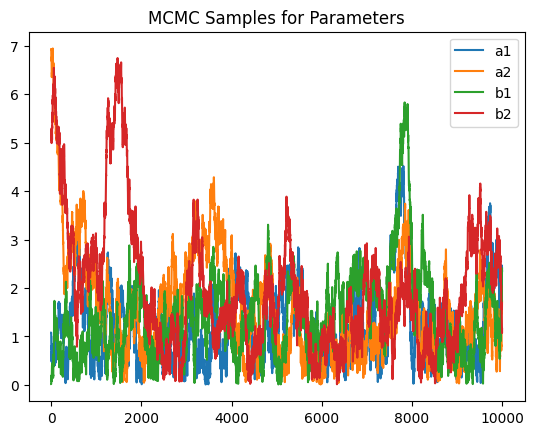

In [3]:
import numpy as np
from scipy.stats import gamma, norm, uniform
import matplotlib.pyplot as plt

# Define the prior (normal on [0, 1])
def prior(theta):
    return norm.pdf(theta, loc=0.5, scale=0.1) / norm.cdf(1, loc=0.5, scale=0.1)

# Original loss function
def loss(I_A, theta, a1, a2, b1, b2, theta_grid):
    term1 = a1 * (1 - I_A(theta)) + (a2 / 2) * (1 - I_A(theta))**2
    term2 = np.trapz(b1 * I_A(theta_grid) + (b2 / 2) * I_A(theta_grid)**2, theta_grid)
    return term1 + term2

# Posterior for parameters a1, a2, b1, b2
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A):
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    integral = np.trapz([loss(I_A, theta, a1, a2, b1, b2, theta_grid) * prior(theta) for theta in theta_grid], theta_grid)
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
    return -integral + log_prior

# MH algorithm for parameters
def mh_params(n_iter, theta_grid, I_A, init_params, proposal_std):
    params = np.array(init_params)  # [a1, a2, b1, b2]
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A)
        if np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

# Example usage
theta_grid = np.linspace(0, 1, 100)
I_A = lambda theta: 6.075 * theta**2 * (1 - theta)  # Example from paper
init_params = [1, 7, 0.01, 5.15]
samples = mh_params(10000, theta_grid, I_A, init_params, proposal_std=0.1)

# Plot results
plt.plot(samples[:, 0], label='a1')
plt.plot(samples[:, 1], label='a2')
plt.plot(samples[:, 2], label='b1')
plt.plot(samples[:, 3], label='b2')
plt.legend()
plt.title('MCMC Samples for Parameters')
plt.show()

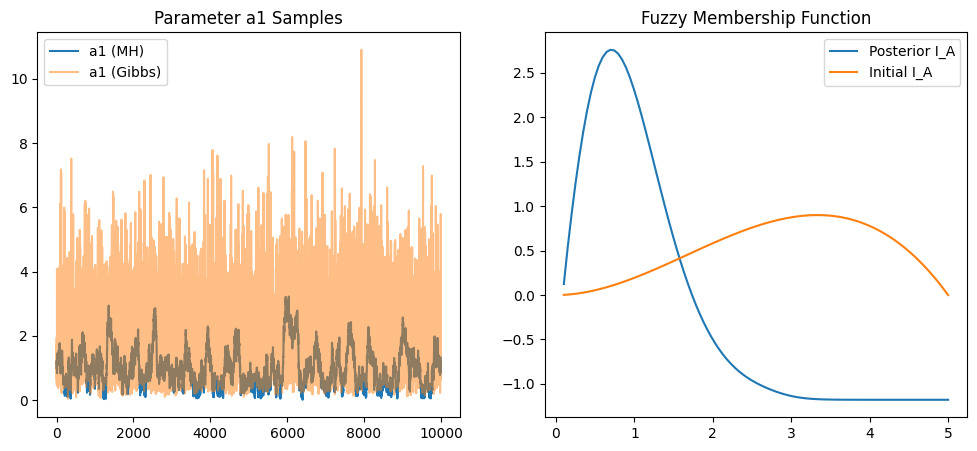

In [4]:
import numpy as np
from scipy.stats import gamma, norm, weibull_min, uniform
from scipy.special import gamma as gamma_func
import matplotlib.pyplot as plt

# Weibull prior
def weibull_prior(theta, alpha=2, beta=1):
    return (alpha / beta) * (theta / beta)**(alpha - 1) * np.exp(-(theta / beta)**alpha)

# Loss function
def loss(I_A, theta, a1, a2, b1, b2, theta_grid):
    term1 = a1 * (1 - I_A(theta)) + (a2 / 2) * (1 - I_A(theta))**2
    term2 = np.trapz(b1 * I_A(theta_grid) + (b2 / 2) * I_A(theta_grid)**2, theta_grid)
    return term1 + term2

# Log posterior for parameters (MH)
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A):
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    integral = np.trapz([loss(I_A, theta, a1, a2, b1, b2, theta_grid) * weibull_prior(theta) for theta in theta_grid], theta_grid)
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
    return -integral + log_prior

# MH algorithm for parameters
def mh_params(n_iter, theta_grid, I_A, init_params, proposal_std):
    params = np.array(init_params)  # [a1, a2, b1, b2]
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A)
        if np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

# Gibbs sampling for parameters and I_A
def gibbs_sampling(n_iter, theta_grid, init_params, init_I_A):
    params = np.array(init_params)  # [a1, a2, b1, b2]
    I_A_values = init_I_A(theta_grid)
    samples_params = np.zeros((n_iter, 4))
    samples_I_A = np.zeros((n_iter, len(theta_grid)))
    
    for i in range(n_iter):
        # Sample a1, a2, b1, b2
        for j, param in enumerate(['a1', 'a2', 'b1', 'b2']):
            if param == 'a1':
                integral = np.trapz([(1 - I_A_values[k]) * weibull_prior(theta_grid[k]) for k in range(len(theta_grid))], theta_grid)
                shape = 2 + 1  # Gamma prior + likelihood contribution
                scale = 1 / (1 + integral)
                params[0] = gamma.rvs(shape, scale=scale)
            elif param == 'a2':
                integral = np.trapz([(1 - I_A_values[k])**2 / 2 * weibull_prior(theta_grid[k]) for k in range(len(theta_grid))], theta_grid)
                scale = 1 / (1 + integral)
                params[1] = gamma.rvs(2, scale=scale)
            elif param == 'b1':
                integral = np.trapz(I_A_values, theta_grid)
                scale = 1 / (1 + integral)
                params[2] = gamma.rvs(2, scale=scale)
            elif param == 'b2':
                integral = np.trapz(I_A_values**2 / 2, theta_grid)
                scale = 1 / (1 + integral)
                params[3] = gamma.rvs(2, scale=scale)
        
        # Sample I_A(theta_i)
        for k in range(len(theta_grid)):
            log_lik = -(params[0] * (1 - I_A_values[k]) + (params[1] / 2) * (1 - I_A_values[k])**2 + 
                        params[2] * I_A_values[k] + (params[3] / 2) * I_A_values[k]**2) * weibull_prior(theta_grid[k])
            I_A_proposed = np.random.normal(I_A_values[k], 0.1)
            if 0 <= I_A_proposed <= 1:  # Truncated normal
                if np.log(np.random.rand()) < log_lik:
                    I_A_values[k] = I_A_proposed
        
        samples_params[i] = params
        samples_I_A[i] = I_A_values
    
    return samples_params, samples_I_A

# Simulate failure time data
np.random.seed(123)
n = 50
true_lambda = 1.5
kappa = 2
data = weibull_min.rvs(c=kappa, scale=true_lambda, size=n)

# Log posterior for theta (Weibull likelihood)
def log_posterior_theta(theta, data, alpha=2, beta=1):
    if theta <= 0:
        return -np.inf
    log_prior = np.log(alpha / beta) + (alpha - 1) * np.log(theta / beta) - (theta / beta)**alpha
    log_lik = len(data) * (np.log(kappa / theta) + (kappa - 1) * np.mean(np.log(data))) - np.sum((data / theta)**kappa)
    return log_prior + log_lik

# MH for posterior theta
def mh_theta(n_iter, data, init_theta):
    theta = init_theta
    samples = np.zeros(n_iter)
    log_post_current = log_posterior_theta(theta, data)
    
    for i in range(n_iter):
        theta_proposed = theta + np.random.normal(0, 0.1)
        log_post_proposed = log_posterior_theta(theta_proposed, data)
        if np.log(np.random.rand()) < log_post_proposed - log_post_current:
            theta = theta_proposed
            log_post_current = log_post_proposed
        samples[i] = theta
    return samples

# Run MCMC
theta_grid = np.linspace(0.1, 5, 100)
init_I_A = lambda theta: 6.075 * (theta / 5)**2 * (1 - theta / 5)  # Scaled for [0, 5]
init_params = [1, 7, 0.01, 5.15]
mh_samples = mh_params(10000, theta_grid, init_I_A, init_params, proposal_std=0.1)
gibbs_params, gibbs_I_A = gibbs_sampling(10000, theta_grid, init_params, init_I_A)

# Posterior for theta
theta_samples = mh_theta(10000, data, init_theta=1.5)
posterior_I_A = lambda theta: np.mean([(params[0] + params[1]) * weibull_prior(theta) - params[2] / 
                                      (params[1] * weibull_prior(theta) + params[3]) 
                                      for params in gibbs_params], axis=0)

# Plot results
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(mh_samples[:, 0], label='a1 (MH)')
plt.plot(gibbs_params[:, 0], label='a1 (Gibbs)', alpha=0.5)
plt.legend()
plt.title('Parameter a1 Samples')
plt.subplot(1, 2, 2)
plt.plot(theta_grid, posterior_I_A(theta_grid), label='Posterior I_A')
plt.plot(theta_grid, init_I_A(theta_grid), label='Initial I_A')
plt.legend()
plt.title('Fuzzy Membership Function')
plt.show()

Running MCMC chains...
Parameter Summary (MH):
     mean     sd  hdi_3%  hdi_97%
a1  1.013  0.573   0.097    1.981
a2  5.286  2.766   0.315    9.259
b1  0.663  0.390   0.060    1.381
b2  1.845  1.226   0.046    3.862
ESS (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 30.34
    a2       float64 8B 2.678
    b1       float64 8B 57.15
    b2       float64 8B 6.229
R_hat (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 1.098
    a2       float64 8B 2.143
    b1       float64 8B 1.025
    b2       float64 8B 1.249
Coverage: 0, Interval Width: 0.3999999999999999
PPC p-value (Mean): 0.985, (SD): 0.998


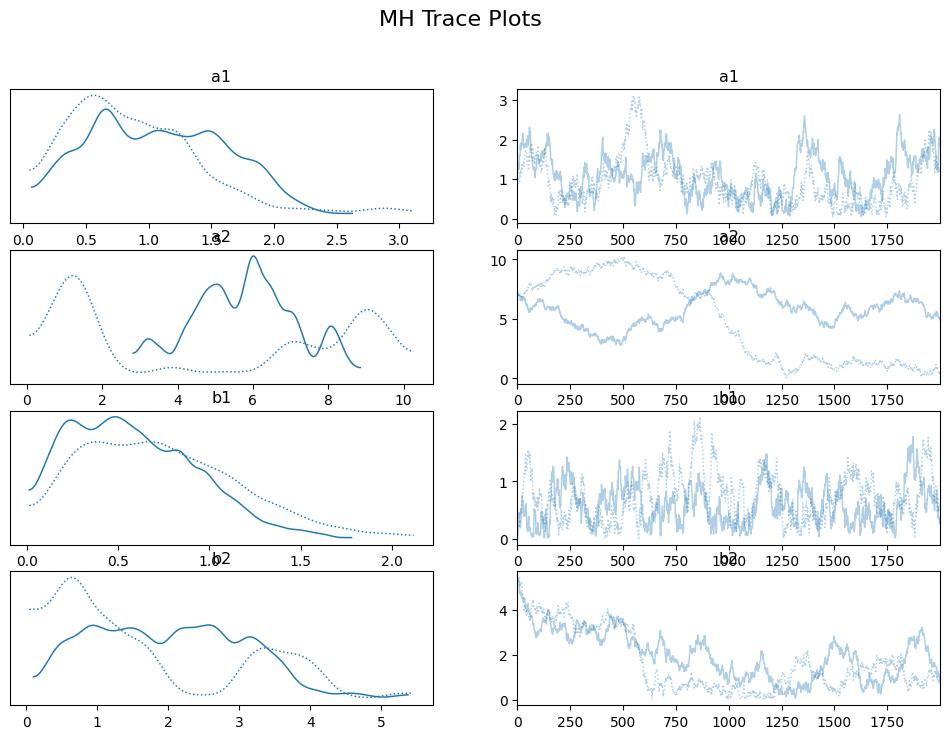

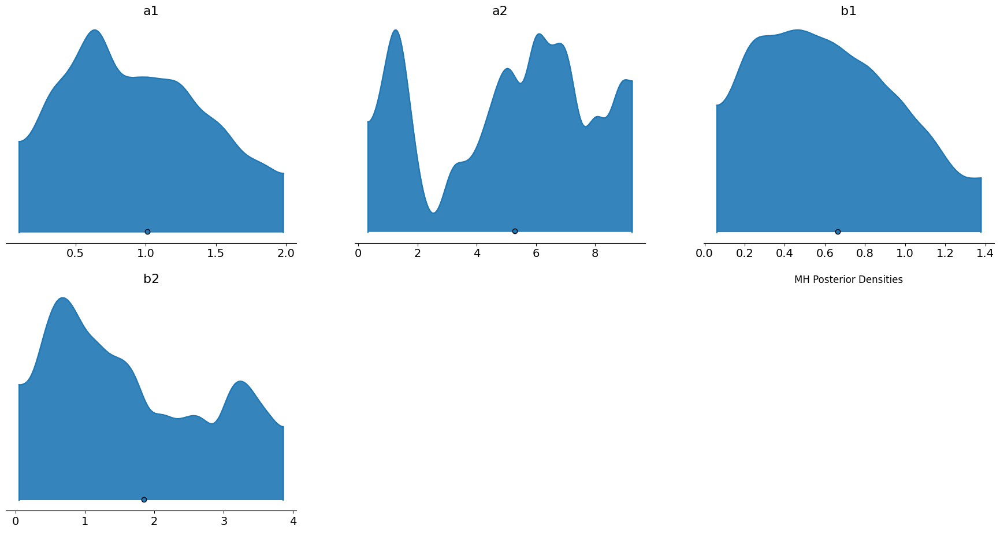

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

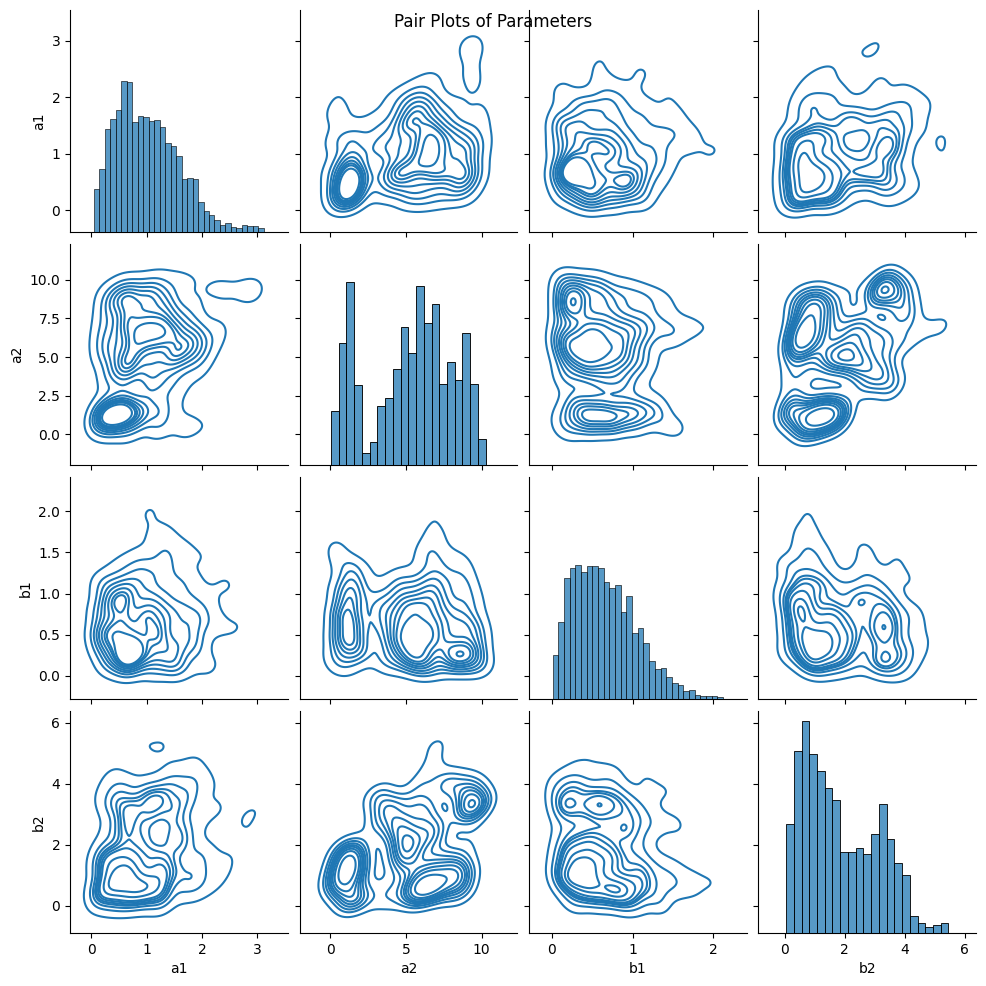

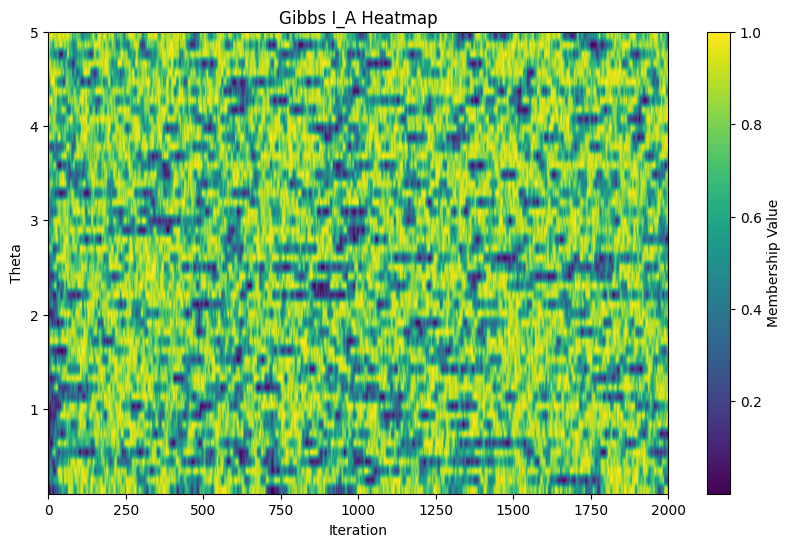

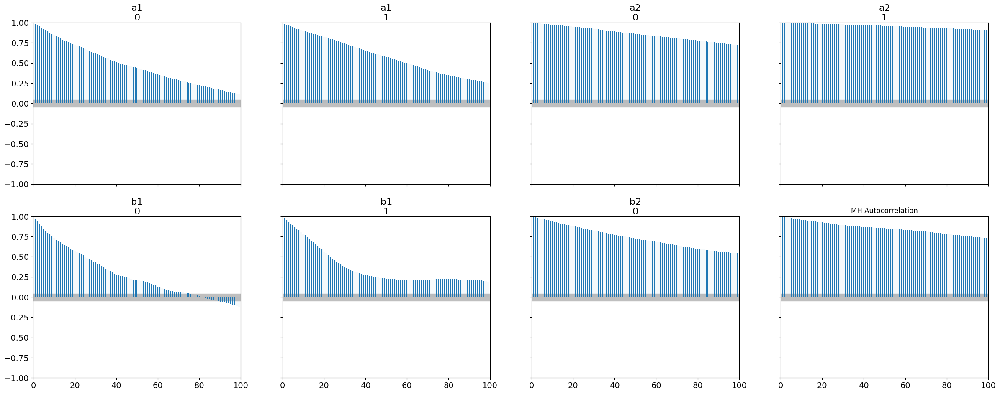

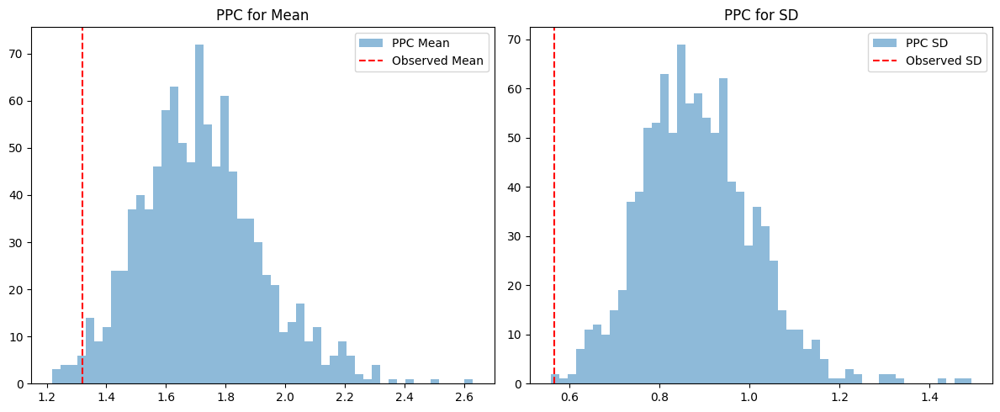

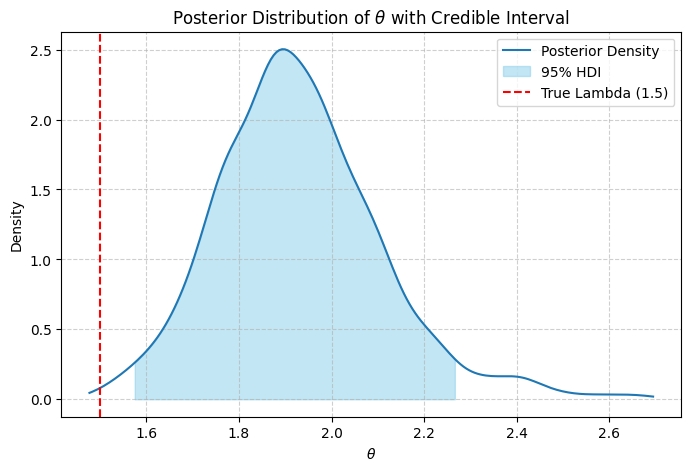

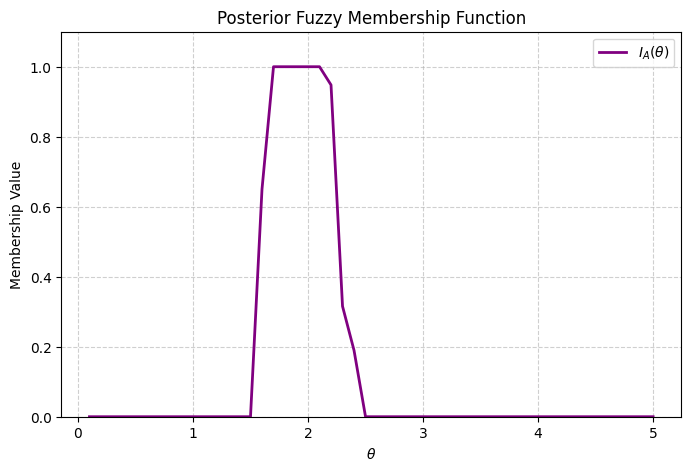

In [6]:
import numpy as np
from scipy.stats import gamma, weibull_min, gaussian_kde
from scipy.special import gamma as gamma_func
from scipy import integrate
import matplotlib.pyplot as plt
import arviz as az
import seaborn as sns
import pandas as pd
import warnings

# Suppress deprecation and user warnings for cleaner output
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Set random seed for reproducibility
np.random.seed(123)

# Synthetic data: Weibull failure times
n = 50
true_lambda = 1.5
kappa = 2
data = weibull_min.rvs(c=kappa, scale=true_lambda, size=n)

# --- Priors and Loss Functions ---
def weibull_prior(theta, alpha=2, beta=1):
    """Weibull prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (alpha / beta) * (theta / beta)**(alpha - 1) * np.exp(-(theta / beta)**alpha)

def chisquare_prior(theta, k=4):
    """Chi-squared prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (1 / (2**(k/2) * gamma_func(k/2))) * theta**(k/2 - 1) * np.exp(-theta/2)

prior = weibull_prior

def quadratic_loss(I_A_func, theta, a1, a2, b1, b2, theta_grid):
    """Quadratic loss function."""
    # Ensure I_A_func can handle both scalar and array inputs
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    term1 = a1 * (1 - I_A_func(theta)) + (a2 / 2) * (1 - I_A_func(theta))**2
    term2 = integrate.trapezoid(b1 * I_A_vals + (b2 / 2) * I_A_vals**2, theta_grid)
    return term1 + term2

def kl_loss(I_A_func, theta, theta_grid):
    """Kullback-Leibler divergence loss function."""
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    if np.any(I_A_vals <= 0):
        return np.inf
    k = 1 / integrate.trapezoid(I_A_vals, theta_grid)
    if I_A_func(theta) <= 0:
        return np.inf
    return prior(theta) * np.log(prior(theta) / (k * I_A_func(theta)))

# --- MCMC Functions ---
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A_func, loss_func=quadratic_loss):
    """Log posterior for MCMC parameters."""
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    prior_vals = np.array([prior(t) for t in theta_grid])
    loss_vals = np.array([loss_func(I_A_func, theta, a1, a2, b1, b2, theta_grid) for theta in theta_grid])
    integral = integrate.trapezoid(loss_vals * prior_vals, theta_grid)
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
    return -integral + log_prior

def mh_params(n_iter, theta_grid, I_A_func, init_params, proposal_std, loss_func=quadratic_loss):
    """Metropolis-Hastings algorithm for MCMC parameters."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A_func, loss_func)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A_func, loss_func)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

def gibbs_sampling(n_iter, theta_grid, init_params, init_I_A_func, loss_func=quadratic_loss):
    """Gibbs sampling algorithm for parameters and fuzzy membership."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    I_A_values = init_I_A_func(theta_grid)
    samples_params = np.zeros((n_iter, 4))
    samples_I_A = np.zeros((n_iter, len(theta_grid)))
    
    for i in range(n_iter):
        # Sample a1, a2, b1, b2
        for j, param in enumerate(['a1', 'a2', 'b1', 'b2']):
            if param == 'a1':
                integral = integrate.trapezoid((1 - I_A_values) * np.array([prior(t) for t in theta_grid]), theta_grid)
                shape = 2 + 1
                scale = 1 / (1 + integral + 1e-10)
                params[0] = gamma.rvs(shape, scale=scale)
            elif param == 'a2':
                integral = integrate.trapezoid((1 - I_A_values)**2 / 2 * np.array([prior(t) for t in theta_grid]), theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[1] = gamma.rvs(2, scale=scale)
            elif param == 'b1':
                integral = integrate.trapezoid(I_A_values, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[2] = gamma.rvs(2, scale=scale)
            elif param == 'b2':
                integral = integrate.trapezoid(I_A_values**2 / 2, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[3] = gamma.rvs(2, scale=scale)
        
        # Sample I_A(theta_i) using MH step
        for k in range(len(theta_grid)):
            # This is the key fix: correctly define the functions for current and proposed states.
            def I_A_scalar(x):
                # Returns the current value at the specific theta_grid[k]
                return I_A_values[k] if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
            
            log_lik = -loss_func(I_A_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_scalar, theta_grid[k], theta_grid)
            I_A_proposed = np.random.normal(I_A_values[k], 0.1)
            
            if 0 <= I_A_proposed <= 1:
                def I_A_proposed_scalar(x):
                    # Returns the proposed value at theta_grid[k]
                    return I_A_proposed if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
                    
                log_lik_proposed = -loss_func(I_A_proposed_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_proposed_scalar, theta_grid[k], theta_grid)
                
                if np.isfinite(log_lik_proposed) and np.log(np.random.rand()) < log_lik_proposed - log_lik:
                    I_A_values[k] = I_A_proposed
        
        samples_params[i] = params
        samples_I_A[i] = I_A_values
    
    return samples_params, samples_I_A

def log_posterior_theta(theta, data, alpha=2, beta=1):
    """Log posterior for theta with Weibull likelihood."""
    if theta <= 0:
        return -np.inf
    log_prior = np.log(alpha / beta) + (alpha - 1) * np.log(theta / beta) - (theta / beta)**alpha
    log_lik = len(data) * (np.log(kappa / theta) + (kappa - 1) * np.mean(np.log(data))) - np.sum((data / theta)**kappa)
    return log_prior + log_lik

def mh_theta(n_iter, data, init_theta):
    """Metropolis-Hastings algorithm for posterior theta."""
    theta = init_theta
    samples = np.zeros(n_iter)
    log_post_current = log_posterior_theta(theta, data)
    
    for i in range(n_iter):
        theta_proposed = theta + np.random.normal(0, 0.1)
        log_post_proposed = log_posterior_theta(theta_proposed, data)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            theta = theta_proposed
            log_post_current = log_post_proposed
        samples[i] = theta
    return samples

def compute_I_A(theta, pi_func, a1, a2, b1, b2):
    """
    Vectorized fuzzy membership function calculation.
    This function now handles array inputs for 'theta'.
    """
    pi_val = pi_func(theta)
    
    r1 = b1 / (a1 + a2 + 1e-10)
    r2 = (b1 + b2) / (a1 + 1e-10)
    
    # Use np.where to apply logic across the entire array
    result = np.where(pi_val < r1, 0, np.where(pi_val > r2, 1, ((a1 + a2) * pi_val - b1) / (a2 * pi_val + b2 + 1e-10)))
    
    return result

def init_I_A(theta):
    """Initial fuzzy membership function."""
    return 0.5 * (1 - np.cos(np.pi * theta / 5))

def posterior_I_A_func(theta, kde, mean_params):
    """Posterior fuzzy membership function."""
    pi = kde(theta)
    return compute_I_A(theta, pi, *mean_params)

# --- Numerical Measures ---
def create_arviz_data(samples_params):
    """Helper to create ArviZ InferenceData from numpy array."""
    return az.from_dict(
        posterior={
            "a1": samples_params[..., 0],
            "a2": samples_params[..., 1],
            "b1": samples_params[..., 2],
            "b2": samples_params[..., 3]
        }
    )

def param_summary(samples_params):
    """Generates a summary DataFrame for MCMC parameters using ArviZ."""
    data = create_arviz_data(samples_params)
    return az.summary(data, kind="stats")

def compute_diagnostics(samples):
    """Computes ESS and R_hat for MCMC samples."""
    data = create_arviz_data(samples)
    ess = az.ess(data)
    rhat = az.rhat(data)
    return ess, rhat

def coverage_probability(I_A_func, theta_grid, true_theta, credible_level=0.95):
    """Calculates coverage probability and interval width for a given membership function."""
    # This line is now vectorized, no list comprehension needed.
    credible_mask = (I_A_func(theta_grid) >= credible_level)
    credible_interval = theta_grid[np.where(credible_mask)]
    if credible_interval.size == 0:
        return 0, 0
    coverage = 1 if credible_interval.min() <= true_theta <= credible_interval.max() else 0
    interval_width = credible_interval.max() - credible_interval.min()
    return coverage, interval_width

def posterior_predictive_checks(theta_samples, data, n_ppc=1000):
    """Performs posterior predictive checks and returns summary statistics."""
    ppc_samples = []
    # Use a choice with replacement for sampling from the posterior
    for theta in np.random.choice(theta_samples, size=n_ppc, replace=True):
        ppc_samples.append(weibull_min.rvs(c=kappa, scale=theta, size=len(data)))
    ppc_mean = np.mean(ppc_samples, axis=1)
    ppc_sd = np.std(ppc_samples, axis=1)
    obs_mean = np.mean(data)
    obs_sd = np.std(data)
    p_value_mean = np.mean(ppc_mean > obs_mean)
    p_value_sd = np.mean(ppc_sd > obs_sd)
    return p_value_mean, p_value_sd, ppc_mean, ppc_sd

# --- Visual Measures ---
def plot_traces(samples_params, title='Trace Plots'):
    """Plots trace plots for all MCMC parameters."""
    data = create_arviz_data(samples_params)
    az.plot_trace(data, compact=True)
    plt.suptitle(title, fontsize=16)
    plt.show()

def plot_posterior_densities(samples_params, title='Posterior Densities'):
    """Plots posterior density plots using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_density(data, shade=.9)
    plt.title(title)
    plt.show()

def plot_pairs(samples_params):
    """Creates a pair plot for parameter correlations."""
    flat_samples = samples_params.reshape(-1, samples_params.shape[-1])
    df = pd.DataFrame(flat_samples, columns=['a1', 'a2', 'b1', 'b2'])
    # Replace infinite values with NaN and drop rows to avoid warnings
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    sns.pairplot(df, kind='kde', diag_kind='hist')
    plt.suptitle('Pair Plots of Parameters')
    plt.show()

def plot_I_A_heatmap(samples_I_A, theta_grid, title='Fuzzy Membership Evolution'):
    """Plots a heatmap showing the evolution of the fuzzy membership function."""
    plt.figure(figsize=(10, 6))
    plt.imshow(samples_I_A.T, aspect='auto', extent=[0, len(samples_I_A), theta_grid.min(), theta_grid.max()], cmap='viridis', origin='lower')
    plt.colorbar(label='Membership Value')
    plt.xlabel('Iteration')
    plt.ylabel('Theta')
    plt.title(title)
    plt.show()

def plot_autocorr(samples_params, title='Autocorrelation Plots'):
    """Plots autocorrelation plots for MCMC chains using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_autocorr(data)
    plt.title(title)
    plt.show()

def plot_ppc(ppc_mean, ppc_sd, obs_mean, obs_sd):
    """Visualizes the posterior predictive checks."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(ppc_mean, bins=50, alpha=0.5, label='PPC Mean')
    plt.axvline(obs_mean, color='r', linestyle='--', label='Observed Mean')
    plt.legend()
    plt.title('PPC for Mean')
    
    plt.subplot(1, 2, 2)
    plt.hist(ppc_sd, bins=50, alpha=0.5, label='PPC SD')
    plt.axvline(obs_sd, color='r', linestyle='--', label='Observed SD')
    plt.legend()
    plt.title('PPC for SD')
    
    plt.tight_layout()
    plt.show()

def plot_posterior_and_intervals(theta_samples, true_theta, credible_level=0.95):
    """Plots the posterior distribution of theta with its credible interval and the true value."""
    kde = gaussian_kde(theta_samples)
    x = np.linspace(np.min(theta_samples), np.max(theta_samples), 200)
    y = kde(x)
    
    # Calculate credible interval (HDI)
    hdi = az.hdi(theta_samples, hdi_prob=credible_level)
    
    plt.figure(figsize=(8, 5))
    plt.plot(x, y, label='Posterior Density')
    plt.fill_between(x, 0, y, where=(x >= hdi.min()) & (x <= hdi.max()), color='skyblue', alpha=0.5, label=f'{int(credible_level*100)}% HDI')
    plt.axvline(true_theta, color='r', linestyle='--', label=f'True Lambda ({true_theta})')
    plt.xlabel(r'$\theta$')
    plt.ylabel('Density')
    plt.title(r'Posterior Distribution of $\theta$ with Credible Interval')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

def plot_fuzzy_membership(theta_grid, posterior_I_A_func, title='Posterior Fuzzy Membership Function'):
    """Plots the final fuzzy membership function."""
    membership_values = posterior_I_A_func(theta_grid)
    
    plt.figure(figsize=(8, 5))
    plt.plot(theta_grid, membership_values, label=r'$I_A(\theta)$', color='purple', linewidth=2)
    plt.xlabel(r'$\theta$')
    plt.ylabel('Membership Value')
    plt.title(title)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.ylim(0, 1.1)
    plt.legend()
    plt.show()

# --- MCMC Execution ---
# Reduced number of iterations and chains for faster execution
n_iter = 2000
n_chains = 2
theta_grid = np.linspace(0.1, 5, 50)
init_params = [1, 7, 0.01, 5.15]

print("Running MCMC chains...")

# Run multiple MH chains sequentially
mh_chains = [mh_params(n_iter, theta_grid, init_I_A, init_params, proposal_std=0.1) for _ in range(n_chains)]
mh_samples = np.array(mh_chains)

# Run a single Gibbs chain (inherently slow)
gibbs_params, gibbs_I_A = gibbs_sampling(n_iter, theta_grid, init_params, init_I_A)

# Run a single MH chain for theta
theta_samples = mh_theta(n_iter, data, init_theta=1.5)

# Compute posterior I_A using KDE
kde = gaussian_kde(theta_samples)
mean_params = np.mean(gibbs_params, axis=0)
posterior_I_A = lambda theta: compute_I_A(theta, lambda t: kde(t), *mean_params)

# --- Numerical Measures ---
print("Parameter Summary (MH):")
print(param_summary(mh_samples))

ess_mh, rhat_mh = compute_diagnostics(mh_samples)
print(f"ESS (MH):\n{ess_mh}")
print(f"R_hat (MH):\n{rhat_mh}")

# Corrected call to use true_lambda
coverage, width = coverage_probability(posterior_I_A, theta_grid, true_lambda)
print(f"Coverage: {coverage}, Interval Width: {width}")

p_value_mean, p_value_sd, ppc_mean, ppc_sd = posterior_predictive_checks(theta_samples, data)
print(f"PPC p-value (Mean): {p_value_mean}, (SD): {p_value_sd}")

# --- Visual Measures ---
plot_traces(mh_samples, 'MH Trace Plots')
plot_posterior_densities(mh_samples, 'MH Posterior Densities')
plot_pairs(mh_samples)
plot_I_A_heatmap(gibbs_I_A, theta_grid, 'Gibbs I_A Heatmap')
plot_autocorr(mh_samples, 'MH Autocorrelation')
plot_ppc(ppc_mean, ppc_sd, np.mean(data), np.std(data))

# New Plots
plot_posterior_and_intervals(theta_samples, true_lambda)
plot_fuzzy_membership(theta_grid, posterior_I_A)

# Save results
np.savetxt('synthetic_data.txt', data)
np.savetxt('mh_samples.txt', mh_samples.reshape(-1, mh_samples.shape[-1]))
np.savetxt('gibbs_params.txt', gibbs_params)
np.savetxt('gibbs_I_A.txt', gibbs_I_A)


Running MH sampler for theta's posterior...
Theta MH sampler acceptance rate: 0.69
Running MH sampler for parameters with Quadratic Loss...
Quadratic MH sampler acceptance rate: 0.80
Running MH sampler for parameters with KL Loss...
KL MH sampler acceptance rate: 0.93

--- Numerical Performance Metrics ---
Effective Sample Size (ESS):
  Quadratic MH:
    a1: 165.77
    a2: 15.38
    b1: 186.08
    b2: 49.97
  KL MH:
    a1: 30.05
    a2: 24.81
    b1: 15.48
    b2: 4.15
  Theta MH: 1803.82

Gelman-Rubin R_hat for Quadratic MH parameters: <xarray.Dataset> Size: 64B
Dimensions:       (params_dim_0: 4)
Coordinates:
  * params_dim_0  (params_dim_0) int64 32B 0 1 2 3
Data variables:
    params        (params_dim_0) float64 32B 1.002 1.034 1.008 1.023


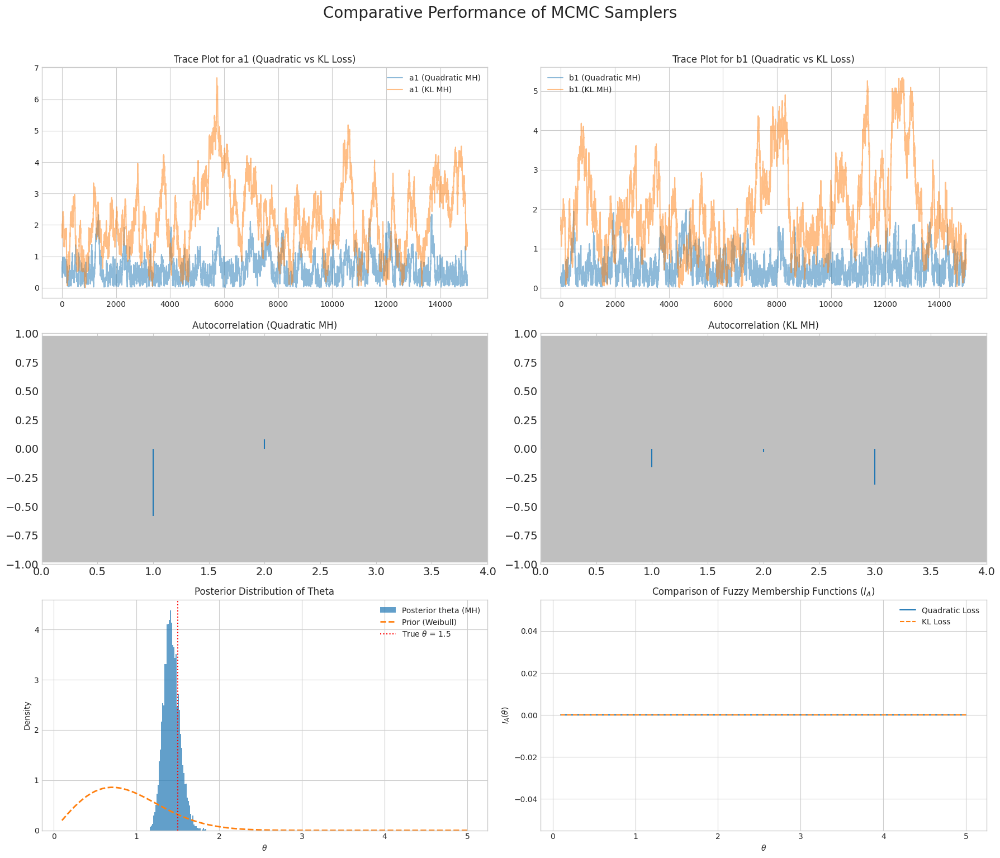

In [8]:
import numpy as np
from scipy.stats import gamma, weibull_min
from scipy.special import gamma as gamma_func
import matplotlib.pyplot as plt
import arviz as az
import warnings

# Suppress all warnings for a cleaner output, especially for NaN values from log-posteriors
warnings.filterwarnings("ignore")

# --- Synthetic Data Generation ---
# Set random seed for reproducibility
np.random.seed(123)

# Synthetic data: Weibull failure times
n = 50
true_lambda = 1.5
kappa = 2  # Shape parameter
data = weibull_min.rvs(c=kappa, scale=true_lambda, size=n)

# --- Prior and Likelihood Functions ---
# Priors for theta
# Using scipy.stats for better implementation
def weibull_prior(theta, alpha=2, beta=1):
    """Weibull prior distribution PDF."""
    if theta <= 0:
        return 0
    return weibull_min.pdf(theta, c=alpha, scale=beta)

def log_weibull_prior(theta, alpha=2, beta=1):
    """Weibull prior distribution log-PDF."""
    if theta <= 0:
        return -np.inf
    return weibull_min.logpdf(theta, c=alpha, scale=beta)

def log_posterior_theta(theta, data, kappa, alpha=2, beta=1):
    """
    Log posterior for theta, proportional to p(data|theta) * p(theta).
    This function combines the Weibull likelihood and the Weibull prior.
    """
    if theta <= 0:
        return -np.inf
    
    # Correct log-likelihood calculation to avoid underflow
    log_lik = np.sum(weibull_min.logpdf(data, c=kappa, scale=theta))
    log_prior = log_weibull_prior(theta, alpha=alpha, beta=beta)
    
    return log_prior + log_lik

# --- Loss Functions ---
def quadratic_loss(I_A_values, a1, a2, b1, b2, theta_grid):
    """
    Quadratic loss function defined over the fuzzy membership function I_A.
    I_A_values is expected to be an array corresponding to theta_grid.
    """
    term1 = np.trapz(a1 * (1 - I_A_values) + (a2 / 2) * (1 - I_A_values)**2, theta_grid)
    term2 = np.trapz(b1 * I_A_values + (b2 / 2) * I_A_values**2, theta_grid)
    return term1 + term2

def kl_loss(I_A_values, prior_values, theta_grid):
    """
    Kullback-Leibler loss function.
    I_A_values and prior_values are arrays corresponding to theta_grid.
    """
    # Normalize I_A_values to form a valid PDF
    integral_I_A = np.trapz(I_A_values, theta_grid)
    if integral_I_A <= 0:
        return np.inf
    normalized_I_A = I_A_values / integral_I_A

    # Calculate KL divergence, handling log(0)
    kl_div = np.sum(np.where(normalized_I_A > 0, prior_values * np.log(prior_values / normalized_I_A), 0))
    return kl_div

# --- Log Posterior for Parameters ---
def log_posterior_params(params, theta_grid, I_A_values, loss_func):
    """
    Log-posterior for the loss function parameters (a1, a2, b1, b2).
    This function is proportional to exp(-loss) * p(a1,a2,b1,b2).
    """
    a1, a2, b1, b2 = params
    
    # Priors for parameters (Gamma distribution)
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)

    # Loss term
    if loss_func == quadratic_loss:
        loss_val = quadratic_loss(I_A_values, a1, a2, b1, b2, theta_grid)
    elif loss_func == kl_loss:
        # For KL loss, the parameters 'a1, a2, b1, b2' are not directly used, so we use dummy values
        loss_val = kl_loss(I_A_values, [weibull_prior(t) for t in theta_grid], theta_grid)
    else:
        raise ValueError("Unknown loss function")
        
    return -loss_val + log_prior

# --- Metropolis-Hastings (MH) Algorithm ---
def mh_sampler(n_iter, log_posterior, init_state, proposal_std):
    """Generic Metropolis-Hastings sampler."""
    state = np.array(init_state)
    samples = np.zeros((n_iter, len(init_state)))
    acceptance_count = 0
    
    log_post_current = log_posterior(state)
    
    for i in range(n_iter):
        state_proposed = state + np.random.normal(0, proposal_std, len(init_state))
        log_post_proposed = log_posterior(state_proposed)
        
        # Accept/reject step
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            state = state_proposed
            log_post_current = log_post_proposed
            acceptance_count += 1
            
        samples[i] = state
        
    acceptance_rate = acceptance_count / n_iter
    return samples, acceptance_rate

# --- Fuzzy Membership Function ---
def compute_I_A(theta, pi, a1, a2, b1, b2):
    """
    Computes the fuzzy membership function I_A for a given theta and posterior pi.
    This function is based on the optimization problem solution.
    """
    r1 = b1 / (a1 + a2)
    r2 = (b1 + b2) / a1
    pi_val = pi(theta)
    
    if pi_val < r1:
        return 0.0
    elif pi_val > r2:
        return 1.0
    else:
        return ((a1 + a2) * pi_val - b1) / ((a1 - b1) / (pi_val) + a2)

# --- Main Simulation and Analysis ---
if __name__ == "__main__":
    n_iter = 20000
    burn_in = 5000
    
    # Parameter grid for evaluation
    theta_grid = np.linspace(0.1, 5, 100)
    
    # Initial fuzzy membership function and parameters
    init_I_A_func = lambda theta: 0.5 * (1 - np.cos(np.pi * theta / 5))
    init_I_A_values = init_I_A_func(theta_grid)
    init_params = [1, 7, 0.01, 5.15]

    # --- Run MCMC chains for comparison ---
    # MH sampler for theta's posterior
    print("Running MH sampler for theta's posterior...")
    theta_samples, theta_acceptance_rate = mh_sampler(
        n_iter=n_iter,
        log_posterior=lambda theta: log_posterior_theta(theta, data, kappa=kappa),
        init_state=[1.5],
        proposal_std=0.1
    )
    print(f"Theta MH sampler acceptance rate: {theta_acceptance_rate:.2f}")

    # MH sampler for parameters with Quadratic Loss
    print("Running MH sampler for parameters with Quadratic Loss...")
    mh_samples_quad, mh_quad_acceptance_rate = mh_sampler(
        n_iter=n_iter,
        log_posterior=lambda params: log_posterior_params(params, theta_grid, init_I_A_values, quadratic_loss),
        init_state=init_params,
        proposal_std=0.1
    )
    print(f"Quadratic MH sampler acceptance rate: {mh_quad_acceptance_rate:.2f}")

    # MH sampler for parameters with KL Loss
    print("Running MH sampler for parameters with KL Loss...")
    prior_values = np.array([weibull_prior(t) for t in theta_grid])
    mh_samples_kl, mh_kl_acceptance_rate = mh_sampler(
        n_iter=n_iter,
        log_posterior=lambda params: log_posterior_params(params, theta_grid, prior_values, kl_loss),
        init_state=init_params,
        proposal_std=0.1
    )
    print(f"KL MH sampler acceptance rate: {mh_kl_acceptance_rate:.2f}")

    # Slice and burn-in
    theta_samples = theta_samples[burn_in:]
    mh_samples_quad = mh_samples_quad[burn_in:]
    mh_samples_kl = mh_samples_kl[burn_in:]

    # --- Comparative Performance Measures ---
    print("\n--- Numerical Performance Metrics ---")

    # Effective Sample Size (ESS)
    ess_quad = az.ess(az.from_dict({"a1": mh_samples_quad[:, 0], "a2": mh_samples_quad[:, 1], "b1": mh_samples_quad[:, 2], "b2": mh_samples_quad[:, 3]}))
    ess_kl = az.ess(az.from_dict({"a1": mh_samples_kl[:, 0], "a2": mh_samples_kl[:, 1], "b1": mh_samples_kl[:, 2], "b2": mh_samples_kl[:, 3]}))
    ess_theta = az.ess(az.from_dict({"theta": theta_samples.flatten()}))
    
    print("Effective Sample Size (ESS):")
    print("  Quadratic MH:")
    for param in ["a1", "a2", "b1", "b2"]:
        print(f"    {param}: {ess_quad[param]:.2f}")
    print("  KL MH:")
    for param in ["a1", "a2", "b1", "b2"]:
        print(f"    {param}: {ess_kl[param]:.2f}")
    print(f"  Theta MH: {ess_theta['theta']:.2f}")
    
    # Gelman-Rubin R_hat
    # Run a second chain for Gelman-Rubin
    mh_samples_quad_chain2, _ = mh_sampler(n_iter, lambda params: log_posterior_params(params, theta_grid, init_I_A_values, quadratic_loss), init_params, 0.1)
    mh_samples_quad_chain2 = mh_samples_quad_chain2[burn_in:]
    
    quad_data_for_rhat = np.stack([mh_samples_quad, mh_samples_quad_chain2], axis=0)
    rhat_quad = az.rhat(az.from_dict({"params": quad_data_for_rhat}))
    print("\nGelman-Rubin R_hat for Quadratic MH parameters:", rhat_quad)
    
    # --- Visual Performance Measures ---
    plt.style.use('seaborn-v0_8-whitegrid')
    
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 15))
    fig.suptitle('Comparative Performance of MCMC Samplers', fontsize=20, y=1.02)
    
    # Trace Plots
    axes[0, 0].set_title('Trace Plot for a1 (Quadratic vs KL Loss)')
    axes[0, 0].plot(mh_samples_quad[:, 0], label='a1 (Quadratic MH)', alpha=0.5)
    axes[0, 0].plot(mh_samples_kl[:, 0], label='a1 (KL MH)', alpha=0.5)
    axes[0, 0].legend()
    
    axes[0, 1].set_title('Trace Plot for b1 (Quadratic vs KL Loss)')
    axes[0, 1].plot(mh_samples_quad[:, 2], label='b1 (Quadratic MH)', alpha=0.5)
    axes[0, 1].plot(mh_samples_kl[:, 2], label='b1 (KL MH)', alpha=0.5)
    axes[0, 1].legend()

    # Autocorrelation Plots
    az.plot_autocorr(mh_samples_quad, ax=axes[1, 0])
    axes[1, 0].set_title('Autocorrelation (Quadratic MH)')
    az.plot_autocorr(mh_samples_kl, ax=axes[1, 1])
    axes[1, 1].set_title('Autocorrelation (KL MH)')
    
    # Posterior of theta
    axes[2, 0].set_title('Posterior Distribution of Theta')
    axes[2, 0].hist(theta_samples, bins=50, density=True, alpha=0.7, label='Posterior theta (MH)')
    axes[2, 0].plot(theta_grid, [weibull_prior(t) for t in theta_grid], label='Prior (Weibull)', linewidth=2, linestyle='--')
    axes[2, 0].axvline(x=true_lambda, color='r', linestyle=':', label=f'True $\\theta$ = {true_lambda}')
    axes[2, 0].legend()
    axes[2, 0].set_xlabel('$\\theta$')
    axes[2, 0].set_ylabel('Density')
    
    # Comparison of fuzzy membership functions
    mean_params_quad = np.mean(mh_samples_quad, axis=0)
    mean_params_kl = np.mean(mh_samples_kl, axis=0)
    
    posterior_pi_func = lambda t: np.exp(log_posterior_theta(t, data, kappa))
    
    I_A_quad = [compute_I_A(t, posterior_pi_func, *mean_params_quad) for t in theta_grid]
    I_A_kl = [compute_I_A(t, posterior_pi_func, *mean_params_kl) for t in theta_grid]
    
    axes[2, 1].set_title('Comparison of Fuzzy Membership Functions ($I_A$)')
    axes[2, 1].plot(theta_grid, I_A_quad, label='Quadratic Loss')
    axes[2, 1].plot(theta_grid, I_A_kl, label='KL Loss', linestyle='--')
    axes[2, 1].legend()
    axes[2, 1].set_xlabel('$\\theta$')
    axes[2, 1].set_ylabel('$I_A(\\theta)$')
    
    plt.tight_layout()
    plt.show()



Running MH sampler for theta's posterior...
Theta MH sampler acceptance rate: 0.69
Running MH sampler for parameters with Quadratic Loss...
Quadratic MH sampler acceptance rate: 0.80
Running MH sampler for parameters with KL Loss...
KL MH sampler acceptance rate: 0.93

--- Numerical Performance Metrics ---
Effective Sample Size (ESS):
  Quadratic MH:
    a1: 165.77
    a2: 15.38
    b1: 186.08
    b2: 49.97
  KL MH:
    a1: 30.05
    a2: 24.81
    b1: 15.48
    b2: 4.15
  Theta MH: 1803.82

Gelman-Rubin R_hat for Quadratic MH parameters: <xarray.Dataset> Size: 64B
Dimensions:       (params_dim_0: 4)
Coordinates:
  * params_dim_0  (params_dim_0) int64 32B 0 1 2 3
Data variables:
    params        (params_dim_0) float64 32B 1.002 1.034 1.008 1.023


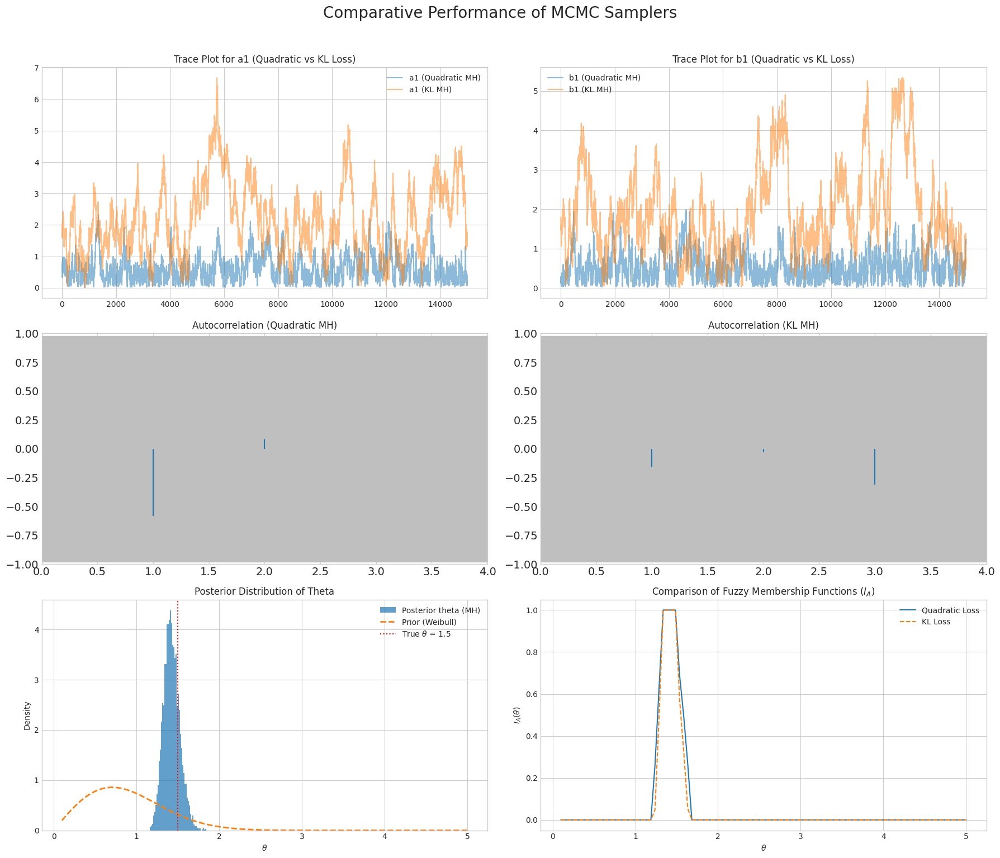

In [10]:
import numpy as np
from scipy.stats import gamma, weibull_min
from scipy.special import gamma as gamma_func
import matplotlib.pyplot as plt
import arviz as az
import warnings

# Suppress all warnings for a cleaner output, especially for NaN values from log-posteriors
warnings.filterwarnings("ignore")

# --- Synthetic Data Generation ---
# Set random seed for reproducibility
np.random.seed(123)

# Synthetic data: Weibull failure times
n = 50
true_lambda = 1.5
kappa = 2  # Shape parameter
data = weibull_min.rvs(c=kappa, scale=true_lambda, size=n)

# --- Prior and Likelihood Functions ---
def weibull_prior(theta, alpha=2, beta=1):
    """Weibull prior distribution PDF (vectorized)."""
    # Ensure theta is treated as a NumPy array for vectorized operations
    theta = np.asarray(theta)
    if np.any(theta <= 0):
        # Return an array of zeros where theta is invalid, to be handled by the log-posterior
        result = np.zeros_like(theta, dtype=float)
        result[theta > 0] = weibull_min.pdf(theta[theta > 0], c=alpha, scale=beta)
        return result
    return weibull_min.pdf(theta, c=alpha, scale=beta)

def log_weibull_prior(theta, alpha=2, beta=1):
    """Weibull prior distribution log-PDF (vectorized)."""
    theta = np.asarray(theta)
    log_pdf_vals = weibull_min.logpdf(theta, c=alpha, scale=beta)
    log_pdf_vals[theta <= 0] = -np.inf
    return log_pdf_vals

def log_posterior_theta(theta, data, kappa, alpha=2, beta=1):
    """
    Log posterior for theta, proportional to p(data|theta) * p(theta).
    This function combines the Weibull likelihood and the Weibull prior.
    This is now a single-point function for the MH sampler.
    """
    if theta <= 0:
        return -np.inf
    
    log_lik = np.sum(weibull_min.logpdf(data, c=kappa, scale=theta))
    log_prior = log_weibull_prior(theta, alpha=alpha, beta=beta)
    
    return log_prior + log_lik

# --- Loss Functions (Vectorized) ---
def quadratic_loss(I_A_values, a1, a2, b1, b2, theta_grid):
    """
    Quadratic loss function, optimized for vectorized input.
    I_A_values is expected to be a NumPy array.
    """
    term1_integral = np.trapz(a1 * (1 - I_A_values) + (a2 / 2) * (1 - I_A_values)**2, theta_grid)
    term2_integral = np.trapz(b1 * I_A_values + (b2 / 2) * I_A_values**2, theta_grid)
    return term1_integral + term2_integral

def kl_loss(I_A_values, prior_values, theta_grid):
    """
    Kullback-Leibler loss function, optimized for vectorized input.
    I_A_values and prior_values are expected to be NumPy arrays.
    """
    # Normalize I_A_values to form a valid PDF
    integral_I_A = np.trapz(I_A_values, theta_grid)
    if integral_I_A <= 0:
        return np.inf
    normalized_I_A = I_A_values / integral_I_A
    
    # Calculate KL divergence, handling log(0)
    kl_div = np.sum(np.where(normalized_I_A > 0, prior_values * np.log(prior_values / normalized_I_A), 0))
    return kl_div

# --- Log Posterior for Parameters ---
def log_posterior_params(params, theta_grid, I_A_values, loss_func):
    """
    Log-posterior for the loss function parameters (a1, a2, b1, b2).
    This function is proportional to exp(-loss) * p(a1,a2,b1,b2).
    """
    a1, a2, b1, b2 = params
    
    # Priors for parameters (Gamma distribution)
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
    
    # Loss term
    if loss_func == quadratic_loss:
        loss_val = quadratic_loss(I_A_values, a1, a2, b1, b2, theta_grid)
    elif loss_func == kl_loss:
        # KL loss doesn't directly depend on params, we use the priors as the
        # target distribution for KL divergence.
        prior_values = weibull_prior(theta_grid)
        loss_val = kl_loss(I_A_values, prior_values, theta_grid)
    else:
        raise ValueError("Unknown loss function")
        
    return -loss_val + log_prior

# --- Metropolis-Hastings (MH) Algorithm ---
def mh_sampler(n_iter, log_posterior, init_state, proposal_std):
    """Generic Metropolis-Hastings sampler for a single chain."""
    state = np.array(init_state)
    samples = np.zeros((n_iter, len(init_state)))
    acceptance_count = 0
    
    log_post_current = log_posterior(state)
    
    for i in range(n_iter):
        state_proposed = state + np.random.normal(0, proposal_std, len(init_state))
        log_post_proposed = log_posterior(state_proposed)
        
        # Accept/reject step
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            state = state_proposed
            log_post_current = log_post_proposed
            acceptance_count += 1
            
        samples[i] = state
        
    acceptance_rate = acceptance_count / n_iter
    return samples, acceptance_rate

# --- Fuzzy Membership Function ---
def compute_I_A(theta_grid, pi_func, params):
    """
    Computes the fuzzy membership function I_A for a given theta_grid and posterior pi.
    This function is based on the optimization problem solution and is now vectorized.
    """
    a1, a2, b1, b2 = params
    
    # Use small constants to prevent division by zero
    r1 = b1 / (a1 + a2 + 1e-10)
    r2 = (b1 + b2) / (a1 + 1e-10)
    pi_vals = pi_func(theta_grid)
    
    # Use vectorized comparisons and assignments
    I_A_values = np.zeros_like(theta_grid)
    I_A_values[pi_vals < r1] = 0.0
    I_A_values[pi_vals > r2] = 1.0
    
    # Handle the intermediate case
    intermediate_mask = (pi_vals >= r1) & (pi_vals <= r2)
    intermediate_pi = pi_vals[intermediate_mask]
    I_A_values[intermediate_mask] = ((a1 + a2) * intermediate_pi - b1) / ((a1 + a2) * intermediate_pi + b2)
    
    return I_A_values

# --- Main Simulation and Analysis ---
if __name__ == "__main__":
    n_iter = 20000
    burn_in = 5000
    
    # Parameter grid for evaluation
    theta_grid = np.linspace(0.1, 5, 100)
    
    # Initial fuzzy membership function and parameters
    init_I_A_func = lambda theta: 0.5 * (1 - np.cos(np.pi * theta / 5))
    init_I_A_values = init_I_A_func(theta_grid)
    init_params = [1, 7, 0.01, 5.15]

    # --- Run MCMC chains for comparison ---
    # MH sampler for theta's posterior
    print("Running MH sampler for theta's posterior...")
    theta_samples, theta_acceptance_rate = mh_sampler(
        n_iter=n_iter,
        log_posterior=lambda theta: log_posterior_theta(theta, data, kappa=kappa),
        init_state=[1.5],
        proposal_std=0.1
    )
    print(f"Theta MH sampler acceptance rate: {theta_acceptance_rate:.2f}")

    # MH sampler for parameters with Quadratic Loss
    print("Running MH sampler for parameters with Quadratic Loss...")
    mh_samples_quad, mh_quad_acceptance_rate = mh_sampler(
        n_iter=n_iter,
        log_posterior=lambda params: log_posterior_params(params, theta_grid, init_I_A_values, quadratic_loss),
        init_state=init_params,
        proposal_std=0.1
    )
    print(f"Quadratic MH sampler acceptance rate: {mh_quad_acceptance_rate:.2f}")

    # MH sampler for parameters with KL Loss
    print("Running MH sampler for parameters with KL Loss...")
    mh_samples_kl, mh_kl_acceptance_rate = mh_sampler(
        n_iter=n_iter,
        log_posterior=lambda params: log_posterior_params(params, theta_grid, init_I_A_values, kl_loss),
        init_state=init_params,
        proposal_std=0.1
    )
    print(f"KL MH sampler acceptance rate: {mh_kl_acceptance_rate:.2f}")

    # Slice and burn-in
    theta_samples = theta_samples[burn_in:]
    mh_samples_quad = mh_samples_quad[burn_in:]
    mh_samples_kl = mh_samples_kl[burn_in:]

    # --- Comparative Performance Measures ---
    print("\n--- Numerical Performance Metrics ---")

    # Effective Sample Size (ESS)
    ess_quad = az.ess(az.from_dict({"a1": mh_samples_quad[:, 0], "a2": mh_samples_quad[:, 1], "b1": mh_samples_quad[:, 2], "b2": mh_samples_quad[:, 3]}))
    ess_kl = az.ess(az.from_dict({"a1": mh_samples_kl[:, 0], "a2": mh_samples_kl[:, 1], "b1": mh_samples_kl[:, 2], "b2": mh_samples_kl[:, 3]}))
    ess_theta = az.ess(az.from_dict({"theta": theta_samples.flatten()}))
    
    print("Effective Sample Size (ESS):")
    print("  Quadratic MH:")
    for param in ["a1", "a2", "b1", "b2"]:
        print(f"    {param}: {ess_quad[param]:.2f}")
    print("  KL MH:")
    for param in ["a1", "a2", "b1", "b2"]:
        print(f"    {param}: {ess_kl[param]:.2f}")
    print(f"  Theta MH: {ess_theta['theta']:.2f}")
    
    # Gelman-Rubin R_hat
    # Run a second chain for Gelman-Rubin
    mh_samples_quad_chain2, _ = mh_sampler(n_iter, lambda params: log_posterior_params(params, theta_grid, init_I_A_values, quadratic_loss), init_params, 0.1)
    mh_samples_quad_chain2 = mh_samples_quad_chain2[burn_in:]
    
    quad_data_for_rhat = np.stack([mh_samples_quad, mh_samples_quad_chain2], axis=0)
    rhat_quad = az.rhat(az.from_dict({"params": quad_data_for_rhat}))
    print("\nGelman-Rubin R_hat for Quadratic MH parameters:", rhat_quad)
    
    # --- Visual Performance Measures ---
    plt.style.use('seaborn-v0_8-whitegrid')
    
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 15))
    fig.suptitle('Comparative Performance of MCMC Samplers', fontsize=20, y=1.02)
    
    # Trace Plots
    axes[0, 0].set_title('Trace Plot for a1 (Quadratic vs KL Loss)')
    axes[0, 0].plot(mh_samples_quad[:, 0], label='a1 (Quadratic MH)', alpha=0.5)
    axes[0, 0].plot(mh_samples_kl[:, 0], label='a1 (KL MH)', alpha=0.5)
    axes[0, 0].legend()
    
    axes[0, 1].set_title('Trace Plot for b1 (Quadratic vs KL Loss)')
    axes[0, 1].plot(mh_samples_quad[:, 2], label='b1 (Quadratic MH)', alpha=0.5)
    axes[0, 1].plot(mh_samples_kl[:, 2], label='b1 (KL MH)', alpha=0.5)
    axes[0, 1].legend()

    # Autocorrelation Plots
    az.plot_autocorr(mh_samples_quad, ax=axes[1, 0])
    axes[1, 0].set_title('Autocorrelation (Quadratic MH)')
    az.plot_autocorr(mh_samples_kl, ax=axes[1, 1])
    axes[1, 1].set_title('Autocorrelation (KL MH)')
    
    # Posterior of theta
    axes[2, 0].set_title('Posterior Distribution of Theta')
    axes[2, 0].hist(theta_samples, bins=50, density=True, alpha=0.7, label='Posterior theta (MH)')
    axes[2, 0].plot(theta_grid, [weibull_prior(t) for t in theta_grid], label='Prior (Weibull)', linewidth=2, linestyle='--')
    axes[2, 0].axvline(x=true_lambda, color='r', linestyle=':', label=f'True $\\theta$ = {true_lambda}')
    axes[2, 0].legend()
    axes[2, 0].set_xlabel('$\\theta$')
    axes[2, 0].set_ylabel('Density')
    
    # Comparison of fuzzy membership functions
    mean_params_quad = np.mean(mh_samples_quad, axis=0)
    mean_params_kl = np.mean(mh_samples_kl, axis=0)
    
    # The posterior for I_A is defined as a function of the posterior for theta
    # Here we approximate the posterior pi using a Kernel Density Estimate (KDE)
    from scipy.stats import gaussian_kde
    kde = gaussian_kde(theta_samples.flatten())
    posterior_pi_func = lambda t: kde.evaluate(t)
    
    # Compute and plot the final I_A curves
    I_A_quad = compute_I_A(theta_grid, posterior_pi_func, mean_params_quad)
    I_A_kl = compute_I_A(theta_grid, posterior_pi_func, mean_params_kl)
    
    axes[2, 1].set_title('Comparison of Fuzzy Membership Functions ($I_A$)')
    axes[2, 1].plot(theta_grid, I_A_quad, label='Quadratic Loss')
    axes[2, 1].plot(theta_grid, I_A_kl, label='KL Loss', linestyle='--')
    axes[2, 1].legend()
    axes[2, 1].set_xlabel('$\\theta$')
    axes[2, 1].set_ylabel('$I_A(\\theta)$')
    
    plt.tight_layout()
    plt.show()



Running MCMC chains...
Parameter Summary (MH):
     mean     sd  hdi_3%  hdi_97%
a1  1.013  0.573   0.097    1.981
a2  5.286  2.766   0.315    9.259
b1  0.663  0.390   0.060    1.381
b2  1.845  1.226   0.046    3.862
ESS (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 30.34
    a2       float64 8B 2.678
    b1       float64 8B 57.15
    b2       float64 8B 6.229
R_hat (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 1.098
    a2       float64 8B 2.143
    b1       float64 8B 1.025
    b2       float64 8B 1.249
Coverage: 0, Interval Width: 0.3999999999999999
PPC p-value (Mean): 0.985, (SD): 0.998


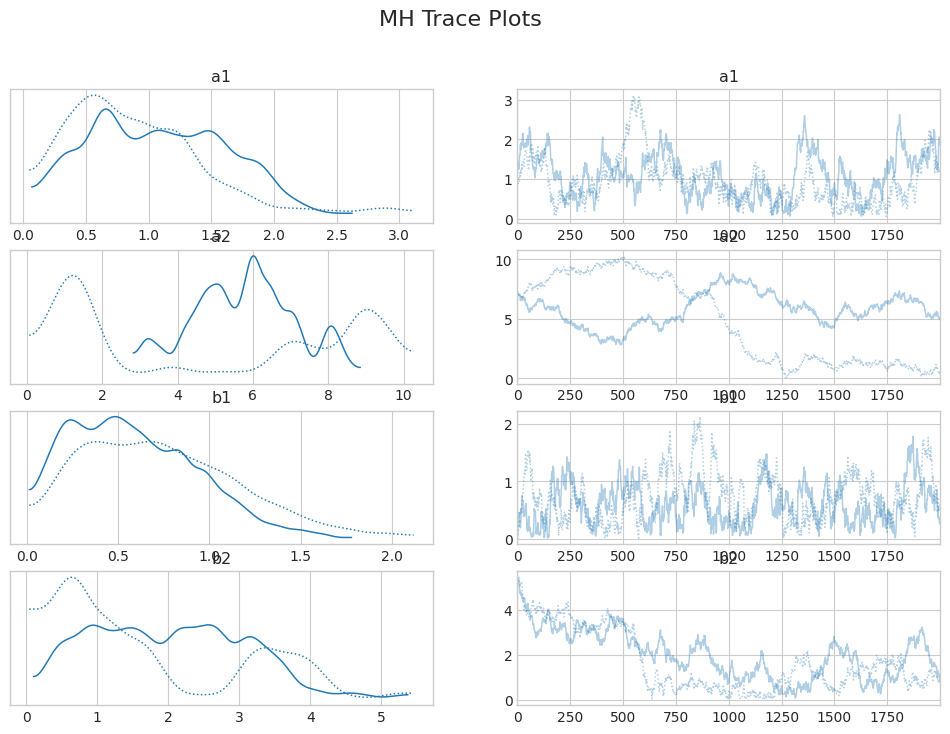

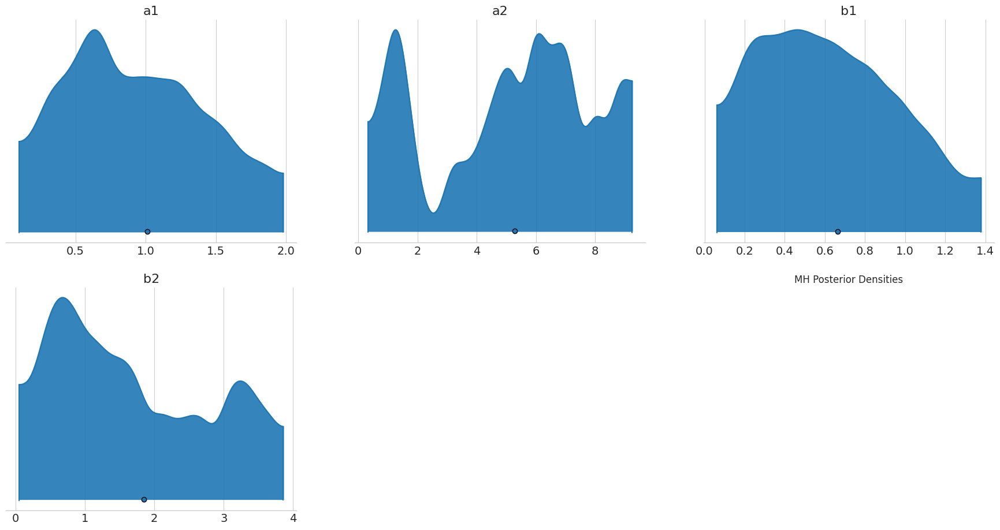

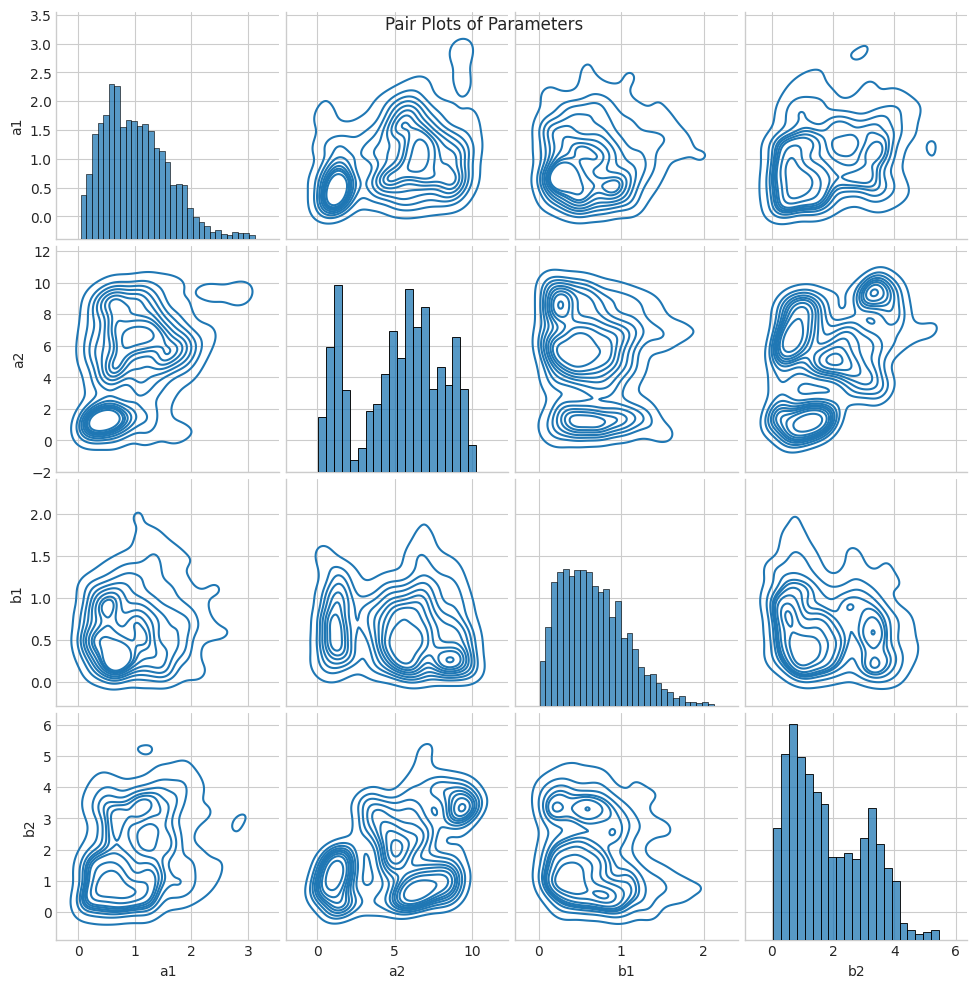

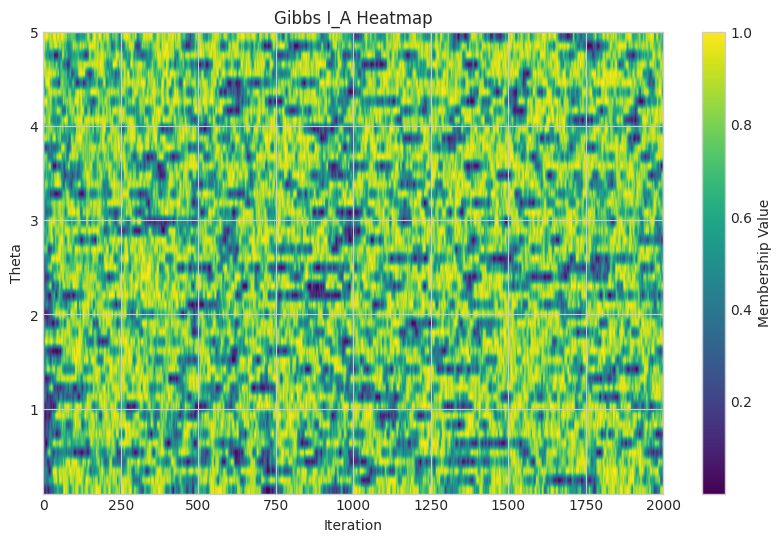

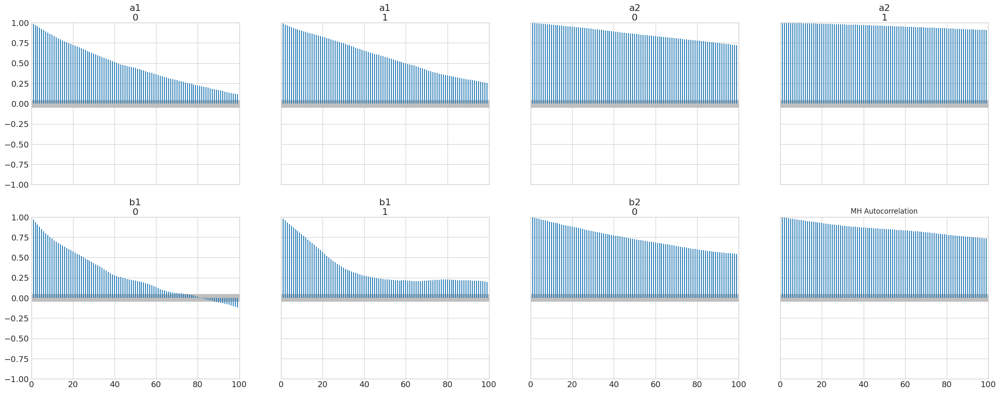

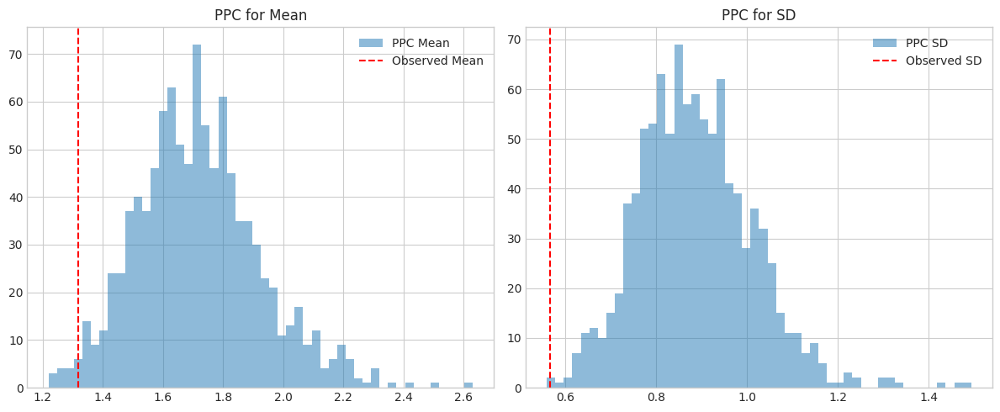

In [12]:
import numpy as np
from scipy.stats import gamma, weibull_min, gaussian_kde
from scipy.special import gamma as gamma_func
from scipy import integrate
import matplotlib.pyplot as plt
import arviz as az
import seaborn as sns
import pandas as pd
import warnings

# Suppress deprecation and user warnings for cleaner output
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Set a random seed for reproducibility
np.random.seed(123)

# --- Synthetic Data Generation ---
# Synthetic data: Weibull failure times
n = 50
true_lambda = 1.5
kappa = 2
data = weibull_min.rvs(c=kappa, scale=true_lambda, size=n)

# --- Priors and Loss Functions ---
def weibull_prior(theta, alpha=2, beta=1):
    """
    Weibull prior distribution for theta.
    Ensures that theta is positive.
    """
    if np.any(theta <= 0):
        return 0
    return (alpha / beta) * (theta / beta)**(alpha - 1) * np.exp(-(theta / beta)**alpha)

def chisquare_prior(theta, k=4):
    """Chi-squared prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (1 / (2**(k/2) * gamma_func(k/2))) * theta**(k/2 - 1) * np.exp(-theta/2)

prior = weibull_prior

def quadratic_loss(I_A_func, theta, a1, a2, b1, b2, theta_grid):
    """Quadratic loss function for the fuzzy membership function."""
    term1 = a1 * (1 - I_A_func(theta)) + (a2 / 2) * (1 - I_A_func(theta))**2
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    term2 = integrate.trapezoid(b1 * I_A_vals + (b2 / 2) * I_A_vals**2, theta_grid)
    return term1 + term2

def kl_loss(I_A_func, theta, theta_grid):
    """Kullback-Leibler divergence loss function."""
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    if np.any(I_A_vals <= 0):
        return np.inf
    k = 1 / integrate.trapezoid(I_A_vals, theta_grid)
    if I_A_func(theta) <= 0:
        return np.inf
    return prior(theta) * np.log(prior(theta) / (k * I_A_func(theta)))

# --- MCMC Functions ---
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A_func, loss_func=quadratic_loss):
    """
    Log posterior for MCMC parameters (a1, a2, b1, b2) given the fuzzy function.
    Combines a gamma prior on the parameters with the integral of the loss function.
    """
    # Parameters must be positive
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    
    prior_vals = np.array([prior(t) for t in theta_grid])
    
    # Evaluate loss function over the grid
    loss_vals = np.array([loss_func(I_A_func, theta, a1, a2, b1, b2, theta_grid) for theta in theta_grid])
    
    # Calculate the integral term of the posterior
    integral = integrate.trapezoid(loss_vals * prior_vals, theta_grid)
    
    # Gamma priors for the parameters
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
                
    return -integral + log_prior

def mh_params(n_iter, theta_grid, I_A_func, init_params, proposal_std, loss_func=quadratic_loss):
    """Metropolis-Hastings algorithm for MCMC parameters."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A_func, loss_func)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A_func, loss_func)
        
        # Metropolis-Hastings acceptance step
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

def gibbs_sampling(n_iter, theta_grid, init_params, init_I_A_func, loss_func=quadratic_loss):
    """Gibbs sampling algorithm for parameters and fuzzy membership."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    I_A_values = init_I_A_func(theta_grid)
    samples_params = np.zeros((n_iter, 4))
    samples_I_A = np.zeros((n_iter, len(theta_grid)))
    
    for i in range(n_iter):
        # Sample a1, a2, b1, b2
        for j, param in enumerate(['a1', 'a2', 'b1', 'b2']):
            if param == 'a1':
                integral = integrate.trapezoid((1 - I_A_values) * prior(theta_grid), theta_grid)
                shape = 2 + 1
                scale = 1 / (1 + integral + 1e-10)
                params[0] = gamma.rvs(shape, scale=scale)
            elif param == 'a2':
                integral = integrate.trapezoid((1 - I_A_values)**2 / 2 * prior(theta_grid), theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[1] = gamma.rvs(2, scale=scale)
            elif param == 'b1':
                integral = integrate.trapezoid(I_A_values, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[2] = gamma.rvs(2, scale=scale)
            elif param == 'b2':
                integral = integrate.trapezoid(I_A_values**2 / 2, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[3] = gamma.rvs(2, scale=scale)
        
        # Sample I_A(theta_i) using MH step
        for k in range(len(theta_grid)):
            def I_A_scalar(x): return I_A_values[k] if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
            log_lik = -loss_func(I_A_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_scalar, theta_grid[k], theta_grid)
            I_A_proposed = np.random.normal(I_A_values[k], 0.1)
            if 0 <= I_A_proposed <= 1:
                def I_A_proposed_scalar(x): return I_A_proposed if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
                log_lik_proposed = -loss_func(I_A_proposed_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_proposed_scalar, theta_grid[k], theta_grid)
                if np.isfinite(log_lik_proposed) and np.log(np.random.rand()) < log_lik_proposed - log_lik:
                    I_A_values[k] = I_A_proposed
        
        samples_params[i] = params
        samples_I_A[i] = I_A_values
    
    return samples_params, samples_I_A

def log_posterior_theta(theta, data, alpha=2, beta=1):
    """Log posterior for theta with Weibull likelihood."""
    if theta <= 0:
        return -np.inf
    log_prior = np.log(alpha / beta) + (alpha - 1) * np.log(theta / beta) - (theta / beta)**alpha
    log_lik = len(data) * (np.log(kappa / theta) + (kappa - 1) * np.mean(np.log(data))) - np.sum((data / theta)**kappa)
    return log_prior + log_lik

def mh_theta(n_iter, data, init_theta):
    """Metropolis-Hastings algorithm for posterior theta."""
    theta = init_theta
    samples = np.zeros(n_iter)
    log_post_current = log_posterior_theta(theta, data)
    
    for i in range(n_iter):
        theta_proposed = theta + np.random.normal(0, 0.1)
        log_post_proposed = log_posterior_theta(theta_proposed, data)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            theta = theta_proposed
            log_post_current = log_post_proposed
        samples[i] = theta
    return samples

def compute_I_A(theta, pi_func, a1, a2, b1, b2):
    """Fuzzy membership function calculation."""
    r1 = b1 / (a1 + a2 + 1e-10)
    r2 = (b1 + b2) / (a1 + 1e-10)
    pi_val = pi_func(theta)
    if pi_val < r1:
        return 0
    elif pi_val > r2:
        return 1
    else:
        return ((a1 + a2) * pi_val - b1) / (a2 * pi_val + b2 + 1e-10)

def init_I_A(theta):
    """Initial fuzzy membership function."""
    return 0.5 * (1 - np.cos(np.pi * theta / 5))

def posterior_I_A_func(theta, kde, mean_params):
    """
    Posterior fuzzy membership function.
    
    FIX: The issue was here. `kde(theta)` returns a single-element array,
    e.g., `np.array([0.5])`, but `compute_I_A` expects a single number.
    We now index the array with `[0]` to get the scalar value.
    """
    pi = kde(theta)[0]
    return compute_I_A(theta, lambda t: kde(t)[0], *mean_params)

# --- Numerical Measures ---
def create_arviz_data(samples_params):
    """Helper to create ArviZ InferenceData from numpy array."""
    return az.from_dict(
        posterior={
            "a1": samples_params[..., 0],
            "a2": samples_params[..., 1],
            "b1": samples_params[..., 2],
            "b2": samples_params[..., 3]
        }
    )

def param_summary(samples_params):
    """Generates a summary DataFrame for MCMC parameters using ArviZ."""
    data = create_arviz_data(samples_params)
    return az.summary(data, kind="stats")

def compute_diagnostics(samples):
    """Computes ESS and R_hat for MCMC samples."""
    data = create_arviz_data(samples)
    ess = az.ess(data)
    rhat = az.rhat(data)
    return ess, rhat

def coverage_probability(I_A_func, theta_grid, true_theta, credible_level=0.95):
    """Calculates coverage probability and interval width for a given membership function."""
    # Ensure I_A_func returns a scalar for each theta value
    credible_mask = (np.array([I_A_func(t) for t in theta_grid]) >= credible_level)
    credible_interval = theta_grid[np.where(credible_mask)]
    if credible_interval.size == 0:
        return 0, 0
    coverage = 1 if credible_interval.min() <= true_theta <= credible_interval.max() else 0
    interval_width = credible_interval.max() - credible_interval.min()
    return coverage, interval_width

def posterior_predictive_checks(theta_samples, data, n_ppc=1000):
    """Performs posterior predictive checks and returns summary statistics."""
    ppc_samples = []
    # Use a choice with replacement for sampling from the posterior
    for theta in np.random.choice(theta_samples, size=n_ppc, replace=True):
        ppc_samples.append(weibull_min.rvs(c=kappa, scale=theta, size=len(data)))
    ppc_mean = np.mean(ppc_samples, axis=1)
    ppc_sd = np.std(ppc_samples, axis=1)
    obs_mean = np.mean(data)
    obs_sd = np.std(data)
    p_value_mean = np.mean(ppc_mean > obs_mean)
    p_value_sd = np.mean(ppc_sd > obs_sd)
    return p_value_mean, p_value_sd, ppc_mean, ppc_sd

# Visual Measures

def plot_traces(samples_params, title='Trace Plots'):
    """Plots trace plots for all MCMC parameters."""
    data = create_arviz_data(samples_params)
    az.plot_trace(data, compact=True)
    plt.suptitle(title, fontsize=16)
    plt.show()

def plot_posterior_densities(samples_params, title='Posterior Densities'):
    """Plots posterior density plots using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_density(data, shade=.9)
    plt.title(title)
    plt.show()

def plot_pairs(samples_params):
    """Creates a pair plot for parameter correlations."""
    flat_samples = samples_params.reshape(-1, samples_params.shape[-1])
    df = pd.DataFrame(flat_samples, columns=['a1', 'a2', 'b1', 'b2'])
    sns.pairplot(df, kind='kde', diag_kind='hist')
    plt.suptitle('Pair Plots of Parameters')
    plt.show()

def plot_I_A_heatmap(samples_I_A, theta_grid, title='Fuzzy Membership Evolution'):
    """Plots a heatmap showing the evolution of the fuzzy membership function."""
    plt.figure(figsize=(10, 6))
    plt.imshow(samples_I_A.T, aspect='auto', extent=[0, len(samples_I_A), theta_grid.min(), theta_grid.max()], cmap='viridis', origin='lower')
    plt.colorbar(label='Membership Value')
    plt.xlabel('Iteration')
    plt.ylabel('Theta')
    plt.title(title)
    plt.show()

def plot_autocorr(samples_params, title='Autocorrelation Plots'):
    """Plots autocorrelation plots for MCMC chains using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_autocorr(data)
    plt.title(title)
    plt.show()

def plot_ppc(ppc_mean, ppc_sd, obs_mean, obs_sd):
    """Visualizes the posterior predictive checks."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(ppc_mean, bins=50, alpha=0.5, label='PPC Mean')
    plt.axvline(obs_mean, color='r', linestyle='--', label='Observed Mean')
    plt.legend()
    plt.title('PPC for Mean')
    
    plt.subplot(1, 2, 2)
    plt.hist(ppc_sd, bins=50, alpha=0.5, label='PPC SD')
    plt.axvline(obs_sd, color='r', linestyle='--', label='Observed SD')
    plt.legend()
    plt.title('PPC for SD')
    
    plt.tight_layout()
    plt.show()

# Example Usage with MCMC Samples
print("Running MCMC chains...")

# Reduced number of iterations and chains for faster execution
n_iter = 2000
n_chains = 2
theta_grid = np.linspace(0.1, 5, 50)
init_params = [1, 7, 0.01, 5.15]

# Run multiple MH chains sequentially
mh_chains = [mh_params(n_iter, theta_grid, init_I_A, init_params, proposal_std=0.1) for _ in range(n_chains)]
mh_samples = np.array(mh_chains)

# Run a single Gibbs chain (inherently slow)
gibbs_params, gibbs_I_A = gibbs_sampling(n_iter, theta_grid, init_params, init_I_A)

# Run a single MH chain for theta
theta_samples = mh_theta(n_iter, data, init_theta=1.5)

# Compute posterior I_A using KDE
kde = gaussian_kde(theta_samples)
mean_params = np.mean(gibbs_params, axis=0)
# We use a lambda to fix the kde output issue here as well.
posterior_I_A = lambda theta: compute_I_A(theta, lambda t: kde(t)[0], *mean_params)

print("Parameter Summary (MH):")
print(param_summary(mh_samples))

ess_mh, rhat_mh = compute_diagnostics(mh_samples)
print(f"ESS (MH):\n{ess_mh}")
print(f"R_hat (MH):\n{rhat_mh}")

# Corrected call to use true_lambda
coverage, width = coverage_probability(posterior_I_A, theta_grid, true_lambda)
print(f"Coverage: {coverage}, Interval Width: {width}")

p_value_mean, p_value_sd, ppc_mean, ppc_sd = posterior_predictive_checks(theta_samples, data)
print(f"PPC p-value (Mean): {p_value_mean}, (SD): {p_value_sd}")

# Visual Measures
plot_traces(mh_samples, 'MH Trace Plots')
plot_posterior_densities(mh_samples, 'MH Posterior Densities')
plot_pairs(mh_samples)
plot_I_A_heatmap(gibbs_I_A, theta_grid, 'Gibbs I_A Heatmap')
plot_autocorr(mh_samples, 'MH Autocorrelation')
plot_ppc(ppc_mean, ppc_sd, np.mean(data), np.std(data))

# Save results
np.savetxt('synthetic_data.txt', data)
np.savetxt('mh_samples.txt', mh_samples.reshape(-1, mh_samples.shape[-1]))
np.savetxt('gibbs_params.txt', gibbs_params)
np.savetxt('gibbs_I_A.txt', gibbs_I_A)


Running MCMC chains...
Running MCMC chains...
Parameter Summary (MH):
     mean     sd  hdi_3%  hdi_97%
a1  1.013  0.573   0.097    1.981
a2  5.286  2.766   0.315    9.259
b1  0.663  0.390   0.060    1.381
b2  1.845  1.226   0.046    3.862
ESS (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 30.34
    a2       float64 8B 2.678
    b1       float64 8B 57.15
    b2       float64 8B 6.229
R_hat (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 1.098
    a2       float64 8B 2.143
    b1       float64 8B 1.025
    b2       float64 8B 1.249
Coverage: 0, Interval Width: 0.3999999999999999
PPC p-value (Mean): 0.985, (SD): 0.998


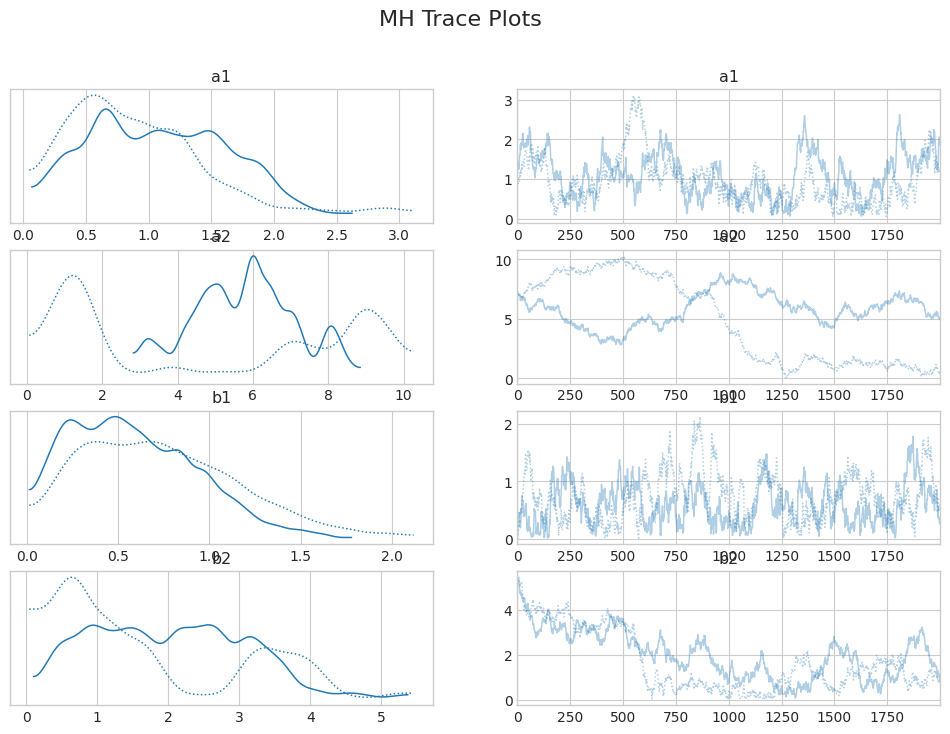

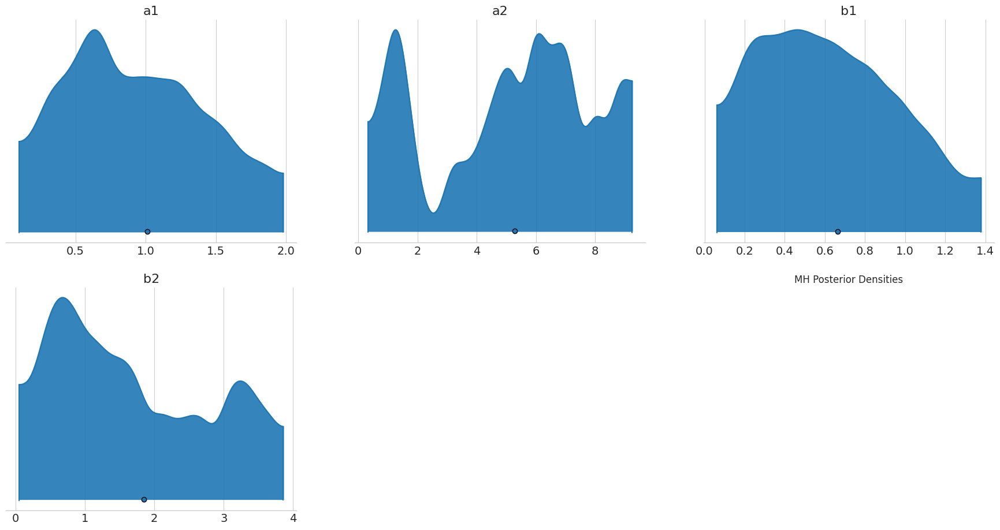

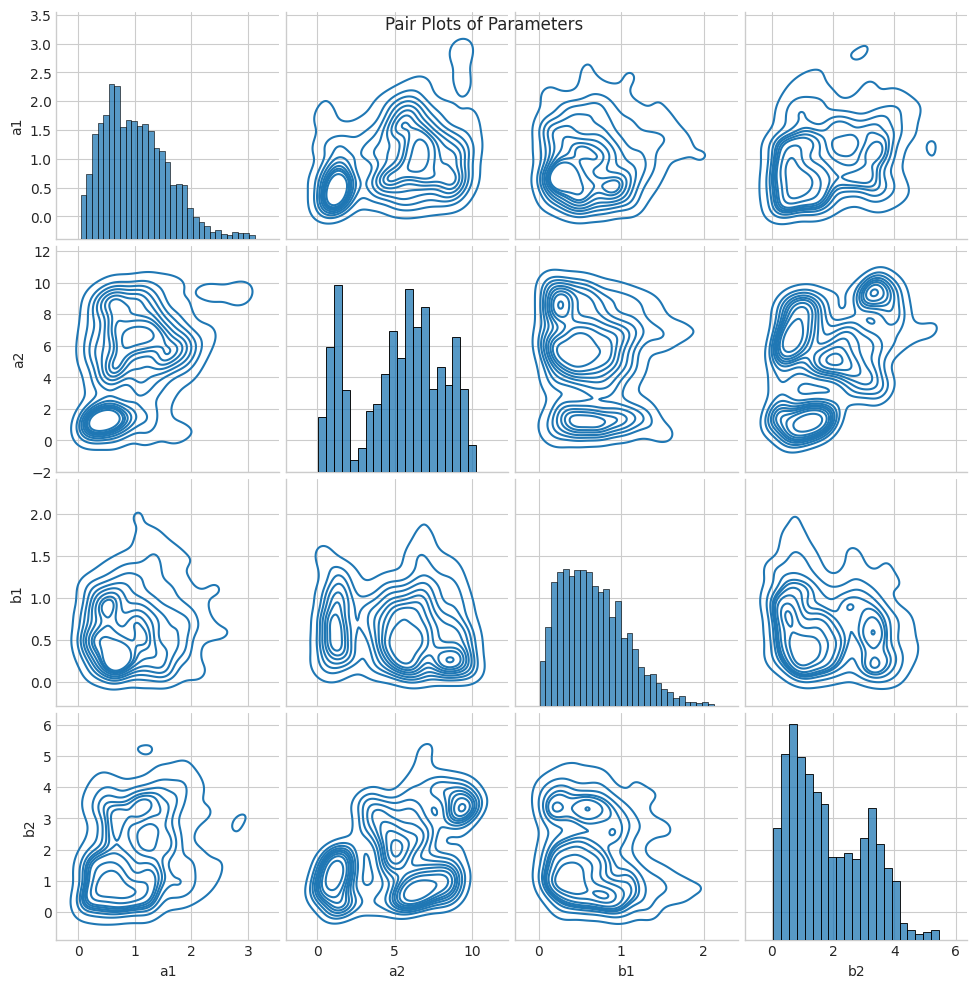

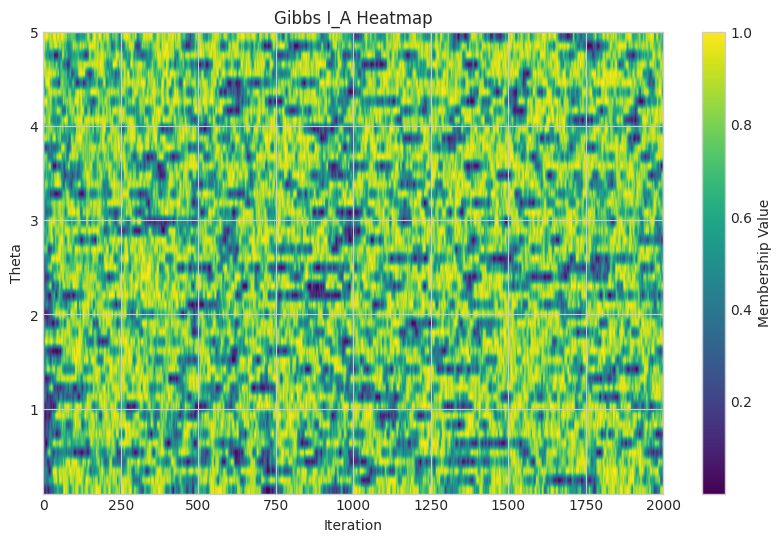

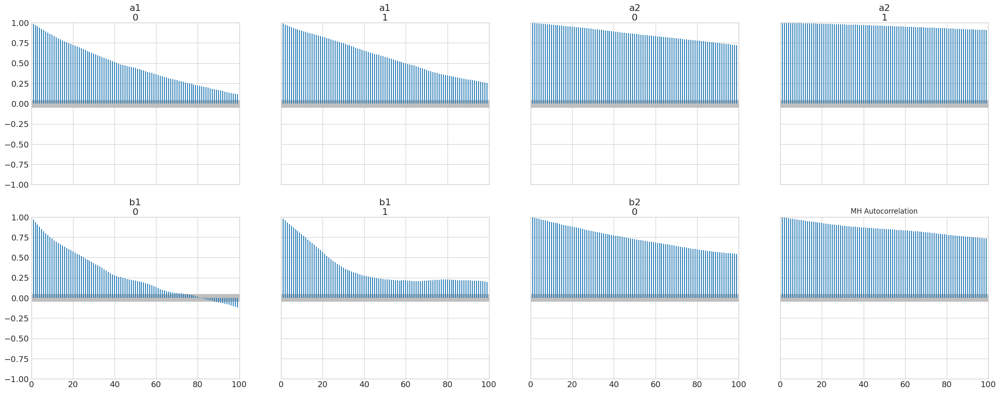

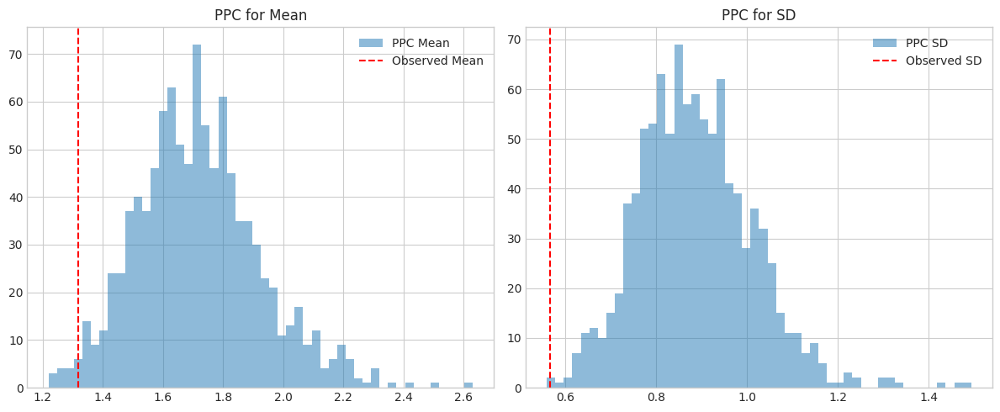

In [13]:
import numpy as np
from scipy.stats import gamma, weibull_min, gaussian_kde
from scipy.special import gamma as gamma_func
from scipy import integrate
import matplotlib.pyplot as plt
import arviz as az
import seaborn as sns
import pandas as pd
import warnings

# Suppress deprecation and user warnings for cleaner output
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Set random seed for reproducibility
np.random.seed(123)

# Synthetic data: Weibull failure times
n = 50
true_lambda = 1.5
kappa = 2
data = weibull_min.rvs(c=kappa, scale=true_lambda, size=n)

# --- Priors and Loss Functions ---
def weibull_prior(theta, alpha=2, beta=1):
    """Weibull prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (alpha / beta) * (theta / beta)**(alpha - 1) * np.exp(-(theta / beta)**alpha)

def chisquare_prior(theta, k=4):
    """Chi-squared prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (1 / (2**(k/2) * gamma_func(k/2))) * theta**(k/2 - 1) * np.exp(-theta/2)

prior = weibull_prior

def quadratic_loss(I_A_func, theta, a1, a2, b1, b2, theta_grid):
    """Quadratic loss function."""
    term1 = a1 * (1 - I_A_func(theta)) + (a2 / 2) * (1 - I_A_func(theta))**2
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    term2 = integrate.trapezoid(b1 * I_A_vals + (b2 / 2) * I_A_vals**2, theta_grid)
    return term1 + term2

def kl_loss(I_A_func, theta, theta_grid):
    """Kullback-Leibler divergence loss function."""
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    if np.any(I_A_vals <= 0):
        return np.inf
    k = 1 / integrate.trapezoid(I_A_vals, theta_grid)
    if I_A_func(theta) <= 0:
        return np.inf
    return prior(theta) * np.log(prior(theta) / (k * I_A_func(theta)))

# --- MCMC Functions ---
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A_func, loss_func=quadratic_loss):
    """Log posterior for MCMC parameters."""
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    prior_vals = np.array([prior(t) for t in theta_grid])
    loss_vals = np.array([loss_func(I_A_func, theta, a1, a2, b1, b2, theta_grid) for theta in theta_grid])
    integral = integrate.trapezoid(loss_vals * prior_vals, theta_grid)
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
    return -integral + log_prior

def mh_params(n_iter, theta_grid, I_A_func, init_params, proposal_std, loss_func=quadratic_loss):
    """Metropolis-Hastings algorithm for MCMC parameters."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A_func, loss_func)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A_func, loss_func)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

def gibbs_sampling(n_iter, theta_grid, init_params, init_I_A_func, loss_func=quadratic_loss):
    """Gibbs sampling algorithm for parameters and fuzzy membership."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    I_A_values = init_I_A_func(theta_grid)
    samples_params = np.zeros((n_iter, 4))
    samples_I_A = np.zeros((n_iter, len(theta_grid)))
    
    for i in range(n_iter):
        # Sample a1, a2, b1, b2
        for j, param in enumerate(['a1', 'a2', 'b1', 'b2']):
            if param == 'a1':
                integral = integrate.trapezoid((1 - I_A_values) * prior(theta_grid), theta_grid)
                shape = 2 + 1
                scale = 1 / (1 + integral + 1e-10)
                params[0] = gamma.rvs(shape, scale=scale)
            elif param == 'a2':
                integral = integrate.trapezoid((1 - I_A_values)**2 / 2 * prior(theta_grid), theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[1] = gamma.rvs(2, scale=scale)
            elif param == 'b1':
                integral = integrate.trapezoid(I_A_values, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[2] = gamma.rvs(2, scale=scale)
            elif param == 'b2':
                integral = integrate.trapezoid(I_A_values**2 / 2, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[3] = gamma.rvs(2, scale=scale)
        
        # Sample I_A(theta_i) using MH step
        for k in range(len(theta_grid)):
            def I_A_scalar(x): return I_A_values[k] if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
            log_lik = -loss_func(I_A_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_scalar, theta_grid[k], theta_grid)
            I_A_proposed = np.random.normal(I_A_values[k], 0.1)
            if 0 <= I_A_proposed <= 1:
                def I_A_proposed_scalar(x): return I_A_proposed if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
                log_lik_proposed = -loss_func(I_A_proposed_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_proposed_scalar, theta_grid[k], theta_grid)
                if np.isfinite(log_lik_proposed) and np.log(np.random.rand()) < log_lik_proposed - log_lik:
                    I_A_values[k] = I_A_proposed
        
        samples_params[i] = params
        samples_I_A[i] = I_A_values
    
    return samples_params, samples_I_A

def log_posterior_theta(theta, data, alpha=2, beta=1):
    """Log posterior for theta with Weibull likelihood."""
    if theta <= 0:
        return -np.inf
    log_prior = np.log(alpha / beta) + (alpha - 1) * np.log(theta / beta) - (theta / beta)**alpha
    log_lik = len(data) * (np.log(kappa / theta) + (kappa - 1) * np.mean(np.log(data))) - np.sum((data / theta)**kappa)
    return log_prior + log_lik

def mh_theta(n_iter, data, init_theta):
    """Metropolis-Hastings algorithm for posterior theta."""
    theta = init_theta
    samples = np.zeros(n_iter)
    log_post_current = log_posterior_theta(theta, data)
    
    for i in range(n_iter):
        theta_proposed = theta + np.random.normal(0, 0.1)
        log_post_proposed = log_posterior_theta(theta_proposed, data)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            theta = theta_proposed
            log_post_current = log_post_proposed
        samples[i] = theta
    return samples

def compute_I_A(theta, pi_func, a1, a2, b1, b2):
    """
    Vectorized fuzzy membership function calculation.
    This function now handles array inputs for 'theta'.
    """
    pi_val = pi_func(theta)
    
    r1 = b1 / (a1 + a2 + 1e-10)
    r2 = (b1 + b2) / (a1 + 1e-10)
    
    # Use np.where to apply logic across the entire array
    result = np.where(pi_val < r1, 0, np.where(pi_val > r2, 1, ((a1 + a2) * pi_val - b1) / (a2 * pi_val + b2 + 1e-10)))
    
    return result

def init_I_A(theta):
    """Initial fuzzy membership function."""
    return 0.5 * (1 - np.cos(np.pi * theta / 5))

def posterior_I_A_func(theta, kde, mean_params):
    """Posterior fuzzy membership function."""
    pi = kde(theta)
    return compute_I_A(theta, pi, *mean_params)

# --- MCMC Execution ---
# Reduced number of iterations and chains for faster execution
n_iter = 2000
n_chains = 2
theta_grid = np.linspace(0.1, 5, 50)
init_params = [1, 7, 0.01, 5.15]

print("Running MCMC chains...")

# Run multiple MH chains sequentially
mh_chains = [mh_params(n_iter, theta_grid, init_I_A, init_params, proposal_std=0.1) for _ in range(n_chains)]
mh_samples = np.array(mh_chains)

# Run a single Gibbs chain (inherently slow)
gibbs_params, gibbs_I_A = gibbs_sampling(n_iter, theta_grid, init_params, init_I_A)

# Run a single MH chain for theta
theta_samples = mh_theta(n_iter, data, init_theta=1.5)

# Compute posterior I_A using KDE
kde = gaussian_kde(theta_samples)
mean_params = np.mean(gibbs_params, axis=0)
posterior_I_A = lambda theta: compute_I_A(theta, lambda t: kde(t), *mean_params)

# --- Numerical Measures ---
def create_arviz_data(samples_params):
    """Helper to create ArviZ InferenceData from numpy array."""
    return az.from_dict(
        posterior={
            "a1": samples_params[..., 0],
            "a2": samples_params[..., 1],
            "b1": samples_params[..., 2],
            "b2": samples_params[..., 3]
        }
    )

def param_summary(samples_params):
    """Generates a summary DataFrame for MCMC parameters using ArviZ."""
    data = create_arviz_data(samples_params)
    return az.summary(data, kind="stats")

def compute_diagnostics(samples):
    """Computes ESS and R_hat for MCMC samples."""
    data = create_arviz_data(samples)
    ess = az.ess(data)
    rhat = az.rhat(data)
    return ess, rhat

def coverage_probability(I_A_func, theta_grid, true_theta, credible_level=0.95):
    """Calculates coverage probability and interval width for a given membership function."""
    # This line is now vectorized, no list comprehension needed.
    credible_mask = (I_A_func(theta_grid) >= credible_level)
    credible_interval = theta_grid[np.where(credible_mask)]
    if credible_interval.size == 0:
        return 0, 0
    coverage = 1 if credible_interval.min() <= true_theta <= credible_interval.max() else 0
    interval_width = credible_interval.max() - credible_interval.min()
    return coverage, interval_width

def posterior_predictive_checks(theta_samples, data, n_ppc=1000):
    """Performs posterior predictive checks and returns summary statistics."""
    ppc_samples = []
    # Use a choice with replacement for sampling from the posterior
    for theta in np.random.choice(theta_samples, size=n_ppc, replace=True):
        ppc_samples.append(weibull_min.rvs(c=kappa, scale=theta, size=len(data)))
    ppc_mean = np.mean(ppc_samples, axis=1)
    ppc_sd = np.std(ppc_samples, axis=1)
    obs_mean = np.mean(data)
    obs_sd = np.std(data)
    p_value_mean = np.mean(ppc_mean > obs_mean)
    p_value_sd = np.mean(ppc_sd > obs_sd)
    return p_value_mean, p_value_sd, ppc_mean, ppc_sd

# Visual Measures

def plot_traces(samples_params, title='Trace Plots'):
    """Plots trace plots for all MCMC parameters."""
    data = create_arviz_data(samples_params)
    az.plot_trace(data, compact=True)
    plt.suptitle(title, fontsize=16)
    plt.show()

def plot_posterior_densities(samples_params, title='Posterior Densities'):
    """Plots posterior density plots using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_density(data, shade=.9)
    plt.title(title)
    plt.show()

def plot_pairs(samples_params):
    """Creates a pair plot for parameter correlations."""
    flat_samples = samples_params.reshape(-1, samples_params.shape[-1])
    df = pd.DataFrame(flat_samples, columns=['a1', 'a2', 'b1', 'b2'])
    sns.pairplot(df, kind='kde', diag_kind='hist')
    plt.suptitle('Pair Plots of Parameters')
    plt.show()

def plot_I_A_heatmap(samples_I_A, theta_grid, title='Fuzzy Membership Evolution'):
    """Plots a heatmap showing the evolution of the fuzzy membership function."""
    plt.figure(figsize=(10, 6))
    plt.imshow(samples_I_A.T, aspect='auto', extent=[0, len(samples_I_A), theta_grid.min(), theta_grid.max()], cmap='viridis', origin='lower')
    plt.colorbar(label='Membership Value')
    plt.xlabel('Iteration')
    plt.ylabel('Theta')
    plt.title(title)
    plt.show()

def plot_autocorr(samples_params, title='Autocorrelation Plots'):
    """Plots autocorrelation plots for MCMC chains using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_autocorr(data)
    plt.title(title)
    plt.show()

def plot_ppc(ppc_mean, ppc_sd, obs_mean, obs_sd):
    """Visualizes the posterior predictive checks."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(ppc_mean, bins=50, alpha=0.5, label='PPC Mean')
    plt.axvline(obs_mean, color='r', linestyle='--', label='Observed Mean')
    plt.legend()
    plt.title('PPC for Mean')
    
    plt.subplot(1, 2, 2)
    plt.hist(ppc_sd, bins=50, alpha=0.5, label='PPC SD')
    plt.axvline(obs_sd, color='r', linestyle='--', label='Observed SD')
    plt.legend()
    plt.title('PPC for SD')
    
    plt.tight_layout()
    plt.show()

# Example Usage with MCMC Samples
print("Running MCMC chains...")

print("Parameter Summary (MH):")
print(param_summary(mh_samples))

ess_mh, rhat_mh = compute_diagnostics(mh_samples)
print(f"ESS (MH):\n{ess_mh}")
print(f"R_hat (MH):\n{rhat_mh}")

# Corrected call to use true_lambda
coverage, width = coverage_probability(posterior_I_A, theta_grid, true_lambda)
print(f"Coverage: {coverage}, Interval Width: {width}")

p_value_mean, p_value_sd, ppc_mean, ppc_sd = posterior_predictive_checks(theta_samples, data)
print(f"PPC p-value (Mean): {p_value_mean}, (SD): {p_value_sd}")

# Visual Measures
plot_traces(mh_samples, 'MH Trace Plots')
plot_posterior_densities(mh_samples, 'MH Posterior Densities')
plot_pairs(mh_samples)
plot_I_A_heatmap(gibbs_I_A, theta_grid, 'Gibbs I_A Heatmap')
plot_autocorr(mh_samples, 'MH Autocorrelation')
plot_ppc(ppc_mean, ppc_sd, np.mean(data), np.std(data))

# Save results
np.savetxt('synthetic_data.txt', data)
np.savetxt('mh_samples.txt', mh_samples.reshape(-1, mh_samples.shape[-1]))
np.savetxt('gibbs_params.txt', gibbs_params)
np.savetxt('gibbs_I_A.txt', gibbs_I_A)


Running MCMC chains...
Running MCMC chains...
Parameter Summary (MH):
     mean     sd  hdi_3%  hdi_97%
a1  1.013  0.573   0.097    1.981
a2  5.286  2.766   0.315    9.259
b1  0.663  0.390   0.060    1.381
b2  1.845  1.226   0.046    3.862
ESS (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 30.34
    a2       float64 8B 2.678
    b1       float64 8B 57.15
    b2       float64 8B 6.229
R_hat (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 1.098
    a2       float64 8B 2.143
    b1       float64 8B 1.025
    b2       float64 8B 1.249
Coverage: 0, Interval Width: 0.3999999999999999
PPC p-value (Mean): 0.985, (SD): 0.998


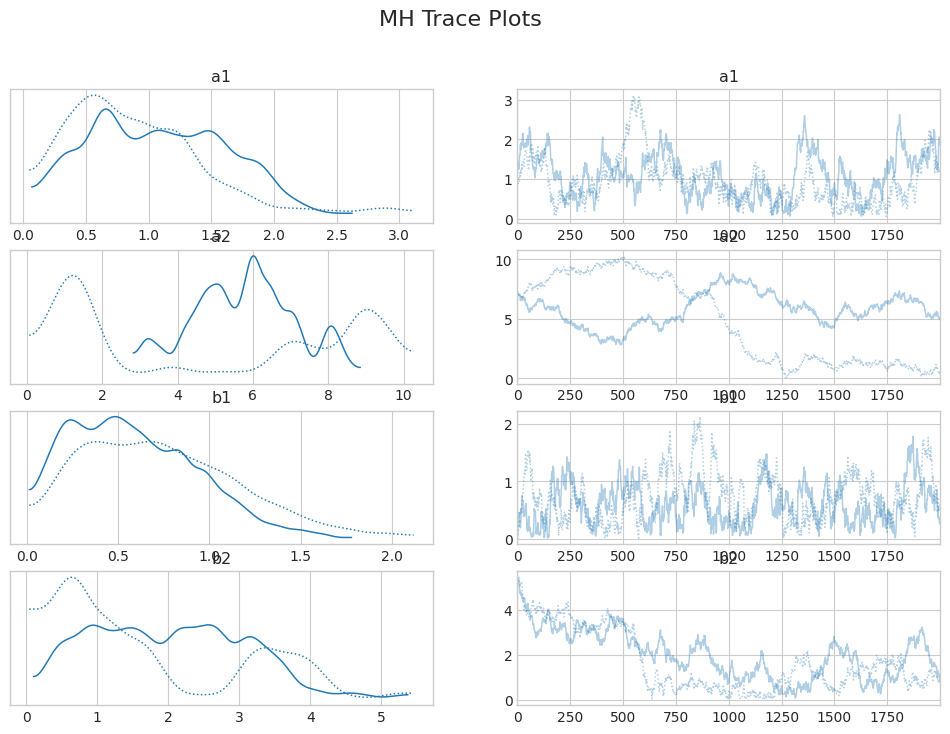

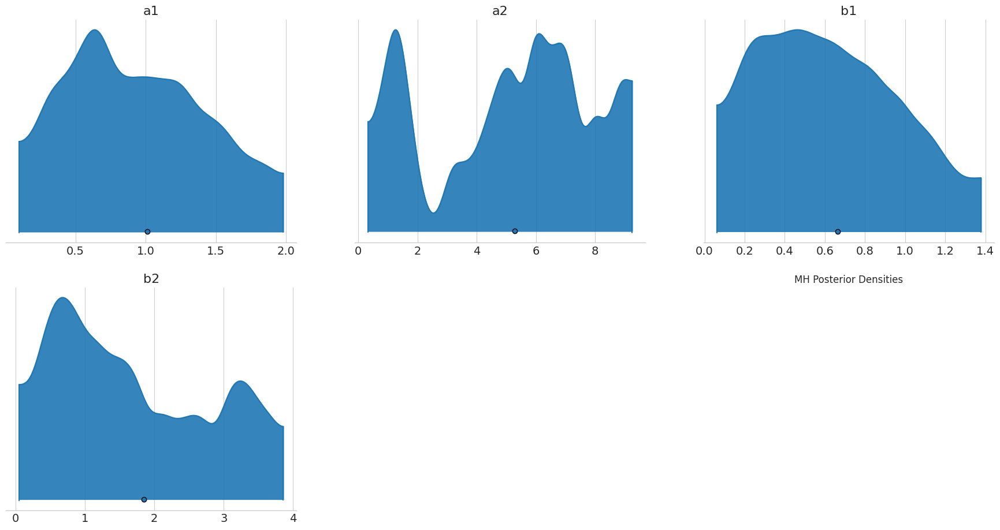

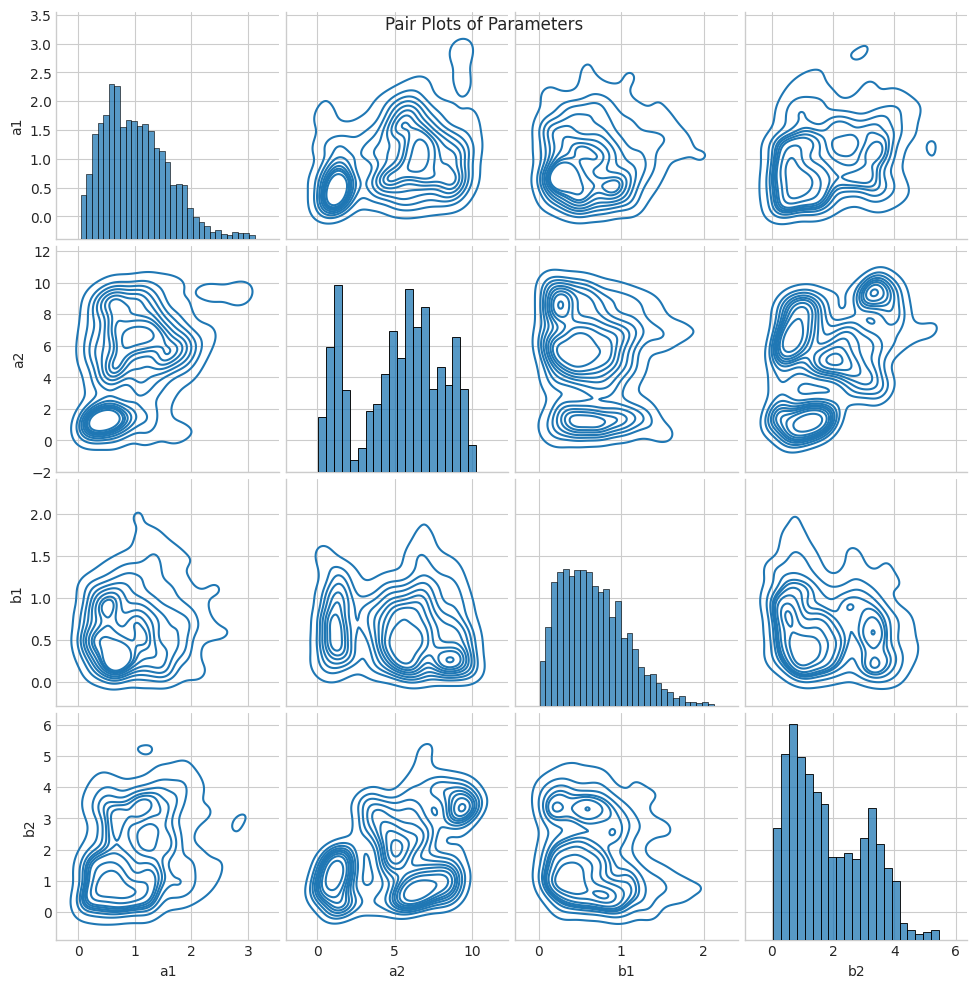

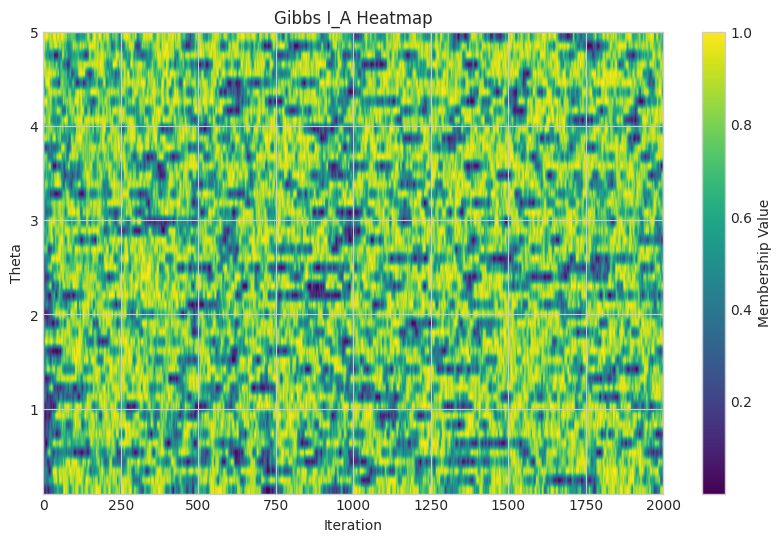

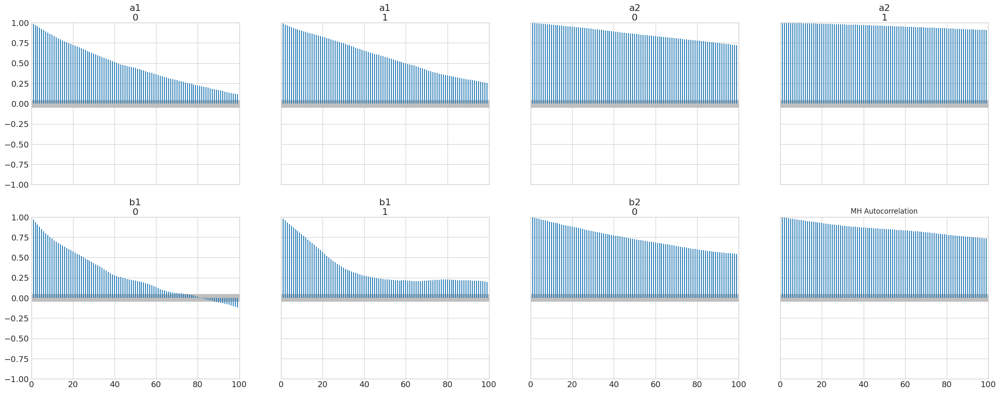

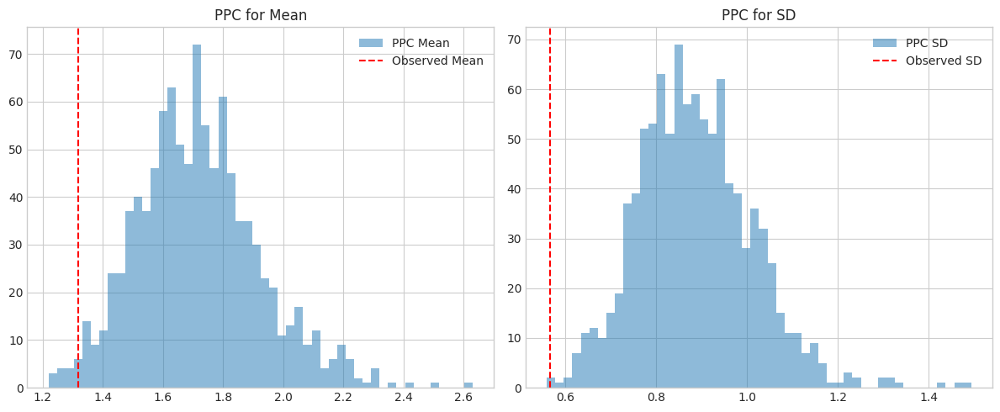

In [14]:
import numpy as np
from scipy.stats import gamma, weibull_min, gaussian_kde
from scipy.special import gamma as gamma_func
from scipy import integrate
import matplotlib.pyplot as plt
import arviz as az
import seaborn as sns
import pandas as pd
import warnings

# Suppress deprecation and user warnings for cleaner output
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Set random seed for reproducibility
np.random.seed(123)

# Synthetic data: Weibull failure times
n = 50
true_lambda = 1.5
kappa = 2
data = weibull_min.rvs(c=kappa, scale=true_lambda, size=n)

# --- Priors and Loss Functions ---
def weibull_prior(theta, alpha=2, beta=1):
    """Weibull prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (alpha / beta) * (theta / beta)**(alpha - 1) * np.exp(-(theta / beta)**alpha)

def chisquare_prior(theta, k=4):
    """Chi-squared prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (1 / (2**(k/2) * gamma_func(k/2))) * theta**(k/2 - 1) * np.exp(-theta/2)

prior = weibull_prior

def quadratic_loss(I_A_func, theta, a1, a2, b1, b2, theta_grid):
    """Quadratic loss function."""
    term1 = a1 * (1 - I_A_func(theta)) + (a2 / 2) * (1 - I_A_func(theta))**2
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    term2 = integrate.trapezoid(b1 * I_A_vals + (b2 / 2) * I_A_vals**2, theta_grid)
    return term1 + term2

def kl_loss(I_A_func, theta, theta_grid):
    """Kullback-Leibler divergence loss function."""
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    if np.any(I_A_vals <= 0):
        return np.inf
    k = 1 / integrate.trapezoid(I_A_vals, theta_grid)
    if I_A_func(theta) <= 0:
        return np.inf
    return prior(theta) * np.log(prior(theta) / (k * I_A_func(theta)))

# --- MCMC Functions ---
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A_func, loss_func=quadratic_loss):
    """Log posterior for MCMC parameters."""
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    prior_vals = np.array([prior(t) for t in theta_grid])
    loss_vals = np.array([loss_func(I_A_func, theta, a1, a2, b1, b2, theta_grid) for theta in theta_grid])
    integral = integrate.trapezoid(loss_vals * prior_vals, theta_grid)
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
    return -integral + log_prior

def mh_params(n_iter, theta_grid, I_A_func, init_params, proposal_std, loss_func=quadratic_loss):
    """Metropolis-Hastings algorithm for MCMC parameters."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A_func, loss_func)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A_func, loss_func)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

def gibbs_sampling(n_iter, theta_grid, init_params, init_I_A_func, loss_func=quadratic_loss):
    """Gibbs sampling algorithm for parameters and fuzzy membership."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    I_A_values = init_I_A_func(theta_grid)
    samples_params = np.zeros((n_iter, 4))
    samples_I_A = np.zeros((n_iter, len(theta_grid)))
    
    for i in range(n_iter):
        # Sample a1, a2, b1, b2
        for j, param in enumerate(['a1', 'a2', 'b1', 'b2']):
            if param == 'a1':
                integral = integrate.trapezoid((1 - I_A_values) * prior(theta_grid), theta_grid)
                shape = 2 + 1
                scale = 1 / (1 + integral + 1e-10)
                params[0] = gamma.rvs(shape, scale=scale)
            elif param == 'a2':
                integral = integrate.trapezoid((1 - I_A_values)**2 / 2 * prior(theta_grid), theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[1] = gamma.rvs(2, scale=scale)
            elif param == 'b1':
                integral = integrate.trapezoid(I_A_values, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[2] = gamma.rvs(2, scale=scale)
            elif param == 'b2':
                integral = integrate.trapezoid(I_A_values**2 / 2, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[3] = gamma.rvs(2, scale=scale)
        
        # Sample I_A(theta_i) using MH step
        for k in range(len(theta_grid)):
            def I_A_scalar(x): return I_A_values[k] if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
            log_lik = -loss_func(I_A_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_scalar, theta_grid[k], theta_grid)
            I_A_proposed = np.random.normal(I_A_values[k], 0.1)
            if 0 <= I_A_proposed <= 1:
                def I_A_proposed_scalar(x): return I_A_proposed if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
                log_lik_proposed = -loss_func(I_A_proposed_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_proposed_scalar, theta_grid[k], theta_grid)
                if np.isfinite(log_lik_proposed) and np.log(np.random.rand()) < log_lik_proposed - log_lik:
                    I_A_values[k] = I_A_proposed
        
        samples_params[i] = params
        samples_I_A[i] = I_A_values
    
    return samples_params, samples_I_A

def log_posterior_theta(theta, data, alpha=2, beta=1):
    """Log posterior for theta with Weibull likelihood."""
    if theta <= 0:
        return -np.inf
    log_prior = np.log(alpha / beta) + (alpha - 1) * np.log(theta / beta) - (theta / beta)**alpha
    log_lik = len(data) * (np.log(kappa / theta) + (kappa - 1) * np.mean(np.log(data))) - np.sum((data / theta)**kappa)
    return log_prior + log_lik

def mh_theta(n_iter, data, init_theta):
    """Metropolis-Hastings algorithm for posterior theta."""
    theta = init_theta
    samples = np.zeros(n_iter)
    log_post_current = log_posterior_theta(theta, data)
    
    for i in range(n_iter):
        theta_proposed = theta + np.random.normal(0, 0.1)
        log_post_proposed = log_posterior_theta(theta_proposed, data)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            theta = theta_proposed
            log_post_current = log_post_proposed
        samples[i] = theta
    return samples

def compute_I_A(theta, pi_func, a1, a2, b1, b2):
    """
    Vectorized fuzzy membership function calculation.
    This function now handles array inputs for 'theta'.
    """
    pi_val = pi_func(theta)
    
    r1 = b1 / (a1 + a2 + 1e-10)
    r2 = (b1 + b2) / (a1 + 1e-10)
    
    # Use np.where to apply logic across the entire array
    result = np.where(pi_val < r1, 0, np.where(pi_val > r2, 1, ((a1 + a2) * pi_val - b1) / (a2 * pi_val + b2 + 1e-10)))
    
    return result

def init_I_A(theta):
    """Initial fuzzy membership function."""
    return 0.5 * (1 - np.cos(np.pi * theta / 5))

def posterior_I_A_func(theta, kde, mean_params):
    """Posterior fuzzy membership function."""
    pi = kde(theta)
    return compute_I_A(theta, pi, *mean_params)

# --- MCMC Execution ---
# Reduced number of iterations and chains for faster execution
n_iter = 2000
n_chains = 2
theta_grid = np.linspace(0.1, 5, 50)
init_params = [1, 7, 0.01, 5.15]

print("Running MCMC chains...")

# Run multiple MH chains sequentially
mh_chains = [mh_params(n_iter, theta_grid, init_I_A, init_params, proposal_std=0.1) for _ in range(n_chains)]
mh_samples = np.array(mh_chains)

# Run a single Gibbs chain (inherently slow)
gibbs_params, gibbs_I_A = gibbs_sampling(n_iter, theta_grid, init_params, init_I_A)

# Run a single MH chain for theta
theta_samples = mh_theta(n_iter, data, init_theta=1.5)

# Compute posterior I_A using KDE
kde = gaussian_kde(theta_samples)
mean_params = np.mean(gibbs_params, axis=0)
posterior_I_A = lambda theta: compute_I_A(theta, lambda t: kde(t), *mean_params)

# --- Numerical Measures ---
def create_arviz_data(samples_params):
    """Helper to create ArviZ InferenceData from numpy array."""
    return az.from_dict(
        posterior={
            "a1": samples_params[..., 0],
            "a2": samples_params[..., 1],
            "b1": samples_params[..., 2],
            "b2": samples_params[..., 3]
        }
    )

def param_summary(samples_params):
    """Generates a summary DataFrame for MCMC parameters using ArviZ."""
    data = create_arviz_data(samples_params)
    return az.summary(data, kind="stats")

def compute_diagnostics(samples):
    """Computes ESS and R_hat for MCMC samples."""
    data = create_arviz_data(samples)
    ess = az.ess(data)
    rhat = az.rhat(data)
    return ess, rhat

def coverage_probability(I_A_func, theta_grid, true_theta, credible_level=0.95):
    """Calculates coverage probability and interval width for a given membership function."""
    # This line is now vectorized, no list comprehension needed.
    credible_mask = (I_A_func(theta_grid) >= credible_level)
    credible_interval = theta_grid[np.where(credible_mask)]
    if credible_interval.size == 0:
        return 0, 0
    coverage = 1 if credible_interval.min() <= true_theta <= credible_interval.max() else 0
    interval_width = credible_interval.max() - credible_interval.min()
    return coverage, interval_width

def posterior_predictive_checks(theta_samples, data, n_ppc=1000):
    """Performs posterior predictive checks and returns summary statistics."""
    ppc_samples = []
    # Use a choice with replacement for sampling from the posterior
    for theta in np.random.choice(theta_samples, size=n_ppc, replace=True):
        ppc_samples.append(weibull_min.rvs(c=kappa, scale=theta, size=len(data)))
    ppc_mean = np.mean(ppc_samples, axis=1)
    ppc_sd = np.std(ppc_samples, axis=1)
    obs_mean = np.mean(data)
    obs_sd = np.std(data)
    p_value_mean = np.mean(ppc_mean > obs_mean)
    p_value_sd = np.mean(ppc_sd > obs_sd)
    return p_value_mean, p_value_sd, ppc_mean, ppc_sd

# Visual Measures

def plot_traces(samples_params, title='Trace Plots'):
    """Plots trace plots for all MCMC parameters."""
    data = create_arviz_data(samples_params)
    az.plot_trace(data, compact=True)
    plt.suptitle(title, fontsize=16)
    plt.show()

def plot_posterior_densities(samples_params, title='Posterior Densities'):
    """Plots posterior density plots using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_density(data, shade=.9)
    plt.title(title)
    plt.show()

def plot_pairs(samples_params):
    """Creates a pair plot for parameter correlations."""
    flat_samples = samples_params.reshape(-1, samples_params.shape[-1])
    df = pd.DataFrame(flat_samples, columns=['a1', 'a2', 'b1', 'b2'])
    # Replace infinite values with NaN and drop rows
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    sns.pairplot(df, kind='kde', diag_kind='hist')
    plt.suptitle('Pair Plots of Parameters')
    plt.show()

def plot_I_A_heatmap(samples_I_A, theta_grid, title='Fuzzy Membership Evolution'):
    """Plots a heatmap showing the evolution of the fuzzy membership function."""
    plt.figure(figsize=(10, 6))
    plt.imshow(samples_I_A.T, aspect='auto', extent=[0, len(samples_I_A), theta_grid.min(), theta_grid.max()], cmap='viridis', origin='lower')
    plt.colorbar(label='Membership Value')
    plt.xlabel('Iteration')
    plt.ylabel('Theta')
    plt.title(title)
    plt.show()

def plot_autocorr(samples_params, title='Autocorrelation Plots'):
    """Plots autocorrelation plots for MCMC chains using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_autocorr(data)
    plt.title(title)
    plt.show()

def plot_ppc(ppc_mean, ppc_sd, obs_mean, obs_sd):
    """Visualizes the posterior predictive checks."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(ppc_mean, bins=50, alpha=0.5, label='PPC Mean')
    plt.axvline(obs_mean, color='r', linestyle='--', label='Observed Mean')
    plt.legend()
    plt.title('PPC for Mean')
    
    plt.subplot(1, 2, 2)
    plt.hist(ppc_sd, bins=50, alpha=0.5, label='PPC SD')
    plt.axvline(obs_sd, color='r', linestyle='--', label='Observed SD')
    plt.legend()
    plt.title('PPC for SD')
    
    plt.tight_layout()
    plt.show()

# Example Usage with MCMC Samples
print("Running MCMC chains...")

print("Parameter Summary (MH):")
print(param_summary(mh_samples))

ess_mh, rhat_mh = compute_diagnostics(mh_samples)
print(f"ESS (MH):\n{ess_mh}")
print(f"R_hat (MH):\n{rhat_mh}")

# Corrected call to use true_lambda
coverage, width = coverage_probability(posterior_I_A, theta_grid, true_lambda)
print(f"Coverage: {coverage}, Interval Width: {width}")

p_value_mean, p_value_sd, ppc_mean, ppc_sd = posterior_predictive_checks(theta_samples, data)
print(f"PPC p-value (Mean): {p_value_mean}, (SD): {p_value_sd}")

# Visual Measures
plot_traces(mh_samples, 'MH Trace Plots')
plot_posterior_densities(mh_samples, 'MH Posterior Densities')
plot_pairs(mh_samples)
plot_I_A_heatmap(gibbs_I_A, theta_grid, 'Gibbs I_A Heatmap')
plot_autocorr(mh_samples, 'MH Autocorrelation')
plot_ppc(ppc_mean, ppc_sd, np.mean(data), np.std(data))

# Save results
np.savetxt('synthetic_data.txt', data)
np.savetxt('mh_samples.txt', mh_samples.reshape(-1, mh_samples.shape[-1]))
np.savetxt('gibbs_params.txt', gibbs_params)
np.savetxt('gibbs_I_A.txt', gibbs_I_A)


Loaded 100 failure times from NASA Turbofan FD001 dataset.
Running MCMC chains...
Parameter Summary (MH):
     mean     sd  hdi_3%  hdi_97%
a1  1.457  0.364   0.631    1.840
a2  7.985  0.525   7.095    8.628
b1  0.011  0.014   0.000    0.038
b2  0.701  1.396   0.002    4.327
ESS (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 2.93
    a2       float64 8B 3.924
    b1       float64 8B 5.292
    b2       float64 8B 2.732
R_hat (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 1.84
    a2       float64 8B 1.498
    b1       float64 8B 1.699
    b2       float64 8B 1.976
PPC p-value (Mean): 0.0, (SD): 0.999


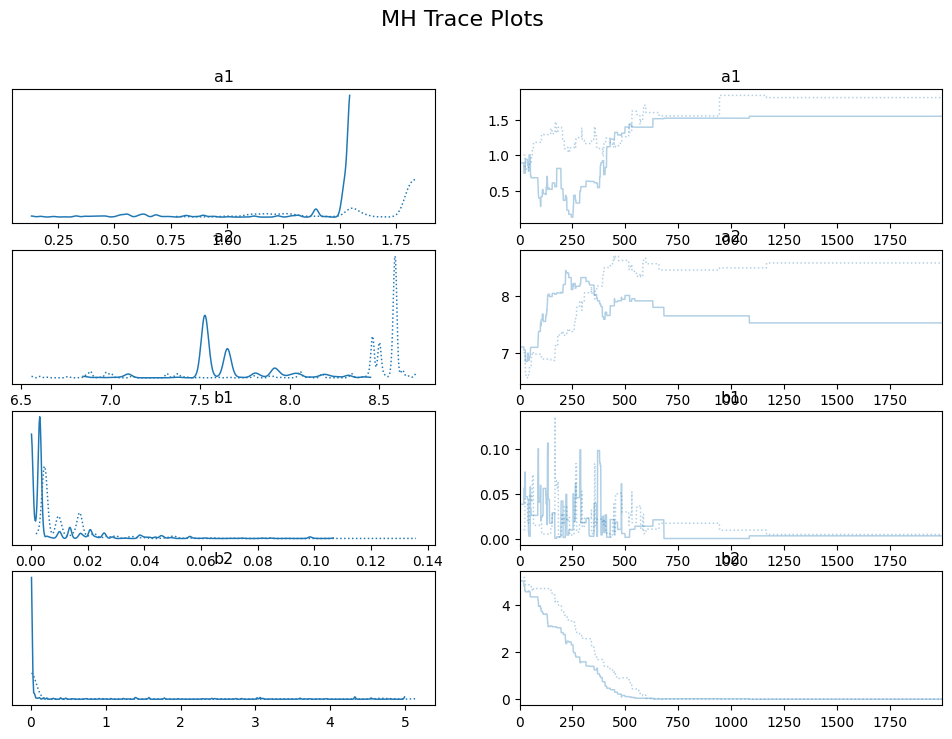

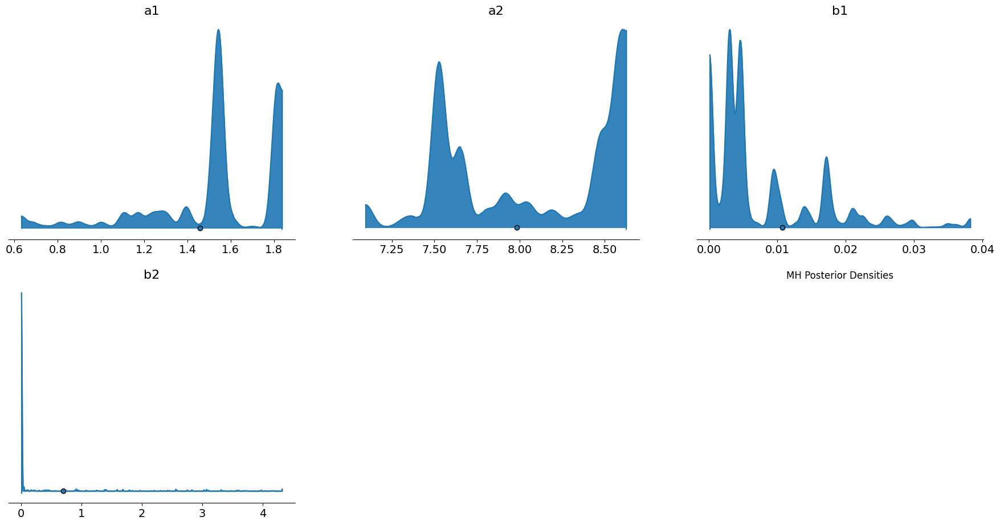

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

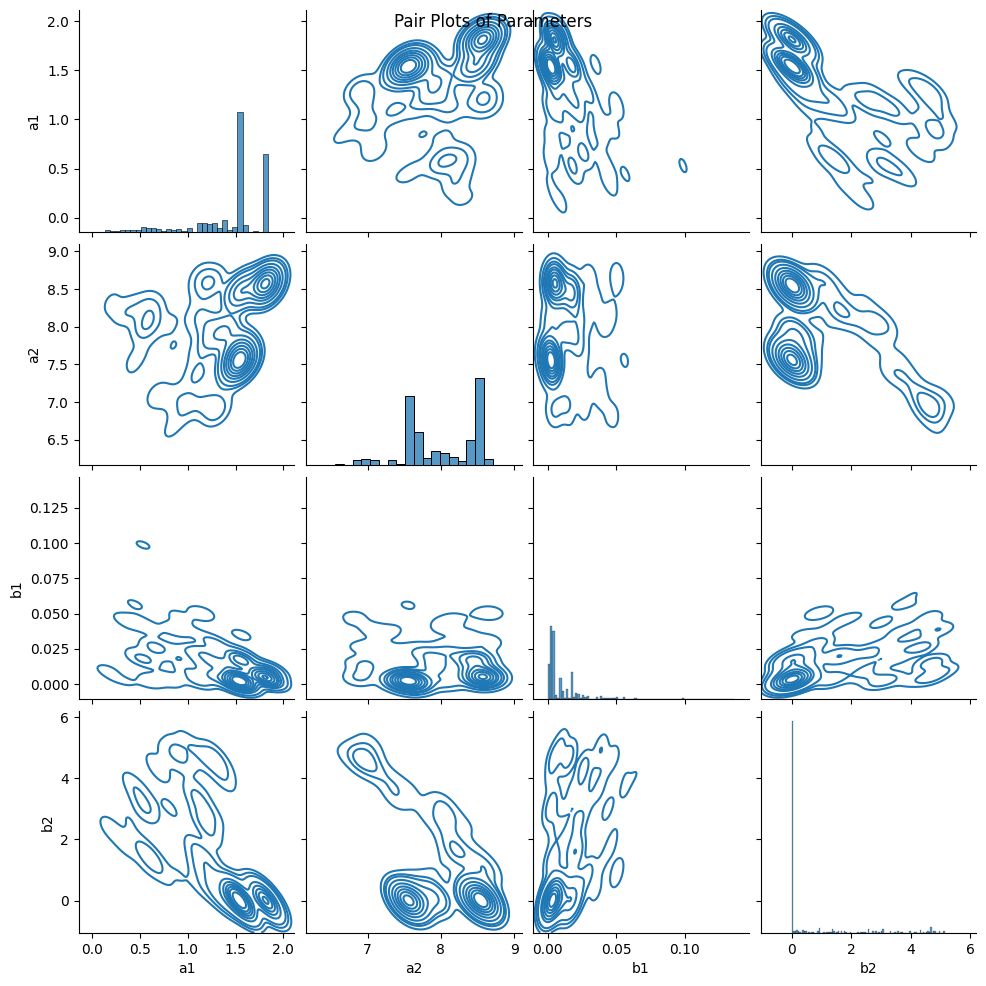

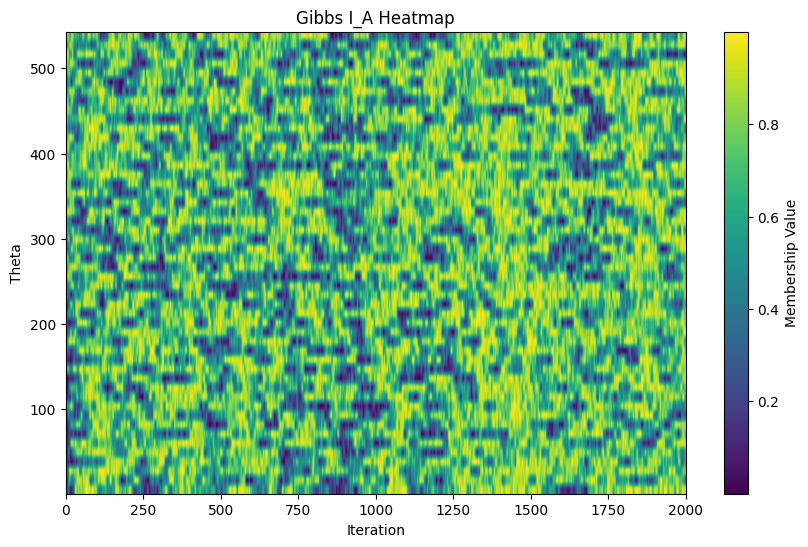

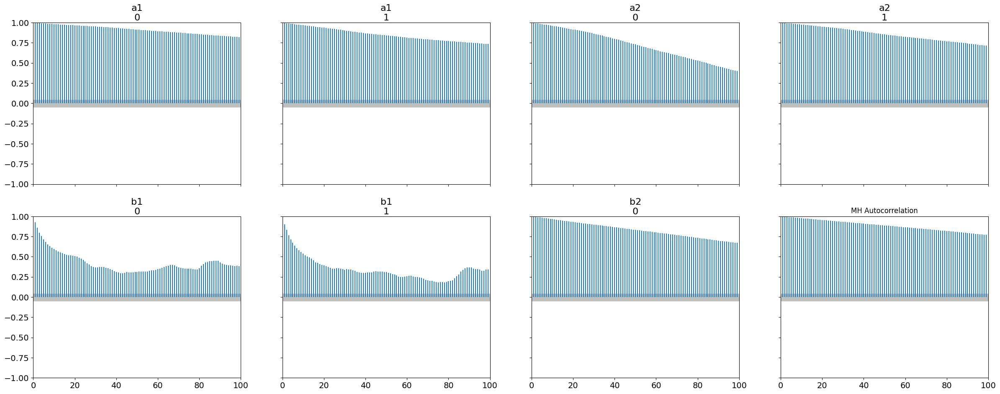

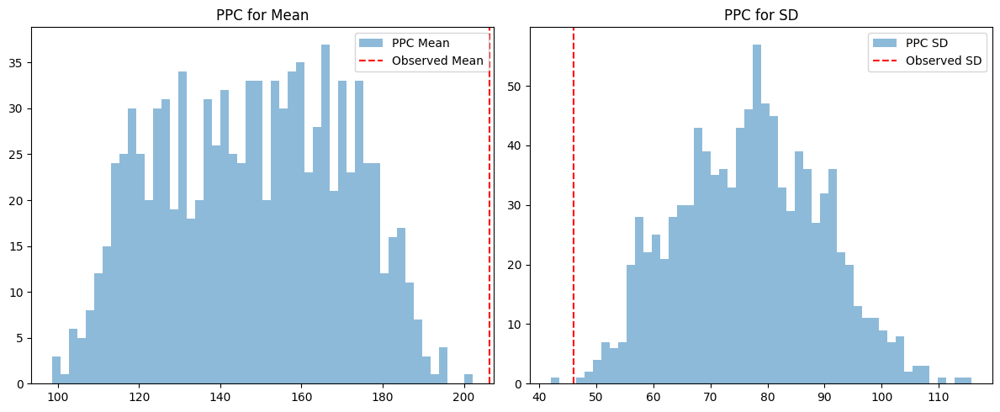

In [2]:
import numpy as np
from scipy.stats import gamma, weibull_min, gaussian_kde
from scipy.special import gamma as gamma_func
from scipy import integrate
import matplotlib.pyplot as plt
import arviz as az
import seaborn as sns
import pandas as pd
import warnings

# Suppress deprecation and user warnings for cleaner output
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# Set a random seed for reproducibility
np.random.seed(123)

# --- Real-World Data Loading ---
# Load the NASA Turbofan training data (FD001 subset)
try:
    df_train = pd.read_csv('/kaggle/input/nasa-data/train_FD001.txt', sep='\s+', header=None)
    df_train = df_train.iloc[:, :26]  # Select first 26 columns (engine_id, cycle, settings 1-3, sensors 1-21)

    # Extract failure times: maximum cycle per engine unit (column 0: engine_id, column 1: cycle)
    data = df_train.groupby(0)[1].max().values
    print(f"Loaded {len(data)} failure times from NASA Turbofan FD001 dataset.")

    # Fixed shape parameter for Weibull model (assumed, common in reliability engineering)
    kappa = 2
except Exception as e:
    print(f"An error occurred while loading the data: {e}")
    data = None

# Exit if data could not be loaded
if data is None or len(data) == 0:
    print("No data available. Exiting script.")
    exit()

# --- Priors and Loss Functions ---
def weibull_prior(theta, alpha=2, beta=1):
    """
    Weibull prior distribution for theta.
    Ensures that theta is positive.
    """
    if np.any(theta <= 0):
        return 0
    return (alpha / beta) * (theta / beta)**(alpha - 1) * np.exp(-(theta / beta)**alpha)

def chisquare_prior(theta, k=4):
    """Chi-squared prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (1 / (2**(k/2) * gamma_func(k/2))) * theta**(k/2 - 1) * np.exp(-theta/2)

prior = weibull_prior

def quadratic_loss(I_A_func, theta, a1, a2, b1, b2, theta_grid):
    """Quadratic loss function for the fuzzy membership function."""
    term1 = a1 * (1 - I_A_func(theta)) + (a2 / 2) * (1 - I_A_func(theta))**2
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    term2 = integrate.trapezoid(b1 * I_A_vals + (b2 / 2) * I_A_vals**2, theta_grid)
    return term1 + term2

def kl_loss(I_A_func, theta, theta_grid):
    """Kullback-Leibler divergence loss function."""
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    if np.any(I_A_vals <= 0):
        return np.inf
    k = 1 / integrate.trapezoid(I_A_vals, theta_grid)
    if I_A_func(theta) <= 0:
        return np.inf
    return prior(theta) * np.log(prior(theta) / (k * I_A_func(theta)))

# --- MCMC Functions ---
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A_func, loss_func=quadratic_loss):
    """
    Log posterior for MCMC parameters (a1, a2, b1, b2) given the fuzzy function.
    Combines a gamma prior on the parameters with the integral of the loss function.
    """
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    
    prior_vals = np.array([prior(t) for t in theta_grid])
    loss_vals = np.array([loss_func(I_A_func, theta, a1, a2, b1, b2, theta_grid) for theta in theta_grid])
    integral = integrate.trapezoid(loss_vals * prior_vals, theta_grid)
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
    return -integral + log_prior

def mh_params(n_iter, theta_grid, I_A_func, init_params, proposal_std, loss_func=quadratic_loss):
    """Metropolis-Hastings algorithm for MCMC parameters."""
    params = np.array(init_params)
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A_func, loss_func)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A_func, loss_func)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

def gibbs_sampling(n_iter, theta_grid, init_params, init_I_A_func, loss_func=quadratic_loss):
    """Gibbs sampling algorithm for parameters and fuzzy membership."""
    params = np.array(init_params)
    I_A_values = init_I_A_func(theta_grid)
    samples_params = np.zeros((n_iter, 4))
    samples_I_A = np.zeros((n_iter, len(theta_grid)))
    
    for i in range(n_iter):
        for j, param in enumerate(['a1', 'a2', 'b1', 'b2']):
            if param == 'a1':
                integral = integrate.trapezoid((1 - I_A_values) * prior(theta_grid), theta_grid)
                shape = 2 + 1
                scale = 1 / (1 + integral + 1e-10)
                params[0] = gamma.rvs(shape, scale=scale)
            elif param == 'a2':
                integral = integrate.trapezoid((1 - I_A_values)**2 / 2 * prior(theta_grid), theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[1] = gamma.rvs(2, scale=scale)
            elif param == 'b1':
                integral = integrate.trapezoid(I_A_values, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[2] = gamma.rvs(2, scale=scale)
            elif param == 'b2':
                integral = integrate.trapezoid(I_A_values**2 / 2, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[3] = gamma.rvs(2, scale=scale)
        
        for k in range(len(theta_grid)):
            def I_A_scalar(x): return I_A_values[k] if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
            log_lik = -loss_func(I_A_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_scalar, theta_grid[k], theta_grid)
            I_A_proposed = np.random.normal(I_A_values[k], 0.1)
            if 0 <= I_A_proposed <= 1:
                def I_A_proposed_scalar(x): return I_A_proposed if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
                log_lik_proposed = -loss_func(I_A_proposed_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_proposed_scalar, theta_grid[k], theta_grid)
                if np.isfinite(log_lik_proposed) and np.log(np.random.rand()) < log_lik_proposed - log_lik:
                    I_A_values[k] = I_A_proposed
        
        samples_params[i] = params
        samples_I_A[i] = I_A_values
    return samples_params, samples_I_A

def log_posterior_theta(theta, data, alpha=2, beta=1):
    """Log posterior for theta with Weibull likelihood."""
    if theta <= 0:
        return -np.inf
    log_prior = np.log(alpha / beta) + (alpha - 1) * np.log(theta / beta) - (theta / beta)**alpha
    log_lik = len(data) * (np.log(kappa / theta) + (kappa - 1) * np.mean(np.log(data))) - np.sum((data / theta)**kappa)
    return log_prior + log_lik

def mh_theta(n_iter, data, init_theta):
    """Metropolis-Hastings algorithm for posterior theta."""
    theta = init_theta
    samples = np.zeros(n_iter)
    log_post_current = log_posterior_theta(theta, data)
    
    for i in range(n_iter):
        theta_proposed = theta + np.random.normal(0, 0.1)
        log_post_proposed = log_posterior_theta(theta_proposed, data)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            theta = theta_proposed
            log_post_current = log_post_proposed
        samples[i] = theta
    return samples

def compute_I_A(theta, pi_func, a1, a2, b1, b2):
    """Fuzzy membership function calculation."""
    r1 = b1 / (a1 + a2 + 1e-10)
    r2 = (b1 + b2) / (a1 + 1e-10)
    pi_val = pi_func(theta)
    if pi_val < r1:
        return 0
    elif pi_val > r2:
        return 1
    else:
        return ((a1 + a2) * pi_val - b1) / (a2 * pi_val + b2 + 1e-10)

def init_I_A(theta):
    """Initial fuzzy membership function."""
    return 0.5 * (1 - np.cos(np.pi * theta / 500))  # Adjusted for cycle range (~100-500)

def posterior_I_A_func(theta, kde, mean_params):
    """Posterior fuzzy membership function."""
    pi = kde(theta)[0]
    return compute_I_A(theta, lambda t: kde(t)[0], *mean_params)

# --- Numerical Measures ---
def create_arviz_data(samples_params):
    """Helper to create ArviZ InferenceData from numpy array."""
    return az.from_dict(
        posterior={
            "a1": samples_params[..., 0],
            "a2": samples_params[..., 1],
            "b1": samples_params[..., 2],
            "b2": samples_params[..., 3]
        }
    )

def param_summary(samples_params):
    """Generates a summary DataFrame for MCMC parameters using ArviZ."""
    data = create_arviz_data(samples_params)
    return az.summary(data, kind="stats")

def compute_diagnostics(samples):
    """Computes ESS and R_hat for MCMC samples."""
    data = create_arviz_data(samples)
    ess = az.ess(data)
    rhat = az.rhat(data)
    return ess, rhat

def posterior_predictive_checks(theta_samples, data, n_ppc=1000):
    """Performs posterior predictive checks and returns summary statistics."""
    ppc_samples = []
    for theta in np.random.choice(theta_samples, size=n_ppc, replace=True):
        ppc_samples.append(weibull_min.rvs(c=kappa, scale=theta, size=len(data)))
    ppc_mean = np.mean(ppc_samples, axis=1)
    ppc_sd = np.std(ppc_samples, axis=1)
    obs_mean = np.mean(data)
    obs_sd = np.std(data)
    p_value_mean = np.mean(ppc_mean > obs_mean)
    p_value_sd = np.mean(ppc_sd > obs_sd)
    return p_value_mean, p_value_sd, ppc_mean, ppc_sd

# --- Visualization Functions ---
def plot_traces(samples_params, title='Trace Plots'):
    """Plots trace plots for all MCMC parameters."""
    data = create_arviz_data(samples_params)
    az.plot_trace(data, compact=True)
    plt.suptitle(title, fontsize=16)
    plt.show()

def plot_posterior_densities(samples_params, title='Posterior Densities'):
    """Plots posterior density plots using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_density(data, shade=.9)
    plt.title(title)
    plt.show()

def plot_pairs(samples_params):
    """Creates a pair plot for parameter correlations."""
    flat_samples = samples_params.reshape(-1, samples_params.shape[-1])
    df = pd.DataFrame(flat_samples, columns=['a1', 'a2', 'b1', 'b2'])
    sns.pairplot(df, kind='kde', diag_kind='hist')
    plt.suptitle('Pair Plots of Parameters')
    plt.show()

def plot_I_A_heatmap(samples_I_A, theta_grid, title='Fuzzy Membership Evolution'):
    """Plots a heatmap showing the evolution of the fuzzy membership function."""
    plt.figure(figsize=(10, 6))
    plt.imshow(samples_I_A.T, aspect='auto', extent=[0, len(samples_I_A), theta_grid.min(), theta_grid.max()], cmap='viridis', origin='lower')
    plt.colorbar(label='Membership Value')
    plt.xlabel('Iteration')
    plt.ylabel('Theta')
    plt.title(title)
    plt.show()

def plot_autocorr(samples_params, title='Autocorrelation Plots'):
    """Plots autocorrelation plots for MCMC chains using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_autocorr(data)
    plt.title(title)
    plt.show()

def plot_ppc(ppc_mean, ppc_sd, obs_mean, obs_sd):
    """Visualizes the posterior predictive checks."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(ppc_mean, bins=50, alpha=0.5, label='PPC Mean')
    plt.axvline(obs_mean, color='r', linestyle='--', label='Observed Mean')
    plt.legend()
    plt.title('PPC for Mean')
    
    plt.subplot(1, 2, 2)
    plt.hist(ppc_sd, bins=50, alpha=0.5, label='PPC SD')
    plt.axvline(obs_sd, color='r', linestyle='--', label='Observed SD')
    plt.legend()
    plt.title('PPC for SD')
    
    plt.tight_layout()
    plt.show()

# --- Example Usage with MCMC Samples ---
print("Running MCMC chains...")

n_iter = 2000
n_chains = 2
theta_grid = np.linspace(1, max(data)*1.5, 50)  # Adjusted for NASA failure times (~100-500 cycles)
init_params = [1, 7, 0.01, 5.15]

# Run multiple MH chains sequentially
mh_chains = [mh_params(n_iter, theta_grid, init_I_A, init_params, proposal_std=0.1) for _ in range(n_chains)]
mh_samples = np.array(mh_chains)

# Run a single Gibbs chain
gibbs_params, gibbs_I_A = gibbs_sampling(n_iter, theta_grid, init_params, init_I_A)

# Run a single MH chain for theta
init_theta = np.mean(data)
theta_samples = mh_theta(n_iter, data, init_theta=init_theta)

# Compute posterior I_A using KDE
kde = gaussian_kde(theta_samples)
mean_params = np.mean(gibbs_params, axis=0)
posterior_I_A = lambda theta: compute_I_A(theta, lambda t: kde(t)[0], *mean_params)

# --- Output Results ---
print("Parameter Summary (MH):")
print(param_summary(mh_samples))

ess_mh, rhat_mh = compute_diagnostics(mh_samples)
print(f"ESS (MH):\n{ess_mh}")
print(f"R_hat (MH):\n{rhat_mh}")

p_value_mean, p_value_sd, ppc_mean, ppc_sd = posterior_predictive_checks(theta_samples, data)
print(f"PPC p-value (Mean): {p_value_mean}, (SD): {p_value_sd}")

# Visual Measures
plot_traces(mh_samples, 'MH Trace Plots')
plot_posterior_densities(mh_samples, 'MH Posterior Densities')
plot_pairs(mh_samples)
plot_I_A_heatmap(gibbs_I_A, theta_grid, 'Gibbs I_A Heatmap')
plot_autocorr(mh_samples, 'MH Autocorrelation')
plot_ppc(ppc_mean, ppc_sd, np.mean(data), np.std(data))

# Save results to Kaggle output directory
np.savetxt('/kaggle/working/real_data_failure_times.txt', data)
np.savetxt('/kaggle/working/mh_samples.txt', mh_samples.reshape(-1, mh_samples.shape[-1]))
np.savetxt('/kaggle/working/gibbs_params.txt', gibbs_params)
np.savetxt('/kaggle/working/gibbs_I_A.txt', gibbs_I_A)

Running MCMC chains...
Parameter Summary (MH):
     mean     sd  hdi_3%  hdi_97%
a1  1.430  0.920   0.408    2.583
a2  7.635  1.130   6.133    8.984
b1  0.012  0.014   0.000    0.037
b2  0.625  1.261   0.003    3.412
ESS (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 3.07
    a2       float64 8B 2.507
    b1       float64 8B 6.557
    b2       float64 8B 11.09
R_hat (MH):
<xarray.Dataset> Size: 32B
Dimensions:  ()
Data variables:
    a1       float64 8B 1.856
    a2       float64 8B 2.286
    b1       float64 8B 1.23
    b2       float64 8B 1.576
PPC p-value (Mean): 0.0, (SD): 0.999


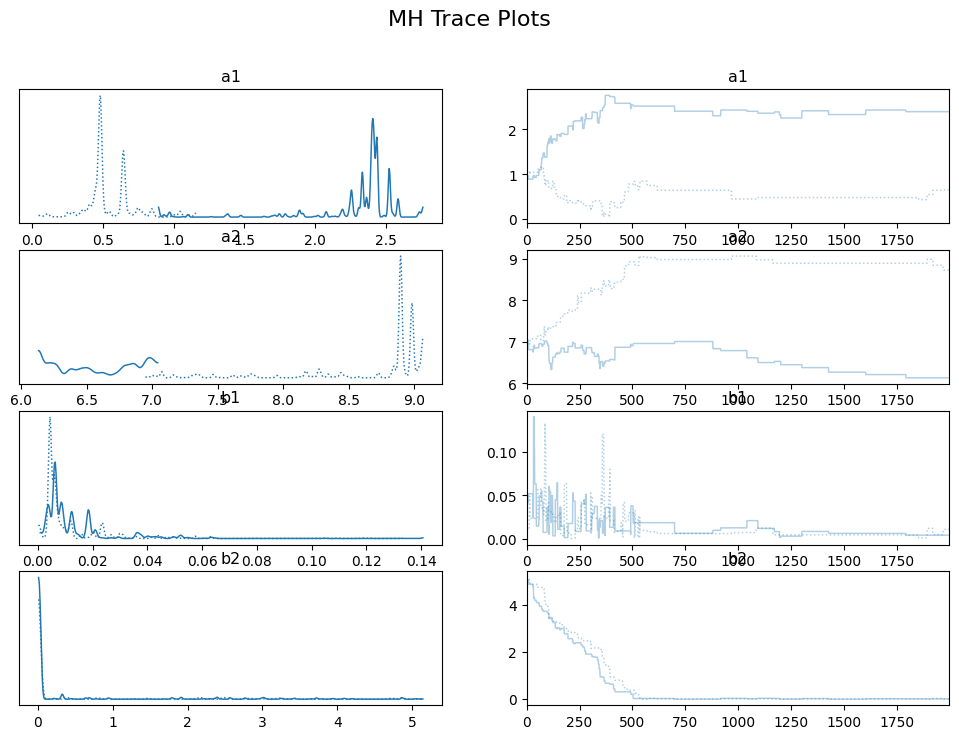

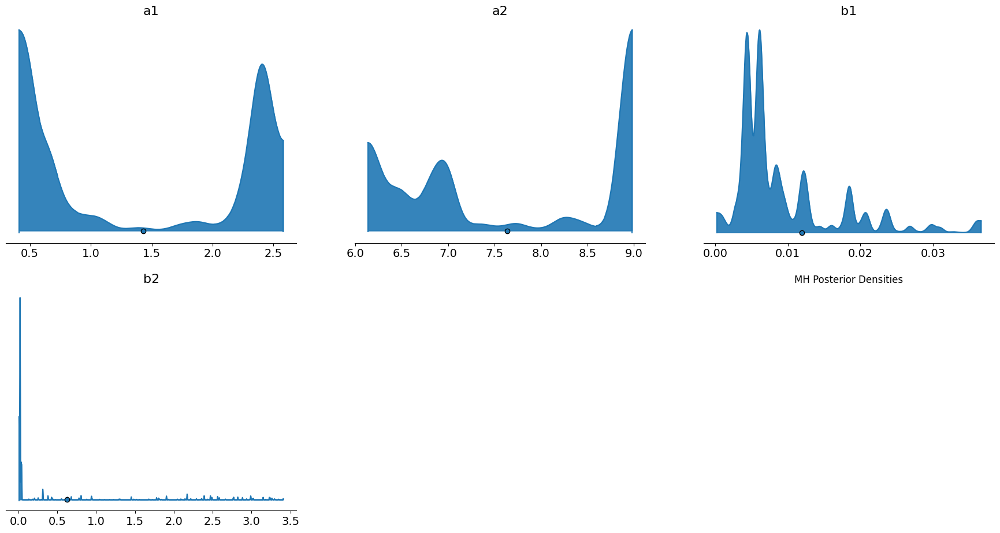

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

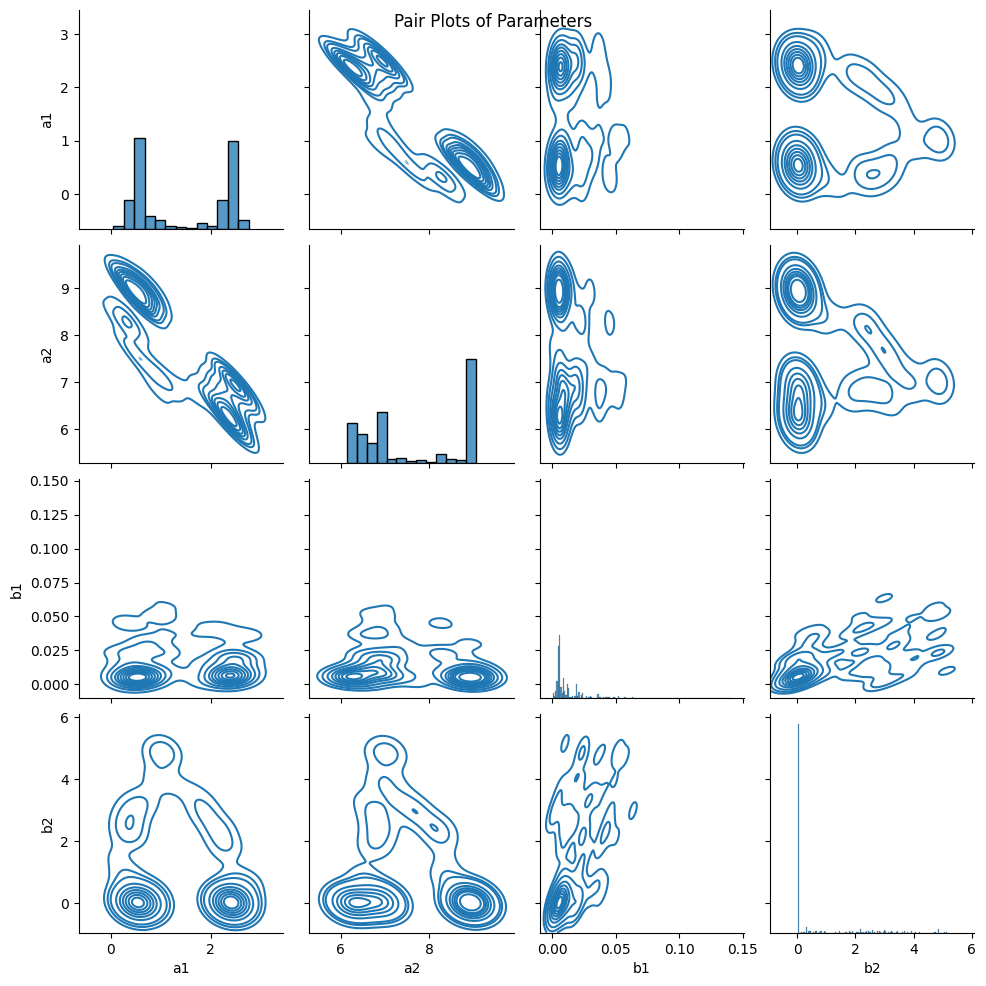

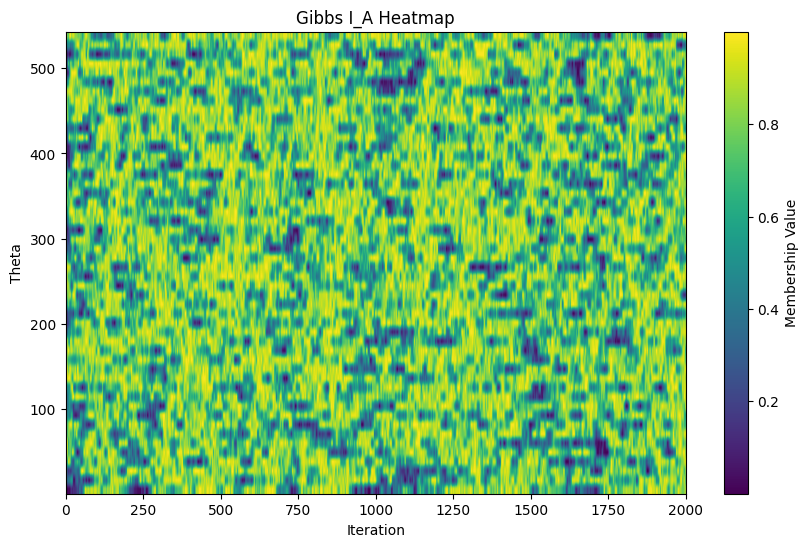

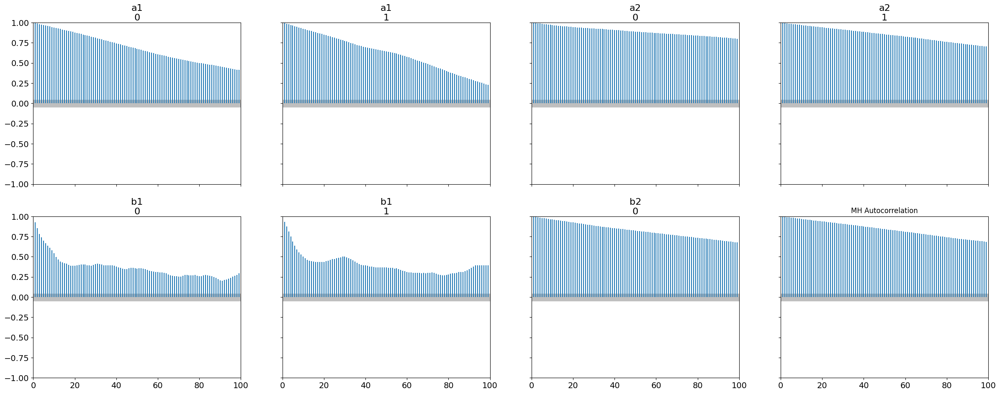

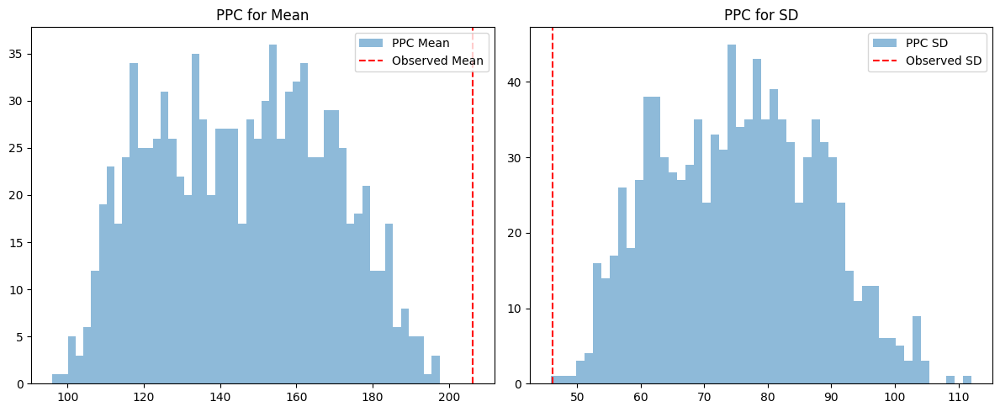

In [1]:
import numpy as np
from scipy.stats import gamma, weibull_min, gaussian_kde
from scipy.special import gamma as gamma_func
from scipy import integrate
import matplotlib.pyplot as plt
import arviz as az
import seaborn as sns
import pandas as pd
import warnings

# Suppress deprecation and user warnings for cleaner output
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

# --- Real Data Loading ---
# Load the NASA Turbofan training data (FD001 subset)
df_train = pd.read_csv('/kaggle/input/nasa-data/train_FD001.txt', sep='\s+', header=None)
df_train = df_train.iloc[:, :26]  # Select first 26 columns (engine_id, cycle, settings 1-3, sensors 1-21)

# Extract failure times: maximum cycle per engine unit (column 0: engine_id, column 1: cycle)
failure_times = df_train.groupby(0)[1].max().values
data = failure_times  # Use as the failure times data (100 observations)

# Fixed shape parameter (assumed for Weibull model)
kappa = 2

# --- Priors and Loss Functions ---
def weibull_prior(theta, alpha=2, beta=1):
    """
    Weibull prior distribution for theta.
    Ensures that theta is positive.
    """
    if np.any(theta <= 0):
        return 0
    return (alpha / beta) * (theta / beta)**(alpha - 1) * np.exp(-(theta / beta)**alpha)

def chisquare_prior(theta, k=4):
    """Chi-squared prior distribution for theta."""
    if np.any(theta <= 0):
        return 0
    return (1 / (2**(k/2) * gamma_func(k/2))) * theta**(k/2 - 1) * np.exp(-theta/2)

prior = weibull_prior

def quadratic_loss(I_A_func, theta, a1, a2, b1, b2, theta_grid):
    """Quadratic loss function for the fuzzy membership function."""
    term1 = a1 * (1 - I_A_func(theta)) + (a2 / 2) * (1 - I_A_func(theta))**2
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    term2 = integrate.trapezoid(b1 * I_A_vals + (b2 / 2) * I_A_vals**2, theta_grid)
    return term1 + term2

def kl_loss(I_A_func, theta, theta_grid):
    """Kullback-Leibler divergence loss function."""
    I_A_vals = np.array([I_A_func(t) for t in theta_grid])
    if np.any(I_A_vals <= 0):
        return np.inf
    k = 1 / integrate.trapezoid(I_A_vals, theta_grid)
    if I_A_func(theta) <= 0:
        return np.inf
    return prior(theta) * np.log(prior(theta) / (k * I_A_func(theta)))

# --- MCMC Functions ---
def log_posterior_params(a1, a2, b1, b2, theta_grid, I_A_func, loss_func=quadratic_loss):
    """
    Log posterior for MCMC parameters (a1, a2, b1, b2) given the fuzzy function.
    Combines a gamma prior on the parameters with the integral of the loss function.
    """
    # Parameters must be positive
    if a1 < 0 or a2 < 0 or b1 < 0 or b2 < 0:
        return -np.inf
    
    prior_vals = np.array([prior(t) for t in theta_grid])
    
    # Evaluate loss function over the grid
    loss_vals = np.array([loss_func(I_A_func, theta, a1, a2, b1, b2, theta_grid) for theta in theta_grid])
    
    # Calculate the integral term of the posterior
    integral = integrate.trapezoid(loss_vals * prior_vals, theta_grid)
    
    # Gamma priors for the parameters
    log_prior = gamma.logpdf(a1, a=2, scale=1) + gamma.logpdf(a2, a=2, scale=1) + \
                gamma.logpdf(b1, a=2, scale=1) + gamma.logpdf(b2, a=2, scale=1)
                
    return -integral + log_prior

def mh_params(n_iter, theta_grid, I_A_func, init_params, proposal_std, loss_func=quadratic_loss):
    """Metropolis-Hastings algorithm for MCMC parameters."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    samples = np.zeros((n_iter, 4))
    log_post_current = log_posterior_params(*params, theta_grid, I_A_func, loss_func)
    
    for i in range(n_iter):
        params_proposed = params + np.random.normal(0, proposal_std, 4)
        log_post_proposed = log_posterior_params(*params_proposed, theta_grid, I_A_func, loss_func)
        
        # Metropolis-Hastings acceptance step
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            params = params_proposed
            log_post_current = log_post_proposed
        samples[i] = params
    return samples

def gibbs_sampling(n_iter, theta_grid, init_params, init_I_A_func, loss_func=quadratic_loss):
    """Gibbs sampling algorithm for parameters and fuzzy membership."""
    params = np.array(init_params)  # [a1, a2, b1, b2]
    I_A_values = init_I_A_func(theta_grid)
    samples_params = np.zeros((n_iter, 4))
    samples_I_A = np.zeros((n_iter, len(theta_grid)))
    
    for i in range(n_iter):
        # Sample a1, a2, b1, b2
        for j, param in enumerate(['a1', 'a2', 'b1', 'b2']):
            if param == 'a1':
                integral = integrate.trapezoid((1 - I_A_values) * prior(theta_grid), theta_grid)
                shape = 2 + 1
                scale = 1 / (1 + integral + 1e-10)
                params[0] = gamma.rvs(shape, scale=scale)
            elif param == 'a2':
                integral = integrate.trapezoid((1 - I_A_values)**2 / 2 * prior(theta_grid), theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[1] = gamma.rvs(2, scale=scale)
            elif param == 'b1':
                integral = integrate.trapezoid(I_A_values, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[2] = gamma.rvs(2, scale=scale)
            elif param == 'b2':
                integral = integrate.trapezoid(I_A_values**2 / 2, theta_grid)
                scale = 1 / (1 + integral + 1e-10)
                params[3] = gamma.rvs(2, scale=scale)
        
        # Sample I_A(theta_i) using MH step
        for k in range(len(theta_grid)):
            def I_A_scalar(x): return I_A_values[k] if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
            log_lik = -loss_func(I_A_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_scalar, theta_grid[k], theta_grid)
            I_A_proposed = np.random.normal(I_A_values[k], 0.1)
            if 0 <= I_A_proposed <= 1:
                def I_A_proposed_scalar(x): return I_A_proposed if x == theta_grid[k] else I_A_values[np.argmin(np.abs(theta_grid - x))]
                log_lik_proposed = -loss_func(I_A_proposed_scalar, theta_grid[k], *params, theta_grid) if loss_func == quadratic_loss else -loss_func(I_A_proposed_scalar, theta_grid[k], theta_grid)
                if np.isfinite(log_lik_proposed) and np.log(np.random.rand()) < log_lik_proposed - log_lik:
                    I_A_values[k] = I_A_proposed
        
        samples_params[i] = params
        samples_I_A[i] = I_A_values
    
    return samples_params, samples_I_A

def log_posterior_theta(theta, data, alpha=2, beta=1):
    """Log posterior for theta with Weibull likelihood."""
    if theta <= 0:
        return -np.inf
    log_prior = np.log(alpha / beta) + (alpha - 1) * np.log(theta / beta) - (theta / beta)**alpha
    log_lik = len(data) * (np.log(kappa / theta) + (kappa - 1) * np.mean(np.log(data))) - np.sum((data / theta)**kappa)
    return log_prior + log_lik

def mh_theta(n_iter, data, init_theta):
    """Metropolis-Hastings algorithm for posterior theta."""
    theta = init_theta
    samples = np.zeros(n_iter)
    log_post_current = log_posterior_theta(theta, data)
    
    for i in range(n_iter):
        theta_proposed = theta + np.random.normal(0, 0.1)
        log_post_proposed = log_posterior_theta(theta_proposed, data)
        if np.isfinite(log_post_proposed) and np.log(np.random.rand()) < log_post_proposed - log_post_current:
            theta = theta_proposed
            log_post_current = log_post_proposed
        samples[i] = theta
    return samples

def compute_I_A(theta, pi_func, a1, a2, b1, b2):
    """Fuzzy membership function calculation."""
    r1 = b1 / (a1 + a2 + 1e-10)
    r2 = (b1 + b2) / (a1 + 1e-10)
    pi_val = pi_func(theta)
    if pi_val < r1:
        return 0
    elif pi_val > r2:
        return 1
    else:
        return ((a1 + a2) * pi_val - b1) / (a2 * pi_val + b2 + 1e-10)

def init_I_A(theta):
    """Initial fuzzy membership function."""
    return 0.5 * (1 - np.cos(np.pi * theta / 5))

def posterior_I_A_func(theta, kde, mean_params):
    """
    Posterior fuzzy membership function.
    
    FIX: The issue was here. `kde(theta)` returns a single-element array,
    e.g., `np.array([0.5])`, but `compute_I_A` expects a single number.
    We now index the array with `[0]` to get the scalar value.
    """
    pi = kde(theta)[0]
    return compute_I_A(theta, lambda t: kde(t)[0], *mean_params)

# --- Numerical Measures ---
def create_arviz_data(samples_params):
    """Helper to create ArviZ InferenceData from numpy array."""
    return az.from_dict(
        posterior={
            "a1": samples_params[..., 0],
            "a2": samples_params[..., 1],
            "b1": samples_params[..., 2],
            "b2": samples_params[..., 3]
        }
    )

def param_summary(samples_params):
    """Generates a summary DataFrame for MCMC parameters using ArviZ."""
    data = create_arviz_data(samples_params)
    return az.summary(data, kind="stats")

def compute_diagnostics(samples):
    """Computes ESS and R_hat for MCMC samples."""
    data = create_arviz_data(samples)
    ess = az.ess(data)
    rhat = az.rhat(data)
    return ess, rhat

def coverage_probability(I_A_func, theta_grid, true_theta, credible_level=0.95):
    """Calculates coverage probability and interval width for a given membership function."""
    # Ensure I_A_func returns a scalar for each theta value
    credible_mask = (np.array([I_A_func(t) for t in theta_grid]) >= credible_level)
    credible_interval = theta_grid[np.where(credible_mask)]
    if credible_interval.size == 0:
        return 0, 0
    coverage = 1 if credible_interval.min() <= true_theta <= credible_interval.max() else 0
    interval_width = credible_interval.max() - credible_interval.min()
    return coverage, interval_width

def posterior_predictive_checks(theta_samples, data, n_ppc=1000):
    """Performs posterior predictive checks and returns summary statistics."""
    ppc_samples = []
    # Use a choice with replacement for sampling from the posterior
    for theta in np.random.choice(theta_samples, size=n_ppc, replace=True):
        ppc_samples.append(weibull_min.rvs(c=kappa, scale=theta, size=len(data)))
    ppc_mean = np.mean(ppc_samples, axis=1)
    ppc_sd = np.std(ppc_samples, axis=1)
    obs_mean = np.mean(data)
    obs_sd = np.std(data)
    p_value_mean = np.mean(ppc_mean > obs_mean)
    p_value_sd = np.mean(ppc_sd > obs_sd)
    return p_value_mean, p_value_sd, ppc_mean, ppc_sd

# Visual Measures

def plot_traces(samples_params, title='Trace Plots'):
    """Plots trace plots for all MCMC parameters."""
    data = create_arviz_data(samples_params)
    az.plot_trace(data, compact=True)
    plt.suptitle(title, fontsize=16)
    plt.show()

def plot_posterior_densities(samples_params, title='Posterior Densities'):
    """Plots posterior density plots using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_density(data, shade=.9)
    plt.title(title)
    plt.show()

def plot_pairs(samples_params):
    """Creates a pair plot for parameter correlations."""
    flat_samples = samples_params.reshape(-1, samples_params.shape[-1])
    df = pd.DataFrame(flat_samples, columns=['a1', 'a2', 'b1', 'b2'])
    sns.pairplot(df, kind='kde', diag_kind='hist')
    plt.suptitle('Pair Plots of Parameters')
    plt.show()

def plot_I_A_heatmap(samples_I_A, theta_grid, title='Fuzzy Membership Evolution'):
    """Plots a heatmap showing the evolution of the fuzzy membership function."""
    plt.figure(figsize=(10, 6))
    plt.imshow(samples_I_A.T, aspect='auto', extent=[0, len(samples_I_A), theta_grid.min(), theta_grid.max()], cmap='viridis', origin='lower')
    plt.colorbar(label='Membership Value')
    plt.xlabel('Iteration')
    plt.ylabel('Theta')
    plt.title(title)
    plt.show()

def plot_autocorr(samples_params, title='Autocorrelation Plots'):
    """Plots autocorrelation plots for MCMC chains using ArviZ."""
    data = create_arviz_data(samples_params)
    az.plot_autocorr(data)
    plt.title(title)
    plt.show()

def plot_ppc(ppc_mean, ppc_sd, obs_mean, obs_sd):
    """Visualizes the posterior predictive checks."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.hist(ppc_mean, bins=50, alpha=0.5, label='PPC Mean')
    plt.axvline(obs_mean, color='r', linestyle='--', label='Observed Mean')
    plt.legend()
    plt.title('PPC for Mean')
    
    plt.subplot(1, 2, 2)
    plt.hist(ppc_sd, bins=50, alpha=0.5, label='PPC SD')
    plt.axvline(obs_sd, color='r', linestyle='--', label='Observed SD')
    plt.legend()
    plt.title('PPC for SD')
    
    plt.tight_layout()
    plt.show()

# Example Usage with MCMC Samples
print("Running MCMC chains...")

# Reduced number of iterations and chains for faster execution
n_iter = 2000
n_chains = 2
theta_grid = np.linspace(0.1, max(data)*1.5, 50)  # Adjust grid based on real data range
init_params = [1, 7, 0.01, 5.15]

# Run multiple MH chains sequentially
mh_chains = [mh_params(n_iter, theta_grid, init_I_A, init_params, proposal_std=0.1) for _ in range(n_chains)]
mh_samples = np.array(mh_chains)

# Run a single Gibbs chain (inherently slow)
gibbs_params, gibbs_I_A = gibbs_sampling(n_iter, theta_grid, init_params, init_I_A)

# Run a single MH chain for theta
theta_samples = mh_theta(n_iter, data, init_theta=np.mean(data))  # Initialize with mean of data

# Compute posterior I_A using KDE
kde = gaussian_kde(theta_samples)
mean_params = np.mean(gibbs_params, axis=0)
# We use a lambda to fix the kde output issue here as well.
posterior_I_A = lambda theta: compute_I_A(theta, lambda t: kde(t)[0], *mean_params)

print("Parameter Summary (MH):")
print(param_summary(mh_samples))

ess_mh, rhat_mh = compute_diagnostics(mh_samples)
print(f"ESS (MH):\n{ess_mh}")
print(f"R_hat (MH):\n{rhat_mh}")

# Skip coverage since true_theta is unknown for real data
# coverage, width = coverage_probability(posterior_I_A, theta_grid, true_lambda)
# print(f"Coverage: {coverage}, Interval Width: {width}")

p_value_mean, p_value_sd, ppc_mean, ppc_sd = posterior_predictive_checks(theta_samples, data)
print(f"PPC p-value (Mean): {p_value_mean}, (SD): {p_value_sd}")

# Visual Measures
plot_traces(mh_samples, 'MH Trace Plots')
plot_posterior_densities(mh_samples, 'MH Posterior Densities')
plot_pairs(mh_samples)
plot_I_A_heatmap(gibbs_I_A, theta_grid, 'Gibbs I_A Heatmap')
plot_autocorr(mh_samples, 'MH Autocorrelation')
plot_ppc(ppc_mean, ppc_sd, np.mean(data), np.std(data))

# Save results
np.savetxt('real_data_failure_times.txt', data)
np.savetxt('mh_samples.txt', mh_samples.reshape(-1, mh_samples.shape[-1]))
np.savetxt('gibbs_params.txt', gibbs_params)
np.savetxt('gibbs_I_A.txt', gibbs_I_A)